In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# This is required in order to load the development and test images into Google Colab
# !unzip "/content/drive/MyDrive/ENEL-Group/Final Project/Project Files/Train.zip" -d "/content"
# !unzip "/content/drive/MyDrive/ENEL-Group/Final Project/Project Files/TrainEnhanced.zip" -d "/content"
# !unzip "/content/drive/MyDrive/ENEL-Group/Final Project/Project Files/Test.zip" -d "/content"

Streaming output truncated to the last 5000 lines.
  inflating: /content/Test/09644.png  
  inflating: /content/__MACOSX/Test/._09644.png  
  inflating: /content/Test/01218.png  
  inflating: /content/__MACOSX/Test/._01218.png  
  inflating: /content/Test/00106.png  
  inflating: /content/__MACOSX/Test/._00106.png  
  inflating: /content/Test/07669.png  
  inflating: /content/__MACOSX/Test/._07669.png  
  inflating: /content/Test/10315.png  
  inflating: /content/__MACOSX/Test/._10315.png  
  inflating: /content/Test/04360.png  
  inflating: /content/__MACOSX/Test/._04360.png  
  inflating: /content/Test/02711.png  
  inflating: /content/__MACOSX/Test/._02711.png  
  inflating: /content/Test/12502.png  
  inflating: /content/__MACOSX/Test/._12502.png  
  inflating: /content/Test/05095.png  
  inflating: /content/__MACOSX/Test/._05095.png  
  inflating: /content/Test/02922.png  
  inflating: /content/__MACOSX/Test/._02922.png  
  inflating: /content/Test/09877.png  
  inflating: /conten

# ENEL 645 Project - Traffic Sign Recognition Image Classification

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
from skimage import transform
from skimage import exposure
from skimage import io
from PIL import Image, ImageEnhance

import os

np.random.seed(42)

The GTSRB dataset consists of images belonging to 43 different classes. The class mapping to their corresponding integer value is performed below.

In [ ]:
# Label Overview
classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

# setting the number of classes
num_classes = len(classes)

## 1. Loading GTSRB dataset into notebook

### Function definitions for loading development and test datasets into notebook

In [ ]:
# defined image pixel dimensions
img_height = 75
img_width = 75

In [ ]:
# function to load the GTSRB development dataset
def load_development_dataset(train_directory_name='Train'):
  X_dev = []
  Y_dev = []

#   cur_path = '/content/' + train_directory_name
  cur_path = './content/' + train_directory_name # Uncomment for local path


  # loop through each class integer values
  for i in range(num_classes):
    # retrieves the path for photos belonging to the same class
    class_path = os.path.join(cur_path, str(i))
    image_name_list = os.listdir(class_path)


    # iterates through each image file names
    for image_name in image_name_list:

      try:
        # create image path
        image_path = class_path + '/' + image_name

        # open and resize the image to 75x75 pixels
        image = Image.open(image_path)
        image = image.resize((img_height,img_width))

        # convert image into a numpy array
        image = np.array(image)

        # store image as numpy array into data list with the respective label class
        X_dev.append(image)
        Y_dev.append(i)
        print('Finished loading:', image_path)

      except Exception as e:
        print('Error loading train image')
        print(e)
    
  # convert development dataset into numpy array
  X_dev = np.array(X_dev)
  Y_dev = np.array(Y_dev)

  return X_dev, Y_dev

In [ ]:
# function to load the GTSRB test dataset
# def load_test_dataset(filepath='/content/drive/MyDrive/ENEL-Group/Final Project/Project Files/Test.csv', enhance_contrast=False):
def load_test_dataset(filepath='./content/Test.csv', enhance_contrast=False): # Uncomment if running locally
  test_df = pd.read_csv(filepath)
  test_paths = test_df['Path']

  X_test = []
  Y_test = np.array(test_df['ClassId'])

#   cur_path = "/content/"
  cur_path = "./content/" # Uncomment if running locally


  for path in test_paths:
    try:
      # Create and store image path
      image_path = cur_path + path

      # Open and resize image using PIL library
      image = Image.open(image_path)
      image = image.resize((img_height,img_width))
      
      # Convert image to a numpy array
      image = np.array(image)

      if enhance_contrast:
          # Apply contrast enhancement
          image = exposure.equalize_adapthist(image, clip_limit=0.1)
          # Store image as numpy array into data list with the respective label class
          X_test.append( (image * 255).astype(np.uint8) )
      else:
          X_test.append(image)
   
      print('Finished loading:', image_path)

    except:
      print("Error")

  # Convert X_test to a numpy array
  X_test = np.array(X_test)
  
  return X_test, Y_test

In [ ]:
X_dev_ori, Y_dev_ori = load_development_dataset() # load original train images
X_dev, Y_dev = load_development_dataset('TrainEnhanced') # load enhanced train images
X_test_ori, Y_test_ori = load_test_dataset() # load test images with no enhancements
X_test, Y_test = load_test_dataset(enhance_contrast=True) # load test images with enhancements

Finished loading: ./content/Train/0/00000_00005_00023.png
Finished loading: ./content/Train/0/00000_00006_00017.png
Finished loading: ./content/Train/0/00000_00006_00003.png
Finished loading: ./content/Train/0/00000_00003_00018.png
Finished loading: ./content/Train/0/00000_00003_00024.png
Finished loading: ./content/Train/0/00000_00000_00010.png
Finished loading: ./content/Train/0/00000_00000_00004.png
Finished loading: ./content/Train/0/00000_00000_00005.png
Finished loading: ./content/Train/0/00000_00000_00011.png
Finished loading: ./content/Train/0/00000_00003_00025.png
Finished loading: ./content/Train/0/00000_00003_00019.png
Finished loading: ./content/Train/0/00000_00006_00002.png
Finished loading: ./content/Train/0/00000_00006_00016.png
Finished loading: ./content/Train/0/00000_00005_00022.png
Finished loading: ./content/Train/0/00000_00005_00020.png
Finished loading: ./content/Train/0/00000_00005_00008.png
Finished loading: ./content/Train/0/00000_00006_00000.png
Finished loadi

Finished loading: ./content/Train/1/00001_00070_00006.png
Finished loading: ./content/Train/1/00001_00070_00012.png
Finished loading: ./content/Train/1/00001_00043_00014.png
Finished loading: ./content/Train/1/00001_00004_00019.png
Finished loading: ./content/Train/1/00001_00043_00000.png
Finished loading: ./content/Train/1/00001_00052_00027.png
Finished loading: ./content/Train/1/00001_00015_00016.png
Finished loading: ./content/Train/1/00001_00043_00028.png
Finished loading: ./content/Train/1/00001_00004_00025.png
Finished loading: ./content/Train/1/00001_00015_00002.png
Finished loading: ./content/Train/1/00001_00062_00029.png
Finished loading: ./content/Train/1/00001_00034_00017.png
Finished loading: ./content/Train/1/00001_00034_00003.png
Finished loading: ./content/Train/1/00001_00025_00024.png
Finished loading: ./content/Train/1/00001_00062_00015.png
Finished loading: ./content/Train/1/00001_00073_00026.png
Finished loading: ./content/Train/1/00001_00025_00018.png
Finished loadi

Finished loading: ./content/Train/1/00001_00015_00015.png
Finished loading: ./content/Train/1/00001_00025_00027.png
Finished loading: ./content/Train/1/00001_00034_00000.png
Finished loading: ./content/Train/1/00001_00073_00019.png
Finished loading: ./content/Train/1/00001_00034_00014.png
Finished loading: ./content/Train/1/00001_00062_00002.png
Finished loading: ./content/Train/1/00001_00073_00025.png
Finished loading: ./content/Train/1/00001_00034_00028.png
Finished loading: ./content/Train/1/00001_00062_00016.png
Finished loading: ./content/Train/1/00001_00028_00018.png
Finished loading: ./content/Train/1/00001_00051_00010.png
Finished loading: ./content/Train/1/00001_00016_00009.png
Finished loading: ./content/Train/1/00001_00040_00023.png
Finished loading: ./content/Train/1/00001_00051_00004.png
Finished loading: ./content/Train/1/00001_00028_00024.png
Finished loading: ./content/Train/1/00001_00039_00003.png
Finished loading: ./content/Train/1/00001_00007_00012.png
Finished loadi

Finished loading: ./content/Train/1/00001_00026_00017.png
Finished loading: ./content/Train/1/00001_00018_00006.png
Finished loading: ./content/Train/1/00001_00061_00026.png
Finished loading: ./content/Train/1/00001_00009_00009.png
Finished loading: ./content/Train/1/00001_00070_00001.png
Finished loading: ./content/Train/1/00001_00037_00018.png
Finished loading: ./content/Train/1/00001_00070_00015.png
Finished loading: ./content/Train/1/00001_00070_00003.png
Finished loading: ./content/Train/1/00001_00061_00024.png
Finished loading: ./content/Train/1/00001_00026_00029.png
Finished loading: ./content/Train/1/00001_00070_00017.png
Finished loading: ./content/Train/1/00001_00037_00026.png
Finished loading: ./content/Train/1/00001_00061_00018.png
Finished loading: ./content/Train/1/00001_00026_00001.png
Finished loading: ./content/Train/1/00001_00018_00010.png
Finished loading: ./content/Train/1/00001_00018_00004.png
Finished loading: ./content/Train/1/00001_00026_00015.png
Finished loadi

Finished loading: ./content/Train/1/00001_00049_00011.png
Finished loading: ./content/Train/1/00001_00066_00027.png
Finished loading: ./content/Train/1/00001_00021_00016.png
Finished loading: ./content/Train/1/00001_00030_00025.png
Finished loading: ./content/Train/1/00001_00021_00002.png
Finished loading: ./content/Train/1/00001_00012_00004.png
Finished loading: ./content/Train/1/00001_00003_00023.png
Finished loading: ./content/Train/1/00001_00055_00009.png
Finished loading: ./content/Train/1/00001_00012_00010.png
Finished loading: ./content/Train/1/00001_00055_00021.png
Finished loading: ./content/Train/1/00001_00044_00006.png
Finished loading: ./content/Train/1/00001_00044_00012.png
Finished loading: ./content/Train/1/00001_00044_00004.png
Finished loading: ./content/Train/1/00001_00055_00023.png
Finished loading: ./content/Train/1/00001_00044_00010.png
Finished loading: ./content/Train/1/00001_00003_00009.png
Finished loading: ./content/Train/1/00001_00003_00021.png
Finished loadi

Finished loading: ./content/Train/1/00001_00058_00025.png
Finished loading: ./content/Train/1/00001_00049_00002.png
Finished loading: ./content/Train/1/00001_00049_00016.png
Finished loading: ./content/Train/1/00001_00066_00020.png
Finished loading: ./content/Train/1/00001_00021_00011.png
Finished loading: ./content/Train/1/00001_00066_00008.png
Finished loading: ./content/Train/1/00001_00058_00019.png
Finished loading: ./content/Train/1/00001_00030_00022.png
Finished loading: ./content/Train/1/00001_00021_00005.png
Finished loading: ./content/Train/1/00001_00000_00010.png
Finished loading: ./content/Train/1/00001_00047_00009.png
Finished loading: ./content/Train/1/00001_00000_00004.png
Finished loading: ./content/Train/1/00001_00011_00023.png
Finished loading: ./content/Train/1/00001_00056_00012.png
Finished loading: ./content/Train/1/00001_00068_00003.png
Finished loading: ./content/Train/1/00001_00047_00021.png
Finished loading: ./content/Train/1/00001_00068_00017.png
Finished loadi

Finished loading: ./content/Train/1/00001_00000_00013.png
Finished loading: ./content/Train/1/00001_00068_00014.png
Finished loading: ./content/Train/1/00001_00056_00005.png
Finished loading: ./content/Train/1/00001_00047_00022.png
Finished loading: ./content/Train/1/00001_00011_00008.png
Finished loading: ./content/Train/1/00001_00056_00011.png
Finished loading: ./content/Train/1/00001_00068_00000.png
Finished loading: ./content/Train/1/00001_00065_00017.png
Finished loading: ./content/Train/1/00001_00033_00029.png
Finished loading: ./content/Train/1/00001_00065_00003.png
Finished loading: ./content/Train/1/00001_00033_00015.png
Finished loading: ./content/Train/1/00001_00033_00001.png
Finished loading: ./content/Train/1/00001_00022_00026.png
Finished loading: ./content/Train/1/00001_00036_00026.png
Finished loading: ./content/Train/1/00001_00019_00010.png
Finished loading: ./content/Train/1/00001_00060_00018.png
Finished loading: ./content/Train/1/00001_00027_00001.png
Finished loadi

Finished loading: ./content/Train/1/00001_00060_00000.png
Finished loading: ./content/Train/1/00001_00027_00019.png
Finished loading: ./content/Train/1/00001_00071_00027.png
Finished loading: ./content/Train/1/00001_00060_00014.png
Finished loading: ./content/Train/1/00001_00027_00025.png
Finished loading: ./content/Train/1/00001_00008_00013.png
Finished loading: ./content/Train/1/00001_00036_00002.png
Finished loading: ./content/Train/1/00001_00036_00016.png
Finished loading: ./content/Train/1/00001_00008_00007.png
Finished loading: ./content/Train/1/00001_00019_00020.png
Finished loading: ./content/Train/1/00001_00060_00028.png
Finished loading: ./content/Train/1/00001_00005_00010.png
Finished loading: ./content/Train/1/00001_00042_00009.png
Finished loading: ./content/Train/1/00001_00005_00004.png
Finished loading: ./content/Train/1/00001_00014_00023.png
Finished loading: ./content/Train/1/00001_00053_00012.png
Finished loading: ./content/Train/1/00001_00042_00021.png
Finished loadi

Finished loading: ./content/Train/1/00001_00036_00001.png
Finished loading: ./content/Train/1/00001_00027_00026.png
Finished loading: ./content/Train/1/00001_00014_00020.png
Finished loading: ./content/Train/1/00001_00005_00007.png
Finished loading: ./content/Train/1/00001_00005_00013.png
Finished loading: ./content/Train/1/00001_00053_00005.png
Finished loading: ./content/Train/1/00001_00042_00022.png
Finished loading: ./content/Train/1/00001_00014_00008.png
Finished loading: ./content/Train/1/00001_00053_00011.png
Finished loading: ./content/Train/1/00001_00063_00023.png
Finished loading: ./content/Train/1/00001_00072_00004.png
Finished loading: ./content/Train/1/00001_00035_00009.png
Finished loading: ./content/Train/1/00001_00072_00010.png
Finished loading: ./content/Train/1/00001_00024_00006.png
Finished loading: ./content/Train/1/00001_00035_00021.png
Finished loading: ./content/Train/1/00001_00024_00012.png
Finished loading: ./content/Train/1/00001_00017_00014.png
Finished loadi

Finished loading: ./content/Train/1/00001_00072_00002.png
Finished loading: ./content/Train/1/00001_00041_00004.png
Finished loading: ./content/Train/1/00001_00050_00023.png
Finished loading: ./content/Train/1/00001_00041_00010.png
Finished loading: ./content/Train/1/00001_00006_00009.png
Finished loading: ./content/Train/1/00001_00038_00018.png
Finished loading: ./content/Train/1/00001_00006_00021.png
Finished loading: ./content/Train/1/00001_00029_00017.png
Finished loading: ./content/Train/1/00001_00017_00006.png
Finished loading: ./content/Train/1/00001_00017_00012.png
Finished loading: ./content/Train/1/00001_00029_00003.png
Finished loading: ./content/Train/1/00001_00038_00024.png
Finished loading: ./content/Train/1/00001_00029_00002.png
Finished loading: ./content/Train/1/00001_00017_00013.png
Finished loading: ./content/Train/1/00001_00038_00025.png
Finished loading: ./content/Train/1/00001_00006_00020.png
Finished loading: ./content/Train/1/00001_00017_00007.png
Finished loadi

Finished loading: ./content/Train/1/00001_00064_00026.png
Finished loading: ./content/Train/1/00001_00032_00018.png
Finished loading: ./content/Train/1/00001_00069_00025.png
Finished loading: ./content/Train/1/00001_00046_00013.png
Finished loading: ./content/Train/1/00001_00046_00007.png
Finished loading: ./content/Train/1/00001_00057_00020.png
Finished loading: ./content/Train/1/00001_00010_00011.png
Finished loading: ./content/Train/1/00001_00057_00008.png
Finished loading: ./content/Train/1/00001_00069_00019.png
Finished loading: ./content/Train/1/00001_00001_00022.png
Finished loading: ./content/Train/1/00001_00010_00005.png
Finished loading: ./content/Train/1/00001_00031_00010.png
Finished loading: ./content/Train/1/00001_00048_00018.png
Finished loading: ./content/Train/1/00001_00031_00004.png
Finished loading: ./content/Train/1/00001_00020_00023.png
Finished loading: ./content/Train/1/00001_00067_00012.png
Finished loading: ./content/Train/1/00001_00059_00003.png
Finished loadi

Finished loading: ./content/Train/1/00001_00001_00009.png
Finished loading: ./content/Train/1/00001_00046_00010.png
Finished loading: ./content/Train/1/00001_00069_00026.png
Finished loading: ./content/Train/1/00001_00010_00006.png
Finished loading: ./content/Train/1/00001_00001_00021.png
Finished loading: ./content/Train/1/00001_00010_00012.png
Finished loading: ./content/Train/1/00001_00020_00020.png
Finished loading: ./content/Train/1/00001_00059_00028.png
Finished loading: ./content/Train/1/00001_00031_00007.png
Finished loading: ./content/Train/1/00001_00031_00013.png
Finished loading: ./content/Train/1/00001_00059_00014.png
Finished loading: ./content/Train/1/00001_00067_00005.png
Finished loading: ./content/Train/1/00001_00048_00027.png
Finished loading: ./content/Train/1/00001_00020_00008.png
Finished loading: ./content/Train/1/00001_00067_00011.png
Finished loading: ./content/Train/1/00001_00059_00000.png
Finished loading: ./content/Train/1/00001_00054_00017.png
Finished loadi

Finished loading: ./content/Train/1/00001_00067_00014.png
Finished loading: ./content/Train/1/00001_00059_00005.png
Finished loading: ./content/Train/1/00001_00048_00022.png
Finished loading: ./content/Train/1/00001_00031_00002.png
Finished loading: ./content/Train/1/00001_00020_00025.png
Finished loading: ./content/Train/1/00001_00067_00028.png
Finished loading: ./content/Train/1/00001_00031_00016.png
Finished loading: ./content/Train/1/00001_00045_00009.png
Finished loading: ./content/Train/1/00001_00002_00010.png
Finished loading: ./content/Train/1/00001_00013_00023.png
Finished loading: ./content/Train/1/00001_00002_00004.png
Finished loading: ./content/Train/1/00001_00054_00012.png
Finished loading: ./content/Train/1/00001_00054_00006.png
Finished loading: ./content/Train/1/00001_00045_00021.png
Finished loading: ./content/Train/1/00001_00051_00021.png
Finished loading: ./content/Train/1/00001_00028_00029.png
Finished loading: ./content/Train/1/00001_00040_00006.png
Finished loadi

Finished loading: ./content/Train/2/00002_00005_00002.png
Finished loading: ./content/Train/2/00002_00005_00016.png
Finished loading: ./content/Train/2/00002_00053_00028.png
Finished loading: ./content/Train/2/00002_00053_00000.png
Finished loading: ./content/Train/2/00002_00014_00019.png
Finished loading: ./content/Train/2/00002_00042_00027.png
Finished loading: ./content/Train/2/00002_00053_00014.png
Finished loading: ./content/Train/2/00002_00060_00012.png
Finished loading: ./content/Train/2/00002_00008_00029.png
Finished loading: ./content/Train/2/00002_00071_00021.png
Finished loading: ./content/Train/2/00002_00060_00006.png
Finished loading: ./content/Train/2/00002_00019_00026.png
Finished loading: ./content/Train/2/00002_00008_00001.png
Finished loading: ./content/Train/2/00002_00036_00010.png
Finished loading: ./content/Train/2/00002_00071_00009.png
Finished loading: ./content/Train/2/00002_00036_00004.png
Finished loading: ./content/Train/2/00002_00008_00015.png
Finished loadi

Finished loading: ./content/Train/2/00002_00008_00002.png
Finished loading: ./content/Train/2/00002_00036_00013.png
Finished loading: ./content/Train/2/00002_00019_00025.png
Finished loading: ./content/Train/2/00002_00017_00006.png
Finished loading: ./content/Train/2/00002_00029_00017.png
Finished loading: ./content/Train/2/00002_00006_00021.png
Finished loading: ./content/Train/2/00002_00038_00024.png
Finished loading: ./content/Train/2/00002_00029_00003.png
Finished loading: ./content/Train/2/00002_00017_00012.png
Finished loading: ./content/Train/2/00002_00050_00023.png
Finished loading: ./content/Train/2/00002_00041_00004.png
Finished loading: ./content/Train/2/00002_00038_00018.png
Finished loading: ./content/Train/2/00002_00006_00009.png
Finished loading: ./content/Train/2/00002_00041_00010.png
Finished loading: ./content/Train/2/00002_00024_00028.png
Finished loading: ./content/Train/2/00002_00072_00016.png
Finished loading: ./content/Train/2/00002_00072_00002.png
Finished loadi

Finished loading: ./content/Train/2/00002_00022_00000.png
Finished loading: ./content/Train/2/00002_00065_00019.png
Finished loading: ./content/Train/2/00002_00033_00027.png
Finished loading: ./content/Train/2/00002_00074_00016.png
Finished loading: ./content/Train/2/00002_00022_00028.png
Finished loading: ./content/Train/2/00002_00065_00025.png
Finished loading: ./content/Train/2/00002_00074_00002.png
Finished loading: ./content/Train/2/00002_00003_00029.png
Finished loading: ./content/Train/2/00002_00055_00017.png
Finished loading: ./content/Train/2/00002_00055_00003.png
Finished loading: ./content/Train/2/00002_00044_00024.png
Finished loading: ./content/Train/2/00002_00003_00015.png
Finished loading: ./content/Train/2/00002_00012_00026.png
Finished loading: ./content/Train/2/00002_00003_00001.png
Finished loading: ./content/Train/2/00002_00044_00018.png
Finished loading: ./content/Train/2/00002_00030_00007.png
Finished loading: ./content/Train/2/00002_00021_00020.png
Finished loadi

Finished loading: ./content/Train/2/00002_00046_00029.png
Finished loading: ./content/Train/2/00002_00010_00017.png
Finished loading: ./content/Train/2/00002_00023_00011.png
Finished loading: ./content/Train/2/00002_00064_00008.png
Finished loading: ./content/Train/2/00002_00032_00022.png
Finished loading: ./content/Train/2/00002_00023_00005.png
Finished loading: ./content/Train/2/00002_00064_00020.png
Finished loading: ./content/Train/2/00002_00054_00012.png
Finished loading: ./content/Train/2/00002_00045_00021.png
Finished loading: ./content/Train/2/00002_00054_00006.png
Finished loading: ./content/Train/2/00002_00002_00010.png
Finished loading: ./content/Train/2/00002_00045_00009.png
Finished loading: ./content/Train/2/00002_00002_00004.png
Finished loading: ./content/Train/2/00002_00013_00023.png
Finished loading: ./content/Train/2/00002_00020_00025.png
Finished loading: ./content/Train/2/00002_00031_00002.png
Finished loading: ./content/Train/2/00002_00031_00016.png
Finished loadi

Finished loading: ./content/Train/2/00002_00043_00024.png
Finished loading: ./content/Train/2/00002_00052_00003.png
Finished loading: ./content/Train/2/00002_00004_00015.png
Finished loading: ./content/Train/2/00002_00043_00018.png
Finished loading: ./content/Train/2/00002_00004_00001.png
Finished loading: ./content/Train/2/00002_00015_00026.png
Finished loading: ./content/Train/2/00002_00026_00020.png
Finished loading: ./content/Train/2/00002_00009_00016.png
Finished loading: ./content/Train/2/00002_00037_00007.png
Finished loading: ./content/Train/2/00002_00037_00013.png
Finished loading: ./content/Train/2/00002_00009_00002.png
Finished loading: ./content/Train/2/00002_00018_00025.png
Finished loading: ./content/Train/2/00002_00061_00005.png
Finished loading: ./content/Train/2/00002_00070_00022.png
Finished loading: ./content/Train/2/00002_00026_00008.png
Finished loading: ./content/Train/2/00002_00061_00011.png
Finished loading: ./content/Train/2/00002_00018_00019.png
Finished loadi

Finished loading: ./content/Train/2/00002_00046_00004.png
Finished loading: ./content/Train/2/00002_00057_00023.png
Finished loading: ./content/Train/2/00002_00069_00026.png
Finished loading: ./content/Train/2/00002_00046_00010.png
Finished loading: ./content/Train/2/00002_00001_00009.png
Finished loading: ./content/Train/2/00002_00023_00028.png
Finished loading: ./content/Train/2/00002_00064_00025.png
Finished loading: ./content/Train/2/00002_00023_00014.png
Finished loading: ./content/Train/2/00002_00023_00000.png
Finished loading: ./content/Train/2/00002_00064_00019.png
Finished loading: ./content/Train/2/00002_00032_00027.png
Finished loading: ./content/Train/2/00002_00002_00015.png
Finished loading: ./content/Train/2/00002_00013_00026.png
Finished loading: ./content/Train/2/00002_00002_00001.png
Finished loading: ./content/Train/2/00002_00045_00018.png
Finished loading: ./content/Train/2/00002_00002_00029.png
Finished loading: ./content/Train/2/00002_00054_00017.png
Finished loadi

Finished loading: ./content/Train/2/00002_00026_00028.png
Finished loading: ./content/Train/2/00002_00061_00025.png
Finished loading: ./content/Train/2/00002_00070_00002.png
Finished loading: ./content/Train/2/00002_00009_00022.png
Finished loading: ./content/Train/2/00002_00018_00005.png
Finished loading: ./content/Train/2/00002_00026_00014.png
Finished loading: ./content/Train/2/00002_00026_00000.png
Finished loading: ./content/Train/2/00002_00061_00019.png
Finished loading: ./content/Train/2/00002_00018_00011.png
Finished loading: ./content/Train/2/00002_00037_00027.png
Finished loading: ./content/Train/2/00002_00004_00021.png
Finished loading: ./content/Train/2/00002_00015_00006.png
Finished loading: ./content/Train/2/00002_00015_00012.png
Finished loading: ./content/Train/2/00002_00043_00004.png
Finished loading: ./content/Train/2/00002_00052_00023.png
Finished loading: ./content/Train/2/00002_00043_00010.png
Finished loading: ./content/Train/2/00002_00004_00009.png
Finished loadi

Finished loading: ./content/Train/2/00002_00051_00005.png
Finished loading: ./content/Train/2/00002_00040_00022.png
Finished loading: ./content/Train/2/00002_00028_00019.png
Finished loading: ./content/Train/2/00002_00016_00008.png
Finished loading: ./content/Train/2/00002_00051_00011.png
Finished loading: ./content/Train/2/00002_00016_00020.png
Finished loading: ./content/Train/2/00002_00007_00007.png
Finished loading: ./content/Train/2/00002_00039_00016.png
Finished loading: ./content/Train/2/00002_00039_00002.png
Finished loading: ./content/Train/2/00002_00007_00013.png
Finished loading: ./content/Train/2/00002_00028_00025.png
Finished loading: ./content/Train/2/00002_00026_00006.png
Finished loading: ./content/Train/2/00002_00018_00017.png
Finished loading: ./content/Train/2/00002_00037_00021.png
Finished loading: ./content/Train/2/00002_00009_00024.png
Finished loading: ./content/Train/2/00002_00018_00003.png
Finished loading: ./content/Train/2/00002_00026_00012.png
Finished loadi

Finished loading: ./content/Train/2/00002_00049_00002.png
Finished loading: ./content/Train/2/00002_00058_00025.png
Finished loading: ./content/Train/2/00002_00066_00020.png
Finished loading: ./content/Train/2/00002_00049_00016.png
Finished loading: ./content/Train/2/00002_00003_00018.png
Finished loading: ./content/Train/2/00002_00044_00001.png
Finished loading: ./content/Train/2/00002_00055_00026.png
Finished loading: ./content/Train/2/00002_00044_00015.png
Finished loading: ./content/Train/2/00002_00003_00024.png
Finished loading: ./content/Train/2/00002_00012_00003.png
Finished loading: ./content/Train/2/00002_00012_00017.png
Finished loading: ./content/Train/2/00002_00044_00029.png
Finished loading: ./content/Train/2/00002_00033_00002.png
Finished loading: ./content/Train/2/00002_00022_00025.png
Finished loading: ./content/Train/2/00002_00065_00028.png
Finished loading: ./content/Train/2/00002_00033_00016.png
Finished loading: ./content/Train/2/00002_00074_00027.png
Finished loadi

Finished loading: ./content/Train/2/00002_00029_00027.png
Finished loading: ./content/Train/2/00002_00038_00000.png
Finished loading: ./content/Train/2/00002_00006_00011.png
Finished loading: ./content/Train/2/00002_00041_00008.png
Finished loading: ./content/Train/2/00002_00035_00017.png
Finished loading: ./content/Train/2/00002_00063_00029.png
Finished loading: ./content/Train/2/00002_00024_00024.png
Finished loading: ./content/Train/2/00002_00035_00003.png
Finished loading: ./content/Train/2/00002_00063_00015.png
Finished loading: ./content/Train/2/00002_00063_00001.png
Finished loading: ./content/Train/2/00002_00024_00018.png
Finished loading: ./content/Train/2/00002_00072_00026.png
Finished loading: ./content/Train/2/00002_00066_00026.png
Finished loading: ./content/Train/2/00002_00030_00018.png
Finished loading: ./content/Train/2/00002_00049_00010.png
Finished loading: ./content/Train/2/00002_00049_00004.png
Finished loading: ./content/Train/2/00002_00058_00023.png
Finished loadi

Finished loading: ./content/Train/3/00003_00031_00005.png
Finished loading: ./content/Train/3/00003_00031_00011.png
Finished loading: ./content/Train/3/00003_00002_00017.png
Finished loading: ./content/Train/3/00003_00002_00003.png
Finished loading: ./content/Train/3/00003_00013_00024.png
Finished loading: ./content/Train/3/00003_00045_00026.png
Finished loading: ./content/Train/3/00003_00013_00018.png
Finished loading: ./content/Train/3/00003_00032_00019.png
Finished loading: ./content/Train/3/00003_00023_00016.png
Finished loading: ./content/Train/3/00003_00032_00025.png
Finished loading: ./content/Train/3/00003_00023_00002.png
Finished loading: ./content/Train/3/00003_00010_00004.png
Finished loading: ./content/Train/3/00003_00001_00023.png
Finished loading: ./content/Train/3/00003_00010_00010.png
Finished loading: ./content/Train/3/00003_00046_00006.png
Finished loading: ./content/Train/3/00003_00046_00012.png
Finished loading: ./content/Train/3/00003_00046_00004.png
Finished loadi

Finished loading: ./content/Train/3/00003_00028_00003.png
Finished loading: ./content/Train/3/00003_00016_00012.png
Finished loading: ./content/Train/3/00003_00040_00004.png
Finished loading: ./content/Train/3/00003_00039_00018.png
Finished loading: ./content/Train/3/00003_00007_00009.png
Finished loading: ./content/Train/3/00003_00040_00010.png
Finished loading: ./content/Train/3/00003_00025_00028.png
Finished loading: ./content/Train/3/00003_00025_00014.png
Finished loading: ./content/Train/3/00003_00034_00027.png
Finished loading: ./content/Train/3/00003_00025_00000.png
Finished loading: ./content/Train/3/00003_00031_00000.png
Finished loading: ./content/Train/3/00003_00020_00027.png
Finished loading: ./content/Train/3/00003_00031_00014.png
Finished loading: ./content/Train/3/00003_00031_00028.png
Finished loading: ./content/Train/3/00003_00013_00009.png
Finished loading: ./content/Train/3/00003_00045_00023.png
Finished loading: ./content/Train/3/00003_00002_00012.png
Finished loadi

Finished loading: ./content/Train/3/00003_00011_00017.png
Finished loading: ./content/Train/3/00003_00022_00011.png
Finished loading: ./content/Train/3/00003_00033_00022.png
Finished loading: ./content/Train/3/00003_00022_00005.png
Finished loading: ./content/Train/3/00003_00044_00021.png
Finished loading: ./content/Train/3/00003_00003_00010.png
Finished loading: ./content/Train/3/00003_00044_00009.png
Finished loading: ./content/Train/3/00003_00003_00004.png
Finished loading: ./content/Train/3/00003_00012_00023.png
Finished loading: ./content/Train/3/00003_00021_00025.png
Finished loading: ./content/Train/3/00003_00030_00002.png
Finished loading: ./content/Train/3/00003_00030_00016.png
Finished loading: ./content/Train/3/00003_00021_00019.png
Finished loading: ./content/Train/3/00003_00021_00018.png
Finished loading: ./content/Train/3/00003_00030_00017.png
Finished loading: ./content/Train/3/00003_00021_00024.png
Finished loading: ./content/Train/3/00003_00030_00003.png
Finished loadi

Finished loading: ./content/Train/3/00003_00024_00000.png
Finished loading: ./content/Train/3/00003_00024_00028.png
Finished loading: ./content/Train/3/00003_00024_00025.png
Finished loading: ./content/Train/3/00003_00035_00002.png
Finished loading: ./content/Train/3/00003_00035_00016.png
Finished loading: ./content/Train/3/00003_00024_00019.png
Finished loading: ./content/Train/3/00003_00038_00029.png
Finished loading: ./content/Train/3/00003_00041_00021.png
Finished loading: ./content/Train/3/00003_00029_00026.png
Finished loading: ./content/Train/3/00003_00038_00001.png
Finished loading: ./content/Train/3/00003_00006_00010.png
Finished loading: ./content/Train/3/00003_00041_00009.png
Finished loading: ./content/Train/3/00003_00006_00004.png
Finished loading: ./content/Train/3/00003_00038_00015.png
Finished loading: ./content/Train/3/00003_00017_00023.png
Finished loading: ./content/Train/3/00003_00019_00000.png
Finished loading: ./content/Train/3/00003_00027_00011.png
Finished loadi

Finished loading: ./content/Train/3/00003_00022_00020.png
Finished loading: ./content/Train/3/00003_00033_00007.png
Finished loading: ./content/Train/3/00003_00033_00013.png
Finished loading: ./content/Train/3/00003_00022_00008.png
Finished loading: ./content/Train/3/00003_00000_00029.png
Finished loading: ./content/Train/3/00003_00000_00015.png
Finished loading: ./content/Train/3/00003_00000_00001.png
Finished loading: ./content/Train/3/00003_00011_00026.png
Finished loading: ./content/Train/3/00003_00005_00026.png
Finished loading: ./content/Train/3/00003_00014_00001.png
Finished loading: ./content/Train/3/00003_00014_00015.png
Finished loading: ./content/Train/3/00003_00042_00003.png
Finished loading: ./content/Train/3/00003_00014_00029.png
Finished loading: ./content/Train/3/00003_00042_00017.png
Finished loading: ./content/Train/3/00003_00036_00008.png
Finished loading: ./content/Train/3/00003_00008_00019.png
Finished loading: ./content/Train/3/00003_00008_00025.png
Finished loadi

Finished loading: ./content/Train/3/00003_00018_00001.png
Finished loading: ./content/Train/3/00003_00026_00010.png
Finished loading: ./content/Train/3/00003_00009_00026.png
Finished loading: ./content/Train/3/00003_00018_00029.png
Finished loading: ./content/Train/3/00003_00039_00028.png
Finished loading: ./content/Train/3/00003_00040_00020.png
Finished loading: ./content/Train/3/00003_00007_00005.png
Finished loading: ./content/Train/3/00003_00039_00014.png
Finished loading: ./content/Train/3/00003_00016_00022.png
Finished loading: ./content/Train/3/00003_00028_00027.png
Finished loading: ./content/Train/3/00003_00039_00000.png
Finished loading: ./content/Train/3/00003_00007_00011.png
Finished loading: ./content/Train/3/00003_00040_00008.png
Finished loading: ./content/Train/3/00003_00034_00017.png
Finished loading: ./content/Train/3/00003_00025_00024.png
Finished loading: ./content/Train/3/00003_00034_00003.png
Finished loading: ./content/Train/3/00003_00025_00018.png
Finished loadi

Finished loading: ./content/Train/3/00003_00020_00004.png
Finished loading: ./content/Train/3/00003_00031_00023.png
Finished loading: ./content/Train/3/00003_00020_00010.png
Finished loading: ./content/Train/3/00003_00034_00010.png
Finished loading: ./content/Train/3/00003_00025_00023.png
Finished loading: ./content/Train/3/00003_00034_00004.png
Finished loading: ./content/Train/3/00003_00040_00027.png
Finished loading: ./content/Train/3/00003_00028_00008.png
Finished loading: ./content/Train/3/00003_00016_00019.png
Finished loading: ./content/Train/3/00003_00039_00013.png
Finished loading: ./content/Train/3/00003_00007_00002.png
Finished loading: ./content/Train/3/00003_00016_00025.png
Finished loading: ./content/Train/3/00003_00028_00020.png
Finished loading: ./content/Train/3/00003_00007_00016.png
Finished loading: ./content/Train/3/00003_00039_00007.png
Finished loading: ./content/Train/3/00003_00037_00024.png
Finished loading: ./content/Train/3/00003_00018_00012.png
Finished loadi

Finished loading: ./content/Train/4/00004_00010_00015.png
Finished loading: ./content/Train/4/00004_00057_00018.png
Finished loading: ./content/Train/4/00004_00010_00001.png
Finished loading: ./content/Train/4/00004_00001_00026.png
Finished loading: ./content/Train/4/00004_00046_00017.png
Finished loading: ./content/Train/4/00004_00010_00029.png
Finished loading: ./content/Train/4/00004_00057_00024.png
Finished loading: ./content/Train/4/00004_00046_00003.png
Finished loading: ./content/Train/4/00004_00064_00022.png
Finished loading: ./content/Train/4/00004_00032_00008.png
Finished loading: ./content/Train/4/00004_00032_00020.png
Finished loading: ./content/Train/4/00004_00023_00007.png
Finished loading: ./content/Train/4/00004_00023_00013.png
Finished loading: ./content/Train/4/00004_00002_00006.png
Finished loading: ./content/Train/4/00004_00013_00021.png
Finished loading: ./content/Train/4/00004_00002_00012.png
Finished loading: ./content/Train/4/00004_00045_00023.png
Finished loadi

Finished loading: ./content/Train/4/00004_00031_00017.png
Finished loading: ./content/Train/4/00004_00025_00017.png
Finished loading: ./content/Train/4/00004_00034_00024.png
Finished loading: ./content/Train/4/00004_00025_00003.png
Finished loading: ./content/Train/4/00004_00034_00018.png
Finished loading: ./content/Train/4/00004_00062_00026.png
Finished loading: ./content/Train/4/00004_00051_00020.png
Finished loading: ./content/Train/4/00004_00028_00028.png
Finished loading: ./content/Train/4/00004_00040_00007.png
Finished loading: ./content/Train/4/00004_00040_00013.png
Finished loading: ./content/Train/4/00004_00028_00014.png
Finished loading: ./content/Train/4/00004_00016_00005.png
Finished loading: ./content/Train/4/00004_00007_00022.png
Finished loading: ./content/Train/4/00004_00039_00027.png
Finished loading: ./content/Train/4/00004_00016_00011.png
Finished loading: ./content/Train/4/00004_00051_00008.png
Finished loading: ./content/Train/4/00004_00028_00000.png
Finished loadi

Finished loading: ./content/Train/4/00004_00026_00026.png
Finished loading: ./content/Train/4/00004_00018_00023.png
Finished loading: ./content/Train/4/00004_00037_00015.png
Finished loading: ./content/Train/4/00004_00009_00004.png
Finished loading: ./content/Train/4/00004_00004_00013.png
Finished loading: ./content/Train/4/00004_00015_00020.png
Finished loading: ./content/Train/4/00004_00004_00007.png
Finished loading: ./content/Train/4/00004_00052_00011.png
Finished loading: ./content/Train/4/00004_00015_00008.png
Finished loading: ./content/Train/4/00004_00052_00005.png
Finished loading: ./content/Train/4/00004_00043_00022.png
Finished loading: ./content/Train/4/00004_00052_00004.png
Finished loading: ./content/Train/4/00004_00043_00023.png
Finished loading: ./content/Train/4/00004_00052_00010.png
Finished loading: ./content/Train/4/00004_00015_00009.png
Finished loading: ./content/Train/4/00004_00015_00021.png
Finished loading: ./content/Train/4/00004_00004_00006.png
Finished loadi

Finished loading: ./content/Train/4/00004_00034_00023.png
Finished loading: ./content/Train/4/00004_00025_00004.png
Finished loading: ./content/Train/4/00004_00062_00021.png
Finished loading: ./content/Train/4/00004_00059_00017.png
Finished loading: ./content/Train/4/00004_00059_00003.png
Finished loading: ./content/Train/4/00004_00048_00024.png
Finished loading: ./content/Train/4/00004_00031_00004.png
Finished loading: ./content/Train/4/00004_00020_00023.png
Finished loading: ./content/Train/4/00004_00048_00018.png
Finished loading: ./content/Train/4/00004_00031_00010.png
Finished loading: ./content/Train/4/00004_00002_00016.png
Finished loading: ./content/Train/4/00004_00054_00028.png
Finished loading: ./content/Train/4/00004_00013_00025.png
Finished loading: ./content/Train/4/00004_00002_00002.png
Finished loading: ./content/Train/4/00004_00054_00014.png
Finished loading: ./content/Train/4/00004_00013_00019.png
Finished loading: ./content/Train/4/00004_00054_00000.png
Finished loadi

Finished loading: ./content/Train/4/00004_00029_00029.png
Finished loading: ./content/Train/4/00004_00041_00006.png
Finished loading: ./content/Train/4/00004_00038_00026.png
Finished loading: ./content/Train/4/00004_00017_00010.png
Finished loading: ./content/Train/4/00004_00050_00009.png
Finished loading: ./content/Train/4/00004_00029_00001.png
Finished loading: ./content/Train/4/00004_00029_00015.png
Finished loading: ./content/Train/4/00004_00017_00004.png
Finished loading: ./content/Train/4/00004_00006_00023.png
Finished loading: ./content/Train/4/00004_00035_00025.png
Finished loading: ./content/Train/4/00004_00024_00002.png
Finished loading: ./content/Train/4/00004_00024_00016.png
Finished loading: ./content/Train/4/00004_00035_00019.png
Finished loading: ./content/Train/4/00004_00063_00027.png
Finished loading: ./content/Train/4/00004_00024_00012.png
Finished loading: ./content/Train/4/00004_00024_00006.png
Finished loading: ./content/Train/4/00004_00035_00021.png
Finished loadi

Finished loading: ./content/Train/4/00004_00035_00012.png
Finished loading: ./content/Train/4/00004_00029_00022.png
Finished loading: ./content/Train/4/00004_00038_00005.png
Finished loading: ./content/Train/4/00004_00006_00014.png
Finished loading: ./content/Train/4/00004_00006_00000.png
Finished loading: ./content/Train/4/00004_00041_00019.png
Finished loading: ./content/Train/4/00004_00038_00011.png
Finished loading: ./content/Train/4/00004_00017_00027.png
Finished loading: ./content/Train/4/00004_00050_00016.png
Finished loading: ./content/Train/4/00004_00006_00028.png
Finished loading: ./content/Train/4/00004_00041_00025.png
Finished loading: ./content/Train/4/00004_00050_00002.png
Finished loading: ./content/Train/4/00004_00027_00029.png
Finished loading: ./content/Train/4/00004_00060_00024.png
Finished loading: ./content/Train/4/00004_00019_00004.png
Finished loading: ./content/Train/4/00004_00027_00015.png
Finished loading: ./content/Train/4/00004_00008_00023.png
Finished loadi

Finished loading: ./content/Train/4/00004_00042_00006.png
Finished loading: ./content/Train/4/00004_00053_00021.png
Finished loading: ./content/Train/4/00004_00047_00021.png
Finished loading: ./content/Train/4/00004_00056_00006.png
Finished loading: ./content/Train/4/00004_00056_00012.png
Finished loading: ./content/Train/4/00004_00000_00004.png
Finished loading: ./content/Train/4/00004_00011_00023.png
Finished loading: ./content/Train/4/00004_00047_00009.png
Finished loading: ./content/Train/4/00004_00000_00010.png
Finished loading: ./content/Train/4/00004_00033_00016.png
Finished loading: ./content/Train/4/00004_00065_00028.png
Finished loading: ./content/Train/4/00004_00022_00025.png
Finished loading: ./content/Train/4/00004_00033_00002.png
Finished loading: ./content/Train/4/00004_00065_00014.png
Finished loading: ./content/Train/4/00004_00022_00019.png
Finished loading: ./content/Train/4/00004_00065_00000.png
Finished loading: ./content/Train/4/00004_00044_00015.png
Finished loadi

Finished loading: ./content/Train/4/00004_00021_00029.png
Finished loading: ./content/Train/4/00004_00049_00012.png
Finished loading: ./content/Train/4/00004_00044_00005.png
Finished loading: ./content/Train/4/00004_00055_00022.png
Finished loading: ./content/Train/4/00004_00003_00008.png
Finished loading: ./content/Train/4/00004_00044_00011.png
Finished loading: ./content/Train/4/00004_00003_00020.png
Finished loading: ./content/Train/4/00004_00012_00007.png
Finished loading: ./content/Train/4/00004_00012_00013.png
Finished loading: ./content/Train/4/00004_00033_00006.png
Finished loading: ./content/Train/4/00004_00022_00021.png
Finished loading: ./content/Train/4/00004_00033_00012.png
Finished loading: ./content/Train/4/00004_00065_00004.png
Finished loading: ./content/Train/4/00004_00022_00009.png
Finished loading: ./content/Train/4/00004_00065_00010.png
Finished loading: ./content/Train/4/00004_00000_00028.png
Finished loading: ./content/Train/4/00004_00056_00016.png
Finished loadi

Finished loading: ./content/Train/4/00004_00005_00024.png
Finished loading: ./content/Train/4/00004_00014_00003.png
Finished loading: ./content/Train/4/00004_00042_00015.png
Finished loading: ./content/Train/4/00004_00042_00001.png
Finished loading: ./content/Train/4/00004_00005_00018.png
Finished loading: ./content/Train/4/00004_00053_00026.png
Finished loading: ./content/Train/4/00004_00060_00020.png
Finished loading: ./content/Train/4/00004_00019_00028.png
Finished loading: ./content/Train/4/00004_00019_00014.png
Finished loading: ./content/Train/4/00004_00027_00005.png
Finished loading: ./content/Train/4/00004_00036_00022.png
Finished loading: ./content/Train/4/00004_00008_00027.png
Finished loading: ./content/Train/4/00004_00027_00011.png
Finished loading: ./content/Train/4/00004_00060_00008.png
Finished loading: ./content/Train/4/00004_00019_00000.png
Finished loading: ./content/Train/4/00004_00017_00023.png
Finished loading: ./content/Train/4/00004_00038_00015.png
Finished loadi

Finished loading: ./content/Train/4/00004_00057_00010.png
Finished loading: ./content/Train/4/00004_00010_00009.png
Finished loading: ./content/Train/4/00004_00010_00021.png
Finished loading: ./content/Train/4/00004_00001_00006.png
Finished loading: ./content/Train/4/00004_00001_00012.png
Finished loading: ./content/Train/4/00004_00001_00004.png
Finished loading: ./content/Train/4/00004_00010_00023.png
Finished loading: ./content/Train/4/00004_00046_00009.png
Finished loading: ./content/Train/4/00004_00001_00010.png
Finished loading: ./content/Train/4/00004_00046_00021.png
Finished loading: ./content/Train/4/00004_00057_00006.png
Finished loading: ./content/Train/4/00004_00057_00012.png
Finished loading: ./content/Train/4/00004_00064_00014.png
Finished loading: ./content/Train/4/00004_00023_00019.png
Finished loading: ./content/Train/4/00004_00064_00000.png
Finished loading: ./content/Train/4/00004_00032_00016.png
Finished loading: ./content/Train/4/00004_00064_00028.png
Finished loadi

Finished loading: ./content/Train/4/00004_00028_00018.png
Finished loading: ./content/Train/4/00004_00061_00022.png
Finished loading: ./content/Train/4/00004_00037_00008.png
Finished loading: ./content/Train/4/00004_00009_00019.png
Finished loading: ./content/Train/4/00004_00037_00020.png
Finished loading: ./content/Train/4/00004_00018_00016.png
Finished loading: ./content/Train/4/00004_00026_00007.png
Finished loading: ./content/Train/4/00004_00026_00013.png
Finished loading: ./content/Train/4/00004_00018_00002.png
Finished loading: ./content/Train/4/00004_00009_00025.png
Finished loading: ./content/Train/4/00004_00015_00015.png
Finished loading: ./content/Train/4/00004_00052_00018.png
Finished loading: ./content/Train/4/00004_00015_00001.png
Finished loading: ./content/Train/4/00004_00004_00026.png
Finished loading: ./content/Train/4/00004_00043_00017.png
Finished loading: ./content/Train/4/00004_00015_00029.png
Finished loading: ./content/Train/4/00004_00052_00024.png
Finished loadi

Finished loading: ./content/Train/5/00005_00030_00012.png
Finished loading: ./content/Train/5/00005_00058_00015.png
Finished loading: ./content/Train/5/00005_00049_00026.png
Finished loading: ./content/Train/5/00005_00021_00009.png
Finished loading: ./content/Train/5/00005_00058_00001.png
Finished loading: ./content/Train/5/00005_00035_00009.png
Finished loading: ./content/Train/5/00005_00024_00012.png
Finished loading: ./content/Train/5/00005_00024_00006.png
Finished loading: ./content/Train/5/00005_00035_00021.png
Finished loading: ./content/Train/5/00005_00006_00027.png
Finished loading: ./content/Train/5/00005_00029_00011.png
Finished loading: ./content/Train/5/00005_00017_00000.png
Finished loading: ./content/Train/5/00005_00050_00019.png
Finished loading: ./content/Train/5/00005_00017_00014.png
Finished loading: ./content/Train/5/00005_00029_00005.png
Finished loading: ./content/Train/5/00005_00038_00022.png
Finished loading: ./content/Train/5/00005_00041_00002.png
Finished loadi

Finished loading: ./content/Train/5/00005_00008_00012.png
Finished loading: ./content/Train/5/00005_00008_00006.png
Finished loading: ./content/Train/5/00005_00036_00017.png
Finished loading: ./content/Train/5/00005_00060_00029.png
Finished loading: ./content/Train/5/00005_00019_00021.png
Finished loading: ./content/Train/5/00005_00027_00018.png
Finished loading: ./content/Train/5/00005_00060_00001.png
Finished loading: ./content/Train/5/00005_00019_00009.png
Finished loading: ./content/Train/5/00005_00060_00015.png
Finished loading: ./content/Train/5/00005_00050_00027.png
Finished loading: ./content/Train/5/00005_00006_00019.png
Finished loading: ./content/Train/5/00005_00041_00000.png
Finished loading: ./content/Train/5/00005_00038_00008.png
Finished loading: ./content/Train/5/00005_00041_00014.png
Finished loading: ./content/Train/5/00005_00017_00002.png
Finished loading: ./content/Train/5/00005_00029_00013.png
Finished loading: ./content/Train/5/00005_00006_00025.png
Finished loadi

Finished loading: ./content/Train/5/00005_00047_00028.png
Finished loading: ./content/Train/5/00005_00047_00000.png
Finished loading: ./content/Train/5/00005_00000_00019.png
Finished loading: ./content/Train/5/00005_00056_00027.png
Finished loading: ./content/Train/5/00005_00047_00014.png
Finished loading: ./content/Train/5/00005_00022_00010.png
Finished loading: ./content/Train/5/00005_00022_00004.png
Finished loading: ./content/Train/5/00005_00033_00023.png
Finished loading: ./content/Train/5/00005_00003_00011.png
Finished loading: ./content/Train/5/00005_00044_00008.png
Finished loading: ./content/Train/5/00005_00012_00022.png
Finished loading: ./content/Train/5/00005_00003_00005.png
Finished loading: ./content/Train/5/00005_00055_00013.png
Finished loading: ./content/Train/5/00005_00055_00007.png
Finished loading: ./content/Train/5/00005_00044_00020.png
Finished loading: ./content/Train/5/00005_00058_00010.png
Finished loading: ./content/Train/5/00005_00021_00018.png
Finished loadi

Finished loading: ./content/Train/5/00005_00031_00013.png
Finished loading: ./content/Train/5/00005_00020_00020.png
Finished loading: ./content/Train/5/00005_00059_00028.png
Finished loading: ./content/Train/5/00005_00031_00007.png
Finished loading: ./content/Train/5/00005_00048_00027.png
Finished loading: ./content/Train/5/00005_00020_00008.png
Finished loading: ./content/Train/5/00005_00059_00000.png
Finished loading: ./content/Train/5/00005_00059_00014.png
Finished loading: ./content/Train/5/00005_00045_00024.png
Finished loading: ./content/Train/5/00005_00054_00003.png
Finished loading: ./content/Train/5/00005_00054_00017.png
Finished loading: ./content/Train/5/00005_00002_00029.png
Finished loading: ./content/Train/5/00005_00002_00001.png
Finished loading: ./content/Train/5/00005_00045_00018.png
Finished loading: ./content/Train/5/00005_00013_00026.png
Finished loading: ./content/Train/5/00005_00002_00015.png
Finished loading: ./content/Train/5/00005_00032_00027.png
Finished loadi

Finished loading: ./content/Train/5/00005_00051_00027.png
Finished loading: ./content/Train/5/00005_00039_00008.png
Finished loading: ./content/Train/5/00005_00007_00019.png
Finished loading: ./content/Train/5/00005_00040_00000.png
Finished loading: ./content/Train/5/00005_00040_00014.png
Finished loading: ./content/Train/5/00005_00025_00010.png
Finished loading: ./content/Train/5/00005_00034_00023.png
Finished loading: ./content/Train/5/00005_00025_00004.png
Finished loading: ./content/Train/5/00005_00025_00028.png
Finished loading: ./content/Train/5/00005_00025_00000.png
Finished loading: ./content/Train/5/00005_00034_00027.png
Finished loading: ./content/Train/5/00005_00025_00014.png
Finished loading: ./content/Train/5/00005_00028_00003.png
Finished loading: ./content/Train/5/00005_00016_00012.png
Finished loading: ./content/Train/5/00005_00039_00024.png
Finished loading: ./content/Train/5/00005_00007_00021.png
Finished loading: ./content/Train/5/00005_00016_00006.png
Finished loadi

Finished loading: ./content/Train/5/00005_00046_00028.png
Finished loading: ./content/Train/5/00005_00023_00010.png
Finished loading: ./content/Train/5/00005_00023_00004.png
Finished loading: ./content/Train/5/00005_00032_00023.png
Finished loading: ./content/Train/5/00005_00054_00013.png
Finished loading: ./content/Train/5/00005_00054_00007.png
Finished loading: ./content/Train/5/00005_00045_00020.png
Finished loading: ./content/Train/5/00005_00002_00011.png
Finished loading: ./content/Train/5/00005_00045_00008.png
Finished loading: ./content/Train/5/00005_00013_00022.png
Finished loading: ./content/Train/5/00005_00002_00005.png
Finished loading: ./content/Train/5/00005_00031_00003.png
Finished loading: ./content/Train/5/00005_00020_00024.png
Finished loading: ./content/Train/5/00005_00031_00017.png
Finished loading: ./content/Train/5/00005_00020_00018.png
Finished loading: ./content/Train/5/00005_00059_00010.png
Finished loading: ./content/Train/5/00005_00059_00004.png
Finished loadi

Finished loading: ./content/Train/5/00005_00009_00018.png
Finished loading: ./content/Train/5/00005_00061_00023.png
Finished loading: ./content/Train/5/00005_00026_00012.png
Finished loading: ./content/Train/5/00005_00018_00003.png
Finished loading: ./content/Train/5/00005_00009_00024.png
Finished loading: ./content/Train/5/00005_00037_00021.png
Finished loading: ./content/Train/5/00005_00018_00017.png
Finished loading: ./content/Train/5/00005_00026_00006.png
Finished loading: ./content/Train/5/00005_00028_00025.png
Finished loading: ./content/Train/5/00005_00007_00013.png
Finished loading: ./content/Train/5/00005_00039_00002.png
Finished loading: ./content/Train/5/00005_00039_00016.png
Finished loading: ./content/Train/5/00005_00007_00007.png
Finished loading: ./content/Train/5/00005_00016_00020.png
Finished loading: ./content/Train/5/00005_00016_00008.png
Finished loading: ./content/Train/5/00005_00051_00011.png
Finished loading: ./content/Train/5/00005_00028_00019.png
Finished loadi

Finished loading: ./content/Train/5/00005_00052_00022.png
Finished loading: ./content/Train/5/00005_00043_00005.png
Finished loading: ./content/Train/5/00005_00043_00011.png
Finished loading: ./content/Train/5/00005_00004_00008.png
Finished loading: ./content/Train/5/00005_00057_00011.png
Finished loading: ./content/Train/5/00005_00010_00008.png
Finished loading: ./content/Train/5/00005_00057_00005.png
Finished loading: ./content/Train/5/00005_00046_00022.png
Finished loading: ./content/Train/5/00005_00001_00013.png
Finished loading: ./content/Train/5/00005_00010_00020.png
Finished loading: ./content/Train/5/00005_00001_00007.png
Finished loading: ./content/Train/5/00005_00032_00001.png
Finished loading: ./content/Train/5/00005_00023_00026.png
Finished loading: ./content/Train/5/00005_00032_00015.png
Finished loading: ./content/Train/5/00005_00032_00029.png
Finished loading: ./content/Train/5/00005_00045_00002.png
Finished loading: ./content/Train/5/00005_00054_00025.png
Finished loadi

Finished loading: ./content/Train/5/00005_00015_00011.png
Finished loading: ./content/Train/5/00005_00009_00021.png
Finished loading: ./content/Train/5/00005_00026_00017.png
Finished loading: ./content/Train/5/00005_00018_00006.png
Finished loading: ./content/Train/5/00005_00018_00012.png
Finished loading: ./content/Train/5/00005_00026_00003.png
Finished loading: ./content/Train/5/00005_00037_00024.png
Finished loading: ./content/Train/5/00005_00061_00026.png
Finished loading: ./content/Train/5/00005_00009_00009.png
Finished loading: ./content/Train/5/00005_00037_00018.png
Finished loading: ./content/Train/5/00005_00051_00014.png
Finished loading: ./content/Train/5/00005_00028_00008.png
Finished loading: ./content/Train/5/00005_00016_00019.png
Finished loading: ./content/Train/5/00005_00051_00000.png
Finished loading: ./content/Train/5/00005_00040_00027.png
Finished loading: ./content/Train/5/00005_00007_00016.png
Finished loading: ./content/Train/5/00005_00039_00007.png
Finished loadi

Finished loading: ./content/Train/5/00005_00021_00003.png
Finished loading: ./content/Train/5/00005_00058_00023.png
Finished loading: ./content/Train/5/00005_00049_00004.png
Finished loading: ./content/Train/5/00005_00049_00010.png
Finished loading: ./content/Train/5/00005_00030_00018.png
Finished loading: ./content/Train/5/00005_00024_00018.png
Finished loading: ./content/Train/5/00005_00035_00003.png
Finished loading: ./content/Train/5/00005_00024_00024.png
Finished loading: ./content/Train/5/00005_00035_00017.png
Finished loading: ./content/Train/5/00005_00006_00011.png
Finished loading: ./content/Train/5/00005_00041_00008.png
Finished loading: ./content/Train/5/00005_00038_00000.png
Finished loading: ./content/Train/5/00005_00029_00027.png
Finished loading: ./content/Train/5/00005_00017_00022.png
Finished loading: ./content/Train/5/00005_00038_00014.png
Finished loading: ./content/Train/5/00005_00006_00005.png
Finished loading: ./content/Train/5/00005_00050_00013.png
Finished loadi

Finished loading: ./content/Train/5/00005_00060_00019.png
Finished loading: ./content/Train/5/00005_00019_00011.png
Finished loading: ./content/Train/5/00005_00019_00005.png
Finished loading: ./content/Train/5/00005_00027_00014.png
Finished loading: ./content/Train/5/00005_00008_00022.png
Finished loading: ./content/Train/5/00005_00006_00001.png
Finished loading: ./content/Train/5/00005_00041_00018.png
Finished loading: ./content/Train/5/00005_00038_00010.png
Finished loading: ./content/Train/5/00005_00017_00026.png
Finished loading: ./content/Train/5/00005_00029_00023.png
Finished loading: ./content/Train/5/00005_00038_00004.png
Finished loading: ./content/Train/5/00005_00006_00015.png
Finished loading: ./content/Train/5/00005_00041_00024.png
Finished loading: ./content/Train/5/00005_00050_00003.png
Finished loading: ./content/Train/5/00005_00050_00017.png
Finished loading: ./content/Train/5/00005_00006_00029.png
Finished loading: ./content/Train/5/00005_00024_00008.png
Finished loadi

Finished loading: ./content/Train/5/00005_00000_00011.png
Finished loading: ./content/Train/5/00005_00000_00005.png
Finished loading: ./content/Train/5/00005_00011_00022.png
Finished loading: ./content/Train/6/00006_00009_00022.png
Finished loading: ./content/Train/6/00006_00004_00021.png
Finished loading: ./content/Train/6/00006_00004_00009.png
Finished loading: ./content/Train/6/00006_00007_00001.png
Finished loading: ./content/Train/6/00006_00007_00015.png
Finished loading: ./content/Train/6/00006_00007_00029.png
Finished loading: ./content/Train/6/00006_00013_00029.png
Finished loading: ./content/Train/6/00006_00013_00015.png
Finished loading: ./content/Train/6/00006_00013_00001.png
Finished loading: ./content/Train/6/00006_00002_00026.png
Finished loading: ./content/Train/6/00006_00010_00009.png
Finished loading: ./content/Train/6/00006_00001_00006.png
Finished loading: ./content/Train/6/00006_00010_00021.png
Finished loading: ./content/Train/6/00006_00001_00012.png
Finished loadi

Finished loading: ./content/Train/6/00006_00005_00023.png
Finished loading: ./content/Train/6/00006_00008_00008.png
Finished loading: ./content/Train/6/00006_00008_00020.png
Finished loading: ./content/Train/6/00006_00011_00023.png
Finished loading: ./content/Train/6/00006_00000_00004.png
Finished loading: ./content/Train/6/00006_00000_00010.png
Finished loading: ./content/Train/6/00006_00003_00018.png
Finished loading: ./content/Train/6/00006_00012_00017.png
Finished loading: ./content/Train/6/00006_00003_00024.png
Finished loading: ./content/Train/6/00006_00012_00003.png
Finished loading: ./content/Train/6/00006_00003_00008.png
Finished loading: ./content/Train/6/00006_00012_00007.png
Finished loading: ./content/Train/6/00006_00003_00020.png
Finished loading: ./content/Train/6/00006_00012_00013.png
Finished loading: ./content/Train/6/00006_00000_00028.png
Finished loading: ./content/Train/6/00006_00000_00014.png
Finished loading: ./content/Train/6/00006_00000_00000.png
Finished loadi

Finished loading: ./content/Train/6/00006_00009_00005.png
Finished loading: ./content/Train/6/00006_00009_00011.png
Finished loading: ./content/Train/6/00006_00004_00006.png
Finished loading: ./content/Train/6/00006_00004_00012.png
Finished loading: ./content/Train/6/00006_00007_00026.png
Finished loading: ./content/Train/6/00006_00013_00026.png
Finished loading: ./content/Train/6/00006_00002_00001.png
Finished loading: ./content/Train/6/00006_00002_00015.png
Finished loading: ./content/Train/6/00006_00002_00029.png
Finished loading: ./content/Train/6/00006_00010_00012.png
Finished loading: ./content/Train/6/00006_00001_00021.png
Finished loading: ./content/Train/6/00006_00010_00006.png
Finished loading: ./content/Train/6/00006_00001_00009.png
Finished loading: ./content/Train/6/00006_00001_00008.png
Finished loading: ./content/Train/6/00006_00001_00020.png
Finished loading: ./content/Train/6/00006_00010_00007.png
Finished loading: ./content/Train/6/00006_00010_00013.png
Finished loadi

Finished loading: ./content/Train/7/00007_00011_00024.png
Finished loading: ./content/Train/7/00007_00000_00003.png
Finished loading: ./content/Train/7/00007_00000_00017.png
Finished loading: ./content/Train/7/00007_00011_00018.png
Finished loading: ./content/Train/7/00007_00047_00026.png
Finished loading: ./content/Train/7/00007_00033_00011.png
Finished loading: ./content/Train/7/00007_00033_00005.png
Finished loading: ./content/Train/7/00007_00022_00022.png
Finished loading: ./content/Train/7/00007_00033_00004.png
Finished loading: ./content/Train/7/00007_00022_00023.png
Finished loading: ./content/Train/7/00007_00033_00010.png
Finished loading: ./content/Train/7/00007_00011_00019.png
Finished loading: ./content/Train/7/00007_00047_00027.png
Finished loading: ./content/Train/7/00007_00000_00016.png
Finished loading: ./content/Train/7/00007_00011_00025.png
Finished loading: ./content/Train/7/00007_00000_00002.png
Finished loading: ./content/Train/7/00007_00021_00017.png
Finished loadi

Finished loading: ./content/Train/7/00007_00028_00025.png
Finished loading: ./content/Train/7/00007_00016_00020.png
Finished loading: ./content/Train/7/00007_00039_00016.png
Finished loading: ./content/Train/7/00007_00007_00007.png
Finished loading: ./content/Train/7/00007_00016_00008.png
Finished loading: ./content/Train/7/00007_00028_00019.png
Finished loading: ./content/Train/7/00007_00040_00022.png
Finished loading: ./content/Train/7/00007_00040_00023.png
Finished loading: ./content/Train/7/00007_00028_00018.png
Finished loading: ./content/Train/7/00007_00016_00009.png
Finished loading: ./content/Train/7/00007_00016_00021.png
Finished loading: ./content/Train/7/00007_00007_00006.png
Finished loading: ./content/Train/7/00007_00039_00017.png
Finished loading: ./content/Train/7/00007_00039_00003.png
Finished loading: ./content/Train/7/00007_00007_00012.png
Finished loading: ./content/Train/7/00007_00028_00024.png
Finished loading: ./content/Train/7/00007_00034_00014.png
Finished loadi

Finished loading: ./content/Train/7/00007_00037_00024.png
Finished loading: ./content/Train/7/00007_00018_00012.png
Finished loading: ./content/Train/7/00007_00026_00003.png
Finished loading: ./content/Train/7/00007_00009_00009.png
Finished loading: ./content/Train/7/00007_00037_00018.png
Finished loading: ./content/Train/7/00007_00043_00007.png
Finished loading: ./content/Train/7/00007_00043_00013.png
Finished loading: ./content/Train/7/00007_00015_00005.png
Finished loading: ./content/Train/7/00007_00004_00022.png
Finished loading: ./content/Train/7/00007_00015_00011.png
Finished loading: ./content/Train/7/00007_00025_00023.png
Finished loading: ./content/Train/7/00007_00034_00004.png
Finished loading: ./content/Train/7/00007_00034_00010.png
Finished loading: ./content/Train/7/00007_00040_00027.png
Finished loading: ./content/Train/7/00007_00028_00008.png
Finished loading: ./content/Train/7/00007_00016_00019.png
Finished loading: ./content/Train/7/00007_00028_00020.png
Finished loadi

Finished loading: ./content/Train/7/00007_00045_00027.png
Finished loading: ./content/Train/7/00007_00013_00019.png
Finished loading: ./content/Train/7/00007_00002_00016.png
Finished loading: ./content/Train/7/00007_00002_00002.png
Finished loading: ./content/Train/7/00007_00013_00025.png
Finished loading: ./content/Train/7/00007_00020_00023.png
Finished loading: ./content/Train/7/00007_00031_00004.png
Finished loading: ./content/Train/7/00007_00031_00010.png
Finished loading: ./content/Train/7/00007_00046_00007.png
Finished loading: ./content/Train/7/00007_00046_00013.png
Finished loading: ./content/Train/7/00007_00010_00005.png
Finished loading: ./content/Train/7/00007_00001_00022.png
Finished loading: ./content/Train/7/00007_00010_00011.png
Finished loading: ./content/Train/7/00007_00023_00017.png
Finished loading: ./content/Train/7/00007_00032_00024.png
Finished loading: ./content/Train/7/00007_00023_00003.png
Finished loading: ./content/Train/7/00007_00032_00018.png
Finished loadi

Finished loading: ./content/Train/7/00007_00032_00020.png
Finished loading: ./content/Train/7/00007_00023_00013.png
Finished loading: ./content/Train/7/00007_00032_00008.png
Finished loading: ./content/Train/7/00007_00010_00029.png
Finished loading: ./content/Train/7/00007_00046_00017.png
Finished loading: ./content/Train/7/00007_00046_00003.png
Finished loading: ./content/Train/7/00007_00010_00015.png
Finished loading: ./content/Train/7/00007_00001_00026.png
Finished loading: ./content/Train/7/00007_00010_00001.png
Finished loading: ./content/Train/7/00007_00031_00014.png
Finished loading: ./content/Train/7/00007_00031_00000.png
Finished loading: ./content/Train/7/00007_00020_00027.png
Finished loading: ./content/Train/7/00007_00031_00028.png
Finished loading: ./content/Train/7/00007_00045_00023.png
Finished loading: ./content/Train/7/00007_00013_00009.png
Finished loading: ./content/Train/7/00007_00013_00021.png
Finished loading: ./content/Train/7/00007_00002_00006.png
Finished loadi

Finished loading: ./content/Train/7/00007_00042_00025.png
Finished loading: ./content/Train/7/00007_00024_00029.png
Finished loading: ./content/Train/7/00007_00024_00015.png
Finished loading: ./content/Train/7/00007_00035_00026.png
Finished loading: ./content/Train/7/00007_00024_00001.png
Finished loading: ./content/Train/7/00007_00017_00007.png
Finished loading: ./content/Train/7/00007_00029_00016.png
Finished loading: ./content/Train/7/00007_00006_00020.png
Finished loading: ./content/Train/7/00007_00038_00025.png
Finished loading: ./content/Train/7/00007_00029_00002.png
Finished loading: ./content/Train/7/00007_00017_00013.png
Finished loading: ./content/Train/7/00007_00041_00005.png
Finished loading: ./content/Train/7/00007_00038_00019.png
Finished loading: ./content/Train/7/00007_00041_00011.png
Finished loading: ./content/Train/7/00007_00006_00008.png
Finished loading: ./content/Train/7/00007_00012_00008.png
Finished loading: ./content/Train/7/00007_00044_00022.png
Finished loadi

Finished loading: ./content/Train/7/00007_00014_00025.png
Finished loading: ./content/Train/7/00007_00005_00002.png
Finished loading: ./content/Train/7/00007_00008_00015.png
Finished loading: ./content/Train/7/00007_00036_00004.png
Finished loading: ./content/Train/7/00007_00027_00023.png
Finished loading: ./content/Train/7/00007_00019_00026.png
Finished loading: ./content/Train/7/00007_00036_00010.png
Finished loading: ./content/Train/7/00007_00008_00001.png
Finished loading: ./content/Train/7/00007_00008_00029.png
Finished loading: ./content/Train/8/00008_00044_00013.png
Finished loading: ./content/Train/8/00008_00044_00007.png
Finished loading: ./content/Train/8/00008_00012_00011.png
Finished loading: ./content/Train/8/00008_00012_00005.png
Finished loading: ./content/Train/8/00008_00003_00022.png
Finished loading: ./content/Train/8/00008_00030_00024.png
Finished loading: ./content/Train/8/00008_00021_00003.png
Finished loading: ./content/Train/8/00008_00021_00017.png
Finished loadi

Finished loading: ./content/Train/8/00008_00038_00016.png
Finished loading: ./content/Train/8/00008_00006_00007.png
Finished loading: ./content/Train/8/00008_00017_00020.png
Finished loading: ./content/Train/8/00008_00029_00025.png
Finished loading: ./content/Train/8/00008_00006_00013.png
Finished loading: ./content/Train/8/00008_00038_00002.png
Finished loading: ./content/Train/8/00008_00035_00015.png
Finished loading: ./content/Train/8/00008_00024_00026.png
Finished loading: ./content/Train/8/00008_00035_00001.png
Finished loading: ./content/Train/8/00008_00035_00029.png
Finished loading: ./content/Train/8/00008_00042_00016.png
Finished loading: ./content/Train/8/00008_00014_00028.png
Finished loading: ./content/Train/8/00008_00042_00002.png
Finished loading: ./content/Train/8/00008_00014_00014.png
Finished loading: ./content/Train/8/00008_00014_00000.png
Finished loading: ./content/Train/8/00008_00005_00027.png
Finished loading: ./content/Train/8/00008_00036_00021.png
Finished loadi

Finished loading: ./content/Train/8/00008_00042_00011.png
Finished loading: ./content/Train/8/00008_00005_00008.png
Finished loading: ./content/Train/8/00008_00042_00005.png
Finished loading: ./content/Train/8/00008_00014_00013.png
Finished loading: ./content/Train/8/00008_00014_00007.png
Finished loading: ./content/Train/8/00008_00005_00020.png
Finished loading: ./content/Train/8/00008_00035_00012.png
Finished loading: ./content/Train/8/00008_00024_00021.png
Finished loading: ./content/Train/8/00008_00035_00006.png
Finished loading: ./content/Train/8/00008_00024_00009.png
Finished loading: ./content/Train/8/00008_00041_00025.png
Finished loading: ./content/Train/8/00008_00006_00028.png
Finished loading: ./content/Train/8/00008_00006_00000.png
Finished loading: ./content/Train/8/00008_00041_00019.png
Finished loading: ./content/Train/8/00008_00038_00011.png
Finished loading: ./content/Train/8/00008_00017_00027.png
Finished loading: ./content/Train/8/00008_00029_00022.png
Finished loadi

Finished loading: ./content/Train/8/00008_00001_00004.png
Finished loading: ./content/Train/8/00008_00010_00023.png
Finished loading: ./content/Train/8/00008_00023_00025.png
Finished loading: ./content/Train/8/00008_00032_00002.png
Finished loading: ./content/Train/8/00008_00032_00016.png
Finished loading: ./content/Train/8/00008_00023_00019.png
Finished loading: ./content/Train/8/00008_00023_00018.png
Finished loading: ./content/Train/8/00008_00032_00017.png
Finished loading: ./content/Train/8/00008_00023_00024.png
Finished loading: ./content/Train/8/00008_00032_00003.png
Finished loading: ./content/Train/8/00008_00001_00005.png
Finished loading: ./content/Train/8/00008_00010_00022.png
Finished loading: ./content/Train/8/00008_00046_00008.png
Finished loading: ./content/Train/8/00008_00001_00011.png
Finished loading: ./content/Train/8/00008_00046_00020.png
Finished loading: ./content/Train/8/00008_00031_00023.png
Finished loading: ./content/Train/8/00008_00020_00004.png
Finished loadi

Finished loading: ./content/Train/8/00008_00016_00003.png
Finished loading: ./content/Train/8/00008_00007_00024.png
Finished loading: ./content/Train/8/00008_00039_00021.png
Finished loading: ./content/Train/8/00008_00040_00029.png
Finished loading: ./content/Train/8/00008_00016_00017.png
Finished loading: ./content/Train/8/00008_00028_00006.png
Finished loading: ./content/Train/8/00008_00002_00017.png
Finished loading: ./content/Train/8/00008_00013_00024.png
Finished loading: ./content/Train/8/00008_00002_00003.png
Finished loading: ./content/Train/8/00008_00013_00018.png
Finished loading: ./content/Train/8/00008_00045_00026.png
Finished loading: ./content/Train/8/00008_00031_00005.png
Finished loading: ./content/Train/8/00008_00020_00022.png
Finished loading: ./content/Train/8/00008_00031_00011.png
Finished loading: ./content/Train/8/00008_00001_00023.png
Finished loading: ./content/Train/8/00008_00010_00004.png
Finished loading: ./content/Train/8/00008_00010_00010.png
Finished loadi

Finished loading: ./content/Train/8/00008_00016_00004.png
Finished loading: ./content/Train/8/00008_00028_00015.png
Finished loading: ./content/Train/8/00008_00007_00023.png
Finished loading: ./content/Train/8/00008_00039_00026.png
Finished loading: ./content/Train/8/00008_00028_00001.png
Finished loading: ./content/Train/8/00008_00016_00010.png
Finished loading: ./content/Train/8/00008_00025_00016.png
Finished loading: ./content/Train/8/00008_00034_00025.png
Finished loading: ./content/Train/8/00008_00025_00002.png
Finished loading: ./content/Train/8/00008_00034_00019.png
Finished loading: ./content/Train/8/00008_00043_00026.png
Finished loading: ./content/Train/8/00008_00015_00018.png
Finished loading: ./content/Train/8/00008_00004_00017.png
Finished loading: ./content/Train/8/00008_00004_00003.png
Finished loading: ./content/Train/8/00008_00015_00024.png
Finished loading: ./content/Train/8/00008_00026_00022.png
Finished loading: ./content/Train/8/00008_00037_00005.png
Finished loadi

Finished loading: ./content/Train/8/00008_00005_00005.png
Finished loading: ./content/Train/8/00008_00014_00022.png
Finished loading: ./content/Train/8/00008_00042_00008.png
Finished loading: ./content/Train/8/00008_00005_00011.png
Finished loading: ./content/Train/8/00008_00036_00017.png
Finished loading: ./content/Train/8/00008_00008_00006.png
Finished loading: ./content/Train/8/00008_00019_00021.png
Finished loading: ./content/Train/8/00008_00027_00024.png
Finished loading: ./content/Train/8/00008_00008_00012.png
Finished loading: ./content/Train/8/00008_00036_00003.png
Finished loading: ./content/Train/8/00008_00019_00009.png
Finished loading: ./content/Train/8/00008_00027_00018.png
Finished loading: ./content/Train/8/00008_00033_00018.png
Finished loading: ./content/Train/8/00008_00022_00003.png
Finished loading: ./content/Train/8/00008_00033_00024.png
Finished loading: ./content/Train/8/00008_00022_00017.png
Finished loading: ./content/Train/8/00008_00011_00011.png
Finished loadi

Finished loading: ./content/Train/8/00008_00017_00012.png
Finished loading: ./content/Train/8/00008_00038_00024.png
Finished loading: ./content/Train/8/00008_00017_00013.png
Finished loading: ./content/Train/8/00008_00029_00002.png
Finished loading: ./content/Train/8/00008_00038_00025.png
Finished loading: ./content/Train/8/00008_00006_00020.png
Finished loading: ./content/Train/8/00008_00029_00016.png
Finished loading: ./content/Train/8/00008_00017_00007.png
Finished loading: ./content/Train/8/00008_00006_00008.png
Finished loading: ./content/Train/8/00008_00041_00011.png
Finished loading: ./content/Train/8/00008_00038_00019.png
Finished loading: ./content/Train/8/00008_00041_00005.png
Finished loading: ./content/Train/8/00008_00024_00029.png
Finished loading: ./content/Train/8/00008_00024_00001.png
Finished loading: ./content/Train/8/00008_00035_00026.png
Finished loading: ./content/Train/8/00008_00024_00015.png
Finished loading: ./content/Train/8/00008_00014_00027.png
Finished loadi

Finished loading: ./content/Train/9/00009_00040_00018.png
Finished loading: ./content/Train/9/00009_00016_00026.png
Finished loading: ./content/Train/9/00009_00007_00029.png
Finished loading: ./content/Train/9/00009_00040_00024.png
Finished loading: ./content/Train/9/00009_00025_00008.png
Finished loading: ./content/Train/9/00009_00025_00020.png
Finished loading: ./content/Train/9/00009_00034_00007.png
Finished loading: ./content/Train/9/00009_00034_00013.png
Finished loading: ./content/Train/9/00009_00015_00006.png
Finished loading: ./content/Train/9/00009_00004_00021.png
Finished loading: ./content/Train/9/00009_00015_00012.png
Finished loading: ./content/Train/9/00009_00043_00004.png
Finished loading: ./content/Train/9/00009_00043_00010.png
Finished loading: ./content/Train/9/00009_00004_00009.png
Finished loading: ./content/Train/9/00009_00026_00028.png
Finished loading: ./content/Train/9/00009_00026_00014.png
Finished loading: ./content/Train/9/00009_00018_00005.png
Finished loadi

Finished loading: ./content/Train/9/00009_00016_00008.png
Finished loading: ./content/Train/9/00009_00028_00019.png
Finished loading: ./content/Train/9/00009_00039_00016.png
Finished loading: ./content/Train/9/00009_00007_00007.png
Finished loading: ./content/Train/9/00009_00016_00020.png
Finished loading: ./content/Train/9/00009_00028_00025.png
Finished loading: ./content/Train/9/00009_00007_00013.png
Finished loading: ./content/Train/9/00009_00039_00002.png
Finished loading: ./content/Train/9/00009_00034_00015.png
Finished loading: ./content/Train/9/00009_00025_00026.png
Finished loading: ./content/Train/9/00009_00034_00001.png
Finished loading: ./content/Train/9/00009_00034_00029.png
Finished loading: ./content/Train/9/00009_00043_00016.png
Finished loading: ./content/Train/9/00009_00015_00028.png
Finished loading: ./content/Train/9/00009_00043_00002.png
Finished loading: ./content/Train/9/00009_00015_00014.png
Finished loading: ./content/Train/9/00009_00015_00000.png
Finished loadi

Finished loading: ./content/Train/9/00009_00042_00014.png
Finished loading: ./content/Train/9/00009_00042_00000.png
Finished loading: ./content/Train/9/00009_00005_00019.png
Finished loading: ./content/Train/9/00009_00014_00016.png
Finished loading: ./content/Train/9/00009_00042_00028.png
Finished loading: ./content/Train/9/00009_00005_00025.png
Finished loading: ./content/Train/9/00009_00014_00002.png
Finished loading: ./content/Train/9/00009_00035_00017.png
Finished loading: ./content/Train/9/00009_00035_00003.png
Finished loading: ./content/Train/9/00009_00024_00024.png
Finished loading: ./content/Train/9/00009_00024_00018.png
Finished loading: ./content/Train/9/00009_00041_00020.png
Finished loading: ./content/Train/9/00009_00038_00028.png
Finished loading: ./content/Train/9/00009_00017_00022.png
Finished loading: ./content/Train/9/00009_00038_00014.png
Finished loading: ./content/Train/9/00009_00006_00005.png
Finished loading: ./content/Train/9/00009_00006_00011.png
Finished loadi

Finished loading: ./content/Train/9/00009_00017_00008.png
Finished loading: ./content/Train/9/00009_00035_00029.png
Finished loading: ./content/Train/9/00009_00035_00015.png
Finished loading: ./content/Train/9/00009_00024_00026.png
Finished loading: ./content/Train/9/00009_00035_00001.png
Finished loading: ./content/Train/9/00009_00014_00014.png
Finished loading: ./content/Train/9/00009_00014_00000.png
Finished loading: ./content/Train/9/00009_00005_00027.png
Finished loading: ./content/Train/9/00009_00042_00016.png
Finished loading: ./content/Train/9/00009_00014_00028.png
Finished loading: ./content/Train/9/00009_00042_00002.png
Finished loading: ./content/Train/9/00009_00008_00018.png
Finished loading: ./content/Train/9/00009_00036_00009.png
Finished loading: ./content/Train/9/00009_00036_00021.png
Finished loading: ./content/Train/9/00009_00027_00006.png
Finished loading: ./content/Train/9/00009_00019_00017.png
Finished loading: ./content/Train/9/00009_00019_00003.png
Finished loadi

Finished loading: ./content/Train/9/00009_00042_00009.png
Finished loading: ./content/Train/9/00009_00005_00010.png
Finished loading: ./content/Train/9/00009_00005_00004.png
Finished loading: ./content/Train/9/00009_00014_00023.png
Finished loading: ./content/Train/9/00009_00024_00011.png
Finished loading: ./content/Train/9/00009_00035_00022.png
Finished loading: ./content/Train/9/00009_00024_00005.png
Finished loading: ./content/Train/9/00009_00038_00009.png
Finished loading: ./content/Train/9/00009_00006_00018.png
Finished loading: ./content/Train/9/00009_00041_00001.png
Finished loading: ./content/Train/9/00009_00041_00015.png
Finished loading: ./content/Train/9/00009_00029_00012.png
Finished loading: ./content/Train/9/00009_00017_00003.png
Finished loading: ./content/Train/9/00009_00006_00024.png
Finished loading: ./content/Train/9/00009_00038_00021.png
Finished loading: ./content/Train/9/00009_00041_00029.png
Finished loading: ./content/Train/9/00009_00017_00017.png
Finished loadi

Finished loading: ./content/Train/9/00009_00040_00006.png
Finished loading: ./content/Train/9/00009_00040_00012.png
Finished loading: ./content/Train/9/00009_00034_00019.png
Finished loading: ./content/Train/9/00009_00025_00016.png
Finished loading: ./content/Train/9/00009_00034_00025.png
Finished loading: ./content/Train/9/00009_00025_00002.png
Finished loading: ./content/Train/9/00009_00004_00017.png
Finished loading: ./content/Train/9/00009_00004_00003.png
Finished loading: ./content/Train/9/00009_00015_00024.png
Finished loading: ./content/Train/9/00009_00043_00026.png
Finished loading: ./content/Train/9/00009_00015_00018.png
Finished loading: ./content/Train/9/00009_00009_00028.png
Finished loading: ./content/Train/9/00009_00026_00022.png
Finished loading: ./content/Train/9/00009_00009_00014.png
Finished loading: ./content/Train/9/00009_00037_00005.png
Finished loading: ./content/Train/9/00009_00037_00011.png
Finished loading: ./content/Train/9/00009_00009_00000.png
Finished loadi

Finished loading: ./content/Train/9/00009_00039_00020.png
Finished loading: ./content/Train/9/00009_00040_00028.png
Finished loading: ./content/Train/9/00009_00016_00016.png
Finished loading: ./content/Train/9/00009_00028_00007.png
Finished loading: ./content/Train/9/00009_00028_00013.png
Finished loading: ./content/Train/9/00009_00016_00002.png
Finished loading: ./content/Train/9/00009_00007_00025.png
Finished loading: ./content/Train/9/00009_00034_00023.png
Finished loading: ./content/Train/9/00009_00025_00004.png
Finished loading: ./content/Train/9/00009_00025_00010.png
Finished loading: ./content/Train/9/00009_00043_00020.png
Finished loading: ./content/Train/9/00009_00004_00005.png
Finished loading: ./content/Train/9/00009_00015_00022.png
Finished loading: ./content/Train/9/00009_00043_00008.png
Finished loading: ./content/Train/9/00009_00004_00011.png
Finished loading: ./content/Train/9/00009_00037_00017.png
Finished loading: ./content/Train/9/00009_00009_00006.png
Finished loadi

Finished loading: ./content/Train/10/00010_00032_00028.png
Finished loading: ./content/Train/10/00010_00064_00002.png
Finished loading: ./content/Train/10/00010_00032_00014.png
Finished loading: ./content/Train/10/00010_00032_00000.png
Finished loading: ./content/Train/10/00010_00023_00027.png
Finished loading: ./content/Train/10/00010_00010_00021.png
Finished loading: ./content/Train/10/00010_00001_00006.png
Finished loading: ./content/Train/10/00010_00001_00012.png
Finished loading: ./content/Train/10/00010_00057_00004.png
Finished loading: ./content/Train/10/00010_00046_00023.png
Finished loading: ./content/Train/10/00010_00010_00009.png
Finished loading: ./content/Train/10/00010_00057_00010.png
Finished loading: ./content/Train/10/00010_00004_00009.png
Finished loading: ./content/Train/10/00010_00043_00010.png
Finished loading: ./content/Train/10/00010_00052_00023.png
Finished loading: ./content/Train/10/00010_00043_00004.png
Finished loading: ./content/Train/10/00010_00015_00012.p

Finished loading: ./content/Train/10/00010_00026_00011.png
Finished loading: ./content/Train/10/00010_00016_00023.png
Finished loading: ./content/Train/10/00010_00007_00004.png
Finished loading: ./content/Train/10/00010_00039_00015.png
Finished loading: ./content/Train/10/00010_00039_00001.png
Finished loading: ./content/Train/10/00010_00040_00009.png
Finished loading: ./content/Train/10/00010_00007_00010.png
Finished loading: ./content/Train/10/00010_00028_00026.png
Finished loading: ./content/Train/10/00010_00051_00006.png
Finished loading: ./content/Train/10/00010_00039_00029.png
Finished loading: ./content/Train/10/00010_00040_00021.png
Finished loading: ./content/Train/10/00010_00051_00012.png
Finished loading: ./content/Train/10/00010_00062_00014.png
Finished loading: ./content/Train/10/00010_00025_00019.png
Finished loading: ./content/Train/10/00010_00062_00000.png
Finished loading: ./content/Train/10/00010_00062_00028.png
Finished loading: ./content/Train/10/00010_00034_00016.p

Finished loading: ./content/Train/10/00010_00034_00028.png
Finished loading: ./content/Train/10/00010_00062_00016.png
Finished loading: ./content/Train/10/00010_00062_00002.png
Finished loading: ./content/Train/10/00010_00040_00023.png
Finished loading: ./content/Train/10/00010_00051_00004.png
Finished loading: ./content/Train/10/00010_00051_00010.png
Finished loading: ./content/Train/10/00010_00016_00009.png
Finished loading: ./content/Train/10/00010_00028_00018.png
Finished loading: ./content/Train/10/00010_00039_00017.png
Finished loading: ./content/Train/10/00010_00007_00006.png
Finished loading: ./content/Train/10/00010_00016_00021.png
Finished loading: ./content/Train/10/00010_00028_00024.png
Finished loading: ./content/Train/10/00010_00007_00012.png
Finished loading: ./content/Train/10/00010_00039_00003.png
Finished loading: ./content/Train/10/00010_00037_00020.png
Finished loading: ./content/Train/10/00010_00018_00016.png
Finished loading: ./content/Train/10/00010_00026_00007.p

Finished loading: ./content/Train/10/00010_00060_00027.png
Finished loading: ./content/Train/10/00010_00036_00019.png
Finished loading: ./content/Train/10/00010_00008_00008.png
Finished loading: ./content/Train/10/00010_00042_00012.png
Finished loading: ./content/Train/10/00010_00042_00006.png
Finished loading: ./content/Train/10/00010_00053_00021.png
Finished loading: ./content/Train/10/00010_00014_00010.png
Finished loading: ./content/Train/10/00010_00053_00009.png
Finished loading: ./content/Train/10/00010_00005_00023.png
Finished loading: ./content/Train/10/00010_00014_00004.png
Finished loading: ./content/Train/10/00010_00014_00012.png
Finished loading: ./content/Train/10/00010_00014_00006.png
Finished loading: ./content/Train/10/00010_00005_00021.png
Finished loading: ./content/Train/10/00010_00005_00009.png
Finished loading: ./content/Train/10/00010_00042_00010.png
Finished loading: ./content/Train/10/00010_00053_00023.png
Finished loading: ./content/Train/10/00010_00042_00004.p

Finished loading: ./content/Train/10/00010_00014_00028.png
Finished loading: ./content/Train/10/00010_00014_00000.png
Finished loading: ./content/Train/10/00010_00053_00019.png
Finished loading: ./content/Train/10/00010_00005_00027.png
Finished loading: ./content/Train/10/00010_00014_00014.png
Finished loading: ./content/Train/10/00010_00027_00012.png
Finished loading: ./content/Train/10/00010_00019_00003.png
Finished loading: ./content/Train/10/00010_00008_00024.png
Finished loading: ./content/Train/10/00010_00036_00021.png
Finished loading: ./content/Train/10/00010_00019_00017.png
Finished loading: ./content/Train/10/00010_00027_00006.png
Finished loading: ./content/Train/10/00010_00036_00009.png
Finished loading: ./content/Train/10/00010_00008_00018.png
Finished loading: ./content/Train/10/00010_00060_00023.png
Finished loading: ./content/Train/10/00010_00050_00011.png
Finished loading: ./content/Train/10/00010_00017_00008.png
Finished loading: ./content/Train/10/00010_00029_00019.p

Finished loading: ./content/Train/10/00010_00063_00024.png
Finished loading: ./content/Train/10/00010_00024_00015.png
Finished loading: ./content/Train/10/00010_00024_00001.png
Finished loading: ./content/Train/10/00010_00063_00018.png
Finished loading: ./content/Train/10/00010_00035_00026.png
Finished loading: ./content/Train/10/00010_00021_00026.png
Finished loading: ./content/Train/10/00010_00049_00009.png
Finished loading: ./content/Train/10/00010_00030_00001.png
Finished loading: ./content/Train/10/00010_00030_00015.png
Finished loading: ./content/Train/10/00010_00058_00012.png
Finished loading: ./content/Train/10/00010_00066_00003.png
Finished loading: ./content/Train/10/00010_00049_00021.png
Finished loading: ./content/Train/10/00010_00030_00029.png
Finished loading: ./content/Train/10/00010_00066_00017.png
Finished loading: ./content/Train/10/00010_00058_00006.png
Finished loading: ./content/Train/10/00010_00055_00011.png
Finished loading: ./content/Train/10/00010_00012_00008.p

Finished loading: ./content/Train/10/00010_00041_00029.png
Finished loading: ./content/Train/10/00010_00038_00021.png
Finished loading: ./content/Train/10/00010_00029_00006.png
Finished loading: ./content/Train/10/00010_00017_00017.png
Finished loading: ./content/Train/10/00010_00017_00003.png
Finished loading: ./content/Train/10/00010_00029_00012.png
Finished loading: ./content/Train/10/00010_00006_00024.png
Finished loading: ./content/Train/10/00010_00041_00015.png
Finished loading: ./content/Train/10/00010_00050_00026.png
Finished loading: ./content/Train/10/00010_00041_00001.png
Finished loading: ./content/Train/10/00010_00006_00018.png
Finished loading: ./content/Train/10/00010_00038_00009.png
Finished loading: ./content/Train/10/00010_00060_00014.png
Finished loading: ./content/Train/10/00010_00060_00000.png
Finished loading: ./content/Train/10/00010_00027_00019.png
Finished loading: ./content/Train/10/00010_00019_00008.png
Finished loading: ./content/Train/10/00010_00008_00007.p

Finished loading: ./content/Train/10/00010_00013_00020.png
Finished loading: ./content/Train/10/00010_00054_00011.png
Finished loading: ./content/Train/10/00010_00013_00008.png
Finished loading: ./content/Train/10/00010_00045_00022.png
Finished loading: ./content/Train/10/00010_00054_00005.png
Finished loading: ./content/Train/10/00010_00032_00009.png
Finished loading: ./content/Train/10/00010_00064_00023.png
Finished loading: ./content/Train/10/00010_00023_00012.png
Finished loading: ./content/Train/10/00010_00032_00021.png
Finished loading: ./content/Train/10/00010_00023_00006.png
Finished loading: ./content/Train/10/00010_00010_00000.png
Finished loading: ./content/Train/10/00010_00057_00019.png
Finished loading: ./content/Train/10/00010_00001_00027.png
Finished loading: ./content/Train/10/00010_00010_00014.png
Finished loading: ./content/Train/10/00010_00057_00025.png
Finished loading: ./content/Train/10/00010_00046_00002.png
Finished loading: ./content/Train/10/00010_00046_00016.p

Finished loading: ./content/Train/10/00010_00064_00027.png
Finished loading: ./content/Train/10/00010_00032_00019.png
Finished loading: ./content/Train/10/00010_00023_00002.png
Finished loading: ./content/Train/10/00010_00032_00025.png
Finished loading: ./content/Train/10/00010_00023_00016.png
Finished loading: ./content/Train/10/00010_00013_00024.png
Finished loading: ./content/Train/10/00010_00002_00003.png
Finished loading: ./content/Train/10/00010_00002_00017.png
Finished loading: ./content/Train/10/00010_00054_00029.png
Finished loading: ./content/Train/10/00010_00054_00001.png
Finished loading: ./content/Train/10/00010_00013_00018.png
Finished loading: ./content/Train/10/00010_00045_00026.png
Finished loading: ./content/Train/10/00010_00054_00015.png
Finished loading: ./content/Train/10/00010_00059_00002.png
Finished loading: ./content/Train/10/00010_00048_00025.png
Finished loading: ./content/Train/10/00010_00059_00016.png
Finished loading: ./content/Train/10/00010_00031_00011.p

Finished loading: ./content/Train/11/00011_00042_00002.png
Finished loading: ./content/Train/11/00011_00042_00016.png
Finished loading: ./content/Train/11/00011_00014_00028.png
Finished loading: ./content/Train/11/00011_00008_00018.png
Finished loading: ./content/Train/11/00011_00036_00009.png
Finished loading: ./content/Train/11/00011_00019_00003.png
Finished loading: ./content/Train/11/00011_00027_00012.png
Finished loading: ./content/Train/11/00011_00008_00024.png
Finished loading: ./content/Train/11/00011_00036_00021.png
Finished loading: ./content/Train/11/00011_00027_00006.png
Finished loading: ./content/Train/11/00011_00019_00017.png
Finished loading: ./content/Train/11/00011_00029_00025.png
Finished loading: ./content/Train/11/00011_00038_00002.png
Finished loading: ./content/Train/11/00011_00006_00013.png
Finished loading: ./content/Train/11/00011_00006_00007.png
Finished loading: ./content/Train/11/00011_00038_00016.png
Finished loading: ./content/Train/11/00011_00017_00020.p

Finished loading: ./content/Train/11/00011_00042_00004.png
Finished loading: ./content/Train/11/00011_00014_00012.png
Finished loading: ./content/Train/11/00011_00014_00006.png
Finished loading: ./content/Train/11/00011_00005_00021.png
Finished loading: ./content/Train/11/00011_00036_00027.png
Finished loading: ./content/Train/11/00011_00027_00000.png
Finished loading: ./content/Train/11/00011_00019_00011.png
Finished loading: ./content/Train/11/00011_00019_00005.png
Finished loading: ./content/Train/11/00011_00027_00014.png
Finished loading: ./content/Train/11/00011_00008_00022.png
Finished loading: ./content/Train/11/00011_00027_00028.png
Finished loading: ./content/Train/11/00011_00041_00024.png
Finished loading: ./content/Train/11/00011_00006_00029.png
Finished loading: ./content/Train/11/00011_00041_00018.png
Finished loading: ./content/Train/11/00011_00006_00001.png
Finished loading: ./content/Train/11/00011_00038_00010.png
Finished loading: ./content/Train/11/00011_00017_00026.p

Finished loading: ./content/Train/11/00011_00010_00022.png
Finished loading: ./content/Train/11/00011_00001_00004.png
Finished loading: ./content/Train/11/00011_00010_00023.png
Finished loading: ./content/Train/11/00011_00001_00010.png
Finished loading: ./content/Train/11/00011_00023_00019.png
Finished loading: ./content/Train/11/00011_00032_00016.png
Finished loading: ./content/Train/11/00011_00023_00025.png
Finished loading: ./content/Train/11/00011_00032_00002.png
Finished loading: ./content/Train/11/00011_00013_00017.png
Finished loading: ./content/Train/11/00011_00013_00003.png
Finished loading: ./content/Train/11/00011_00002_00024.png
Finished loading: ./content/Train/11/00011_00002_00018.png
Finished loading: ./content/Train/11/00011_00031_00022.png
Finished loading: ./content/Train/11/00011_00020_00005.png
Finished loading: ./content/Train/11/00011_00020_00011.png
Finished loading: ./content/Train/11/00011_00034_00011.png
Finished loading: ./content/Train/11/00011_00034_00005.p

Finished loading: ./content/Train/11/00011_00020_00021.png
Finished loading: ./content/Train/11/00011_00031_00006.png
Finished loading: ./content/Train/11/00011_00031_00012.png
Finished loading: ./content/Train/11/00011_00020_00009.png
Finished loading: ./content/Train/11/00011_00034_00009.png
Finished loading: ./content/Train/11/00011_00025_00012.png
Finished loading: ./content/Train/11/00011_00025_00006.png
Finished loading: ./content/Train/11/00011_00034_00021.png
Finished loading: ./content/Train/11/00011_00007_00027.png
Finished loading: ./content/Train/11/00011_00016_00000.png
Finished loading: ./content/Train/11/00011_00028_00011.png
Finished loading: ./content/Train/11/00011_00028_00005.png
Finished loading: ./content/Train/11/00011_00016_00014.png
Finished loading: ./content/Train/11/00011_00039_00022.png
Finished loading: ./content/Train/11/00011_00040_00002.png
Finished loading: ./content/Train/11/00011_00016_00028.png
Finished loading: ./content/Train/11/00011_00040_00016.p

Finished loading: ./content/Train/11/00011_00032_00009.png
Finished loading: ./content/Train/11/00011_00010_00028.png
Finished loading: ./content/Train/11/00011_00010_00000.png
Finished loading: ./content/Train/11/00011_00001_00027.png
Finished loading: ./content/Train/11/00011_00010_00014.png
Finished loading: ./content/Train/11/00011_00010_00015.png
Finished loading: ./content/Train/11/00011_00010_00001.png
Finished loading: ./content/Train/11/00011_00001_00026.png
Finished loading: ./content/Train/11/00011_00010_00029.png
Finished loading: ./content/Train/11/00011_00032_00008.png
Finished loading: ./content/Train/11/00011_00032_00020.png
Finished loading: ./content/Train/11/00011_00023_00007.png
Finished loading: ./content/Train/11/00011_00023_00013.png
Finished loading: ./content/Train/11/00011_00002_00006.png
Finished loading: ./content/Train/11/00011_00013_00021.png
Finished loading: ./content/Train/11/00011_00002_00012.png
Finished loading: ./content/Train/11/00011_00013_00009.p

Finished loading: ./content/Train/11/00011_00033_00027.png
Finished loading: ./content/Train/11/00011_00022_00000.png
Finished loading: ./content/Train/11/00011_00022_00014.png
Finished loading: ./content/Train/11/00011_00022_00028.png
Finished loading: ./content/Train/11/00011_00000_00009.png
Finished loading: ./content/Train/11/00011_00011_00012.png
Finished loading: ./content/Train/11/00011_00011_00006.png
Finished loading: ./content/Train/11/00011_00000_00021.png
Finished loading: ./content/Train/11/00011_00014_00021.png
Finished loading: ./content/Train/11/00011_00005_00006.png
Finished loading: ./content/Train/11/00011_00005_00012.png
Finished loading: ./content/Train/11/00011_00042_00023.png
Finished loading: ./content/Train/11/00011_00014_00009.png
Finished loading: ./content/Train/11/00011_00036_00028.png
Finished loading: ./content/Train/11/00011_00019_00022.png
Finished loading: ./content/Train/11/00011_00008_00005.png
Finished loading: ./content/Train/11/00011_00036_00014.p

Finished loading: ./content/Train/12/00012_00007_00022.png
Finished loading: ./content/Train/12/00012_00028_00014.png
Finished loading: ./content/Train/12/00012_00016_00005.png
Finished loading: ./content/Train/12/00012_00016_00011.png
Finished loading: ./content/Train/12/00012_00051_00008.png
Finished loading: ./content/Train/12/00012_00028_00000.png
Finished loading: ./content/Train/12/00012_00039_00027.png
Finished loading: ./content/Train/12/00012_00040_00007.png
Finished loading: ./content/Train/12/00012_00051_00020.png
Finished loading: ./content/Train/12/00012_00028_00028.png
Finished loading: ./content/Train/12/00012_00040_00013.png
Finished loading: ./content/Train/12/00012_00062_00026.png
Finished loading: ./content/Train/12/00012_00034_00018.png
Finished loading: ./content/Train/12/00012_00025_00017.png
Finished loading: ./content/Train/12/00012_00025_00003.png
Finished loading: ./content/Train/12/00012_00034_00024.png
Finished loading: ./content/Train/12/00012_00004_00016.p

Finished loading: ./content/Train/12/00012_00043_00018.png
Finished loading: ./content/Train/12/00012_00004_00001.png
Finished loading: ./content/Train/12/00012_00015_00026.png
Finished loading: ./content/Train/12/00012_00004_00015.png
Finished loading: ./content/Train/12/00012_00043_00024.png
Finished loading: ./content/Train/12/00012_00052_00003.png
Finished loading: ./content/Train/12/00012_00052_00017.png
Finished loading: ./content/Train/12/00012_00004_00029.png
Finished loading: ./content/Train/12/00012_00026_00008.png
Finished loading: ./content/Train/12/00012_00061_00011.png
Finished loading: ./content/Train/12/00012_00018_00019.png
Finished loading: ./content/Train/12/00012_00061_00005.png
Finished loading: ./content/Train/12/00012_00037_00013.png
Finished loading: ./content/Train/12/00012_00009_00002.png
Finished loading: ./content/Train/12/00012_00018_00025.png
Finished loading: ./content/Train/12/00012_00026_00020.png
Finished loading: ./content/Train/12/00012_00009_00016.p

Finished loading: ./content/Train/12/00012_00010_00005.png
Finished loading: ./content/Train/12/00012_00001_00022.png
Finished loading: ./content/Train/12/00012_00069_00019.png
Finished loading: ./content/Train/12/00012_00057_00008.png
Finished loading: ./content/Train/12/00012_00010_00011.png
Finished loading: ./content/Train/12/00012_00023_00017.png
Finished loading: ./content/Train/12/00012_00032_00024.png
Finished loading: ./content/Train/12/00012_00023_00003.png
Finished loading: ./content/Train/12/00012_00032_00018.png
Finished loading: ./content/Train/12/00012_00064_00026.png
Finished loading: ./content/Train/12/00012_00026_00018.png
Finished loading: ./content/Train/12/00012_00061_00001.png
Finished loading: ./content/Train/12/00012_00018_00009.png
Finished loading: ./content/Train/12/00012_00061_00015.png
Finished loading: ./content/Train/12/00012_00037_00003.png
Finished loading: ./content/Train/12/00012_00009_00012.png
Finished loading: ./content/Train/12/00012_00026_00024.p

Finished loading: ./content/Train/12/00012_00055_00013.png
Finished loading: ./content/Train/12/00012_00044_00020.png
Finished loading: ./content/Train/12/00012_00055_00007.png
Finished loading: ./content/Train/12/00012_00041_00007.png
Finished loading: ./content/Train/12/00012_00029_00028.png
Finished loading: ./content/Train/12/00012_00050_00020.png
Finished loading: ./content/Train/12/00012_00041_00013.png
Finished loading: ./content/Train/12/00012_00006_00022.png
Finished loading: ./content/Train/12/00012_00017_00005.png
Finished loading: ./content/Train/12/00012_00029_00014.png
Finished loading: ./content/Train/12/00012_00029_00000.png
Finished loading: ./content/Train/12/00012_00017_00011.png
Finished loading: ./content/Train/12/00012_00050_00008.png
Finished loading: ./content/Train/12/00012_00038_00027.png
Finished loading: ./content/Train/12/00012_00024_00017.png
Finished loading: ./content/Train/12/00012_00024_00003.png
Finished loading: ./content/Train/12/00012_00035_00024.p

Finished loading: ./content/Train/12/00012_00050_00026.png
Finished loading: ./content/Train/12/00012_00063_00020.png
Finished loading: ./content/Train/12/00012_00024_00005.png
Finished loading: ./content/Train/12/00012_00035_00022.png
Finished loading: ./content/Train/12/00012_00063_00008.png
Finished loading: ./content/Train/12/00012_00024_00011.png
Finished loading: ./content/Train/12/00012_00014_00023.png
Finished loading: ./content/Train/12/00012_00005_00004.png
Finished loading: ./content/Train/12/00012_00042_00009.png
Finished loading: ./content/Train/12/00012_00005_00010.png
Finished loading: ./content/Train/12/00012_00053_00006.png
Finished loading: ./content/Train/12/00012_00042_00021.png
Finished loading: ./content/Train/12/00012_00053_00012.png
Finished loading: ./content/Train/12/00012_00060_00014.png
Finished loading: ./content/Train/12/00012_00027_00019.png
Finished loading: ./content/Train/12/00012_00060_00000.png
Finished loading: ./content/Train/12/00012_00019_00008.p

Finished loading: ./content/Train/12/00012_00008_00010.png
Finished loading: ./content/Train/12/00012_00008_00004.png
Finished loading: ./content/Train/12/00012_00036_00015.png
Finished loading: ./content/Train/12/00012_00019_00023.png
Finished loading: ./content/Train/12/00012_00036_00014.png
Finished loading: ./content/Train/12/00012_00008_00005.png
Finished loading: ./content/Train/12/00012_00019_00022.png
Finished loading: ./content/Train/12/00012_00027_00027.png
Finished loading: ./content/Train/12/00012_00008_00011.png
Finished loading: ./content/Train/12/00012_00036_00000.png
Finished loading: ./content/Train/12/00012_00036_00028.png
Finished loading: ./content/Train/12/00012_00060_00016.png
Finished loading: ./content/Train/12/00012_00060_00002.png
Finished loading: ./content/Train/12/00012_00042_00023.png
Finished loading: ./content/Train/12/00012_00053_00004.png
Finished loading: ./content/Train/12/00012_00053_00010.png
Finished loading: ./content/Train/12/00012_00014_00009.p

Finished loading: ./content/Train/12/00012_00019_00011.png
Finished loading: ./content/Train/12/00012_00027_00000.png
Finished loading: ./content/Train/12/00012_00060_00019.png
Finished loading: ./content/Train/12/00012_00036_00027.png
Finished loading: ./content/Train/12/00012_00008_00022.png
Finished loading: ./content/Train/12/00012_00027_00014.png
Finished loading: ./content/Train/12/00012_00019_00005.png
Finished loading: ./content/Train/12/00012_00014_00012.png
Finished loading: ./content/Train/12/00012_00005_00021.png
Finished loading: ./content/Train/12/00012_00014_00006.png
Finished loading: ./content/Train/12/00012_00042_00010.png
Finished loading: ./content/Train/12/00012_00005_00009.png
Finished loading: ./content/Train/12/00012_00042_00004.png
Finished loading: ./content/Train/12/00012_00053_00023.png
Finished loading: ./content/Train/12/00012_00063_00011.png
Finished loading: ./content/Train/12/00012_00024_00008.png
Finished loading: ./content/Train/12/00012_00063_00005.p

Finished loading: ./content/Train/12/00012_00036_00021.png
Finished loading: ./content/Train/12/00012_00036_00009.png
Finished loading: ./content/Train/12/00012_00008_00018.png
Finished loading: ./content/Train/12/00012_00060_00023.png
Finished loading: ./content/Train/12/00012_00042_00002.png
Finished loading: ./content/Train/12/00012_00053_00025.png
Finished loading: ./content/Train/12/00012_00014_00028.png
Finished loading: ./content/Train/12/00012_00042_00016.png
Finished loading: ./content/Train/12/00012_00005_00027.png
Finished loading: ./content/Train/12/00012_00053_00019.png
Finished loading: ./content/Train/12/00012_00014_00000.png
Finished loading: ./content/Train/12/00012_00014_00014.png
Finished loading: ./content/Train/12/00012_00035_00001.png
Finished loading: ./content/Train/12/00012_00024_00026.png
Finished loading: ./content/Train/12/00012_00035_00015.png
Finished loading: ./content/Train/12/00012_00063_00003.png
Finished loading: ./content/Train/12/00012_00063_00017.p

Finished loading: ./content/Train/12/00012_00020_00004.png
Finished loading: ./content/Train/12/00012_00031_00023.png
Finished loading: ./content/Train/12/00012_00046_00008.png
Finished loading: ./content/Train/12/00012_00001_00011.png
Finished loading: ./content/Train/12/00012_00010_00022.png
Finished loading: ./content/Train/12/00012_00001_00005.png
Finished loading: ./content/Train/12/00012_00069_00002.png
Finished loading: ./content/Train/12/00012_00057_00013.png
Finished loading: ./content/Train/12/00012_00057_00007.png
Finished loading: ./content/Train/12/00012_00069_00016.png
Finished loading: ./content/Train/12/00012_00046_00020.png
Finished loading: ./content/Train/12/00012_00023_00018.png
Finished loading: ./content/Train/12/00012_00064_00001.png
Finished loading: ./content/Train/12/00012_00064_00015.png
Finished loading: ./content/Train/12/00012_00032_00003.png
Finished loading: ./content/Train/12/00012_00023_00024.png
Finished loading: ./content/Train/12/00012_00064_00029.p

Finished loading: ./content/Train/12/00012_00057_00010.png
Finished loading: ./content/Train/12/00012_00010_00009.png
Finished loading: ./content/Train/12/00012_00032_00028.png
Finished loading: ./content/Train/12/00012_00064_00016.png
Finished loading: ./content/Train/12/00012_00064_00002.png
Finished loading: ./content/Train/12/00012_00032_00014.png
Finished loading: ./content/Train/12/00012_00023_00027.png
Finished loading: ./content/Train/12/00012_00032_00000.png
Finished loading: ./content/Train/12/00012_00026_00000.png
Finished loading: ./content/Train/12/00012_00061_00019.png
Finished loading: ./content/Train/12/00012_00018_00011.png
Finished loading: ./content/Train/12/00012_00037_00027.png
Finished loading: ./content/Train/12/00012_00009_00022.png
Finished loading: ./content/Train/12/00012_00018_00005.png
Finished loading: ./content/Train/12/00012_00026_00014.png
Finished loading: ./content/Train/12/00012_00061_00025.png
Finished loading: ./content/Train/12/00012_00026_00028.p

Finished loading: ./content/Train/12/00012_00002_00020.png
Finished loading: ./content/Train/12/00012_00013_00013.png
Finished loading: ./content/Train/12/00012_00020_00015.png
Finished loading: ./content/Train/12/00012_00031_00026.png
Finished loading: ./content/Train/12/00012_00067_00018.png
Finished loading: ./content/Train/12/00012_00020_00001.png
Finished loading: ./content/Train/12/00012_00059_00009.png
Finished loading: ./content/Train/12/00012_00020_00029.png
Finished loading: ./content/Train/12/00012_00059_00021.png
Finished loading: ./content/Train/12/00012_00048_00006.png
Finished loading: ./content/Train/12/00012_00048_00012.png
Finished loading: ./content/Train/12/00012_00067_00024.png
Finished loading: ./content/Train/12/00012_00069_00007.png
Finished loading: ./content/Train/12/00012_00057_00016.png
Finished loading: ./content/Train/12/00012_00001_00028.png
Finished loading: ./content/Train/12/00012_00046_00025.png
Finished loading: ./content/Train/12/00012_00057_00002.p

Finished loading: ./content/Train/13/00013_00055_00002.png
Finished loading: ./content/Train/13/00013_00044_00025.png
Finished loading: ./content/Train/13/00013_00055_00003.png
Finished loading: ./content/Train/13/00013_00044_00024.png
Finished loading: ./content/Train/13/00013_00003_00029.png
Finished loading: ./content/Train/13/00013_00055_00017.png
Finished loading: ./content/Train/13/00013_00012_00026.png
Finished loading: ./content/Train/13/00013_00003_00001.png
Finished loading: ./content/Train/13/00013_00044_00018.png
Finished loading: ./content/Train/13/00013_00003_00015.png
Finished loading: ./content/Train/13/00013_00030_00013.png
Finished loading: ./content/Train/13/00013_00030_00007.png
Finished loading: ./content/Train/13/00013_00058_00028.png
Finished loading: ./content/Train/13/00013_00021_00020.png
Finished loading: ./content/Train/13/00013_00058_00000.png
Finished loading: ./content/Train/13/00013_00066_00011.png
Finished loading: ./content/Train/13/00013_00021_00008.p

Finished loading: ./content/Train/13/00013_00030_00029.png
Finished loading: ./content/Train/13/00013_00049_00021.png
Finished loading: ./content/Train/13/00013_00030_00001.png
Finished loading: ./content/Train/13/00013_00049_00009.png
Finished loading: ./content/Train/13/00013_00021_00026.png
Finished loading: ./content/Train/13/00013_00030_00015.png
Finished loading: ./content/Train/13/00013_00000_00027.png
Finished loading: ./content/Train/13/00013_00056_00019.png
Finished loading: ./content/Train/13/00013_00011_00000.png
Finished loading: ./content/Train/13/00013_00068_00008.png
Finished loading: ./content/Train/13/00013_00011_00014.png
Finished loading: ./content/Train/13/00013_00047_00002.png
Finished loading: ./content/Train/13/00013_00056_00025.png
Finished loading: ./content/Train/13/00013_00011_00028.png
Finished loading: ./content/Train/13/00013_00068_00020.png
Finished loading: ./content/Train/13/00013_00047_00016.png
Finished loading: ./content/Train/13/00013_00033_00009.p

Finished loading: ./content/Train/13/00013_00037_00000.png
Finished loading: ./content/Train/13/00013_00070_00019.png
Finished loading: ./content/Train/13/00013_00037_00028.png
Finished loading: ./content/Train/13/00013_00061_00016.png
Finished loading: ./content/Train/13/00013_00061_00002.png
Finished loading: ./content/Train/13/00013_00070_00025.png
Finished loading: ./content/Train/13/00013_00043_00023.png
Finished loading: ./content/Train/13/00013_00052_00004.png
Finished loading: ./content/Train/13/00013_00052_00010.png
Finished loading: ./content/Train/13/00013_00015_00009.png
Finished loading: ./content/Train/13/00013_00004_00006.png
Finished loading: ./content/Train/13/00013_00015_00021.png
Finished loading: ./content/Train/13/00013_00004_00012.png
Finished loading: ./content/Train/13/00013_00034_00020.png
Finished loading: ./content/Train/13/00013_00025_00007.png
Finished loading: ./content/Train/13/00013_00025_00013.png
Finished loading: ./content/Train/13/00013_00062_00022.p

Finished loading: ./content/Train/13/00013_00052_00002.png
Finished loading: ./content/Train/13/00013_00025_00029.png
Finished loading: ./content/Train/13/00013_00062_00024.png
Finished loading: ./content/Train/13/00013_00025_00015.png
Finished loading: ./content/Train/13/00013_00034_00026.png
Finished loading: ./content/Train/13/00013_00062_00018.png
Finished loading: ./content/Train/13/00013_00025_00001.png
Finished loading: ./content/Train/13/00013_00028_00016.png
Finished loading: ./content/Train/13/00013_00016_00007.png
Finished loading: ./content/Train/13/00013_00007_00020.png
Finished loading: ./content/Train/13/00013_00039_00025.png
Finished loading: ./content/Train/13/00013_00016_00013.png
Finished loading: ./content/Train/13/00013_00028_00002.png
Finished loading: ./content/Train/13/00013_00051_00022.png
Finished loading: ./content/Train/13/00013_00040_00005.png
Finished loading: ./content/Train/13/00013_00007_00008.png
Finished loading: ./content/Train/13/00013_00040_00011.p

Finished loading: ./content/Train/13/00013_00054_00009.png
Finished loading: ./content/Train/13/00013_00002_00023.png
Finished loading: ./content/Train/13/00013_00013_00004.png
Finished loading: ./content/Train/13/00013_00045_00012.png
Finished loading: ./content/Train/13/00013_00045_00006.png
Finished loading: ./content/Train/13/00013_00054_00021.png
Finished loading: ./content/Train/13/00013_00067_00027.png
Finished loading: ./content/Train/13/00013_00048_00011.png
Finished loading: ./content/Train/13/00013_00031_00019.png
Finished loading: ./content/Train/13/00013_00048_00005.png
Finished loading: ./content/Train/13/00013_00059_00022.png
Finished loading: ./content/Train/13/00013_00020_00002.png
Finished loading: ./content/Train/13/00013_00031_00025.png
Finished loading: ./content/Train/13/00013_00020_00016.png
Finished loading: ./content/Train/13/00013_00010_00024.png
Finished loading: ./content/Train/13/00013_00001_00003.png
Finished loading: ./content/Train/13/00013_00001_00017.p

Finished loading: ./content/Train/13/00013_00048_00002.png
Finished loading: ./content/Train/13/00013_00059_00025.png
Finished loading: ./content/Train/13/00013_00020_00005.png
Finished loading: ./content/Train/13/00013_00031_00022.png
Finished loading: ./content/Train/13/00013_00059_00019.png
Finished loading: ./content/Train/13/00013_00067_00008.png
Finished loading: ./content/Train/13/00013_00020_00011.png
Finished loading: ./content/Train/13/00013_00013_00017.png
Finished loading: ./content/Train/13/00013_00045_00029.png
Finished loading: ./content/Train/13/00013_00002_00024.png
Finished loading: ./content/Train/13/00013_00013_00003.png
Finished loading: ./content/Train/13/00013_00045_00015.png
Finished loading: ./content/Train/13/00013_00002_00018.png
Finished loading: ./content/Train/13/00013_00045_00001.png
Finished loading: ./content/Train/13/00013_00054_00026.png
Finished loading: ./content/Train/13/00013_00040_00026.png
Finished loading: ./content/Train/13/00013_00016_00018.p

Finished loading: ./content/Train/13/00013_00062_00011.png
Finished loading: ./content/Train/13/00013_00025_00008.png
Finished loading: ./content/Train/13/00013_00062_00005.png
Finished loading: ./content/Train/13/00013_00034_00013.png
Finished loading: ./content/Train/13/00013_00034_00007.png
Finished loading: ./content/Train/13/00013_00025_00020.png
Finished loading: ./content/Train/13/00013_00016_00026.png
Finished loading: ./content/Train/13/00013_00039_00010.png
Finished loading: ./content/Train/13/00013_00007_00001.png
Finished loading: ./content/Train/13/00013_00040_00018.png
Finished loading: ./content/Train/13/00013_00007_00015.png
Finished loading: ./content/Train/13/00013_00039_00004.png
Finished loading: ./content/Train/13/00013_00028_00023.png
Finished loading: ./content/Train/13/00013_00051_00003.png
Finished loading: ./content/Train/13/00013_00040_00024.png
Finished loading: ./content/Train/13/00013_00007_00029.png
Finished loading: ./content/Train/13/00013_00051_00017.p

Finished loading: ./content/Train/13/00013_00053_00024.png
Finished loading: ./content/Train/13/00013_00014_00015.png
Finished loading: ./content/Train/13/00013_00005_00026.png
Finished loading: ./content/Train/13/00013_00053_00018.png
Finished loading: ./content/Train/13/00013_00014_00001.png
Finished loading: ./content/Train/13/00013_00019_00016.png
Finished loading: ./content/Train/13/00013_00027_00007.png
Finished loading: ./content/Train/13/00013_00036_00020.png
Finished loading: ./content/Train/13/00013_00008_00025.png
Finished loading: ./content/Train/13/00013_00027_00013.png
Finished loading: ./content/Train/13/00013_00019_00002.png
Finished loading: ./content/Train/13/00013_00060_00022.png
Finished loading: ./content/Train/13/00013_00071_00005.png
Finished loading: ./content/Train/13/00013_00036_00008.png
Finished loading: ./content/Train/13/00013_00071_00011.png
Finished loading: ./content/Train/13/00013_00008_00019.png
Finished loading: ./content/Train/13/00013_00022_00008.p

Finished loading: ./content/Train/13/00013_00036_00019.png
Finished loading: ./content/Train/13/00013_00071_00000.png
Finished loading: ./content/Train/13/00013_00060_00027.png
Finished loading: ./content/Train/13/00013_00071_00014.png
Finished loading: ./content/Train/13/00013_00036_00025.png
Finished loading: ./content/Train/13/00013_00019_00013.png
Finished loading: ./content/Train/13/00013_00027_00002.png
Finished loading: ./content/Train/13/00013_00027_00016.png
Finished loading: ./content/Train/13/00013_00019_00007.png
Finished loading: ./content/Train/13/00013_00008_00020.png
Finished loading: ./content/Train/13/00013_00071_00028.png
Finished loading: ./content/Train/13/00013_00065_00028.png
Finished loading: ./content/Train/13/00013_00033_00016.png
Finished loading: ./content/Train/13/00013_00033_00002.png
Finished loading: ./content/Train/13/00013_00022_00025.png
Finished loading: ./content/Train/13/00013_00065_00014.png
Finished loading: ./content/Train/13/00013_00022_00019.p

Finished loading: ./content/Train/13/00013_00027_00001.png
Finished loading: ./content/Train/13/00013_00060_00018.png
Finished loading: ./content/Train/13/00013_00036_00026.png
Finished loading: ./content/Train/13/00013_00022_00026.png
Finished loading: ./content/Train/13/00013_00033_00001.png
Finished loading: ./content/Train/13/00013_00033_00015.png
Finished loading: ./content/Train/13/00013_00065_00003.png
Finished loading: ./content/Train/13/00013_00033_00029.png
Finished loading: ./content/Train/13/00013_00065_00017.png
Finished loading: ./content/Train/13/00013_00056_00011.png
Finished loading: ./content/Train/13/00013_00011_00008.png
Finished loading: ./content/Train/13/00013_00068_00000.png
Finished loading: ./content/Train/13/00013_00047_00022.png
Finished loading: ./content/Train/13/00013_00068_00014.png
Finished loading: ./content/Train/13/00013_00056_00005.png
Finished loading: ./content/Train/13/00013_00000_00013.png
Finished loading: ./content/Train/13/00013_00000_00007.p

Finished loading: ./content/Train/14/00014_00017_00028.png
Finished loading: ./content/Train/14/00014_00006_00019.png
Finished loading: ./content/Train/14/00014_00017_00016.png
Finished loading: ./content/Train/14/00014_00017_00002.png
Finished loading: ./content/Train/14/00014_00006_00025.png
Finished loading: ./content/Train/14/00014_00024_00004.png
Finished loading: ./content/Train/14/00014_00024_00010.png
Finished loading: ./content/Train/14/00014_00005_00005.png
Finished loading: ./content/Train/14/00014_00014_00022.png
Finished loading: ./content/Train/14/00014_00005_00011.png
Finished loading: ./content/Train/14/00014_00008_00006.png
Finished loading: ./content/Train/14/00014_00019_00021.png
Finished loading: ./content/Train/14/00014_00008_00012.png
Finished loading: ./content/Train/14/00014_00019_00009.png
Finished loading: ./content/Train/14/00014_00022_00003.png
Finished loading: ./content/Train/14/00014_00022_00017.png
Finished loading: ./content/Train/14/00014_00011_00011.p

Finished loading: ./content/Train/14/00014_00018_00008.png
Finished loading: ./content/Train/14/00014_00004_00010.png
Finished loading: ./content/Train/14/00014_00004_00004.png
Finished loading: ./content/Train/14/00014_00015_00023.png
Finished loading: ./content/Train/14/00014_00025_00011.png
Finished loading: ./content/Train/14/00014_00025_00005.png
Finished loading: ./content/Train/14/00014_00007_00018.png
Finished loading: ./content/Train/14/00014_00016_00003.png
Finished loading: ./content/Train/14/00014_00007_00024.png
Finished loading: ./content/Train/14/00014_00016_00017.png
Finished loading: ./content/Train/14/00014_00002_00017.png
Finished loading: ./content/Train/14/00014_00013_00024.png
Finished loading: ./content/Train/14/00014_00002_00003.png
Finished loading: ./content/Train/14/00014_00013_00018.png
Finished loading: ./content/Train/14/00014_00020_00022.png
Finished loading: ./content/Train/14/00014_00001_00023.png
Finished loading: ./content/Train/14/00014_00010_00004.p

Finished loading: ./content/Train/14/00014_00011_00020.png
Finished loading: ./content/Train/14/00014_00000_00007.png
Finished loading: ./content/Train/14/00014_00000_00013.png
Finished loading: ./content/Train/14/00014_00011_00008.png
Finished loading: ./content/Train/14/00014_00022_00026.png
Finished loading: ./content/Train/14/00014_00019_00010.png
Finished loading: ./content/Train/14/00014_00019_00004.png
Finished loading: ./content/Train/14/00014_00008_00023.png
Finished loading: ./content/Train/14/00014_00005_00008.png
Finished loading: ./content/Train/14/00014_00014_00013.png
Finished loading: ./content/Train/14/00014_00014_00007.png
Finished loading: ./content/Train/14/00014_00005_00020.png
Finished loading: ./content/Train/14/00014_00024_00021.png
Finished loading: ./content/Train/14/00014_00024_00009.png
Finished loading: ./content/Train/14/00014_00006_00028.png
Finished loading: ./content/Train/14/00014_00006_00000.png
Finished loading: ./content/Train/14/00014_00017_00027.p

Finished loading: ./content/Train/15/00015_00010_00001.png
Finished loading: ./content/Train/15/00015_00001_00026.png
Finished loading: ./content/Train/15/00015_00010_00015.png
Finished loading: ./content/Train/15/00015_00010_00029.png
Finished loading: ./content/Train/15/00015_00009_00016.png
Finished loading: ./content/Train/15/00015_00018_00025.png
Finished loading: ./content/Train/15/00015_00009_00002.png
Finished loading: ./content/Train/15/00015_00018_00019.png
Finished loading: ./content/Train/15/00015_00004_00029.png
Finished loading: ./content/Train/15/00015_00004_00015.png
Finished loading: ./content/Train/15/00015_00015_00026.png
Finished loading: ./content/Train/15/00015_00004_00001.png
Finished loading: ./content/Train/15/00015_00007_00009.png
Finished loading: ./content/Train/15/00015_00007_00021.png
Finished loading: ./content/Train/15/00015_00016_00006.png
Finished loading: ./content/Train/15/00015_00016_00012.png
Finished loading: ./content/Train/15/00015_00016_00004.p

Finished loading: ./content/Train/15/00015_00003_00006.png
Finished loading: ./content/Train/15/00015_00012_00021.png
Finished loading: ./content/Train/15/00015_00011_00029.png
Finished loading: ./content/Train/15/00015_00011_00001.png
Finished loading: ./content/Train/15/00015_00000_00026.png
Finished loading: ./content/Train/15/00015_00011_00015.png
Finished loading: ./content/Train/15/00015_00000_00024.png
Finished loading: ./content/Train/15/00015_00011_00003.png
Finished loading: ./content/Train/15/00015_00011_00017.png
Finished loading: ./content/Train/15/00015_00000_00018.png
Finished loading: ./content/Train/15/00015_00003_00010.png
Finished loading: ./content/Train/15/00015_00012_00023.png
Finished loading: ./content/Train/15/00015_00003_00004.png
Finished loading: ./content/Train/15/00015_00017_00004.png
Finished loading: ./content/Train/15/00015_00006_00023.png
Finished loading: ./content/Train/15/00015_00017_00010.png
Finished loading: ./content/Train/15/00015_00014_00018.p

Finished loading: ./content/Train/15/00015_00008_00009.png
Finished loading: ./content/Train/15/00015_00008_00008.png
Finished loading: ./content/Train/15/00015_00008_00020.png
Finished loading: ./content/Train/15/00015_00019_00007.png
Finished loading: ./content/Train/15/00015_00019_00013.png
Finished loading: ./content/Train/15/00015_00005_00023.png
Finished loading: ./content/Train/15/00015_00014_00004.png
Finished loading: ./content/Train/15/00015_00014_00010.png
Finished loading: ./content/Train/15/00015_00006_00017.png
Finished loading: ./content/Train/15/00015_00017_00024.png
Finished loading: ./content/Train/15/00015_00006_00003.png
Finished loading: ./content/Train/15/00015_00017_00018.png
Finished loading: ./content/Train/15/00015_00003_00018.png
Finished loading: ./content/Train/15/00015_00012_00003.png
Finished loading: ./content/Train/15/00015_00003_00024.png
Finished loading: ./content/Train/15/00015_00012_00017.png
Finished loading: ./content/Train/15/00015_00000_00010.p

Finished loading: ./content/Train/15/00015_00013_00016.png
Finished loading: ./content/Train/15/00015_00013_00002.png
Finished loading: ./content/Train/15/00015_00002_00025.png
Finished loading: ./content/Train/15/00015_00013_00003.png
Finished loading: ./content/Train/15/00015_00002_00024.png
Finished loading: ./content/Train/15/00015_00013_00017.png
Finished loading: ./content/Train/15/00015_00002_00018.png
Finished loading: ./content/Train/15/00015_00020_00011.png
Finished loading: ./content/Train/15/00015_00020_00005.png
Finished loading: ./content/Train/15/00015_00001_00010.png
Finished loading: ./content/Train/15/00015_00001_00004.png
Finished loading: ./content/Train/15/00015_00010_00023.png
Finished loading: ./content/Train/15/00015_00009_00020.png
Finished loading: ./content/Train/15/00015_00018_00007.png
Finished loading: ./content/Train/15/00015_00018_00013.png
Finished loading: ./content/Train/15/00015_00009_00008.png
Finished loading: ./content/Train/15/00015_00004_00023.p

Finished loading: ./content/Train/16/00016_00009_00010.png
Finished loading: ./content/Train/16/00016_00007_00027.png
Finished loading: ./content/Train/16/00016_00013_00027.png
Finished loading: ./content/Train/16/00016_00002_00000.png
Finished loading: ./content/Train/16/00016_00002_00014.png
Finished loading: ./content/Train/16/00016_00002_00028.png
Finished loading: ./content/Train/16/00016_00010_00013.png
Finished loading: ./content/Train/16/00016_00001_00020.png
Finished loading: ./content/Train/16/00016_00010_00007.png
Finished loading: ./content/Train/16/00016_00001_00008.png
Finished loading: ./content/Train/16/00016_00001_00009.png
Finished loading: ./content/Train/16/00016_00001_00021.png
Finished loading: ./content/Train/16/00016_00010_00006.png
Finished loading: ./content/Train/16/00016_00010_00012.png
Finished loading: ./content/Train/16/00016_00002_00029.png
Finished loading: ./content/Train/16/00016_00002_00015.png
Finished loading: ./content/Train/16/00016_00013_00026.p

Finished loading: ./content/Train/16/00016_00006_00025.png
Finished loading: ./content/Train/16/00016_00008_00006.png
Finished loading: ./content/Train/16/00016_00008_00012.png
Finished loading: ./content/Train/16/00016_00005_00005.png
Finished loading: ./content/Train/16/00016_00005_00011.png
Finished loading: ./content/Train/16/00016_00011_00011.png
Finished loading: ./content/Train/16/00016_00011_00005.png
Finished loading: ./content/Train/16/00016_00000_00022.png
Finished loading: ./content/Train/16/00016_00003_00002.png
Finished loading: ./content/Train/16/00016_00012_00025.png
Finished loading: ./content/Train/16/00016_00003_00016.png
Finished loading: ./content/Train/16/00016_00012_00019.png
Finished loading: ./content/Train/17/00017_00020_00014.png
Finished loading: ./content/Train/17/00017_00031_00027.png
Finished loading: ./content/Train/17/00017_00020_00000.png
Finished loading: ./content/Train/17/00017_00020_00028.png
Finished loading: ./content/Train/17/00017_00002_00009.p

Finished loading: ./content/Train/17/00017_00032_00015.png
Finished loading: ./content/Train/17/00017_00023_00026.png
Finished loading: ./content/Train/17/00017_00032_00001.png
Finished loading: ./content/Train/17/00017_00001_00007.png
Finished loading: ./content/Train/17/00017_00010_00020.png
Finished loading: ./content/Train/17/00017_00001_00013.png
Finished loading: ./content/Train/17/00017_00010_00008.png
Finished loading: ./content/Train/17/00017_00004_00008.png
Finished loading: ./content/Train/17/00017_00015_00013.png
Finished loading: ./content/Train/17/00017_00004_00020.png
Finished loading: ./content/Train/17/00017_00015_00007.png
Finished loading: ./content/Train/17/00017_00026_00001.png
Finished loading: ./content/Train/17/00017_00018_00010.png
Finished loading: ./content/Train/17/00017_00009_00023.png
Finished loading: ./content/Train/17/00017_00018_00004.png
Finished loading: ./content/Train/17/00017_00026_00015.png
Finished loading: ./content/Train/17/00017_00026_00029.p

Finished loading: ./content/Train/17/00017_00019_00017.png
Finished loading: ./content/Train/17/00017_00036_00021.png
Finished loading: ./content/Train/17/00017_00008_00024.png
Finished loading: ./content/Train/17/00017_00019_00003.png
Finished loading: ./content/Train/17/00017_00027_00012.png
Finished loading: ./content/Train/17/00017_00014_00014.png
Finished loading: ./content/Train/17/00017_00005_00027.png
Finished loading: ./content/Train/17/00017_00014_00000.png
Finished loading: ./content/Train/17/00017_00014_00028.png
Finished loading: ./content/Train/17/00017_00005_00019.png
Finished loading: ./content/Train/17/00017_00014_00016.png
Finished loading: ./content/Train/17/00017_00014_00002.png
Finished loading: ./content/Train/17/00017_00005_00025.png
Finished loading: ./content/Train/17/00017_00036_00023.png
Finished loading: ./content/Train/17/00017_00019_00015.png
Finished loading: ./content/Train/17/00017_00027_00004.png
Finished loading: ./content/Train/17/00017_00027_00010.p

Finished loading: ./content/Train/17/00017_00029_00021.png
Finished loading: ./content/Train/17/00017_00006_00017.png
Finished loading: ./content/Train/17/00017_00006_00003.png
Finished loading: ./content/Train/17/00017_00017_00024.png
Finished loading: ./content/Train/17/00017_00029_00009.png
Finished loading: ./content/Train/17/00017_00017_00018.png
Finished loading: ./content/Train/17/00017_00024_00022.png
Finished loading: ./content/Train/17/00017_00035_00005.png
Finished loading: ./content/Train/17/00017_00035_00011.png
Finished loading: ./content/Train/17/00017_00021_00011.png
Finished loading: ./content/Train/17/00017_00021_00005.png
Finished loading: ./content/Train/17/00017_00030_00022.png
Finished loading: ./content/Train/17/00017_00003_00018.png
Finished loading: ./content/Train/17/00017_00003_00024.png
Finished loading: ./content/Train/17/00017_00012_00003.png
Finished loading: ./content/Train/17/00017_00012_00017.png
Finished loading: ./content/Train/17/00017_00033_00002.p

Finished loading: ./content/Train/17/00017_00011_00005.png
Finished loading: ./content/Train/17/00017_00000_00022.png
Finished loading: ./content/Train/17/00017_00033_00024.png
Finished loading: ./content/Train/17/00017_00022_00003.png
Finished loading: ./content/Train/17/00017_00022_00017.png
Finished loading: ./content/Train/17/00017_00033_00018.png
Finished loading: ./content/Train/17/00017_00012_00019.png
Finished loading: ./content/Train/17/00017_00003_00002.png
Finished loading: ./content/Train/17/00017_00012_00025.png
Finished loading: ./content/Train/17/00017_00003_00016.png
Finished loading: ./content/Train/17/00017_00030_00010.png
Finished loading: ./content/Train/17/00017_00021_00023.png
Finished loading: ./content/Train/17/00017_00030_00004.png
Finished loading: ./content/Train/17/00017_00024_00004.png
Finished loading: ./content/Train/17/00017_00035_00023.png
Finished loading: ./content/Train/17/00017_00024_00010.png
Finished loading: ./content/Train/17/00017_00029_00007.p

Finished loading: ./content/Train/17/00017_00036_00005.png
Finished loading: ./content/Train/17/00017_00008_00014.png
Finished loading: ./content/Train/17/00017_00027_00022.png
Finished loading: ./content/Train/17/00017_00019_00027.png
Finished loading: ./content/Train/17/00017_00008_00000.png
Finished loading: ./content/Train/17/00017_00036_00011.png
Finished loading: ./content/Train/17/00017_00008_00028.png
Finished loading: ./content/Train/17/00017_00014_00018.png
Finished loading: ./content/Train/17/00017_00005_00017.png
Finished loading: ./content/Train/17/00017_00014_00024.png
Finished loading: ./content/Train/17/00017_00005_00003.png
Finished loading: ./content/Train/17/00017_00031_00012.png
Finished loading: ./content/Train/17/00017_00031_00006.png
Finished loading: ./content/Train/17/00017_00020_00021.png
Finished loading: ./content/Train/17/00017_00020_00009.png
Finished loading: ./content/Train/17/00017_00002_00028.png
Finished loading: ./content/Train/17/00017_00013_00027.p

Finished loading: ./content/Train/17/00017_00018_00025.png
Finished loading: ./content/Train/17/00017_00018_00019.png
Finished loading: ./content/Train/17/00017_00026_00008.png
Finished loading: ./content/Train/17/00017_00007_00009.png
Finished loading: ./content/Train/17/00017_00016_00006.png
Finished loading: ./content/Train/17/00017_00028_00017.png
Finished loading: ./content/Train/17/00017_00007_00021.png
Finished loading: ./content/Train/17/00017_00028_00003.png
Finished loading: ./content/Train/17/00017_00016_00012.png
Finished loading: ./content/Train/17/00017_00025_00014.png
Finished loading: ./content/Train/17/00017_00034_00027.png
Finished loading: ./content/Train/17/00017_00025_00000.png
Finished loading: ./content/Train/17/00017_00025_00028.png
Finished loading: ./content/Train/17/00017_00025_00029.png
Finished loading: ./content/Train/17/00017_00034_00026.png
Finished loading: ./content/Train/17/00017_00025_00001.png
Finished loading: ./content/Train/17/00017_00025_00015.p

Finished loading: ./content/Train/18/00018_00023_00022.png
Finished loading: ./content/Train/18/00018_00032_00005.png
Finished loading: ./content/Train/18/00018_00001_00003.png
Finished loading: ./content/Train/18/00018_00010_00024.png
Finished loading: ./content/Train/18/00018_00001_00017.png
Finished loading: ./content/Train/18/00018_00010_00018.png
Finished loading: ./content/Train/18/00018_00010_00019.png
Finished loading: ./content/Train/18/00018_00001_00016.png
Finished loading: ./content/Train/18/00018_00001_00002.png
Finished loading: ./content/Train/18/00018_00010_00025.png
Finished loading: ./content/Train/18/00018_00023_00023.png
Finished loading: ./content/Train/18/00018_00032_00004.png
Finished loading: ./content/Train/18/00018_00032_00010.png
Finished loading: ./content/Train/18/00018_00013_00005.png
Finished loading: ./content/Train/18/00018_00002_00022.png
Finished loading: ./content/Train/18/00018_00013_00011.png
Finished loading: ./content/Train/18/00018_00020_00017.p

Finished loading: ./content/Train/18/00018_00016_00019.png
Finished loading: ./content/Train/18/00018_00028_00008.png
Finished loading: ./content/Train/18/00018_00034_00004.png
Finished loading: ./content/Train/18/00018_00025_00023.png
Finished loading: ./content/Train/18/00018_00034_00010.png
Finished loading: ./content/Train/18/00018_00020_00010.png
Finished loading: ./content/Train/18/00018_00031_00023.png
Finished loading: ./content/Train/18/00018_00020_00004.png
Finished loading: ./content/Train/18/00018_00002_00019.png
Finished loading: ./content/Train/18/00018_00013_00002.png
Finished loading: ./content/Train/18/00018_00002_00025.png
Finished loading: ./content/Train/18/00018_00013_00016.png
Finished loading: ./content/Train/18/00018_00023_00024.png
Finished loading: ./content/Train/18/00018_00032_00003.png
Finished loading: ./content/Train/18/00018_00032_00017.png
Finished loading: ./content/Train/18/00018_00023_00018.png
Finished loading: ./content/Train/18/00018_00001_00011.p

Finished loading: ./content/Train/18/00018_00036_00022.png
Finished loading: ./content/Train/18/00018_00008_00027.png
Finished loading: ./content/Train/18/00018_00027_00011.png
Finished loading: ./content/Train/18/00018_00019_00000.png
Finished loading: ./content/Train/18/00018_00017_00023.png
Finished loading: ./content/Train/18/00018_00038_00015.png
Finished loading: ./content/Train/18/00018_00006_00004.png
Finished loading: ./content/Train/18/00018_00006_00010.png
Finished loading: ./content/Train/18/00018_00038_00001.png
Finished loading: ./content/Train/18/00018_00029_00026.png
Finished loading: ./content/Train/18/00018_00038_00029.png
Finished loading: ./content/Train/18/00018_00024_00019.png
Finished loading: ./content/Train/18/00018_00035_00016.png
Finished loading: ./content/Train/18/00018_00035_00002.png
Finished loading: ./content/Train/18/00018_00024_00025.png
Finished loading: ./content/Train/18/00018_00035_00003.png
Finished loading: ./content/Train/18/00018_00024_00024.p

Finished loading: ./content/Train/18/00018_00036_00027.png
Finished loading: ./content/Train/18/00018_00019_00011.png
Finished loading: ./content/Train/18/00018_00027_00000.png
Finished loading: ./content/Train/18/00018_00027_00014.png
Finished loading: ./content/Train/18/00018_00019_00005.png
Finished loading: ./content/Train/18/00018_00008_00022.png
Finished loading: ./content/Train/18/00018_00027_00028.png
Finished loading: ./content/Train/18/00018_00006_00029.png
Finished loading: ./content/Train/18/00018_00038_00010.png
Finished loading: ./content/Train/18/00018_00006_00001.png
Finished loading: ./content/Train/18/00018_00017_00026.png
Finished loading: ./content/Train/18/00018_00029_00023.png
Finished loading: ./content/Train/18/00018_00006_00015.png
Finished loading: ./content/Train/18/00018_00038_00004.png
Finished loading: ./content/Train/18/00018_00035_00013.png
Finished loading: ./content/Train/18/00018_00024_00020.png
Finished loading: ./content/Train/18/00018_00035_00007.p

Finished loading: ./content/Train/18/00018_00036_00010.png
Finished loading: ./content/Train/18/00018_00019_00026.png
Finished loading: ./content/Train/18/00018_00005_00016.png
Finished loading: ./content/Train/18/00018_00005_00002.png
Finished loading: ./content/Train/18/00018_00014_00025.png
Finished loading: ./content/Train/18/00018_00014_00019.png
Finished loading: ./content/Train/18/00018_00000_00019.png
Finished loading: ./content/Train/18/00018_00000_00025.png
Finished loading: ./content/Train/18/00018_00011_00002.png
Finished loading: ./content/Train/18/00018_00011_00016.png
Finished loading: ./content/Train/18/00018_00022_00010.png
Finished loading: ./content/Train/18/00018_00022_00004.png
Finished loading: ./content/Train/18/00018_00033_00023.png
Finished loading: ./content/Train/18/00018_00003_00011.png
Finished loading: ./content/Train/18/00018_00012_00022.png
Finished loading: ./content/Train/18/00018_00003_00005.png
Finished loading: ./content/Train/18/00018_00030_00003.p

Finished loading: ./content/Train/18/00018_00015_00020.png
Finished loading: ./content/Train/18/00018_00004_00007.png
Finished loading: ./content/Train/18/00018_00015_00008.png
Finished loading: ./content/Train/18/00018_00004_00003.png
Finished loading: ./content/Train/18/00018_00015_00024.png
Finished loading: ./content/Train/18/00018_00004_00017.png
Finished loading: ./content/Train/18/00018_00015_00018.png
Finished loading: ./content/Train/18/00018_00009_00028.png
Finished loading: ./content/Train/18/00018_00009_00000.png
Finished loading: ./content/Train/18/00018_00037_00011.png
Finished loading: ./content/Train/18/00018_00018_00027.png
Finished loading: ./content/Train/18/00018_00026_00022.png
Finished loading: ./content/Train/18/00018_00037_00005.png
Finished loading: ./content/Train/18/00018_00009_00014.png
Finished loading: ./content/Train/18/00018_00039_00026.png
Finished loading: ./content/Train/18/00018_00028_00001.png
Finished loading: ./content/Train/18/00018_00016_00010.p

Finished loading: ./content/Train/19/00019_00002_00010.png
Finished loading: ./content/Train/19/00019_00001_00024.png
Finished loading: ./content/Train/19/00019_00001_00018.png
Finished loading: ./content/Train/19/00019_00004_00003.png
Finished loading: ./content/Train/19/00019_00004_00017.png
Finished loading: ./content/Train/19/00019_00004_00016.png
Finished loading: ./content/Train/19/00019_00004_00002.png
Finished loading: ./content/Train/19/00019_00001_00019.png
Finished loading: ./content/Train/19/00019_00001_00025.png
Finished loading: ./content/Train/19/00019_00002_00011.png
Finished loading: ./content/Train/19/00019_00002_00005.png
Finished loading: ./content/Train/19/00019_00002_00013.png
Finished loading: ./content/Train/19/00019_00002_00007.png
Finished loading: ./content/Train/19/00019_00001_00027.png
Finished loading: ./content/Train/19/00019_00004_00028.png
Finished loading: ./content/Train/19/00019_00004_00014.png
Finished loading: ./content/Train/19/00019_00004_00000.p

Finished loading: ./content/Train/20/00020_00001_00021.png
Finished loading: ./content/Train/20/00020_00010_00012.png
Finished loading: ./content/Train/20/00020_00002_00029.png
Finished loading: ./content/Train/20/00020_00002_00015.png
Finished loading: ./content/Train/20/00020_00002_00001.png
Finished loading: ./content/Train/20/00020_00007_00026.png
Finished loading: ./content/Train/20/00020_00009_00011.png
Finished loading: ./content/Train/20/00020_00009_00005.png
Finished loading: ./content/Train/20/00020_00004_00012.png
Finished loading: ./content/Train/20/00020_00004_00006.png
Finished loading: ./content/Train/20/00020_00004_00007.png
Finished loading: ./content/Train/20/00020_00004_00013.png
Finished loading: ./content/Train/20/00020_00009_00004.png
Finished loading: ./content/Train/20/00020_00009_00010.png
Finished loading: ./content/Train/20/00020_00007_00027.png
Finished loading: ./content/Train/20/00020_00002_00000.png
Finished loading: ./content/Train/20/00020_00002_00014.p

Finished loading: ./content/Train/20/00020_00000_00007.png
Finished loading: ./content/Train/20/00020_00000_00013.png
Finished loading: ./content/Train/20/00020_00011_00008.png
Finished loading: ./content/Train/20/00020_00005_00008.png
Finished loading: ./content/Train/20/00020_00005_00020.png
Finished loading: ./content/Train/20/00020_00008_00023.png
Finished loading: ./content/Train/20/00020_00006_00028.png
Finished loading: ./content/Train/20/00020_00006_00000.png
Finished loading: ./content/Train/20/00020_00006_00014.png
Finished loading: ./content/Train/20/00020_00006_00002.png
Finished loading: ./content/Train/20/00020_00006_00016.png
Finished loading: ./content/Train/20/00020_00008_00009.png
Finished loading: ./content/Train/20/00020_00008_00021.png
Finished loading: ./content/Train/20/00020_00005_00022.png
Finished loading: ./content/Train/20/00020_00000_00005.png
Finished loading: ./content/Train/20/00020_00011_00022.png
Finished loading: ./content/Train/20/00020_00000_00011.p

Finished loading: ./content/Train/21/00021_00000_00009.png
Finished loading: ./content/Train/21/00021_00000_00021.png
Finished loading: ./content/Train/21/00021_00003_00029.png
Finished loading: ./content/Train/21/00021_00003_00015.png
Finished loading: ./content/Train/21/00021_00003_00001.png
Finished loading: ./content/Train/21/00021_00006_00026.png
Finished loading: ./content/Train/21/00021_00008_00011.png
Finished loading: ./content/Train/21/00021_00008_00005.png
Finished loading: ./content/Train/21/00021_00005_00012.png
Finished loading: ./content/Train/21/00021_00005_00006.png
Finished loading: ./content/Train/21/00021_00005_00007.png
Finished loading: ./content/Train/21/00021_00005_00013.png
Finished loading: ./content/Train/21/00021_00008_00004.png
Finished loading: ./content/Train/21/00021_00008_00010.png
Finished loading: ./content/Train/21/00021_00006_00027.png
Finished loading: ./content/Train/21/00021_00003_00000.png
Finished loading: ./content/Train/21/00021_00003_00014.p

Finished loading: ./content/Train/21/00021_00000_00001.png
Finished loading: ./content/Train/21/00021_00000_00029.png
Finished loading: ./content/Train/21/00021_00000_00017.png
Finished loading: ./content/Train/21/00021_00000_00003.png
Finished loading: ./content/Train/21/00021_00003_00023.png
Finished loading: ./content/Train/21/00021_00006_00010.png
Finished loading: ./content/Train/21/00021_00006_00004.png
Finished loading: ./content/Train/21/00021_00008_00027.png
Finished loading: ./content/Train/21/00021_00005_00024.png
Finished loading: ./content/Train/21/00021_00005_00018.png
Finished loading: ./content/Train/21/00021_00005_00019.png
Finished loading: ./content/Train/21/00021_00005_00025.png
Finished loading: ./content/Train/21/00021_00008_00026.png
Finished loading: ./content/Train/21/00021_00006_00005.png
Finished loading: ./content/Train/21/00021_00006_00011.png
Finished loading: ./content/Train/21/00021_00003_00022.png
Finished loading: ./content/Train/21/00021_00000_00002.p

Finished loading: ./content/Train/22/00022_00000_00007.png
Finished loading: ./content/Train/22/00022_00011_00020.png
Finished loading: ./content/Train/22/00022_00000_00013.png
Finished loading: ./content/Train/22/00022_00011_00008.png
Finished loading: ./content/Train/22/00022_00008_00023.png
Finished loading: ./content/Train/22/00022_00005_00008.png
Finished loading: ./content/Train/22/00022_00005_00020.png
Finished loading: ./content/Train/22/00022_00006_00028.png
Finished loading: ./content/Train/22/00022_00006_00000.png
Finished loading: ./content/Train/22/00022_00006_00014.png
Finished loading: ./content/Train/22/00022_00006_00015.png
Finished loading: ./content/Train/22/00022_00006_00001.png
Finished loading: ./content/Train/22/00022_00006_00029.png
Finished loading: ./content/Train/22/00022_00005_00021.png
Finished loading: ./content/Train/22/00022_00005_00009.png
Finished loading: ./content/Train/22/00022_00008_00022.png
Finished loading: ./content/Train/22/00022_00011_00009.p

Finished loading: ./content/Train/22/00022_00000_00020.png
Finished loading: ./content/Train/22/00022_00011_00007.png
Finished loading: ./content/Train/22/00022_00008_00004.png
Finished loading: ./content/Train/22/00022_00008_00010.png
Finished loading: ./content/Train/22/00022_00005_00007.png
Finished loading: ./content/Train/22/00022_00005_00013.png
Finished loading: ./content/Train/22/00022_00006_00027.png
Finished loading: ./content/Train/22/00022_00006_00026.png
Finished loading: ./content/Train/22/00022_00005_00012.png
Finished loading: ./content/Train/22/00022_00005_00006.png
Finished loading: ./content/Train/22/00022_00008_00011.png
Finished loading: ./content/Train/22/00022_00008_00005.png
Finished loading: ./content/Train/22/00022_00000_00021.png
Finished loading: ./content/Train/22/00022_00011_00006.png
Finished loading: ./content/Train/22/00022_00011_00012.png
Finished loading: ./content/Train/22/00022_00000_00009.png
Finished loading: ./content/Train/22/00022_00003_00015.p

Finished loading: ./content/Train/23/00023_00011_00026.png
Finished loading: ./content/Train/23/00023_00000_00029.png
Finished loading: ./content/Train/23/00023_00000_00028.png
Finished loading: ./content/Train/23/00023_00000_00000.png
Finished loading: ./content/Train/23/00023_00011_00027.png
Finished loading: ./content/Train/23/00023_00000_00014.png
Finished loading: ./content/Train/23/00023_00003_00008.png
Finished loading: ./content/Train/23/00023_00012_00013.png
Finished loading: ./content/Train/23/00023_00012_00007.png
Finished loading: ./content/Train/23/00023_00003_00020.png
Finished loading: ./content/Train/23/00023_00006_00007.png
Finished loading: ./content/Train/23/00023_00006_00013.png
Finished loading: ./content/Train/23/00023_00014_00014.png
Finished loading: ./content/Train/23/00023_00005_00027.png
Finished loading: ./content/Train/23/00023_00014_00000.png
Finished loading: ./content/Train/23/00023_00014_00028.png
Finished loading: ./content/Train/23/00023_00008_00018.p

Finished loading: ./content/Train/23/00023_00013_00007.png
Finished loading: ./content/Train/23/00023_00002_00020.png
Finished loading: ./content/Train/23/00023_00002_00008.png
Finished loading: ./content/Train/23/00023_00013_00011.png
Finished loading: ./content/Train/23/00023_00002_00022.png
Finished loading: ./content/Train/23/00023_00013_00005.png
Finished loading: ./content/Train/23/00023_00010_00019.png
Finished loading: ./content/Train/23/00023_00010_00025.png
Finished loading: ./content/Train/23/00023_00001_00002.png
Finished loading: ./content/Train/23/00023_00001_00016.png
Finished loading: ./content/Train/23/00023_00009_00026.png
Finished loading: ./content/Train/23/00023_00015_00016.png
Finished loading: ./content/Train/23/00023_00015_00002.png
Finished loading: ./content/Train/23/00023_00004_00025.png
Finished loading: ./content/Train/23/00023_00004_00019.png
Finished loading: ./content/Train/23/00023_00007_00005.png
Finished loading: ./content/Train/23/00023_00016_00022.p

Finished loading: ./content/Train/23/00023_00007_00018.png
Finished loading: ./content/Train/23/00023_00007_00019.png
Finished loading: ./content/Train/23/00023_00016_00016.png
Finished loading: ./content/Train/23/00023_00007_00025.png
Finished loading: ./content/Train/23/00023_00016_00002.png
Finished loading: ./content/Train/23/00023_00015_00022.png
Finished loading: ./content/Train/23/00023_00004_00005.png
Finished loading: ./content/Train/23/00023_00004_00011.png
Finished loading: ./content/Train/23/00023_00009_00006.png
Finished loading: ./content/Train/23/00023_00009_00012.png
Finished loading: ./content/Train/23/00023_00010_00011.png
Finished loading: ./content/Train/23/00023_00010_00005.png
Finished loading: ./content/Train/23/00023_00001_00022.png
Finished loading: ./content/Train/23/00023_00002_00002.png
Finished loading: ./content/Train/23/00023_00013_00025.png
Finished loading: ./content/Train/23/00023_00002_00016.png
Finished loading: ./content/Train/23/00023_00013_00019.p

Finished loading: ./content/Train/23/00023_00014_00026.png
Finished loading: ./content/Train/23/00023_00005_00029.png
Finished loading: ./content/Train/23/00023_00006_00021.png
Finished loading: ./content/Train/23/00023_00006_00009.png
Finished loading: ./content/Train/23/00023_00012_00009.png
Finished loading: ./content/Train/23/00023_00003_00012.png
Finished loading: ./content/Train/23/00023_00012_00021.png
Finished loading: ./content/Train/23/00023_00003_00006.png
Finished loading: ./content/Train/23/00023_00011_00029.png
Finished loading: ./content/Train/23/00023_00000_00026.png
Finished loading: ./content/Train/23/00023_00011_00001.png
Finished loading: ./content/Train/23/00023_00011_00015.png
Finished loading: ./content/Train/23/00023_00011_00014.png
Finished loading: ./content/Train/23/00023_00000_00027.png
Finished loading: ./content/Train/23/00023_00011_00000.png
Finished loading: ./content/Train/23/00023_00011_00028.png
Finished loading: ./content/Train/23/00023_00012_00020.p

Finished loading: ./content/Train/24/00024_00004_00009.png
Finished loading: ./content/Train/24/00024_00004_00021.png
Finished loading: ./content/Train/24/00024_00007_00029.png
Finished loading: ./content/Train/24/00024_00007_00001.png
Finished loading: ./content/Train/24/00024_00007_00015.png
Finished loading: ./content/Train/24/00024_00007_00014.png
Finished loading: ./content/Train/24/00024_00007_00000.png
Finished loading: ./content/Train/24/00024_00007_00028.png
Finished loading: ./content/Train/24/00024_00004_00020.png
Finished loading: ./content/Train/24/00024_00004_00008.png
Finished loading: ./content/Train/24/00024_00001_00013.png
Finished loading: ./content/Train/24/00024_00001_00007.png
Finished loading: ./content/Train/24/00024_00002_00027.png
Finished loading: ./content/Train/24/00024_00002_00023.png
Finished loading: ./content/Train/24/00024_00001_00003.png
Finished loading: ./content/Train/24/00024_00001_00017.png
Finished loading: ./content/Train/24/00024_00004_00024.p

Finished loading: ./content/Train/25/00025_00028_00027.png
Finished loading: ./content/Train/25/00025_00016_00022.png
Finished loading: ./content/Train/25/00025_00039_00014.png
Finished loading: ./content/Train/25/00025_00007_00005.png
Finished loading: ./content/Train/25/00025_00040_00020.png
Finished loading: ./content/Train/25/00025_00039_00028.png
Finished loading: ./content/Train/25/00025_00025_00018.png
Finished loading: ./content/Train/25/00025_00034_00003.png
Finished loading: ./content/Train/25/00025_00025_00024.png
Finished loading: ./content/Train/25/00025_00034_00017.png
Finished loading: ./content/Train/25/00025_00004_00025.png
Finished loading: ./content/Train/25/00025_00015_00002.png
Finished loading: ./content/Train/25/00025_00015_00016.png
Finished loading: ./content/Train/25/00025_00043_00028.png
Finished loading: ./content/Train/25/00025_00043_00000.png
Finished loading: ./content/Train/25/00025_00004_00019.png
Finished loading: ./content/Train/25/00025_00043_00014.p

Finished loading: ./content/Train/25/00025_00031_00009.png
Finished loading: ./content/Train/25/00025_00048_00001.png
Finished loading: ./content/Train/25/00025_00048_00015.png
Finished loading: ./content/Train/25/00025_00020_00012.png
Finished loading: ./content/Train/25/00025_00020_00006.png
Finished loading: ./content/Train/25/00025_00031_00021.png
Finished loading: ./content/Train/25/00025_00048_00029.png
Finished loading: ./content/Train/25/00025_00002_00027.png
Finished loading: ./content/Train/25/00025_00013_00000.png
Finished loading: ./content/Train/25/00025_00013_00014.png
Finished loading: ./content/Train/25/00025_00045_00002.png
Finished loading: ./content/Train/25/00025_00013_00028.png
Finished loading: ./content/Train/25/00025_00045_00016.png
Finished loading: ./content/Train/25/00025_00007_00028.png
Finished loading: ./content/Train/25/00025_00040_00025.png
Finished loading: ./content/Train/25/00025_00028_00022.png
Finished loading: ./content/Train/25/00025_00007_00014.p

Finished loading: ./content/Train/25/00025_00000_00028.png
Finished loading: ./content/Train/25/00025_00047_00025.png
Finished loading: ./content/Train/25/00025_00000_00014.png
Finished loading: ./content/Train/25/00025_00011_00027.png
Finished loading: ./content/Train/25/00025_00047_00019.png
Finished loading: ./content/Train/25/00025_00000_00000.png
Finished loading: ./content/Train/25/00025_00033_00006.png
Finished loading: ./content/Train/25/00025_00022_00021.png
Finished loading: ./content/Train/25/00025_00033_00012.png
Finished loading: ./content/Train/25/00025_00022_00009.png
Finished loading: ./content/Train/25/00025_00036_00009.png
Finished loading: ./content/Train/25/00025_00008_00018.png
Finished loading: ./content/Train/25/00025_00027_00012.png
Finished loading: ./content/Train/25/00025_00019_00003.png
Finished loading: ./content/Train/25/00025_00008_00024.png
Finished loading: ./content/Train/25/00025_00036_00021.png
Finished loading: ./content/Train/25/00025_00019_00017.p

Finished loading: ./content/Train/25/00025_00024_00022.png
Finished loading: ./content/Train/25/00025_00014_00010.png
Finished loading: ./content/Train/25/00025_00005_00023.png
Finished loading: ./content/Train/25/00025_00014_00004.png
Finished loading: ./content/Train/25/00025_00042_00012.png
Finished loading: ./content/Train/25/00025_00042_00006.png
Finished loading: ./content/Train/25/00025_00036_00019.png
Finished loading: ./content/Train/25/00025_00008_00008.png
Finished loading: ./content/Train/25/00025_00027_00002.png
Finished loading: ./content/Train/25/00025_00019_00013.png
Finished loading: ./content/Train/25/00025_00036_00025.png
Finished loading: ./content/Train/25/00025_00008_00020.png
Finished loading: ./content/Train/25/00025_00019_00007.png
Finished loading: ./content/Train/25/00025_00027_00016.png
Finished loading: ./content/Train/25/00025_00033_00016.png
Finished loading: ./content/Train/25/00025_00022_00025.png
Finished loading: ./content/Train/25/00025_00033_00002.p

Finished loading: ./content/Train/25/00025_00014_00009.png
Finished loading: ./content/Train/25/00025_00035_00008.png
Finished loading: ./content/Train/25/00025_00024_00007.png
Finished loading: ./content/Train/25/00025_00035_00020.png
Finished loading: ./content/Train/25/00025_00024_00013.png
Finished loading: ./content/Train/25/00025_00017_00015.png
Finished loading: ./content/Train/25/00025_00029_00004.png
Finished loading: ./content/Train/25/00025_00038_00023.png
Finished loading: ./content/Train/25/00025_00006_00026.png
Finished loading: ./content/Train/25/00025_00029_00010.png
Finished loading: ./content/Train/25/00025_00017_00001.png
Finished loading: ./content/Train/25/00025_00017_00029.png
Finished loading: ./content/Train/25/00025_00041_00017.png
Finished loading: ./content/Train/25/00025_00041_00003.png
Finished loading: ./content/Train/25/00025_00041_00002.png
Finished loading: ./content/Train/25/00025_00017_00028.png
Finished loading: ./content/Train/25/00025_00041_00016.p

Finished loading: ./content/Train/25/00025_00016_00002.png
Finished loading: ./content/Train/25/00025_00028_00013.png
Finished loading: ./content/Train/25/00025_00007_00025.png
Finished loading: ./content/Train/25/00025_00040_00028.png
Finished loading: ./content/Train/25/00025_00039_00020.png
Finished loading: ./content/Train/25/00025_00028_00007.png
Finished loading: ./content/Train/25/00025_00016_00016.png
Finished loading: ./content/Train/25/00025_00002_00016.png
Finished loading: ./content/Train/25/00025_00013_00025.png
Finished loading: ./content/Train/25/00025_00002_00002.png
Finished loading: ./content/Train/25/00025_00013_00019.png
Finished loading: ./content/Train/25/00025_00045_00027.png
Finished loading: ./content/Train/25/00025_00048_00024.png
Finished loading: ./content/Train/25/00025_00031_00004.png
Finished loading: ./content/Train/25/00025_00020_00023.png
Finished loading: ./content/Train/25/00025_00048_00018.png
Finished loading: ./content/Train/25/00025_00031_00010.p

Finished loading: ./content/Train/25/00025_00004_00013.png
Finished loading: ./content/Train/25/00025_00015_00020.png
Finished loading: ./content/Train/25/00025_00004_00007.png
Finished loading: ./content/Train/25/00025_00015_00008.png
Finished loading: ./content/Train/25/00025_00043_00022.png
Finished loading: ./content/Train/25/00025_00037_00029.png
Finished loading: ./content/Train/25/00025_00009_00010.png
Finished loading: ./content/Train/25/00025_00037_00001.png
Finished loading: ./content/Train/25/00025_00026_00026.png
Finished loading: ./content/Train/25/00025_00018_00023.png
Finished loading: ./content/Train/25/00025_00037_00015.png
Finished loading: ./content/Train/25/00025_00009_00004.png
Finished loading: ./content/Train/25/00025_00009_00028.png
Finished loading: ./content/Train/25/00025_00009_00000.png
Finished loading: ./content/Train/25/00025_00037_00011.png
Finished loading: ./content/Train/25/00025_00018_00027.png
Finished loading: ./content/Train/25/00025_00026_00022.p

Finished loading: ./content/Train/26/00026_00014_00027.png
Finished loading: ./content/Train/26/00026_00005_00028.png
Finished loading: ./content/Train/26/00026_00019_00018.png
Finished loading: ./content/Train/26/00026_00008_00017.png
Finished loading: ./content/Train/26/00026_00008_00003.png
Finished loading: ./content/Train/26/00026_00019_00024.png
Finished loading: ./content/Train/26/00026_00017_00007.png
Finished loading: ./content/Train/26/00026_00006_00020.png
Finished loading: ./content/Train/26/00026_00017_00013.png
Finished loading: ./content/Train/26/00026_00006_00008.png
Finished loading: ./content/Train/26/00026_00012_00008.png
Finished loading: ./content/Train/26/00026_00003_00013.png
Finished loading: ./content/Train/26/00026_00012_00020.png
Finished loading: ./content/Train/26/00026_00003_00007.png
Finished loading: ./content/Train/26/00026_00011_00028.png
Finished loading: ./content/Train/26/00026_00000_00027.png
Finished loading: ./content/Train/26/00026_00011_00000.p

Finished loading: ./content/Train/26/00026_00013_00021.png
Finished loading: ./content/Train/26/00026_00002_00006.png
Finished loading: ./content/Train/26/00026_00002_00012.png
Finished loading: ./content/Train/26/00026_00002_00013.png
Finished loading: ./content/Train/26/00026_00013_00020.png
Finished loading: ./content/Train/26/00026_00002_00007.png
Finished loading: ./content/Train/26/00026_00013_00008.png
Finished loading: ./content/Train/26/00026_00001_00027.png
Finished loading: ./content/Train/26/00026_00010_00000.png
Finished loading: ./content/Train/26/00026_00010_00014.png
Finished loading: ./content/Train/26/00026_00010_00028.png
Finished loading: ./content/Train/26/00026_00004_00028.png
Finished loading: ./content/Train/26/00026_00004_00014.png
Finished loading: ./content/Train/26/00026_00004_00000.png
Finished loading: ./content/Train/26/00026_00015_00027.png
Finished loading: ./content/Train/26/00026_00009_00017.png
Finished loading: ./content/Train/26/00026_00009_00003.p

Finished loading: ./content/Train/26/00026_00018_00005.png
Finished loading: ./content/Train/26/00026_00007_00029.png
Finished loading: ./content/Train/26/00026_00016_00026.png
Finished loading: ./content/Train/26/00026_00007_00001.png
Finished loading: ./content/Train/26/00026_00007_00015.png
Finished loading: ./content/Train/26/00026_00007_00011.png
Finished loading: ./content/Train/26/00026_00007_00005.png
Finished loading: ./content/Train/26/00026_00016_00022.png
Finished loading: ./content/Train/26/00026_00018_00001.png
Finished loading: ./content/Train/26/00026_00009_00026.png
Finished loading: ./content/Train/26/00026_00018_00015.png
Finished loading: ./content/Train/26/00026_00018_00029.png
Finished loading: ./content/Train/26/00026_00004_00019.png
Finished loading: ./content/Train/26/00026_00015_00002.png
Finished loading: ./content/Train/26/00026_00004_00025.png
Finished loading: ./content/Train/26/00026_00015_00016.png
Finished loading: ./content/Train/26/00026_00001_00016.p

Finished loading: ./content/Train/26/00026_00000_00002.png
Finished loading: ./content/Train/26/00026_00003_00022.png
Finished loading: ./content/Train/26/00026_00012_00005.png
Finished loading: ./content/Train/26/00026_00012_00011.png
Finished loading: ./content/Train/26/00026_00006_00011.png
Finished loading: ./content/Train/26/00026_00006_00005.png
Finished loading: ./content/Train/26/00026_00017_00022.png
Finished loading: ./content/Train/26/00026_00019_00029.png
Finished loading: ./content/Train/26/00026_00019_00001.png
Finished loading: ./content/Train/26/00026_00008_00026.png
Finished loading: ./content/Train/26/00026_00019_00015.png
Finished loading: ./content/Train/26/00026_00014_00002.png
Finished loading: ./content/Train/26/00026_00005_00025.png
Finished loading: ./content/Train/26/00026_00014_00016.png
Finished loading: ./content/Train/26/00026_00005_00019.png
Finished loading: ./content/Train/26/00026_00005_00018.png
Finished loading: ./content/Train/26/00026_00014_00017.p

Finished loading: ./content/Train/27/00027_00005_00013.png
Finished loading: ./content/Train/27/00027_00005_00007.png
Finished loading: ./content/Train/27/00027_00000_00020.png
Finished loading: ./content/Train/27/00027_00000_00008.png
Finished loading: ./content/Train/27/00027_00003_00014.png
Finished loading: ./content/Train/27/00027_00003_00000.png
Finished loading: ./content/Train/27/00027_00003_00028.png
Finished loading: ./content/Train/27/00027_00003_00029.png
Finished loading: ./content/Train/27/00027_00003_00001.png
Finished loading: ./content/Train/27/00027_00003_00015.png
Finished loading: ./content/Train/27/00027_00000_00009.png
Finished loading: ./content/Train/27/00027_00000_00021.png
Finished loading: ./content/Train/27/00027_00005_00006.png
Finished loading: ./content/Train/27/00027_00005_00012.png
Finished loading: ./content/Train/27/00027_00006_00026.png
Finished loading: ./content/Train/27/00027_00006_00022.png
Finished loading: ./content/Train/27/00027_00005_00016.p

Finished loading: ./content/Train/27/00027_00007_00002.png
Finished loading: ./content/Train/27/00027_00002_00019.png
Finished loading: ./content/Train/27/00027_00002_00025.png
Finished loading: ./content/Train/27/00027_00001_00011.png
Finished loading: ./content/Train/27/00027_00001_00005.png
Finished loading: ./content/Train/27/00027_00001_00013.png
Finished loading: ./content/Train/27/00027_00001_00007.png
Finished loading: ./content/Train/27/00027_00002_00027.png
Finished loading: ./content/Train/27/00027_00007_00028.png
Finished loading: ./content/Train/27/00027_00007_00014.png
Finished loading: ./content/Train/27/00027_00007_00000.png
Finished loading: ./content/Train/27/00027_00004_00008.png
Finished loading: ./content/Train/27/00027_00004_00020.png
Finished loading: ./content/Train/27/00027_00004_00021.png
Finished loading: ./content/Train/27/00027_00004_00009.png
Finished loading: ./content/Train/27/00027_00007_00001.png
Finished loading: ./content/Train/27/00027_00007_00015.p

Finished loading: ./content/Train/28/00028_00005_00016.png
Finished loading: ./content/Train/28/00028_00014_00019.png
Finished loading: ./content/Train/28/00028_00008_00029.png
Finished loading: ./content/Train/28/00028_00008_00001.png
Finished loading: ./content/Train/28/00028_00008_00015.png
Finished loading: ./content/Train/28/00028_00017_00011.png
Finished loading: ./content/Train/28/00028_00017_00005.png
Finished loading: ./content/Train/28/00028_00006_00022.png
Finished loading: ./content/Train/28/00028_00012_00022.png
Finished loading: ./content/Train/28/00028_00003_00005.png
Finished loading: ./content/Train/28/00028_00003_00011.png
Finished loading: ./content/Train/28/00028_00000_00019.png
Finished loading: ./content/Train/28/00028_00011_00016.png
Finished loading: ./content/Train/28/00028_00000_00025.png
Finished loading: ./content/Train/28/00028_00011_00002.png
Finished loading: ./content/Train/28/00028_00000_00028.png
Finished loading: ./content/Train/28/00028_00011_00027.p

Finished loading: ./content/Train/28/00028_00016_00008.png
Finished loading: ./content/Train/28/00028_00007_00007.png
Finished loading: ./content/Train/28/00028_00016_00020.png
Finished loading: ./content/Train/28/00028_00007_00013.png
Finished loading: ./content/Train/28/00028_00009_00024.png
Finished loading: ./content/Train/28/00028_00009_00018.png
Finished loading: ./content/Train/28/00028_00015_00028.png
Finished loading: ./content/Train/28/00028_00015_00014.png
Finished loading: ./content/Train/28/00028_00015_00000.png
Finished loading: ./content/Train/28/00028_00004_00027.png
Finished loading: ./content/Train/28/00028_00010_00027.png
Finished loading: ./content/Train/28/00028_00001_00000.png
Finished loading: ./content/Train/28/00028_00001_00014.png
Finished loading: ./content/Train/28/00028_00001_00028.png
Finished loading: ./content/Train/28/00028_00013_00013.png
Finished loading: ./content/Train/28/00028_00002_00020.png
Finished loading: ./content/Train/28/00028_00013_00007.p

Finished loading: ./content/Train/29/00029_00003_00006.png
Finished loading: ./content/Train/29/00029_00000_00026.png
Finished loading: ./content/Train/29/00029_00005_00029.png
Finished loading: ./content/Train/29/00029_00005_00015.png
Finished loading: ./content/Train/29/00029_00005_00001.png
Finished loading: ./content/Train/29/00029_00008_00016.png
Finished loading: ./content/Train/29/00029_00008_00002.png
Finished loading: ./content/Train/29/00029_00006_00009.png
Finished loading: ./content/Train/29/00029_00006_00021.png
Finished loading: ./content/Train/29/00029_00006_00023.png
Finished loading: ./content/Train/29/00029_00008_00028.png
Finished loading: ./content/Train/29/00029_00008_00014.png
Finished loading: ./content/Train/29/00029_00008_00000.png
Finished loading: ./content/Train/29/00029_00005_00017.png
Finished loading: ./content/Train/29/00029_00005_00003.png
Finished loading: ./content/Train/29/00029_00000_00018.png
Finished loading: ./content/Train/29/00029_00000_00024.p

Finished loading: ./content/Train/29/00029_00002_00008.png
Finished loading: ./content/Train/29/00029_00002_00020.png
Finished loading: ./content/Train/29/00029_00007_00007.png
Finished loading: ./content/Train/29/00029_00007_00013.png
Finished loading: ./content/Train/29/00029_00004_00027.png
Finished loading: ./content/Train/29/00029_00004_00026.png
Finished loading: ./content/Train/29/00029_00007_00012.png
Finished loading: ./content/Train/29/00029_00007_00006.png
Finished loading: ./content/Train/29/00029_00002_00021.png
Finished loading: ./content/Train/29/00029_00002_00009.png
Finished loading: ./content/Train/29/00029_00001_00015.png
Finished loading: ./content/Train/29/00029_00001_00001.png
Finished loading: ./content/Train/29/00029_00001_00029.png
Finished loading: ./content/Train/29/00029_00001_00017.png
Finished loading: ./content/Train/29/00029_00001_00003.png
Finished loading: ./content/Train/29/00029_00002_00023.png
Finished loading: ./content/Train/29/00029_00007_00010.p

Finished loading: ./content/Train/30/00030_00011_00010.png
Finished loading: ./content/Train/30/00030_00000_00023.png
Finished loading: ./content/Train/30/00030_00011_00004.png
Finished loading: ./content/Train/30/00030_00012_00024.png
Finished loading: ./content/Train/30/00030_00003_00003.png
Finished loading: ./content/Train/30/00030_00003_00017.png
Finished loading: ./content/Train/30/00030_00012_00018.png
Finished loading: ./content/Train/30/00030_00012_00019.png
Finished loading: ./content/Train/30/00030_00003_00016.png
Finished loading: ./content/Train/30/00030_00012_00025.png
Finished loading: ./content/Train/30/00030_00003_00002.png
Finished loading: ./content/Train/30/00030_00000_00022.png
Finished loading: ./content/Train/30/00030_00011_00005.png
Finished loading: ./content/Train/30/00030_00011_00011.png
Finished loading: ./content/Train/30/00030_00008_00012.png
Finished loading: ./content/Train/30/00030_00008_00006.png
Finished loading: ./content/Train/30/00030_00005_00011.p

Finished loading: ./content/Train/30/00030_00009_00023.png
Finished loading: ./content/Train/30/00030_00009_00022.png
Finished loading: ./content/Train/30/00030_00004_00021.png
Finished loading: ./content/Train/30/00030_00004_00009.png
Finished loading: ./content/Train/30/00030_00007_00001.png
Finished loading: ./content/Train/30/00030_00007_00015.png
Finished loading: ./content/Train/30/00030_00007_00029.png
Finished loading: ./content/Train/30/00030_00013_00029.png
Finished loading: ./content/Train/30/00030_00013_00015.png
Finished loading: ./content/Train/30/00030_00002_00026.png
Finished loading: ./content/Train/30/00030_00013_00001.png
Finished loading: ./content/Train/30/00030_00010_00009.png
Finished loading: ./content/Train/30/00030_00010_00021.png
Finished loading: ./content/Train/30/00030_00001_00006.png
Finished loading: ./content/Train/30/00030_00001_00012.png
Finished loading: ./content/Train/30/00030_00001_00004.png
Finished loading: ./content/Train/30/00030_00010_00023.p

Finished loading: ./content/Train/30/00030_00014_00005.png
Finished loading: ./content/Train/30/00030_00014_00011.png
Finished loading: ./content/Train/30/00030_00006_00016.png
Finished loading: ./content/Train/30/00030_00006_00002.png
Finished loading: ./content/Train/30/00030_00006_00006.png
Finished loading: ./content/Train/30/00030_00006_00012.png
Finished loading: ./content/Train/30/00030_00014_00029.png
Finished loading: ./content/Train/30/00030_00014_00015.png
Finished loading: ./content/Train/30/00030_00014_00001.png
Finished loading: ./content/Train/30/00030_00005_00026.png
Finished loading: ./content/Train/30/00030_00008_00025.png
Finished loading: ./content/Train/30/00030_00008_00019.png
Finished loading: ./content/Train/30/00030_00011_00026.png
Finished loading: ./content/Train/30/00030_00000_00001.png
Finished loading: ./content/Train/30/00030_00000_00015.png
Finished loading: ./content/Train/30/00030_00000_00029.png
Finished loading: ./content/Train/30/00030_00012_00012.p

Finished loading: ./content/Train/31/00031_00017_00000.png
Finished loading: ./content/Train/31/00031_00017_00014.png
Finished loading: ./content/Train/31/00031_00017_00028.png
Finished loading: ./content/Train/31/00031_00024_00012.png
Finished loading: ./content/Train/31/00031_00024_00006.png
Finished loading: ./content/Train/31/00031_00005_00013.png
Finished loading: ./content/Train/31/00031_00014_00020.png
Finished loading: ./content/Train/31/00031_00005_00007.png
Finished loading: ./content/Train/31/00031_00014_00008.png
Finished loading: ./content/Train/31/00031_00008_00010.png
Finished loading: ./content/Train/31/00031_00019_00023.png
Finished loading: ./content/Train/31/00031_00008_00004.png
Finished loading: ./content/Train/31/00031_00019_00022.png
Finished loading: ./content/Train/31/00031_00008_00005.png
Finished loading: ./content/Train/31/00031_00008_00011.png
Finished loading: ./content/Train/31/00031_00014_00009.png
Finished loading: ./content/Train/31/00031_00014_00021.p

Finished loading: ./content/Train/31/00031_00014_00018.png
Finished loading: ./content/Train/31/00031_00024_00002.png
Finished loading: ./content/Train/31/00031_00024_00016.png
Finished loading: ./content/Train/31/00031_00017_00010.png
Finished loading: ./content/Train/31/00031_00017_00004.png
Finished loading: ./content/Train/31/00031_00006_00023.png
Finished loading: ./content/Train/31/00031_00012_00023.png
Finished loading: ./content/Train/31/00031_00003_00004.png
Finished loading: ./content/Train/31/00031_00003_00010.png
Finished loading: ./content/Train/31/00031_00021_00025.png
Finished loading: ./content/Train/31/00031_00021_00019.png
Finished loading: ./content/Train/31/00031_00000_00018.png
Finished loading: ./content/Train/31/00031_00011_00017.png
Finished loading: ./content/Train/31/00031_00000_00024.png
Finished loading: ./content/Train/31/00031_00011_00003.png
Finished loading: ./content/Train/31/00031_00022_00005.png
Finished loading: ./content/Train/31/00031_00022_00011.p

Finished loading: ./content/Train/31/00031_00025_00026.png
Finished loading: ./content/Train/31/00031_00007_00013.png
Finished loading: ./content/Train/31/00031_00007_00007.png
Finished loading: ./content/Train/31/00031_00016_00020.png
Finished loading: ./content/Train/31/00031_00016_00008.png
Finished loading: ./content/Train/31/00031_00007_00011.png
Finished loading: ./content/Train/31/00031_00016_00022.png
Finished loading: ./content/Train/31/00031_00007_00005.png
Finished loading: ./content/Train/31/00031_00025_00024.png
Finished loading: ./content/Train/31/00031_00025_00018.png
Finished loading: ./content/Train/31/00031_00004_00019.png
Finished loading: ./content/Train/31/00031_00004_00025.png
Finished loading: ./content/Train/31/00031_00015_00002.png
Finished loading: ./content/Train/31/00031_00015_00016.png
Finished loading: ./content/Train/31/00031_00009_00026.png
Finished loading: ./content/Train/31/00031_00018_00001.png
Finished loading: ./content/Train/31/00031_00018_00015.p

Finished loading: ./content/Train/32/00032_00005_00024.png
Finished loading: ./content/Train/32/00032_00005_00018.png
Finished loading: ./content/Train/32/00032_00006_00004.png
Finished loading: ./content/Train/32/00032_00006_00010.png
Finished loading: ./content/Train/32/00032_00006_00011.png
Finished loading: ./content/Train/32/00032_00006_00005.png
Finished loading: ./content/Train/32/00032_00005_00019.png
Finished loading: ./content/Train/32/00032_00005_00025.png
Finished loading: ./content/Train/32/00032_00000_00016.png
Finished loading: ./content/Train/32/00032_00000_00002.png
Finished loading: ./content/Train/32/00032_00003_00022.png
Finished loading: ./content/Train/32/00032_00004_00021.png
Finished loading: ./content/Train/32/00032_00004_00009.png
Finished loading: ./content/Train/32/00032_00007_00001.png
Finished loading: ./content/Train/32/00032_00007_00015.png
Finished loading: ./content/Train/32/00032_00007_00029.png
Finished loading: ./content/Train/32/00032_00002_00026.p

Finished loading: ./content/Train/32/00032_00005_00005.png
Finished loading: ./content/Train/32/00032_00006_00025.png
Finished loading: ./content/Train/32/00032_00006_00019.png
Finished loading: ./content/Train/32/00032_00006_00018.png
Finished loading: ./content/Train/32/00032_00006_00024.png
Finished loading: ./content/Train/32/00032_00005_00004.png
Finished loading: ./content/Train/32/00032_00005_00010.png
Finished loading: ./content/Train/32/00032_00000_00023.png
Finished loading: ./content/Train/32/00032_00003_00003.png
Finished loading: ./content/Train/32/00032_00003_00017.png
Finished loading: ./content/Train/33/00033_00020_00015.png
Finished loading: ./content/Train/33/00033_00020_00001.png
Finished loading: ./content/Train/33/00033_00020_00029.png
Finished loading: ./content/Train/33/00033_00002_00008.png
Finished loading: ./content/Train/33/00033_00013_00007.png
Finished loading: ./content/Train/33/00033_00002_00020.png
Finished loading: ./content/Train/33/00033_00013_00013.p

Finished loading: ./content/Train/33/00033_00003_00008.png
Finished loading: ./content/Train/33/00033_00022_00009.png
Finished loading: ./content/Train/33/00033_00022_00021.png
Finished loading: ./content/Train/33/00033_00000_00014.png
Finished loading: ./content/Train/33/00033_00000_00000.png
Finished loading: ./content/Train/33/00033_00011_00027.png
Finished loading: ./content/Train/33/00033_00000_00028.png
Finished loading: ./content/Train/33/00033_00000_00029.png
Finished loading: ./content/Train/33/00033_00000_00001.png
Finished loading: ./content/Train/33/00033_00011_00026.png
Finished loading: ./content/Train/33/00033_00000_00015.png
Finished loading: ./content/Train/33/00033_00022_00020.png
Finished loading: ./content/Train/33/00033_00022_00008.png
Finished loading: ./content/Train/33/00033_00003_00009.png
Finished loading: ./content/Train/33/00033_00012_00012.png
Finished loading: ./content/Train/33/00033_00012_00006.png
Finished loading: ./content/Train/33/00033_00003_00021.p

Finished loading: ./content/Train/33/00033_00014_00004.png
Finished loading: ./content/Train/33/00033_00005_00023.png
Finished loading: ./content/Train/33/00033_00014_00009.png
Finished loading: ./content/Train/33/00033_00005_00006.png
Finished loading: ./content/Train/33/00033_00014_00021.png
Finished loading: ./content/Train/33/00033_00005_00012.png
Finished loading: ./content/Train/33/00033_00008_00005.png
Finished loading: ./content/Train/33/00033_00019_00022.png
Finished loading: ./content/Train/33/00033_00008_00011.png
Finished loading: ./content/Train/33/00033_00017_00029.png
Finished loading: ./content/Train/33/00033_00017_00015.png
Finished loading: ./content/Train/33/00033_00017_00001.png
Finished loading: ./content/Train/33/00033_00006_00026.png
Finished loading: ./content/Train/33/00033_00021_00008.png
Finished loading: ./content/Train/33/00033_00021_00020.png
Finished loading: ./content/Train/33/00033_00012_00026.png
Finished loading: ./content/Train/33/00033_00003_00001.p

Finished loading: ./content/Train/33/00033_00007_00018.png
Finished loading: ./content/Train/33/00033_00016_00017.png
Finished loading: ./content/Train/33/00033_00007_00024.png
Finished loading: ./content/Train/33/00033_00016_00003.png
Finished loading: ./content/Train/33/00033_00018_00020.png
Finished loading: ./content/Train/33/00033_00009_00007.png
Finished loading: ./content/Train/33/00033_00009_00013.png
Finished loading: ./content/Train/33/00033_00018_00008.png
Finished loading: ./content/Train/33/00033_00015_00023.png
Finished loading: ./content/Train/33/00033_00004_00004.png
Finished loading: ./content/Train/33/00033_00004_00010.png
Finished loading: ./content/Train/33/00033_00010_00010.png
Finished loading: ./content/Train/33/00033_00010_00004.png
Finished loading: ./content/Train/33/00033_00001_00023.png
Finished loading: ./content/Train/33/00033_00002_00003.png
Finished loading: ./content/Train/33/00033_00013_00024.png
Finished loading: ./content/Train/33/00033_00002_00017.p

Finished loading: ./content/Train/34/00034_00010_00027.png
Finished loading: ./content/Train/34/00034_00001_00000.png
Finished loading: ./content/Train/34/00034_00001_00014.png
Finished loading: ./content/Train/34/00034_00001_00028.png
Finished loading: ./content/Train/34/00034_00013_00013.png
Finished loading: ./content/Train/34/00034_00002_00020.png
Finished loading: ./content/Train/34/00034_00013_00007.png
Finished loading: ./content/Train/34/00034_00002_00008.png
Finished loading: ./content/Train/34/00034_00005_00023.png
Finished loading: ./content/Train/34/00034_00008_00008.png
Finished loading: ./content/Train/34/00034_00008_00020.png
Finished loading: ./content/Train/34/00034_00006_00017.png
Finished loading: ./content/Train/34/00034_00006_00003.png
Finished loading: ./content/Train/34/00034_00003_00018.png
Finished loading: ./content/Train/34/00034_00012_00003.png
Finished loading: ./content/Train/34/00034_00003_00024.png
Finished loading: ./content/Train/34/00034_00012_00017.p

Finished loading: ./content/Train/34/00034_00000_00008.png
Finished loading: ./content/Train/34/00034_00000_00009.png
Finished loading: ./content/Train/34/00034_00011_00006.png
Finished loading: ./content/Train/34/00034_00000_00021.png
Finished loading: ./content/Train/34/00034_00011_00012.png
Finished loading: ./content/Train/34/00034_00003_00029.png
Finished loading: ./content/Train/34/00034_00003_00015.png
Finished loading: ./content/Train/34/00034_00003_00001.png
Finished loading: ./content/Train/34/00034_00012_00026.png
Finished loading: ./content/Train/34/00034_00006_00026.png
Finished loading: ./content/Train/34/00034_00008_00011.png
Finished loading: ./content/Train/34/00034_00008_00005.png
Finished loading: ./content/Train/34/00034_00005_00012.png
Finished loading: ./content/Train/34/00034_00005_00006.png
Finished loading: ./content/Train/34/00034_00013_00022.png
Finished loading: ./content/Train/34/00034_00002_00005.png
Finished loading: ./content/Train/34/00034_00002_00011.p

Finished loading: ./content/Train/35/00035_00021_00029.png
Finished loading: ./content/Train/35/00035_00021_00001.png
Finished loading: ./content/Train/35/00035_00030_00026.png
Finished loading: ./content/Train/35/00035_00021_00015.png
Finished loading: ./content/Train/35/00035_00021_00011.png
Finished loading: ./content/Train/35/00035_00030_00022.png
Finished loading: ./content/Train/35/00035_00021_00005.png
Finished loading: ./content/Train/35/00035_00012_00003.png
Finished loading: ./content/Train/35/00035_00003_00024.png
Finished loading: ./content/Train/35/00035_00012_00017.png
Finished loading: ./content/Train/35/00035_00003_00018.png
Finished loading: ./content/Train/35/00035_00022_00019.png
Finished loading: ./content/Train/35/00035_00022_00025.png
Finished loading: ./content/Train/35/00035_00033_00002.png
Finished loading: ./content/Train/35/00035_00033_00016.png
Finished loading: ./content/Train/35/00035_00000_00010.png
Finished loading: ./content/Train/35/00035_00000_00004.p

Finished loading: ./content/Train/35/00035_00028_00027.png
Finished loading: ./content/Train/35/00035_00034_00017.png
Finished loading: ./content/Train/35/00035_00034_00003.png
Finished loading: ./content/Train/35/00035_00025_00024.png
Finished loading: ./content/Train/35/00035_00025_00018.png
Finished loading: ./content/Train/35/00035_00031_00018.png
Finished loading: ./content/Train/35/00035_00031_00024.png
Finished loading: ./content/Train/35/00035_00020_00003.png
Finished loading: ./content/Train/35/00035_00020_00017.png
Finished loading: ./content/Train/35/00035_00013_00011.png
Finished loading: ./content/Train/35/00035_00013_00005.png
Finished loading: ./content/Train/35/00035_00002_00022.png
Finished loading: ./content/Train/35/00035_00032_00010.png
Finished loading: ./content/Train/35/00035_00023_00023.png
Finished loading: ./content/Train/35/00035_00032_00004.png
Finished loading: ./content/Train/35/00035_00001_00002.png
Finished loading: ./content/Train/35/00035_00010_00025.p

Finished loading: ./content/Train/35/00035_00007_00014.png
Finished loading: ./content/Train/35/00035_00039_00005.png
Finished loading: ./content/Train/35/00035_00007_00028.png
Finished loading: ./content/Train/35/00035_00025_00009.png
Finished loading: ./content/Train/35/00035_00034_00012.png
Finished loading: ./content/Train/35/00035_00025_00021.png
Finished loading: ./content/Train/35/00035_00034_00006.png
Finished loading: ./content/Train/35/00035_00020_00006.png
Finished loading: ./content/Train/35/00035_00031_00021.png
Finished loading: ./content/Train/35/00035_00020_00012.png
Finished loading: ./content/Train/35/00035_00031_00009.png
Finished loading: ./content/Train/35/00035_00013_00028.png
Finished loading: ./content/Train/35/00035_00013_00014.png
Finished loading: ./content/Train/35/00035_00002_00027.png
Finished loading: ./content/Train/35/00035_00013_00000.png
Finished loading: ./content/Train/35/00035_00032_00015.png
Finished loading: ./content/Train/35/00035_00032_00001.p

Finished loading: ./content/Train/35/00035_00025_00003.png
Finished loading: ./content/Train/35/00035_00025_00017.png
Finished loading: ./content/Train/35/00035_00031_00017.png
Finished loading: ./content/Train/35/00035_00031_00003.png
Finished loading: ./content/Train/35/00035_00020_00024.png
Finished loading: ./content/Train/35/00035_00020_00018.png
Finished loading: ./content/Train/35/00035_00013_00022.png
Finished loading: ./content/Train/35/00035_00002_00005.png
Finished loading: ./content/Train/35/00035_00002_00011.png
Finished loading: ./content/Train/35/00035_00023_00004.png
Finished loading: ./content/Train/35/00035_00032_00023.png
Finished loading: ./content/Train/35/00035_00023_00010.png
Finished loading: ./content/Train/35/00035_00001_00019.png
Finished loading: ./content/Train/35/00035_00010_00016.png
Finished loading: ./content/Train/35/00035_00001_00025.png
Finished loading: ./content/Train/35/00035_00010_00002.png
Finished loading: ./content/Train/35/00035_00001_00024.p

Finished loading: ./content/Train/35/00035_00003_00028.png
Finished loading: ./content/Train/35/00035_00003_00000.png
Finished loading: ./content/Train/35/00035_00012_00027.png
Finished loading: ./content/Train/35/00035_00003_00014.png
Finished loading: ./content/Train/35/00035_00033_00026.png
Finished loading: ./content/Train/35/00035_00022_00001.png
Finished loading: ./content/Train/35/00035_00022_00015.png
Finished loading: ./content/Train/35/00035_00022_00029.png
Finished loading: ./content/Train/35/00035_00000_00008.png
Finished loading: ./content/Train/35/00035_00011_00013.png
Finished loading: ./content/Train/35/00035_00011_00007.png
Finished loading: ./content/Train/35/00035_00000_00020.png
Finished loading: ./content/Train/35/00035_00014_00020.png
Finished loading: ./content/Train/35/00035_00005_00007.png
Finished loading: ./content/Train/35/00035_00005_00013.png
Finished loading: ./content/Train/35/00035_00014_00008.png
Finished loading: ./content/Train/35/00035_00036_00029.p

Finished loading: ./content/Train/35/00035_00008_00002.png
Finished loading: ./content/Train/35/00035_00036_00013.png
Finished loading: ./content/Train/35/00035_00019_00019.png
Finished loading: ./content/Train/35/00035_00027_00008.png
Finished loading: ./content/Train/35/00035_00038_00018.png
Finished loading: ./content/Train/35/00035_00006_00009.png
Finished loading: ./content/Train/35/00035_00006_00021.png
Finished loading: ./content/Train/35/00035_00017_00006.png
Finished loading: ./content/Train/35/00035_00029_00017.png
Finished loading: ./content/Train/35/00035_00029_00003.png
Finished loading: ./content/Train/35/00035_00017_00012.png
Finished loading: ./content/Train/35/00035_00038_00024.png
Finished loading: ./content/Train/35/00035_00024_00014.png
Finished loading: ./content/Train/35/00035_00024_00000.png
Finished loading: ./content/Train/35/00035_00035_00027.png
Finished loading: ./content/Train/35/00035_00024_00028.png
Finished loading: ./content/Train/35/00035_00024_00029.p

Finished loading: ./content/Train/36/00036_00011_00028.png
Finished loading: ./content/Train/36/00036_00012_00020.png
Finished loading: ./content/Train/36/00036_00003_00007.png
Finished loading: ./content/Train/36/00036_00003_00013.png
Finished loading: ./content/Train/36/00036_00012_00008.png
Finished loading: ./content/Train/36/00036_00006_00008.png
Finished loading: ./content/Train/36/00036_00006_00020.png
Finished loading: ./content/Train/36/00036_00005_00028.png
Finished loading: ./content/Train/36/00036_00005_00000.png
Finished loading: ./content/Train/36/00036_00005_00014.png
Finished loading: ./content/Train/36/00036_00008_00003.png
Finished loading: ./content/Train/36/00036_00008_00017.png
Finished loading: ./content/Train/36/00036_00008_00016.png
Finished loading: ./content/Train/36/00036_00008_00002.png
Finished loading: ./content/Train/36/00036_00005_00015.png
Finished loading: ./content/Train/36/00036_00005_00001.png
Finished loading: ./content/Train/36/00036_00005_00029.p

Finished loading: ./content/Train/36/00036_00004_00018.png
Finished loading: ./content/Train/36/00036_00004_00024.png
Finished loading: ./content/Train/36/00036_00009_00027.png
Finished loading: ./content/Train/36/00036_00001_00017.png
Finished loading: ./content/Train/36/00036_00010_00024.png
Finished loading: ./content/Train/36/00036_00001_00003.png
Finished loading: ./content/Train/36/00036_00010_00018.png
Finished loading: ./content/Train/36/00036_00002_00023.png
Finished loading: ./content/Train/36/00036_00002_00022.png
Finished loading: ./content/Train/36/00036_00010_00019.png
Finished loading: ./content/Train/36/00036_00010_00025.png
Finished loading: ./content/Train/36/00036_00001_00002.png
Finished loading: ./content/Train/36/00036_00001_00016.png
Finished loading: ./content/Train/36/00036_00009_00026.png
Finished loading: ./content/Train/36/00036_00004_00025.png
Finished loading: ./content/Train/36/00036_00004_00019.png
Finished loading: ./content/Train/36/00036_00007_00005.p

Finished loading: ./content/Train/37/00037_00002_00022.png
Finished loading: ./content/Train/37/00037_00001_00002.png
Finished loading: ./content/Train/37/00037_00001_00016.png
Finished loading: ./content/Train/37/00037_00001_00028.png
Finished loading: ./content/Train/37/00037_00001_00000.png
Finished loading: ./content/Train/37/00037_00001_00014.png
Finished loading: ./content/Train/37/00037_00002_00008.png
Finished loading: ./content/Train/37/00037_00002_00020.png
Finished loading: ./content/Train/37/00037_00004_00027.png
Finished loading: ./content/Train/37/00037_00004_00026.png
Finished loading: ./content/Train/37/00037_00002_00021.png
Finished loading: ./content/Train/37/00037_00002_00009.png
Finished loading: ./content/Train/37/00037_00001_00015.png
Finished loading: ./content/Train/37/00037_00001_00001.png
Finished loading: ./content/Train/37/00037_00001_00029.png
Finished loading: ./content/Train/37/00037_00001_00005.png
Finished loading: ./content/Train/37/00037_00001_00011.p

Finished loading: ./content/Train/38/00038_00044_00026.png
Finished loading: ./content/Train/38/00038_00055_00015.png
Finished loading: ./content/Train/38/00038_00012_00024.png
Finished loading: ./content/Train/38/00038_00003_00003.png
Finished loading: ./content/Train/38/00038_00003_00017.png
Finished loading: ./content/Train/38/00038_00055_00029.png
Finished loading: ./content/Train/38/00038_00038_00021.png
Finished loading: ./content/Train/38/00038_00041_00029.png
Finished loading: ./content/Train/38/00038_00017_00017.png
Finished loading: ./content/Train/38/00038_00029_00006.png
Finished loading: ./content/Train/38/00038_00029_00012.png
Finished loading: ./content/Train/38/00038_00017_00003.png
Finished loading: ./content/Train/38/00038_00006_00024.png
Finished loading: ./content/Train/38/00038_00041_00015.png
Finished loading: ./content/Train/38/00038_00050_00026.png
Finished loading: ./content/Train/38/00038_00038_00009.png
Finished loading: ./content/Train/38/00038_00006_00018.p

Finished loading: ./content/Train/38/00038_00006_00021.png
Finished loading: ./content/Train/38/00038_00029_00017.png
Finished loading: ./content/Train/38/00038_00017_00006.png
Finished loading: ./content/Train/38/00038_00063_00019.png
Finished loading: ./content/Train/38/00038_00024_00000.png
Finished loading: ./content/Train/38/00038_00035_00027.png
Finished loading: ./content/Train/38/00038_00024_00014.png
Finished loading: ./content/Train/38/00038_00063_00025.png
Finished loading: ./content/Train/38/00038_00024_00028.png
Finished loading: ./content/Train/38/00038_00053_00003.png
Finished loading: ./content/Train/38/00038_00042_00024.png
Finished loading: ./content/Train/38/00038_00005_00029.png
Finished loading: ./content/Train/38/00038_00053_00017.png
Finished loading: ./content/Train/38/00038_00014_00026.png
Finished loading: ./content/Train/38/00038_00042_00018.png
Finished loading: ./content/Train/38/00038_00005_00001.png
Finished loading: ./content/Train/38/00038_00005_00015.p

Finished loading: ./content/Train/38/00038_00051_00019.png
Finished loading: ./content/Train/38/00038_00028_00011.png
Finished loading: ./content/Train/38/00038_00028_00005.png
Finished loading: ./content/Train/38/00038_00016_00014.png
Finished loading: ./content/Train/38/00038_00039_00022.png
Finished loading: ./content/Train/38/00038_00025_00012.png
Finished loading: ./content/Train/38/00038_00025_00006.png
Finished loading: ./content/Train/38/00038_00034_00021.png
Finished loading: ./content/Train/38/00038_00034_00009.png
Finished loading: ./content/Train/38/00038_00062_00023.png
Finished loading: ./content/Train/38/00038_00052_00011.png
Finished loading: ./content/Train/38/00038_00015_00008.png
Finished loading: ./content/Train/38/00038_00052_00005.png
Finished loading: ./content/Train/38/00038_00043_00022.png
Finished loading: ./content/Train/38/00038_00004_00013.png
Finished loading: ./content/Train/38/00038_00015_00020.png
Finished loading: ./content/Train/38/00038_00004_00007.p

Finished loading: ./content/Train/38/00038_00061_00014.png
Finished loading: ./content/Train/38/00038_00026_00019.png
Finished loading: ./content/Train/38/00038_00061_00000.png
Finished loading: ./content/Train/38/00038_00018_00008.png
Finished loading: ./content/Train/38/00038_00064_00027.png
Finished loading: ./content/Train/38/00038_00032_00019.png
Finished loading: ./content/Train/38/00038_00023_00002.png
Finished loading: ./content/Train/38/00038_00032_00025.png
Finished loading: ./content/Train/38/00038_00023_00016.png
Finished loading: ./content/Train/38/00038_00057_00009.png
Finished loading: ./content/Train/38/00038_00010_00010.png
Finished loading: ./content/Train/38/00038_00001_00023.png
Finished loading: ./content/Train/38/00038_00010_00004.png
Finished loading: ./content/Train/38/00038_00046_00012.png
Finished loading: ./content/Train/38/00038_00046_00006.png
Finished loading: ./content/Train/38/00038_00057_00021.png
Finished loading: ./content/Train/38/00038_00059_00002.p

Finished loading: ./content/Train/38/00038_00013_00008.png
Finished loading: ./content/Train/38/00038_00054_00011.png
Finished loading: ./content/Train/38/00038_00045_00022.png
Finished loading: ./content/Train/38/00038_00054_00005.png
Finished loading: ./content/Train/38/00038_00059_00012.png
Finished loading: ./content/Train/38/00038_00067_00003.png
Finished loading: ./content/Train/38/00038_00048_00021.png
Finished loading: ./content/Train/38/00038_00031_00029.png
Finished loading: ./content/Train/38/00038_00067_00017.png
Finished loading: ./content/Train/38/00038_00059_00006.png
Finished loading: ./content/Train/38/00038_00020_00026.png
Finished loading: ./content/Train/38/00038_00048_00009.png
Finished loading: ./content/Train/38/00038_00031_00001.png
Finished loading: ./content/Train/38/00038_00031_00015.png
Finished loading: ./content/Train/38/00038_00057_00019.png
Finished loading: ./content/Train/38/00038_00010_00000.png
Finished loading: ./content/Train/38/00038_00001_00027.p

Finished loading: ./content/Train/38/00038_00043_00026.png
Finished loading: ./content/Train/38/00038_00052_00001.png
Finished loading: ./content/Train/38/00038_00015_00018.png
Finished loading: ./content/Train/38/00038_00052_00015.png
Finished loading: ./content/Train/38/00038_00004_00003.png
Finished loading: ./content/Train/38/00038_00015_00024.png
Finished loading: ./content/Train/38/00038_00052_00029.png
Finished loading: ./content/Train/38/00038_00004_00017.png
Finished loading: ./content/Train/38/00038_00034_00025.png
Finished loading: ./content/Train/38/00038_00025_00002.png
Finished loading: ./content/Train/38/00038_00025_00016.png
Finished loading: ./content/Train/38/00038_00034_00019.png
Finished loading: ./content/Train/38/00038_00062_00027.png
Finished loading: ./content/Train/38/00038_00040_00012.png
Finished loading: ./content/Train/38/00038_00051_00021.png
Finished loading: ./content/Train/38/00038_00028_00029.png
Finished loading: ./content/Train/38/00038_00040_00006.p

Finished loading: ./content/Train/38/00038_00028_00019.png
Finished loading: ./content/Train/38/00038_00040_00022.png
Finished loading: ./content/Train/38/00038_00051_00005.png
Finished loading: ./content/Train/38/00038_00051_00013.png
Finished loading: ./content/Train/38/00038_00051_00007.png
Finished loading: ./content/Train/38/00038_00039_00028.png
Finished loading: ./content/Train/38/00038_00040_00020.png
Finished loading: ./content/Train/38/00038_00039_00000.png
Finished loading: ./content/Train/38/00038_00007_00011.png
Finished loading: ./content/Train/38/00038_00040_00008.png
Finished loading: ./content/Train/38/00038_00028_00027.png
Finished loading: ./content/Train/38/00038_00016_00022.png
Finished loading: ./content/Train/38/00038_00007_00005.png
Finished loading: ./content/Train/38/00038_00039_00014.png
Finished loading: ./content/Train/38/00038_00034_00003.png
Finished loading: ./content/Train/38/00038_00025_00024.png
Finished loading: ./content/Train/38/00038_00062_00029.p

Finished loading: ./content/Train/38/00038_00048_00016.png
Finished loading: ./content/Train/38/00038_00067_00020.png
Finished loading: ./content/Train/38/00038_00059_00025.png
Finished loading: ./content/Train/38/00038_00048_00002.png
Finished loading: ./content/Train/38/00038_00045_00015.png
Finished loading: ./content/Train/38/00038_00054_00026.png
Finished loading: ./content/Train/38/00038_00002_00018.png
Finished loading: ./content/Train/38/00038_00045_00001.png
Finished loading: ./content/Train/38/00038_00045_00029.png
Finished loading: ./content/Train/38/00038_00013_00017.png
Finished loading: ./content/Train/38/00038_00013_00003.png
Finished loading: ./content/Train/38/00038_00002_00024.png
Finished loading: ./content/Train/38/00038_00013_00002.png
Finished loading: ./content/Train/38/00038_00002_00025.png
Finished loading: ./content/Train/38/00038_00045_00028.png
Finished loading: ./content/Train/38/00038_00013_00016.png
Finished loading: ./content/Train/38/00038_00054_00027.p

Finished loading: ./content/Train/38/00038_00014_00028.png
Finished loading: ./content/Train/38/00038_00053_00019.png
Finished loading: ./content/Train/38/00038_00014_00000.png
Finished loading: ./content/Train/38/00038_00005_00027.png
Finished loading: ./content/Train/38/00038_00014_00014.png
Finished loading: ./content/Train/38/00038_00024_00026.png
Finished loading: ./content/Train/38/00038_00035_00001.png
Finished loading: ./content/Train/38/00038_00035_00015.png
Finished loading: ./content/Train/38/00038_00063_00003.png
Finished loading: ./content/Train/38/00038_00035_00029.png
Finished loading: ./content/Train/38/00038_00063_00017.png
Finished loading: ./content/Train/38/00038_00029_00019.png
Finished loading: ./content/Train/38/00038_00017_00008.png
Finished loading: ./content/Train/38/00038_00050_00011.png
Finished loading: ./content/Train/38/00038_00041_00022.png
Finished loading: ./content/Train/38/00038_00050_00005.png
Finished loading: ./content/Train/38/00038_00029_00025.p

Finished loading: ./content/Train/38/00038_00006_00010.png
Finished loading: ./content/Train/38/00038_00041_00009.png
Finished loading: ./content/Train/38/00038_00029_00026.png
Finished loading: ./content/Train/38/00038_00012_00010.png
Finished loading: ./content/Train/38/00038_00055_00009.png
Finished loading: ./content/Train/38/00038_00012_00004.png
Finished loading: ./content/Train/38/00038_00003_00023.png
Finished loading: ./content/Train/38/00038_00044_00012.png
Finished loading: ./content/Train/38/00038_00055_00021.png
Finished loading: ./content/Train/38/00038_00044_00006.png
Finished loading: ./content/Train/38/00038_00030_00019.png
Finished loading: ./content/Train/38/00038_00049_00011.png
Finished loading: ./content/Train/38/00038_00066_00027.png
Finished loading: ./content/Train/38/00038_00058_00022.png
Finished loading: ./content/Train/38/00038_00049_00005.png
Finished loading: ./content/Train/38/00038_00030_00025.png
Finished loading: ./content/Train/38/00038_00021_00002.p

Finished loading: ./content/Train/38/00038_00033_00028.png
Finished loading: ./content/Train/38/00038_00065_00002.png
Finished loading: ./content/Train/38/00038_00065_00014.png
Finished loading: ./content/Train/38/00038_00022_00019.png
Finished loading: ./content/Train/38/00038_00065_00000.png
Finished loading: ./content/Train/38/00038_00033_00016.png
Finished loading: ./content/Train/38/00038_00065_00028.png
Finished loading: ./content/Train/38/00038_00022_00025.png
Finished loading: ./content/Train/38/00038_00033_00002.png
Finished loading: ./content/Train/38/00038_00000_00004.png
Finished loading: ./content/Train/38/00038_00011_00023.png
Finished loading: ./content/Train/38/00038_00047_00009.png
Finished loading: ./content/Train/38/00038_00000_00010.png
Finished loading: ./content/Train/38/00038_00047_00021.png
Finished loading: ./content/Train/38/00038_00068_00017.png
Finished loading: ./content/Train/38/00038_00056_00006.png
Finished loading: ./content/Train/38/00038_00056_00012.p

Finished loading: ./content/Train/39/00039_00000_00018.png
Finished loading: ./content/Train/39/00039_00008_00000.png
Finished loading: ./content/Train/39/00039_00008_00014.png
Finished loading: ./content/Train/39/00039_00008_00028.png
Finished loading: ./content/Train/39/00039_00005_00003.png
Finished loading: ./content/Train/39/00039_00005_00017.png
Finished loading: ./content/Train/39/00039_00006_00023.png
Finished loading: ./content/Train/39/00039_00006_00027.png
Finished loading: ./content/Train/39/00039_00005_00013.png
Finished loading: ./content/Train/39/00039_00005_00007.png
Finished loading: ./content/Train/39/00039_00008_00010.png
Finished loading: ./content/Train/39/00039_00008_00004.png
Finished loading: ./content/Train/39/00039_00000_00020.png
Finished loading: ./content/Train/39/00039_00000_00008.png
Finished loading: ./content/Train/39/00039_00003_00014.png
Finished loading: ./content/Train/39/00039_00003_00000.png
Finished loading: ./content/Train/39/00039_00003_00028.p

Finished loading: ./content/Train/39/00039_00001_00015.png
Finished loading: ./content/Train/39/00039_00002_00009.png
Finished loading: ./content/Train/39/00039_00002_00021.png
Finished loading: ./content/Train/39/00039_00007_00006.png
Finished loading: ./content/Train/39/00039_00007_00012.png
Finished loading: ./content/Train/39/00039_00004_00026.png
Finished loading: ./content/Train/39/00039_00009_00019.png
Finished loading: ./content/Train/39/00039_00009_00025.png
Finished loading: ./content/Train/39/00039_00009_00024.png
Finished loading: ./content/Train/39/00039_00009_00018.png
Finished loading: ./content/Train/39/00039_00004_00027.png
Finished loading: ./content/Train/39/00039_00007_00013.png
Finished loading: ./content/Train/39/00039_00007_00007.png
Finished loading: ./content/Train/39/00039_00002_00020.png
Finished loading: ./content/Train/39/00039_00002_00008.png
Finished loading: ./content/Train/39/00039_00001_00014.png
Finished loading: ./content/Train/39/00039_00001_00000.p

Finished loading: ./content/Train/40/00040_00010_00000.png
Finished loading: ./content/Train/40/00040_00001_00026.png
Finished loading: ./content/Train/40/00040_00010_00001.png
Finished loading: ./content/Train/40/00040_00010_00015.png
Finished loading: ./content/Train/40/00040_00010_00029.png
Finished loading: ./content/Train/40/00040_00002_00012.png
Finished loading: ./content/Train/40/00040_00002_00006.png
Finished loading: ./content/Train/40/00040_00007_00009.png
Finished loading: ./content/Train/40/00040_00007_00021.png
Finished loading: ./content/Train/40/00040_00004_00029.png
Finished loading: ./content/Train/40/00040_00004_00015.png
Finished loading: ./content/Train/40/00040_00004_00001.png
Finished loading: ./content/Train/40/00040_00009_00016.png
Finished loading: ./content/Train/40/00040_00009_00002.png
Finished loading: ./content/Train/40/00040_00009_00028.png
Finished loading: ./content/Train/40/00040_00009_00014.png
Finished loading: ./content/Train/40/00040_00009_00000.p

Finished loading: ./content/Train/41/00041_00007_00014.png
Finished loading: ./content/Train/41/00041_00007_00028.png
Finished loading: ./content/Train/41/00041_00004_00020.png
Finished loading: ./content/Train/41/00041_00004_00008.png
Finished loading: ./content/Train/41/00041_00001_00007.png
Finished loading: ./content/Train/41/00041_00001_00013.png
Finished loading: ./content/Train/41/00041_00002_00027.png
Finished loading: ./content/Train/41/00041_00002_00025.png
Finished loading: ./content/Train/41/00041_00002_00019.png
Finished loading: ./content/Train/41/00041_00001_00005.png
Finished loading: ./content/Train/41/00041_00001_00011.png
Finished loading: ./content/Train/41/00041_00004_00022.png
Finished loading: ./content/Train/41/00041_00007_00002.png
Finished loading: ./content/Train/41/00041_00007_00016.png
Finished loading: ./content/Train/41/00041_00007_00017.png
Finished loading: ./content/Train/41/00041_00007_00003.png
Finished loading: ./content/Train/41/00041_00004_00023.p

Finished loading: ./content/Train/41/00041_00006_00027.png
Finished loading: ./content/Train/41/00041_00005_00007.png
Finished loading: ./content/Train/41/00041_00005_00013.png
Finished loading: ./content/Train/41/00041_00005_00005.png
Finished loading: ./content/Train/41/00041_00005_00011.png
Finished loading: ./content/Train/41/00041_00006_00019.png
Finished loading: ./content/Train/41/00041_00006_00025.png
Finished loading: ./content/Train/41/00041_00003_00002.png
Finished loading: ./content/Train/41/00041_00003_00016.png
Finished loading: ./content/Train/41/00041_00000_00022.png
Finished loading: ./content/Train/41/00041_00000_00023.png
Finished loading: ./content/Train/41/00041_00003_00017.png
Finished loading: ./content/Train/41/00041_00003_00003.png
Finished loading: ./content/Train/41/00041_00006_00024.png
Finished loading: ./content/Train/41/00041_00006_00018.png
Finished loading: ./content/Train/41/00041_00005_00010.png
Finished loading: ./content/Train/41/00041_00005_00004.p

Finished loading: ./content/Train/42/00042_00002_00016.png
Finished loading: ./content/Train/42/00042_00001_00022.png
Finished loading: ./content/Train/42/00042_00001_00026.png
Finished loading: ./content/Train/42/00042_00002_00012.png
Finished loading: ./content/Train/42/00042_00002_00006.png
Finished loading: ./content/Train/42/00042_00007_00009.png
Finished loading: ./content/Train/42/00042_00007_00021.png
Finished loading: ./content/Train/42/00042_00004_00029.png
Finished loading: ./content/Train/42/00042_00004_00015.png
Finished loading: ./content/Train/42/00042_00004_00001.png
Finished loading: ./content/Train/42/00042_00004_00000.png
Finished loading: ./content/Train/42/00042_00004_00014.png
Finished loading: ./content/Train/42/00042_00004_00028.png
Finished loading: ./content/Train/42/00042_00007_00020.png
Finished loading: ./content/Train/42/00042_00007_00008.png
Finished loading: ./content/Train/42/00042_00002_00007.png
Finished loading: ./content/Train/42/00042_00002_00013.p

Finished loading: ./content/Train/42/00042_00000_00004.png
Finished loading: ./content/Train/42/00042_00003_00018.png
Finished loading: ./content/Train/42/00042_00003_00024.png
Finished loading: ./content/Train/42/00042_00003_00025.png
Finished loading: ./content/Train/42/00042_00003_00019.png
Finished loading: ./content/Train/42/00042_00000_00005.png
Finished loading: ./content/Train/42/00042_00000_00011.png
Finished loading: ./content/Train/42/00042_00005_00022.png
Finished loading: ./content/Train/42/00042_00006_00002.png
Finished loading: ./content/Train/42/00042_00006_00016.png
Finished loading: ./content/TrainEnhanced/0/00000_00005_00023.png
Finished loading: ./content/TrainEnhanced/0/00000_00006_00017.png
Finished loading: ./content/TrainEnhanced/0/00000_00006_00003.png
Finished loading: ./content/TrainEnhanced/0/00000_00003_00018.png
Finished loading: ./content/TrainEnhanced/0/00000_00003_00024.png
Finished loading: ./content/TrainEnhanced/0/00000_00000_00010.png
Finished loadi

Finished loading: ./content/TrainEnhanced/1/00001_00026_00004.png
Finished loading: ./content/TrainEnhanced/1/00001_00018_00015.png
Finished loading: ./content/TrainEnhanced/1/00001_00037_00023.png
Finished loading: ./content/TrainEnhanced/1/00001_00009_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00018_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00061_00009.png
Finished loading: ./content/TrainEnhanced/1/00001_00026_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00018_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00061_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00070_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00070_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00004_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00052_00027.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00061_00022.png
Finished loading: ./content/TrainEnhanced/1/00001_00052_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00015_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00015_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00052_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00004_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00015_00015.png
Finished loading: ./content/TrainEnhanced/1/00001_00025_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00034_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00073_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00034_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00062_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00073_00025.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00052_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00073_00020.png
Finished loading: ./content/TrainEnhanced/1/00001_00062_00007.png
Finished loading: ./content/TrainEnhanced/1/00001_00062_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00034_00005.png
Finished loading: ./content/TrainEnhanced/1/00001_00025_00022.png
Finished loading: ./content/TrainEnhanced/1/00001_00034_00011.png
Finished loading: ./content/TrainEnhanced/1/00001_00073_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00039_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00007_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00051_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00028_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00016_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00007_00003.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00051_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00051_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00007_00028.png
Finished loading: ./content/TrainEnhanced/1/00001_00013_00028.png
Finished loading: ./content/TrainEnhanced/1/00001_00045_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00045_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00054_00025.png
Finished loading: ./content/TrainEnhanced/1/00001_00013_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00002_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00054_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00013_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00020_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00048_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00031_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00020_00012.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00053_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00063_00015.png
Finished loading: ./content/TrainEnhanced/1/00001_00072_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00024_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00063_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00063_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00035_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00035_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00024_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00022.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00005.png
Finished loading: ./content/TrainEnhanced/1/00001_00041_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00011.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00000.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00035_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00072_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00035_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00029_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00050_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00009.png
Finished loading: ./content/TrainEnhanced/1/00001_00029_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00041_00023.png
Finished loading: ./content/TrainEnhanced/1/00001_00050_00004.png
Finished loading: ./content/TrainEnhanced/1/00001_00041_00022.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00050_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00041_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00029_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00050_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00017_00025.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00038_00007.png
Finished loading: ./content/TrainEnhanced/1/00001_00006_00016.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00055_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00030_00005.png
Finished loading: ./content/TrainEnhanced/1/00001_00021_00022.png
Finished loading: ./content/TrainEnhanced/1/00001_00030_00011.png
Finished loading: ./content/TrainEnhanced/1/00001_00049_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00007.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00002.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00055_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00025.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00028.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00030_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00021_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00055_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00022.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00005.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00011.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00007.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00020.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00015.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00004.png
Finished loading: ./content/TrainEnhanced/1/00001_00049_00023.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00021_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00044_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00009.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00023.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00004.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00003_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00012_00009.png
Finished loading: ./content/TrainEnhanced/1/00001_00044_00023.png
Finished loading: ./content/TrainEnhanced/1/00001_00055_00004.png
Finished loading: ./content/TrainEnhanced/1/00001_00058_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00066_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00049_00020.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00037_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00009_00013.png
Finished loading: ./content/TrainEnhanced/1/00001_00009_00007.png
Finished loading: ./content/TrainEnhanced/1/00001_00037_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00061_00028.png
Finished loading: ./content/TrainEnhanced/1/00001_00018_00020.png
Finished loading: ./content/TrainEnhanced/1/00001_00061_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00026_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00018_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00070_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00061_00014.png
Finished loading: ./content/TrainEnhanced/1/00001_00052_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00043_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00052_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00004_00010.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00020_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00067_00011.png
Finished loading: ./content/TrainEnhanced/1/00001_00059_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00054_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00002_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00045_00024.png
Finished loading: ./content/TrainEnhanced/1/00001_00054_00003.png
Finished loading: ./content/TrainEnhanced/1/00001_00002_00015.png
Finished loading: ./content/TrainEnhanced/1/00001_00045_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00002_00001.png
Finished loading: ./content/TrainEnhanced/1/00001_00013_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00007_00026.png
Finished loading: ./content/TrainEnhanced/1/00001_00028_00010.png
Finished loading: ./content/TrainEnhanced/1/00001_00051_00018.png
Finished loading: ./content/TrainEnhanced/1/00001_00016_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/1/00001_00069_00008.png
Finished loading: ./content/TrainEnhanced/1/00001_00010_00000.png
Finished loading: ./content/TrainEnhanced/1/00001_00057_00019.png
Finished loading: ./content/TrainEnhanced/1/00001_00001_00027.png
Finished loading: ./content/TrainEnhanced/1/00001_00046_00016.png
Finished loading: ./content/TrainEnhanced/1/00001_00069_00020.png
Finished loading: ./content/TrainEnhanced/1/00001_00010_00028.png
Finished loading: ./content/TrainEnhanced/1/00001_00057_00025.png
Finished loading: ./content/TrainEnhanced/1/00001_00046_00002.png
Finished loading: ./content/TrainEnhanced/1/00001_00048_00021.png
Finished loading: ./content/TrainEnhanced/1/00001_00031_00029.png
Finished loading: ./content/TrainEnhanced/1/00001_00067_00017.png
Finished loading: ./content/TrainEnhanced/1/00001_00059_00006.png
Finished loading: ./content/TrainEnhanced/1/00001_00059_00012.png
Finished loading: ./content/TrainEnhanced/1/00001_00067_00003.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00042_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00005_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00053_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00014_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00005_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00014_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00005_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00005_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00053_00028.png
Finished loading: ./content/TrainEnhanced/2/00002_00053_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00014_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00042_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00053_00014.png
Finished loading: ./content/TrainEnhanced/2/00002_00060_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00008_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00056_00008.png
Finished loading: ./content/TrainEnhanced/2/00002_00011_00011.png
Finished loading: ./content/TrainEnhanced/2/00002_00068_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00011_00005.png
Finished loading: ./content/TrainEnhanced/2/00002_00000_00022.png
Finished loading: ./content/TrainEnhanced/2/00002_00033_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00022_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00022_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00074_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00033_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00074_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00065_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00074_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00044_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00012_00019.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00072_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00072_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00035_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00058_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00066_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00021_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00049_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00066_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00058_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00030_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00030_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00058_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00021_00021.png
Finished loading: ./content/TrainEnhanced/2/00002_00012_00027.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00057_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00015_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00043_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00014.png
Finished loading: ./content/TrainEnhanced/2/00002_00015_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00004_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00004_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00028.png
Finished loading: ./content/TrainEnhanced/2/00002_00018_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00037_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00070_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00009_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00023_00007.png
Finished loading: ./content/TrainEnhanced/2/00002_00032_00020.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00057_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00057_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00021.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00004_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00043_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00026_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00018_00020.png
Finished loading: ./content/TrainEnhanced/2/00002_00061_00028.png
Finished loading: ./content/TrainEnhanced/2/00002_00037_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00009_00007.png
Finished loading: ./content/TrainEnhanced/2/00002_00007_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00028_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00016_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00016_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00028_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00039_00021.png
Finished loading: ./content/TrainEnhanced/2/00002_00040_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00039_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00007_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00040_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00034_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00007_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00039_00013.png
Finished loading: ./content/TrainEnhanced/2/00002_00016_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00051_00028.png
Finished loading: ./content/TrainEnhanced/2/00002_00028_00020.png
Finished loading: ./content/TrainEnhanced/2/00002_00039_00007.png
Finished loading: ./content/TrainEnhanced/2/00002_00007_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00040_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00016_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00051_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00028_00008.png
Finished loading: ./content/TrainEnhanced/2/00002_00051_00014.png
Finished loading: ./content/TrainEnhanced/2/00002_00037_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00070_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00015_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00043_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00043_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00004_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00057_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00057_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00021.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00031_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00048_00011.png
Finished loading: ./content/TrainEnhanced/2/00002_00020_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00020_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00031_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00020_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00031_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00020_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00067_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00048_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00031_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00048_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00059_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00045_00013.png
Finished loading: ./content/TrainEnhanced/2/00002_00045_00007.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00069_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00069_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00057_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00046_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00001_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00010_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00004_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00015_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00015_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00043_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00052_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00008_00020.png
Finished loading: ./content/TrainEnhanced/2/00002_00036_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00027_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00019_00013.png
Finished loading: ./content/TrainEnhanced/2/00002_00050_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00029_00021.png
Finished loading: ./content/TrainEnhanced/2/00002_00038_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00006_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00006_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00038_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00017_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00050_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00041_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00017_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00050_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00006_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00041_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00038_00011.png
Finished loading: ./content/TrainEnhanced/2/00002_00038_00005.png
Finished loading: ./content/TrainEnhanced/2/00002_00006_00014.png
Finished loading: ./content/TrainEnhanced/2/00002_00029_00022.png
Finished loading: ./content/TrainEnhanced/2/00002_00050_00002.png
Finished loading: ./content/TrainEnhanced/2/00002_00041_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00006_00028.png
Finished loading: ./content/TrainEnhanced/2/00002_00050_00016.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00024_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00072_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00035_00012.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00035_00017.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00029.png
Finished loading: ./content/TrainEnhanced/2/00002_00024_00024.png
Finished loading: ./content/TrainEnhanced/2/00002_00035_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00015.png
Finished loading: ./content/TrainEnhanced/2/00002_00063_00001.png
Finished loading: ./content/TrainEnhanced/2/00002_00024_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00072_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00066_00026.png
Finished loading: ./content/TrainEnhanced/2/00002_00030_00018.png
Finished loading: ./content/TrainEnhanced/2/00002_00049_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00049_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00058_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00021_00003.png
Finished loading: ./content/TrainEnhanced/2/00002_00030_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/2/00002_00066_00025.png
Finished loading: ./content/TrainEnhanced/2/00002_00021_00014.png
Finished loading: ./content/TrainEnhanced/2/00002_00030_00027.png
Finished loading: ./content/TrainEnhanced/2/00002_00066_00019.png
Finished loading: ./content/TrainEnhanced/2/00002_00021_00000.png
Finished loading: ./content/TrainEnhanced/2/00002_00058_00008.png
Finished loading: ./content/TrainEnhanced/2/00002_00012_00006.png
Finished loading: ./content/TrainEnhanced/2/00002_00003_00021.png
Finished loading: ./content/TrainEnhanced/2/00002_00012_00012.png
Finished loading: ./content/TrainEnhanced/2/00002_00055_00023.png
Finished loading: ./content/TrainEnhanced/2/00002_00044_00004.png
Finished loading: ./content/TrainEnhanced/2/00002_00003_00009.png
Finished loading: ./content/TrainEnhanced/2/00002_00044_00010.png
Finished loading: ./content/TrainEnhanced/2/00002_00065_00005.png
Finished loading: ./content/TrainEnhanced/2/00002_00074_00022.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00040_00003.png
Finished loading: ./content/TrainEnhanced/3/00003_00040_00017.png
Finished loading: ./content/TrainEnhanced/3/00003_00016_00029.png
Finished loading: ./content/TrainEnhanced/3/00003_00037_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00026_00027.png
Finished loading: ./content/TrainEnhanced/3/00003_00009_00011.png
Finished loading: ./content/TrainEnhanced/3/00003_00037_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00037_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00009_00005.png
Finished loading: ./content/TrainEnhanced/3/00003_00018_00022.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00012.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00021.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00009.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00023.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00025_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00025_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00034_00027.png
Finished loading: ./content/TrainEnhanced/3/00003_00025_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00031_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00020_00027.png
Finished loading: ./content/TrainEnhanced/3/00003_00031_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00031_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00013_00009.png
Finished loading: ./content/TrainEnhanced/3/00003_00045_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00002_00012.png
Finished loading: ./content/TrainEnhanced/3/00003_00013_00021.png
Finished loading: ./content/TrainEnhanced/3/00003_00002_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00023_00013.png
Finished loading: ./content/TrainEnhanced/3/00003_00023_00007.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00042_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00005_00012.png
Finished loading: ./content/TrainEnhanced/3/00003_00005_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00014_00021.png
Finished loading: ./content/TrainEnhanced/3/00003_00000_00021.png
Finished loading: ./content/TrainEnhanced/3/00003_00011_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00011_00012.png
Finished loading: ./content/TrainEnhanced/3/00003_00000_00009.png
Finished loading: ./content/TrainEnhanced/3/00003_00022_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00022_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00022_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00033_00027.png
Finished loading: ./content/TrainEnhanced/3/00003_00003_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00012_00026.png
Finished loading: ./content/TrainEnhanced/3/00003_00003_00001.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00008_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00036_00004.png
Finished loading: ./content/TrainEnhanced/3/00003_00027_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00008_00029.png
Finished loading: ./content/TrainEnhanced/3/00003_00041_00013.png
Finished loading: ./content/TrainEnhanced/3/00003_00041_00007.png
Finished loading: ./content/TrainEnhanced/3/00003_00029_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00017_00011.png
Finished loading: ./content/TrainEnhanced/3/00003_00029_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00038_00027.png
Finished loading: ./content/TrainEnhanced/3/00003_00006_00022.png
Finished loading: ./content/TrainEnhanced/3/00003_00029_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00017_00005.png
Finished loading: ./content/TrainEnhanced/3/00003_00024_00003.png
Finished loading: ./content/TrainEnhanced/3/00003_00035_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00005_00025.png
Finished loading: ./content/TrainEnhanced/3/00003_00042_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00042_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00005_00019.png
Finished loading: ./content/TrainEnhanced/3/00003_00019_00029.png
Finished loading: ./content/TrainEnhanced/3/00003_00036_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00019_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00027_00004.png
Finished loading: ./content/TrainEnhanced/3/00003_00027_00010.png
Finished loading: ./content/TrainEnhanced/3/00003_00019_00001.png
Finished loading: ./content/TrainEnhanced/3/00003_00008_00026.png
Finished loading: ./content/TrainEnhanced/3/00003_00038_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00006_00005.png
Finished loading: ./content/TrainEnhanced/3/00003_00017_00022.png
Finished loading: ./content/TrainEnhanced/3/00003_00029_00027.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00012_00003.png
Finished loading: ./content/TrainEnhanced/3/00003_00012_00017.png
Finished loading: ./content/TrainEnhanced/3/00003_00044_00029.png
Finished loading: ./content/TrainEnhanced/3/00003_00003_00018.png
Finished loading: ./content/TrainEnhanced/3/00003_00044_00001.png
Finished loading: ./content/TrainEnhanced/3/00003_00044_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00022_00019.png
Finished loading: ./content/TrainEnhanced/3/00003_00033_00002.png
Finished loading: ./content/TrainEnhanced/3/00003_00022_00025.png
Finished loading: ./content/TrainEnhanced/3/00003_00033_00016.png
Finished loading: ./content/TrainEnhanced/3/00003_00000_00010.png
Finished loading: ./content/TrainEnhanced/3/00003_00011_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00000_00004.png
Finished loading: ./content/TrainEnhanced/3/00003_00042_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00042_00012.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00043_00001.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00018.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00014.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00000.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00019.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00028.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00016.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00002.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00025.png
Finished loading: ./content/TrainEnhanced/3/00003_00037_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00026_00004.png
Finished loading: ./content/TrainEnhanced/3/00003_00018_00015.png
Finished loading: ./content/TrainEnhanced/3/00003_00018_00001.png
Finished loading: ./content/TrainEnhanced/3/00003_00026_00010.png
Finished l

Finished loading: ./content/TrainEnhanced/3/00003_00018_00012.png
Finished loading: ./content/TrainEnhanced/3/00003_00026_00003.png
Finished loading: ./content/TrainEnhanced/3/00003_00026_00017.png
Finished loading: ./content/TrainEnhanced/3/00003_00018_00006.png
Finished loading: ./content/TrainEnhanced/3/00003_00009_00021.png
Finished loading: ./content/TrainEnhanced/3/00003_00009_00009.png
Finished loading: ./content/TrainEnhanced/3/00003_00037_00018.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00013.png
Finished loading: ./content/TrainEnhanced/3/00003_00043_00007.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00011.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00005.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00022.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00004.png
Finished loading: ./content/TrainEnhanced/3/00003_00004_00023.png
Finished loading: ./content/TrainEnhanced/3/00003_00015_00010.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00013_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00002_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00045_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00054_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00013_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00054_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00048_00020.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00059_00007.png
Finished loading: ./content/TrainEnhanced/4/00004_00059_00013.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00020_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00048_00008.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00019.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00034_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00025_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00034_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00051_00020.png
Finished loading: ./content/TrainEnhanced/4/00004_00028_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00040_00007.png
Finished loading: ./content/TrainEnhanced/4/00004_00040_00013.png
Finished loading: ./content/TrainEnhanced/4/00004_00028_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00016_00005.png
Finished loading: ./content/TrainEnhanced/4/00004_00007_00022.png
Finished loading: ./content/TrainEnhanced/4/00004_00039_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00016_00011.png
Finished loading: ./content/TrainEnhanced/4/00004_00051_00008.png
Finished loading: ./content/TrainEnhanced/4/00004_00028_00000.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00015_00020.png
Finished loading: ./content/TrainEnhanced/4/00004_00004_00007.png
Finished loading: ./content/TrainEnhanced/4/00004_00052_00011.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00008.png
Finished loading: ./content/TrainEnhanced/4/00004_00052_00005.png
Finished loading: ./content/TrainEnhanced/4/00004_00043_00022.png
Finished loading: ./content/TrainEnhanced/4/00004_00052_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00043_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00052_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00004_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00004_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00018_00022.png
Finished loading: ./content/TrainEnhanced/4/00004_00009_00005.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00016_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00025_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00034_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00025_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00059_00017.png
Finished loading: ./content/TrainEnhanced/4/00004_00059_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00048_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00020_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00048_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00002_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00054_00028.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00038_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00024_00015.png
Finished loading: ./content/TrainEnhanced/4/00004_00063_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00024_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00035_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00024_00029.png
Finished loading: ./content/TrainEnhanced/4/00004_00063_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00035_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00063_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00024_00017.png
Finished loading: ./content/TrainEnhanced/4/00004_00035_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00024_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00005.png
Finished loading: ./content/TrainEnhanced/4/00004_00029_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00006_00022.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00050_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00041_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00006_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00050_00019.png
Finished loading: ./content/TrainEnhanced/4/00004_00029_00011.png
Finished loading: ./content/TrainEnhanced/4/00004_00029_00005.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00038_00022.png
Finished loading: ./content/TrainEnhanced/4/00004_00036_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00027_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00019_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00004.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00060_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00060_00015.png
Finished loading: ./content/TrainEnhanced/4/00004_00027_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00036_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00036_00017.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00019_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00060_00029.png
Finished loading: ./content/TrainEnhanced/4/00004_00029_00013.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00002.png
Finished loading: ./content/TrainEnhanced/4/00004_00006_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00038_00020.png
Finished loading: ./content/TrainEnhanced/4/00004_00041_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00016.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00030_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00021_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00012_00002.png
Finished loading: ./content/TrainEnhanced/4/00004_00003_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00044_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00012_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00055_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00003_00019.png
Finished loading: ./content/TrainEnhanced/4/00004_00044_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00044_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00022_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00065_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00065_00015.png
Finished loading: ./content/TrainEnhanced/4/00004_00022_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00033_00003.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00014_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00005_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00014_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00053_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00042_00002.png
Finished loading: ./content/TrainEnhanced/4/00004_00042_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00014_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00036_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00018.png
Finished loading: ./content/TrainEnhanced/4/00004_00060_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00027_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00019_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00036_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00019_00017.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00036_00022.png
Finished loading: ./content/TrainEnhanced/4/00004_00008_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00027_00011.png
Finished loading: ./content/TrainEnhanced/4/00004_00060_00008.png
Finished loading: ./content/TrainEnhanced/4/00004_00019_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00017_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00038_00015.png
Finished loading: ./content/TrainEnhanced/4/00004_00006_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00006_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00041_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00038_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00029_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00050_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00041_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00038_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00046_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00057_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00010_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00010_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00001_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00001_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00001_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00010_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00046_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00001_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00046_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00057_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00057_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00064_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00023_00019.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00052_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00043_00002.png
Finished loading: ./content/TrainEnhanced/4/00004_00043_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00052_00019.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00004_00027.png
Finished loading: ./content/TrainEnhanced/4/00004_00015_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00018_00003.png
Finished loading: ./content/TrainEnhanced/4/00004_00026_00012.png
Finished loading: ./content/TrainEnhanced/4/00004_00009_00024.png
Finished loading: ./content/TrainEnhanced/4/00004_00037_00021.png
Finished loading: ./content/TrainEnhanced/4/00004_00026_00006.png
Finished loading: ./content/TrainEnhanced/4/00004_00018_00017.png
Finished loading: ./content/TrainEnhanced/4/00004_00009_00018.png
Finished l

Finished loading: ./content/TrainEnhanced/4/00004_00016_00023.png
Finished loading: ./content/TrainEnhanced/4/00004_00007_00004.png
Finished loading: ./content/TrainEnhanced/4/00004_00039_00015.png
Finished loading: ./content/TrainEnhanced/4/00004_00039_00001.png
Finished loading: ./content/TrainEnhanced/4/00004_00007_00010.png
Finished loading: ./content/TrainEnhanced/4/00004_00040_00009.png
Finished loading: ./content/TrainEnhanced/4/00004_00028_00026.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00028.png
Finished loading: ./content/TrainEnhanced/4/00004_00034_00016.png
Finished loading: ./content/TrainEnhanced/4/00004_00034_00002.png
Finished loading: ./content/TrainEnhanced/4/00004_00025_00025.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00014.png
Finished loading: ./content/TrainEnhanced/4/00004_00062_00000.png
Finished loading: ./content/TrainEnhanced/4/00004_00025_00019.png
Finished loading: ./content/TrainEnhanced/4/00004_00031_00019.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00003_00006.png
Finished loading: ./content/TrainEnhanced/5/00005_00012_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00003_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00044_00023.png
Finished loading: ./content/TrainEnhanced/5/00005_00055_00004.png
Finished loading: ./content/TrainEnhanced/5/00005_00012_00009.png
Finished loading: ./content/TrainEnhanced/5/00005_00055_00010.png
Finished loading: ./content/TrainEnhanced/5/00005_00049_00020.png
Finished loading: ./content/TrainEnhanced/5/00005_00030_00028.png
Finished loading: ./content/TrainEnhanced/5/00005_00058_00007.png
Finished loading: ./content/TrainEnhanced/5/00005_00058_00013.png
Finished loading: ./content/TrainEnhanced/5/00005_00030_00014.png
Finished loading: ./content/TrainEnhanced/5/00005_00021_00027.png
Finished loading: ./content/TrainEnhanced/5/00005_00049_00008.png
Finished loading: ./content/TrainEnhanced/5/00005_00030_00000.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00011_00017.png
Finished loading: ./content/TrainEnhanced/5/00005_00047_00029.png
Finished loading: ./content/TrainEnhanced/5/00005_00000_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00011_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00006.png
Finished loading: ./content/TrainEnhanced/5/00005_00034_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00034_00009.png
Finished loading: ./content/TrainEnhanced/5/00005_00040_00002.png
Finished loading: ./content/TrainEnhanced/5/00005_00051_00025.png
Finished loading: ./content/TrainEnhanced/5/00005_00016_00028.png
Finished loading: ./content/TrainEnhanced/5/00005_00040_00016.png
Finished loading: ./content/TrainEnhanced/5/00005_00007_00027.png
Finished loading: ./content/TrainEnhanced/5/00005_00016_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00051_00019.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00007_00019.png
Finished loading: ./content/TrainEnhanced/5/00005_00040_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00040_00014.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00010.png
Finished loading: ./content/TrainEnhanced/5/00005_00034_00023.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00004.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00028.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00034_00027.png
Finished loading: ./content/TrainEnhanced/5/00005_00025_00014.png
Finished loading: ./content/TrainEnhanced/5/00005_00028_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00016_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00039_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00007_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00016_00006.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00046_00015.png
Finished loading: ./content/TrainEnhanced/5/00005_00046_00001.png
Finished loading: ./content/TrainEnhanced/5/00005_00001_00018.png
Finished loading: ./content/TrainEnhanced/5/00005_00057_00026.png
Finished loading: ./content/TrainEnhanced/5/00005_00043_00026.png
Finished loading: ./content/TrainEnhanced/5/00005_00052_00001.png
Finished loading: ./content/TrainEnhanced/5/00005_00015_00018.png
Finished loading: ./content/TrainEnhanced/5/00005_00052_00015.png
Finished loading: ./content/TrainEnhanced/5/00005_00004_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00015_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00052_00029.png
Finished loading: ./content/TrainEnhanced/5/00005_00004_00017.png
Finished loading: ./content/TrainEnhanced/5/00005_00037_00011.png
Finished loading: ./content/TrainEnhanced/5/00005_00009_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00018_00027.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00020_00017.png
Finished loading: ./content/TrainEnhanced/5/00005_00031_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00020_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00031_00025.png
Finished loading: ./content/TrainEnhanced/5/00005_00020_00002.png
Finished loading: ./content/TrainEnhanced/5/00005_00020_00016.png
Finished loading: ./content/TrainEnhanced/5/00005_00048_00011.png
Finished loading: ./content/TrainEnhanced/5/00005_00031_00019.png
Finished loading: ./content/TrainEnhanced/5/00005_00059_00022.png
Finished loading: ./content/TrainEnhanced/5/00005_00048_00005.png
Finished loading: ./content/TrainEnhanced/5/00005_00045_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00054_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00045_00006.png
Finished loading: ./content/TrainEnhanced/5/00005_00013_00010.png
Finished loading: ./content/TrainEnhanced/5/00005_00054_00009.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00023_00019.png
Finished loading: ./content/TrainEnhanced/5/00005_00045_00015.png
Finished loading: ./content/TrainEnhanced/5/00005_00054_00026.png
Finished loading: ./content/TrainEnhanced/5/00005_00002_00018.png
Finished loading: ./content/TrainEnhanced/5/00005_00045_00001.png
Finished loading: ./content/TrainEnhanced/5/00005_00045_00029.png
Finished loading: ./content/TrainEnhanced/5/00005_00013_00017.png
Finished loading: ./content/TrainEnhanced/5/00005_00013_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00002_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00031_00022.png
Finished loading: ./content/TrainEnhanced/5/00005_00020_00005.png
Finished loading: ./content/TrainEnhanced/5/00005_00059_00019.png
Finished loading: ./content/TrainEnhanced/5/00005_00020_00011.png
Finished loading: ./content/TrainEnhanced/5/00005_00048_00016.png
Finished loading: ./content/TrainEnhanced/5/00005_00059_00025.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00053_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00042_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00053_00025.png
Finished loading: ./content/TrainEnhanced/5/00005_00042_00002.png
Finished loading: ./content/TrainEnhanced/5/00005_00042_00016.png
Finished loading: ./content/TrainEnhanced/5/00005_00014_00028.png
Finished loading: ./content/TrainEnhanced/5/00005_00053_00019.png
Finished loading: ./content/TrainEnhanced/5/00005_00014_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00005_00027.png
Finished loading: ./content/TrainEnhanced/5/00005_00014_00014.png
Finished loading: ./content/TrainEnhanced/5/00005_00019_00003.png
Finished loading: ./content/TrainEnhanced/5/00005_00027_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00008_00024.png
Finished loading: ./content/TrainEnhanced/5/00005_00036_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00027_00006.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00019_00014.png
Finished loading: ./content/TrainEnhanced/5/00005_00036_00022.png
Finished loading: ./content/TrainEnhanced/5/00005_00008_00027.png
Finished loading: ./content/TrainEnhanced/5/00005_00019_00000.png
Finished loading: ./content/TrainEnhanced/5/00005_00027_00011.png
Finished loading: ./content/TrainEnhanced/5/00005_00060_00008.png
Finished loading: ./content/TrainEnhanced/5/00005_00019_00028.png
Finished loading: ./content/TrainEnhanced/5/00005_00060_00020.png
Finished loading: ./content/TrainEnhanced/5/00005_00050_00006.png
Finished loading: ./content/TrainEnhanced/5/00005_00038_00029.png
Finished loading: ./content/TrainEnhanced/5/00005_00041_00021.png
Finished loading: ./content/TrainEnhanced/5/00005_00050_00012.png
Finished loading: ./content/TrainEnhanced/5/00005_00017_00023.png
Finished loading: ./content/TrainEnhanced/5/00005_00006_00004.png
Finished loading: ./content/TrainEnhanced/5/00005_00038_00015.png
Finished l

Finished loading: ./content/TrainEnhanced/5/00005_00033_00017.png
Finished loading: ./content/TrainEnhanced/5/00005_00022_00018.png
Finished loading: ./content/TrainEnhanced/5/00005_00056_00013.png
Finished loading: ./content/TrainEnhanced/5/00005_00047_00020.png
Finished loading: ./content/TrainEnhanced/5/00005_00056_00007.png
Finished loading: ./content/TrainEnhanced/5/00005_00047_00008.png
Finished loading: ./content/TrainEnhanced/5/00005_00000_00011.png
Finished loading: ./content/TrainEnhanced/5/00005_00000_00005.png
Finished loading: ./content/TrainEnhanced/5/00005_00011_00022.png
Finished loading: ./content/TrainEnhanced/6/00006_00009_00022.png
Finished loading: ./content/TrainEnhanced/6/00006_00004_00021.png
Finished loading: ./content/TrainEnhanced/6/00006_00004_00009.png
Finished loading: ./content/TrainEnhanced/6/00006_00007_00001.png
Finished loading: ./content/TrainEnhanced/6/00006_00007_00015.png
Finished loading: ./content/TrainEnhanced/6/00006_00007_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/6/00006_00012_00000.png
Finished loading: ./content/TrainEnhanced/6/00006_00003_00027.png
Finished loading: ./content/TrainEnhanced/6/00006_00012_00014.png
Finished loading: ./content/TrainEnhanced/6/00006_00003_00025.png
Finished loading: ./content/TrainEnhanced/6/00006_00012_00002.png
Finished loading: ./content/TrainEnhanced/6/00006_00012_00016.png
Finished loading: ./content/TrainEnhanced/6/00006_00003_00019.png
Finished loading: ./content/TrainEnhanced/6/00006_00000_00011.png
Finished loading: ./content/TrainEnhanced/6/00006_00011_00022.png
Finished loading: ./content/TrainEnhanced/6/00006_00000_00005.png
Finished loading: ./content/TrainEnhanced/6/00006_00008_00021.png
Finished loading: ./content/TrainEnhanced/6/00006_00008_00009.png
Finished loading: ./content/TrainEnhanced/6/00006_00005_00022.png
Finished loading: ./content/TrainEnhanced/6/00006_00006_00016.png
Finished loading: ./content/TrainEnhanced/6/00006_00006_00002.png
Finished l

Finished loading: ./content/TrainEnhanced/6/00006_00009_00002.png
Finished loading: ./content/TrainEnhanced/6/00006_00009_00016.png
Finished loading: ./content/TrainEnhanced/6/00006_00009_00028.png
Finished loading: ./content/TrainEnhanced/6/00006_00009_00000.png
Finished loading: ./content/TrainEnhanced/6/00006_00009_00014.png
Finished loading: ./content/TrainEnhanced/6/00006_00004_00003.png
Finished loading: ./content/TrainEnhanced/6/00006_00004_00017.png
Finished loading: ./content/TrainEnhanced/6/00006_00007_00023.png
Finished loading: ./content/TrainEnhanced/6/00006_00002_00004.png
Finished loading: ./content/TrainEnhanced/6/00006_00013_00023.png
Finished loading: ./content/TrainEnhanced/6/00006_00002_00010.png
Finished loading: ./content/TrainEnhanced/6/00006_00001_00018.png
Finished loading: ./content/TrainEnhanced/6/00006_00010_00017.png
Finished loading: ./content/TrainEnhanced/6/00006_00010_00003.png
Finished loading: ./content/TrainEnhanced/6/00006_00001_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00036_00020.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00025.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00036_00022.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00005.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00014.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00000.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00011.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00042_00015.png
Finished loading: ./content/TrainEnhanced/7/00007_00005_00018.png
Finished loading: ./content/TrainEnhanced/7/00007_00042_00001.png
Finished loading: ./content/TrainEnhanced/7/00007_00042_00029.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00006_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00041_00025.png
Finished loading: ./content/TrainEnhanced/7/00007_00006_00014.png
Finished loading: ./content/TrainEnhanced/7/00007_00038_00005.png
Finished loading: ./content/TrainEnhanced/7/00007_00029_00022.png
Finished loading: ./content/TrainEnhanced/7/00007_00017_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00038_00011.png
Finished loading: ./content/TrainEnhanced/7/00007_00041_00019.png
Finished loading: ./content/TrainEnhanced/7/00007_00006_00000.png
Finished loading: ./content/TrainEnhanced/7/00007_00035_00006.png
Finished loading: ./content/TrainEnhanced/7/00007_00024_00021.png
Finished loading: ./content/TrainEnhanced/7/00007_00035_00012.png
Finished loading: ./content/TrainEnhanced/7/00007_00024_00009.png
Finished loading: ./content/TrainEnhanced/7/00007_00042_00005.png
Finished loading: ./content/TrainEnhanced/7/00007_00005_00008.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00026_00006.png
Finished loading: ./content/TrainEnhanced/7/00007_00037_00021.png
Finished loading: ./content/TrainEnhanced/7/00007_00004_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00015_00000.png
Finished loading: ./content/TrainEnhanced/7/00007_00015_00014.png
Finished loading: ./content/TrainEnhanced/7/00007_00043_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00015_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00043_00016.png
Finished loading: ./content/TrainEnhanced/7/00007_00034_00029.png
Finished loading: ./content/TrainEnhanced/7/00007_00034_00001.png
Finished loading: ./content/TrainEnhanced/7/00007_00025_00026.png
Finished loading: ./content/TrainEnhanced/7/00007_00034_00015.png
Finished loading: ./content/TrainEnhanced/7/00007_00007_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00039_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00028_00025.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00020_00017.png
Finished loading: ./content/TrainEnhanced/7/00007_00020_00003.png
Finished loading: ./content/TrainEnhanced/7/00007_00031_00024.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00022.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00005.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00011.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00007.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00015.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00001.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00026.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00017.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00029.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00003.png
Finished loading: ./content/TrainEnhanced/7/00007_00031_00008.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00013_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00019.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00000.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00025.png
Finished loading: ./content/TrainEnhanced/7/00007_00045_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00019.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00016.png
Finished loading: ./content/TrainEnhanced/7/00007_00002_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00013_00025.png
Finished loading: ./content/TrainEnhanced/7/00007_00020_00023.png
Finished loading: ./content/TrainEnhanced/7/00007_00031_00004.png
Finished loading: ./content/TrainEnhanced/7/00007_00031_00010.png
Finished loading: ./content/TrainEnhanced/7/00007_00046_00007.png
Finished loading: ./content/TrainEnhanced/7/00007_00046_00013.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00016_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00028_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00039_00024.png
Finished loading: ./content/TrainEnhanced/7/00007_00028_00003.png
Finished loading: ./content/TrainEnhanced/7/00007_00016_00012.png
Finished loading: ./content/TrainEnhanced/7/00007_00016_00006.png
Finished loading: ./content/TrainEnhanced/7/00007_00028_00017.png
Finished loading: ./content/TrainEnhanced/7/00007_00007_00021.png
Finished loading: ./content/TrainEnhanced/7/00007_00039_00018.png
Finished loading: ./content/TrainEnhanced/7/00007_00040_00010.png
Finished loading: ./content/TrainEnhanced/7/00007_00007_00009.png
Finished loading: ./content/TrainEnhanced/7/00007_00040_00004.png
Finished loading: ./content/TrainEnhanced/7/00007_00025_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00034_00027.png
Finished loading: ./content/TrainEnhanced/7/00007_00025_00000.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00017_00015.png
Finished loading: ./content/TrainEnhanced/7/00007_00017_00001.png
Finished loading: ./content/TrainEnhanced/7/00007_00029_00010.png
Finished loading: ./content/TrainEnhanced/7/00007_00006_00026.png
Finished loading: ./content/TrainEnhanced/7/00007_00012_00026.png
Finished loading: ./content/TrainEnhanced/7/00007_00044_00018.png
Finished loading: ./content/TrainEnhanced/7/00007_00003_00001.png
Finished loading: ./content/TrainEnhanced/7/00007_00003_00015.png
Finished loading: ./content/TrainEnhanced/7/00007_00044_00024.png
Finished loading: ./content/TrainEnhanced/7/00007_00003_00029.png
Finished loading: ./content/TrainEnhanced/7/00007_00021_00008.png
Finished loading: ./content/TrainEnhanced/7/00007_00030_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00030_00007.png
Finished loading: ./content/TrainEnhanced/7/00007_00021_00020.png
Finished loading: ./content/TrainEnhanced/7/00007_00011_00012.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00027_00019.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00020.png
Finished loading: ./content/TrainEnhanced/7/00007_00036_00016.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00007.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00036_00002.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00025.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00018.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00009.png
Finished loading: ./content/TrainEnhanced/7/00007_00027_00021.png
Finished loading: ./content/TrainEnhanced/7/00007_00036_00006.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00017.png
Finished loading: ./content/TrainEnhanced/7/00007_00008_00003.png
Finished loading: ./content/TrainEnhanced/7/00007_00036_00012.png
Finished loading: ./content/TrainEnhanced/7/00007_00019_00024.png
Finished l

Finished loading: ./content/TrainEnhanced/7/00007_00047_00014.png
Finished loading: ./content/TrainEnhanced/7/00007_00021_00018.png
Finished loading: ./content/TrainEnhanced/7/00007_00021_00024.png
Finished loading: ./content/TrainEnhanced/7/00007_00030_00003.png
Finished loading: ./content/TrainEnhanced/7/00007_00030_00017.png
Finished loading: ./content/TrainEnhanced/7/00007_00044_00008.png
Finished loading: ./content/TrainEnhanced/7/00007_00003_00011.png
Finished loading: ./content/TrainEnhanced/7/00007_00003_00005.png
Finished loading: ./content/TrainEnhanced/7/00007_00012_00022.png
Finished loading: ./content/TrainEnhanced/7/00007_00044_00020.png
Finished loading: ./content/TrainEnhanced/7/00007_00041_00007.png
Finished loading: ./content/TrainEnhanced/7/00007_00029_00028.png
Finished loading: ./content/TrainEnhanced/7/00007_00041_00013.png
Finished loading: ./content/TrainEnhanced/7/00007_00006_00022.png
Finished loading: ./content/TrainEnhanced/7/00007_00029_00014.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00021_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00000_00029.png
Finished loading: ./content/TrainEnhanced/8/00008_00000_00015.png
Finished loading: ./content/TrainEnhanced/8/00008_00011_00026.png
Finished loading: ./content/TrainEnhanced/8/00008_00000_00001.png
Finished loading: ./content/TrainEnhanced/8/00008_00033_00007.png
Finished loading: ./content/TrainEnhanced/8/00008_00022_00020.png
Finished loading: ./content/TrainEnhanced/8/00008_00033_00013.png
Finished loading: ./content/TrainEnhanced/8/00008_00022_00008.png
Finished loading: ./content/TrainEnhanced/8/00008_00008_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00036_00008.png
Finished loading: ./content/TrainEnhanced/8/00008_00019_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00027_00013.png
Finished loading: ./content/TrainEnhanced/8/00008_00008_00025.png
Finished loading: ./content/TrainEnhanced/8/00008_00036_00020.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00044_00014.png
Finished loading: ./content/TrainEnhanced/8/00008_00003_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00044_00000.png
Finished loading: ./content/TrainEnhanced/8/00008_00044_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00012_00016.png
Finished loading: ./content/TrainEnhanced/8/00008_00012_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00003_00025.png
Finished loading: ./content/TrainEnhanced/8/00008_00012_00014.png
Finished loading: ./content/TrainEnhanced/8/00008_00003_00027.png
Finished loading: ./content/TrainEnhanced/8/00008_00012_00000.png
Finished loading: ./content/TrainEnhanced/8/00008_00012_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00044_00016.png
Finished loading: ./content/TrainEnhanced/8/00008_00044_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00030_00009.png
Finished loading: ./content/TrainEnhanced/8/00008_00021_00006.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00015_00017.png
Finished loading: ./content/TrainEnhanced/8/00008_00043_00029.png
Finished loading: ./content/TrainEnhanced/8/00008_00043_00001.png
Finished loading: ./content/TrainEnhanced/8/00008_00004_00018.png
Finished loading: ./content/TrainEnhanced/8/00008_00043_00015.png
Finished loading: ./content/TrainEnhanced/8/00008_00018_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00009_00027.png
Finished loading: ./content/TrainEnhanced/8/00008_00018_00000.png
Finished loading: ./content/TrainEnhanced/8/00008_00026_00011.png
Finished loading: ./content/TrainEnhanced/8/00008_00026_00005.png
Finished loading: ./content/TrainEnhanced/8/00008_00018_00014.png
Finished loading: ./content/TrainEnhanced/8/00008_00037_00022.png
Finished loading: ./content/TrainEnhanced/8/00008_00026_00013.png
Finished loading: ./content/TrainEnhanced/8/00008_00018_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00009_00025.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00020_00010.png
Finished loading: ./content/TrainEnhanced/8/00008_00045_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00013_00016.png
Finished loading: ./content/TrainEnhanced/8/00008_00013_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00002_00025.png
Finished loading: ./content/TrainEnhanced/8/00008_00045_00014.png
Finished loading: ./content/TrainEnhanced/8/00008_00002_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00045_00000.png
Finished loading: ./content/TrainEnhanced/8/00008_00016_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00028_00008.png
Finished loading: ./content/TrainEnhanced/8/00008_00040_00027.png
Finished loading: ./content/TrainEnhanced/8/00008_00016_00025.png
Finished loading: ./content/TrainEnhanced/8/00008_00007_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00039_00013.png
Finished loading: ./content/TrainEnhanced/8/00008_00039_00007.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00001_00022.png
Finished loading: ./content/TrainEnhanced/8/00008_00010_00005.png
Finished loading: ./content/TrainEnhanced/8/00008_00031_00010.png
Finished loading: ./content/TrainEnhanced/8/00008_00031_00004.png
Finished loading: ./content/TrainEnhanced/8/00008_00020_00023.png
Finished loading: ./content/TrainEnhanced/8/00008_00013_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00045_00027.png
Finished loading: ./content/TrainEnhanced/8/00008_00013_00025.png
Finished loading: ./content/TrainEnhanced/8/00008_00002_00002.png
Finished loading: ./content/TrainEnhanced/8/00008_00002_00016.png
Finished loading: ./content/TrainEnhanced/8/00008_00040_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00039_00020.png
Finished loading: ./content/TrainEnhanced/8/00008_00028_00007.png
Finished loading: ./content/TrainEnhanced/8/00008_00016_00016.png
Finished loading: ./content/TrainEnhanced/8/00008_00016_00002.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00023_00004.png
Finished loading: ./content/TrainEnhanced/8/00008_00032_00023.png
Finished loading: ./content/TrainEnhanced/8/00008_00023_00010.png
Finished loading: ./content/TrainEnhanced/8/00008_00023_00011.png
Finished loading: ./content/TrainEnhanced/8/00008_00023_00005.png
Finished loading: ./content/TrainEnhanced/8/00008_00032_00022.png
Finished loading: ./content/TrainEnhanced/8/00008_00001_00024.png
Finished loading: ./content/TrainEnhanced/8/00008_00010_00003.png
Finished loading: ./content/TrainEnhanced/8/00008_00010_00017.png
Finished loading: ./content/TrainEnhanced/8/00008_00046_00029.png
Finished loading: ./content/TrainEnhanced/8/00008_00046_00001.png
Finished loading: ./content/TrainEnhanced/8/00008_00001_00018.png
Finished loading: ./content/TrainEnhanced/8/00008_00046_00015.png
Finished loading: ./content/TrainEnhanced/8/00008_00020_00019.png
Finished loading: ./content/TrainEnhanced/8/00008_00031_00002.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00024_00011.png
Finished loading: ./content/TrainEnhanced/8/00008_00035_00022.png
Finished loading: ./content/TrainEnhanced/8/00008_00024_00005.png
Finished loading: ./content/TrainEnhanced/8/00008_00017_00003.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00012.png
Finished loading: ./content/TrainEnhanced/8/00008_00006_00024.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00029.png
Finished loading: ./content/TrainEnhanced/8/00008_00038_00021.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00006.png
Finished loading: ./content/TrainEnhanced/8/00008_00017_00017.png
Finished loading: ./content/TrainEnhanced/8/00008_00006_00018.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00001.png
Finished loading: ./content/TrainEnhanced/8/00008_00038_00009.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00015.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00014.png
Finished l

Finished loading: ./content/TrainEnhanced/8/00008_00035_00024.png
Finished loading: ./content/TrainEnhanced/8/00008_00024_00003.png
Finished loading: ./content/TrainEnhanced/8/00008_00024_00017.png
Finished loading: ./content/TrainEnhanced/8/00008_00035_00018.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00013.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00028.png
Finished loading: ./content/TrainEnhanced/8/00008_00041_00007.png
Finished loading: ./content/TrainEnhanced/8/00008_00038_00027.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00000.png
Finished loading: ./content/TrainEnhanced/8/00008_00017_00011.png
Finished loading: ./content/TrainEnhanced/8/00008_00017_00005.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00014.png
Finished loading: ./content/TrainEnhanced/8/00008_00006_00022.png
Finished loading: ./content/TrainEnhanced/8/00008_00029_00015.png
Finished loading: ./content/TrainEnhanced/8/00008_00017_00004.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00045_00029.png
Finished loading: ./content/TrainEnhanced/9/00009_00013_00017.png
Finished loading: ./content/TrainEnhanced/9/00009_00002_00018.png
Finished loading: ./content/TrainEnhanced/9/00009_00045_00001.png
Finished loading: ./content/TrainEnhanced/9/00009_00045_00015.png
Finished loading: ./content/TrainEnhanced/9/00009_00048_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00048_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00020_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00031_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00020_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00046_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00001_00010.png
Finished loading: ./content/TrainEnhanced/9/00009_00001_00004.png
Finished loading: ./content/TrainEnhanced/9/00009_00010_00023.png
Finished loading: ./content/TrainEnhanced/9/00009_00046_00021.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00043_00010.png
Finished loading: ./content/TrainEnhanced/9/00009_00004_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00026_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00026_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00018_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00009_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00037_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00018_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00026_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00032_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00023_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00032_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00032_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00010_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00046_00023.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00034_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00025_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00028_00024.png
Finished loading: ./content/TrainEnhanced/9/00009_00039_00003.png
Finished loading: ./content/TrainEnhanced/9/00009_00007_00012.png
Finished loading: ./content/TrainEnhanced/9/00009_00007_00006.png
Finished loading: ./content/TrainEnhanced/9/00009_00039_00017.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00021.png
Finished loading: ./content/TrainEnhanced/9/00009_00028_00018.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00040_00023.png
Finished loading: ./content/TrainEnhanced/9/00009_00040_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00008.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00042_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00024_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00035_00012.png
Finished loading: ./content/TrainEnhanced/9/00009_00024_00021.png
Finished loading: ./content/TrainEnhanced/9/00009_00035_00006.png
Finished loading: ./content/TrainEnhanced/9/00009_00038_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00006_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00041_00019.png
Finished loading: ./content/TrainEnhanced/9/00009_00017_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00029_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00006_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00038_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00041_00025.png
Finished loading: ./content/TrainEnhanced/9/00009_00006_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00012_00028.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00042_00015.png
Finished loading: ./content/TrainEnhanced/9/00009_00019_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00008_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00019_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00027_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00027_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00019_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00036_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00027_00013.png
Finished loading: ./content/TrainEnhanced/9/00009_00019_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00008_00025.png
Finished loading: ./content/TrainEnhanced/9/00009_00036_00020.png
Finished loading: ./content/TrainEnhanced/9/00009_00019_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00027_00007.png
Finished loading: ./content/TrainEnhanced/9/00009_00036_00008.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00030_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00021_00025.png
Finished loading: ./content/TrainEnhanced/9/00009_00030_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00003_00010.png
Finished loading: ./content/TrainEnhanced/9/00009_00044_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00012_00023.png
Finished loading: ./content/TrainEnhanced/9/00009_00003_00004.png
Finished loading: ./content/TrainEnhanced/9/00009_00044_00021.png
Finished loading: ./content/TrainEnhanced/9/00009_00029_00029.png
Finished loading: ./content/TrainEnhanced/9/00009_00041_00006.png
Finished loading: ./content/TrainEnhanced/9/00009_00041_00012.png
Finished loading: ./content/TrainEnhanced/9/00009_00017_00004.png
Finished loading: ./content/TrainEnhanced/9/00009_00029_00015.png
Finished loading: ./content/TrainEnhanced/9/00009_00006_00023.png
Finished loading: ./content/TrainEnhanced/9/00009_00038_00026.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00011_00010.png
Finished loading: ./content/TrainEnhanced/9/00009_00047_00006.png
Finished loading: ./content/TrainEnhanced/9/00009_00047_00012.png
Finished loading: ./content/TrainEnhanced/9/00009_00033_00019.png
Finished loading: ./content/TrainEnhanced/9/00009_00022_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00022_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00033_00025.png
Finished loading: ./content/TrainEnhanced/9/00009_00022_00003.png
Finished loading: ./content/TrainEnhanced/9/00009_00033_00024.png
Finished loading: ./content/TrainEnhanced/9/00009_00022_00017.png
Finished loading: ./content/TrainEnhanced/9/00009_00033_00018.png
Finished loading: ./content/TrainEnhanced/9/00009_00047_00013.png
Finished loading: ./content/TrainEnhanced/9/00009_00047_00007.png
Finished loading: ./content/TrainEnhanced/9/00009_00011_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00000_00022.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00018_00026.png
Finished loading: ./content/TrainEnhanced/9/00009_00026_00023.png
Finished loading: ./content/TrainEnhanced/9/00009_00037_00004.png
Finished loading: ./content/TrainEnhanced/9/00009_00009_00015.png
Finished loading: ./content/TrainEnhanced/9/00009_00009_00029.png
Finished loading: ./content/TrainEnhanced/9/00009_00043_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00015_00019.png
Finished loading: ./content/TrainEnhanced/9/00009_00004_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00015_00025.png
Finished loading: ./content/TrainEnhanced/9/00009_00004_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00024.png
Finished loading: ./content/TrainEnhanced/9/00009_00025_00003.png
Finished loading: ./content/TrainEnhanced/9/00009_00025_00017.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00018.png
Finished loading: ./content/TrainEnhanced/9/00009_00040_00013.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00032_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00046_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00010_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00046_00002.png
Finished loading: ./content/TrainEnhanced/9/00009_00010_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00010_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00001_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00031_00015.png
Finished loading: ./content/TrainEnhanced/9/00009_00020_00026.png
Finished loading: ./content/TrainEnhanced/9/00009_00048_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00031_00001.png
Finished loading: ./content/TrainEnhanced/9/00009_00048_00021.png
Finished loading: ./content/TrainEnhanced/9/00009_00031_00029.png
Finished loading: ./content/TrainEnhanced/9/00009_00045_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00013_00008.png
Finished l

Finished loading: ./content/TrainEnhanced/9/00009_00043_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00015_00008.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00009.png
Finished loading: ./content/TrainEnhanced/9/00009_00025_00006.png
Finished loading: ./content/TrainEnhanced/9/00009_00034_00021.png
Finished loading: ./content/TrainEnhanced/9/00009_00025_00012.png
Finished loading: ./content/TrainEnhanced/9/00009_00028_00005.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00014.png
Finished loading: ./content/TrainEnhanced/9/00009_00039_00022.png
Finished loading: ./content/TrainEnhanced/9/00009_00007_00027.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00000.png
Finished loading: ./content/TrainEnhanced/9/00009_00028_00011.png
Finished loading: ./content/TrainEnhanced/9/00009_00016_00028.png
Finished loading: ./content/TrainEnhanced/9/00009_00040_00016.png
Finished loading: ./content/TrainEnhanced/9/00009_00040_00002.png
Finished l

Finished loading: ./content/TrainEnhanced/10/00010_00025_00021.png
Finished loading: ./content/TrainEnhanced/10/00010_00034_00006.png
Finished loading: ./content/TrainEnhanced/10/00010_00034_00012.png
Finished loading: ./content/TrainEnhanced/10/00010_00028_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00007_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00039_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00039_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00040_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00007_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00016_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00051_00016.png
Finished loading: ./content/TrainEnhanced/10/00010_00007_00028.png
Finished loading: ./content/TrainEnhanced/10/00010_00040_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00051_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00026_00029

Finished loading: ./content/TrainEnhanced/10/00010_00043_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00052_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00043_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00004_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00015_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00015_00016.png
Finished loading: ./content/TrainEnhanced/10/00010_00043_00028.png
Finished loading: ./content/TrainEnhanced/10/00010_00057_00028.png
Finished loading: ./content/TrainEnhanced/10/00010_00001_00016.png
Finished loading: ./content/TrainEnhanced/10/00010_00001_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00010_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00057_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00046_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00010_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00057_00000

Finished loading: ./content/TrainEnhanced/10/00010_00045_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00054_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00048_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00048_00007.png
Finished loading: ./content/TrainEnhanced/10/00010_00059_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00020_00028.png
Finished loading: ./content/TrainEnhanced/10/00010_00059_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00020_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00031_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00020_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00005_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00014_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00014_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00053_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00042_00007

Finished loading: ./content/TrainEnhanced/10/00010_00041_00018.png
Finished loading: ./content/TrainEnhanced/10/00010_00006_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00017_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00029_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00006_00015.png
Finished loading: ./content/TrainEnhanced/10/00010_00038_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00041_00024.png
Finished loading: ./content/TrainEnhanced/10/00010_00050_00003.png
Finished loading: ./content/TrainEnhanced/10/00010_00050_00017.png
Finished loading: ./content/TrainEnhanced/10/00010_00006_00029.png
Finished loading: ./content/TrainEnhanced/10/00010_00024_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00063_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00063_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00035_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00024_00020

Finished loading: ./content/TrainEnhanced/10/00010_00024_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00063_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00049_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00030_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00066_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00058_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00049_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00030_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00021_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00021_00016.png
Finished loading: ./content/TrainEnhanced/10/00010_00055_00009.png
Finished loading: ./content/TrainEnhanced/10/00010_00012_00010.png
Finished loading: ./content/TrainEnhanced/10/00010_00012_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00003_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00044_00012

Finished loading: ./content/TrainEnhanced/10/00010_00000_00029.png
Finished loading: ./content/TrainEnhanced/10/00010_00056_00017.png
Finished loading: ./content/TrainEnhanced/10/00010_00011_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00000_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00047_00018.png
Finished loading: ./content/TrainEnhanced/10/00010_00000_00015.png
Finished loading: ./content/TrainEnhanced/10/00010_00033_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00033_00007.png
Finished loading: ./content/TrainEnhanced/10/00010_00022_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00065_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00022_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00065_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00044_00010.png
Finished loading: ./content/TrainEnhanced/10/00010_00003_00009.png
Finished loading: ./content/TrainEnhanced/10/00010_00044_00004

Finished loading: ./content/TrainEnhanced/10/00010_00029_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00050_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00017_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00027_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00036_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00008_00015.png
Finished loading: ./content/TrainEnhanced/10/00010_00008_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00036_00010.png
Finished loading: ./content/TrainEnhanced/10/00010_00019_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00060_00006.png
Finished loading: ./content/TrainEnhanced/10/00010_00008_00029.png
Finished loading: ./content/TrainEnhanced/10/00010_00060_00012.png
Finished loading: ./content/TrainEnhanced/10/00010_00053_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00042_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00014_00019

Finished loading: ./content/TrainEnhanced/10/00010_00060_00029.png
Finished loading: ./content/TrainEnhanced/10/00010_00019_00009.png
Finished loading: ./content/TrainEnhanced/10/00010_00060_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00027_00018.png
Finished loading: ./content/TrainEnhanced/10/00010_00060_00015.png
Finished loading: ./content/TrainEnhanced/10/00010_00050_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00038_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00041_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00006_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00041_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00029_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00017_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00006_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00038_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00041_00028

Finished loading: ./content/TrainEnhanced/10/00010_00056_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00047_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00056_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00047_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00000_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00047_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00011_00007.png
Finished loading: ./content/TrainEnhanced/10/00010_00000_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00011_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00022_00015.png
Finished loading: ./content/TrainEnhanced/10/00010_00033_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00065_00018.png
Finished loading: ./content/TrainEnhanced/10/00010_00022_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00022_00029.png
Finished loading: ./content/TrainEnhanced/10/00010_00065_00024

Finished loading: ./content/TrainEnhanced/10/00010_00023_00004.png
Finished loading: ./content/TrainEnhanced/10/00010_00032_00023.png
Finished loading: ./content/TrainEnhanced/10/00010_00064_00021.png
Finished loading: ./content/TrainEnhanced/10/00010_00054_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00054_00007.png
Finished loading: ./content/TrainEnhanced/10/00010_00045_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00045_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00002_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00013_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00002_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00031_00003.png
Finished loading: ./content/TrainEnhanced/10/00010_00020_00024.png
Finished loading: ./content/TrainEnhanced/10/00010_00031_00017.png
Finished loading: ./content/TrainEnhanced/10/00010_00059_00010.png
Finished loading: ./content/TrainEnhanced/10/00010_00020_00018

Finished loading: ./content/TrainEnhanced/10/00010_00032_00024.png
Finished loading: ./content/TrainEnhanced/10/00010_00064_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00032_00018.png
Finished loading: ./content/TrainEnhanced/10/00010_00046_00007.png
Finished loading: ./content/TrainEnhanced/10/00010_00057_00020.png
Finished loading: ./content/TrainEnhanced/10/00010_00046_00013.png
Finished loading: ./content/TrainEnhanced/10/00010_00001_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00010_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00010_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00057_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00004_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00043_00008.png
Finished loading: ./content/TrainEnhanced/10/00010_00004_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00015_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00052_00013

Finished loading: ./content/TrainEnhanced/10/00010_00040_00002.png
Finished loading: ./content/TrainEnhanced/10/00010_00051_00025.png
Finished loading: ./content/TrainEnhanced/10/00010_00016_00028.png
Finished loading: ./content/TrainEnhanced/10/00010_00040_00016.png
Finished loading: ./content/TrainEnhanced/10/00010_00007_00027.png
Finished loading: ./content/TrainEnhanced/10/00010_00028_00011.png
Finished loading: ./content/TrainEnhanced/10/00010_00051_00019.png
Finished loading: ./content/TrainEnhanced/10/00010_00016_00000.png
Finished loading: ./content/TrainEnhanced/10/00010_00016_00014.png
Finished loading: ./content/TrainEnhanced/10/00010_00028_00005.png
Finished loading: ./content/TrainEnhanced/10/00010_00039_00022.png
Finished loading: ./content/TrainEnhanced/10/00010_00009_00010.png
Finished loading: ./content/TrainEnhanced/10/00010_00037_00001.png
Finished loading: ./content/TrainEnhanced/10/00010_00026_00026.png
Finished loading: ./content/TrainEnhanced/10/00010_00018_00023

Finished loading: ./content/TrainEnhanced/11/00011_00030_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00021_00029.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00020.png
Finished loading: ./content/TrainEnhanced/11/00011_00012_00007.png
Finished loading: ./content/TrainEnhanced/11/00011_00012_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00033_00006.png
Finished loading: ./content/TrainEnhanced/11/00011_00022_00021.png
Finished loading: ./content/TrainEnhanced/11/00011_00033_00012.png
Finished loading: ./content/TrainEnhanced/11/00011_00022_00009.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00028.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00014.png
Finished loading: ./content/TrainEnhanced/11/00011_00011_00027.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00000.png
Finished loading: ./content/TrainEnhanced/11/00011_00014_00000

Finished loading: ./content/TrainEnhanced/11/00011_00008_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00036_00019.png
Finished loading: ./content/TrainEnhanced/11/00011_00019_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00027_00002.png
Finished loading: ./content/TrainEnhanced/11/00011_00036_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00008_00020.png
Finished loading: ./content/TrainEnhanced/11/00011_00027_00016.png
Finished loading: ./content/TrainEnhanced/11/00011_00019_00007.png
Finished loading: ./content/TrainEnhanced/11/00011_00014_00010.png
Finished loading: ./content/TrainEnhanced/11/00011_00005_00023.png
Finished loading: ./content/TrainEnhanced/11/00011_00014_00004.png
Finished loading: ./content/TrainEnhanced/11/00011_00042_00012.png
Finished loading: ./content/TrainEnhanced/11/00011_00042_00006.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00004.png
Finished loading: ./content/TrainEnhanced/11/00011_00011_00023

Finished loading: ./content/TrainEnhanced/11/00011_00013_00010.png
Finished loading: ./content/TrainEnhanced/11/00011_00013_00004.png
Finished loading: ./content/TrainEnhanced/11/00011_00002_00023.png
Finished loading: ./content/TrainEnhanced/11/00011_00032_00011.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00022.png
Finished loading: ./content/TrainEnhanced/11/00011_00032_00005.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00003.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00024.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00017.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00018.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00019.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00016.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00002.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00023

Finished loading: ./content/TrainEnhanced/11/00011_00026_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00009_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00015_00015.png
Finished loading: ./content/TrainEnhanced/11/00011_00015_00001.png
Finished loading: ./content/TrainEnhanced/11/00011_00004_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00043_00017.png
Finished loading: ./content/TrainEnhanced/11/00011_00015_00029.png
Finished loading: ./content/TrainEnhanced/11/00011_00043_00003.png
Finished loading: ./content/TrainEnhanced/11/00011_00004_00022.png
Finished loading: ./content/TrainEnhanced/11/00011_00015_00005.png
Finished loading: ./content/TrainEnhanced/11/00011_00015_00011.png
Finished loading: ./content/TrainEnhanced/11/00011_00043_00007.png
Finished loading: ./content/TrainEnhanced/11/00011_00043_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00009_00009.png
Finished loading: ./content/TrainEnhanced/11/00011_00037_00018

Finished loading: ./content/TrainEnhanced/11/00011_00013_00014.png
Finished loading: ./content/TrainEnhanced/11/00011_00013_00028.png
Finished loading: ./content/TrainEnhanced/11/00011_00031_00009.png
Finished loading: ./content/TrainEnhanced/11/00011_00020_00012.png
Finished loading: ./content/TrainEnhanced/11/00011_00020_00006.png
Finished loading: ./content/TrainEnhanced/11/00011_00031_00021.png
Finished loading: ./content/TrainEnhanced/11/00011_00025_00021.png
Finished loading: ./content/TrainEnhanced/11/00011_00034_00006.png
Finished loading: ./content/TrainEnhanced/11/00011_00034_00012.png
Finished loading: ./content/TrainEnhanced/11/00011_00025_00009.png
Finished loading: ./content/TrainEnhanced/11/00011_00007_00028.png
Finished loading: ./content/TrainEnhanced/11/00011_00040_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00028_00022.png
Finished loading: ./content/TrainEnhanced/11/00011_00039_00005.png
Finished loading: ./content/TrainEnhanced/11/00011_00007_00014

Finished loading: ./content/TrainEnhanced/11/00011_00023_00028.png
Finished loading: ./content/TrainEnhanced/11/00011_00032_00027.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00000.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00014.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00012.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00006.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00021.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00009.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00007.png
Finished loading: ./content/TrainEnhanced/11/00011_00001_00020.png
Finished loading: ./content/TrainEnhanced/11/00011_00010_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00015.png
Finished loading: ./content/TrainEnhanced/11/00011_00032_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00023_00001

Finished loading: ./content/TrainEnhanced/11/00011_00039_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00040_00005.png
Finished loading: ./content/TrainEnhanced/11/00011_00040_00011.png
Finished loading: ./content/TrainEnhanced/11/00011_00007_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00039_00019.png
Finished loading: ./content/TrainEnhanced/11/00011_00025_00029.png
Finished loading: ./content/TrainEnhanced/11/00011_00025_00015.png
Finished loading: ./content/TrainEnhanced/11/00011_00025_00001.png
Finished loading: ./content/TrainEnhanced/11/00011_00034_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00020_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00031_00001.png
Finished loading: ./content/TrainEnhanced/11/00011_00031_00015.png
Finished loading: ./content/TrainEnhanced/11/00011_00031_00029.png
Finished loading: ./content/TrainEnhanced/11/00011_00013_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00002_00013

Finished loading: ./content/TrainEnhanced/11/00011_00012_00024.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00003.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00017.png
Finished loading: ./content/TrainEnhanced/11/00011_00012_00018.png
Finished loading: ./content/TrainEnhanced/11/00011_00030_00011.png
Finished loading: ./content/TrainEnhanced/11/00011_00030_00005.png
Finished loading: ./content/TrainEnhanced/11/00011_00021_00022.png
Finished loading: ./content/TrainEnhanced/11/00011_00030_00013.png
Finished loading: ./content/TrainEnhanced/11/00011_00021_00020.png
Finished loading: ./content/TrainEnhanced/11/00011_00030_00007.png
Finished loading: ./content/TrainEnhanced/11/00011_00021_00008.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00029.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00001.png
Finished loading: ./content/TrainEnhanced/11/00011_00012_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00003_00015

Finished loading: ./content/TrainEnhanced/11/00011_00036_00004.png
Finished loading: ./content/TrainEnhanced/11/00011_00036_00010.png
Finished loading: ./content/TrainEnhanced/11/00011_00008_00001.png
Finished loading: ./content/TrainEnhanced/11/00011_00019_00026.png
Finished loading: ./content/TrainEnhanced/11/00011_00005_00016.png
Finished loading: ./content/TrainEnhanced/11/00011_00005_00002.png
Finished loading: ./content/TrainEnhanced/11/00011_00014_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00042_00027.png
Finished loading: ./content/TrainEnhanced/11/00011_00014_00019.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00019.png
Finished loading: ./content/TrainEnhanced/11/00011_00000_00025.png
Finished loading: ./content/TrainEnhanced/11/00011_00011_00002.png
Finished loading: ./content/TrainEnhanced/11/00011_00011_00016.png
Finished loading: ./content/TrainEnhanced/11/00011_00022_00010.png
Finished loading: ./content/TrainEnhanced/11/00011_00022_00004

Finished loading: ./content/TrainEnhanced/12/00012_00034_00024.png
Finished loading: ./content/TrainEnhanced/12/00012_00004_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00052_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00015_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00004_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00052_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00052_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00015_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00043_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00009_00029.png
Finished loading: ./content/TrainEnhanced/12/00012_00061_00006.png
Finished loading: ./content/TrainEnhanced/12/00012_00061_00012.png
Finished loading: ./content/TrainEnhanced/12/00012_00009_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00037_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00026_00023

Finished loading: ./content/TrainEnhanced/12/00012_00051_00022.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00007_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00016_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00028_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00007_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00028_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00016_00013.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00009.png
Finished loading: ./content/TrainEnhanced/12/00012_00007_00018.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00001

Finished loading: ./content/TrainEnhanced/12/00012_00067_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00059_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00069_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00046_00010.png
Finished loading: ./content/TrainEnhanced/12/00012_00001_00009.png
Finished loading: ./content/TrainEnhanced/12/00012_00046_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00057_00023.png
Finished loading: ./content/TrainEnhanced/12/00012_00010_00012.png
Finished loading: ./content/TrainEnhanced/12/00012_00001_00021.png
Finished loading: ./content/TrainEnhanced/12/00012_00010_00006.png
Finished loading: ./content/TrainEnhanced/12/00012_00023_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00064_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00032_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00023_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00064_00025

Finished loading: ./content/TrainEnhanced/12/00012_00042_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00053_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00063_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00035_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00035_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00010.png
Finished loading: ./content/TrainEnhanced/12/00012_00050_00009.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00023.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00012

Finished loading: ./content/TrainEnhanced/12/00012_00014_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00053_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00005_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00042_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00053_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00029.png
Finished loading: ./content/TrainEnhanced/12/00012_00063_00024.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00035_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00063_00018.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00025

Finished loading: ./content/TrainEnhanced/12/00012_00035_00023.png
Finished loading: ./content/TrainEnhanced/12/00012_00063_00021.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00050_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00013.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00055_00028

Finished loading: ./content/TrainEnhanced/12/00012_00066_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00021_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00058_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00049_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00058_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00066_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00030_00013.png
Finished loading: ./content/TrainEnhanced/12/00012_00030_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00021_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00058_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00011_00012.png
Finished loading: ./content/TrainEnhanced/12/00012_00000_00021.png
Finished loading: ./content/TrainEnhanced/12/00012_00011_00006.png
Finished loading: ./content/TrainEnhanced/12/00012_00068_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00047_00010

Finished loading: ./content/TrainEnhanced/12/00012_00022_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00033_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00033_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00000_00013.png
Finished loading: ./content/TrainEnhanced/12/00012_00000_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00068_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00011_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00068_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00056_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00011_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00047_00022.png
Finished loading: ./content/TrainEnhanced/12/00012_00056_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00068_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00058_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00049_00001

Finished loading: ./content/TrainEnhanced/12/00012_00012_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00055_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00029_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00006_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00017_00022.png
Finished loading: ./content/TrainEnhanced/12/00012_00050_00013.png
Finished loading: ./content/TrainEnhanced/12/00012_00038_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00041_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00050_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00063_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00024_00018

Finished loading: ./content/TrainEnhanced/12/00012_00005_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00053_00018.png
Finished loading: ./content/TrainEnhanced/12/00012_00014_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00014_00029.png
Finished loading: ./content/TrainEnhanced/12/00012_00042_00017.png
Finished loading: ./content/TrainEnhanced/12/00012_00042_00003.png
Finished loading: ./content/TrainEnhanced/12/00012_00053_00024.png
Finished loading: ./content/TrainEnhanced/12/00012_00060_00022.png
Finished loading: ./content/TrainEnhanced/12/00012_00008_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00036_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00027_00007.png
Finished loading: ./content/TrainEnhanced/12/00012_00019_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00036_00020.png
Finished loading: ./content/TrainEnhanced/12/00012_00008_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00019_00002

Finished loading: ./content/TrainEnhanced/12/00012_00045_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00054_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00045_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00048_00003.png
Finished loading: ./content/TrainEnhanced/12/00012_00059_00024.png
Finished loading: ./content/TrainEnhanced/12/00012_00067_00021.png
Finished loading: ./content/TrainEnhanced/12/00012_00048_00017.png
Finished loading: ./content/TrainEnhanced/12/00012_00059_00018.png
Finished loading: ./content/TrainEnhanced/12/00012_00067_00009.png
Finished loading: ./content/TrainEnhanced/12/00012_00020_00010.png
Finished loading: ./content/TrainEnhanced/12/00012_00020_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00031_00023.png
Finished loading: ./content/TrainEnhanced/12/00012_00046_00008.png
Finished loading: ./content/TrainEnhanced/12/00012_00001_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00010_00022

Finished loading: ./content/TrainEnhanced/12/00012_00064_00016.png
Finished loading: ./content/TrainEnhanced/12/00012_00064_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00032_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00023_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00032_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00026_00000.png
Finished loading: ./content/TrainEnhanced/12/00012_00061_00019.png
Finished loading: ./content/TrainEnhanced/12/00012_00018_00011.png
Finished loading: ./content/TrainEnhanced/12/00012_00037_00027.png
Finished loading: ./content/TrainEnhanced/12/00012_00009_00022.png
Finished loading: ./content/TrainEnhanced/12/00012_00018_00005.png
Finished loading: ./content/TrainEnhanced/12/00012_00026_00014.png
Finished loading: ./content/TrainEnhanced/12/00012_00061_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00026_00028.png
Finished loading: ./content/TrainEnhanced/12/00012_00043_00010

Finished loading: ./content/TrainEnhanced/12/00012_00025_00025.png
Finished loading: ./content/TrainEnhanced/12/00012_00034_00002.png
Finished loading: ./content/TrainEnhanced/12/00012_00007_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00015.png
Finished loading: ./content/TrainEnhanced/12/00012_00016_00023.png
Finished loading: ./content/TrainEnhanced/12/00012_00028_00026.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00001.png
Finished loading: ./content/TrainEnhanced/12/00012_00007_00010.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00009.png
Finished loading: ./content/TrainEnhanced/12/00012_00039_00029.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00021.png
Finished loading: ./content/TrainEnhanced/12/00012_00051_00006.png
Finished loading: ./content/TrainEnhanced/12/00012_00051_00012.png
Finished loading: ./content/TrainEnhanced/12/00012_00051_00004.png
Finished loading: ./content/TrainEnhanced/12/00012_00040_00023

Finished loading: ./content/TrainEnhanced/13/00013_00038_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00006_00018.png
Finished loading: ./content/TrainEnhanced/13/00013_00041_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00050_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00017_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00038_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00041_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00006_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00017_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00011

Finished loading: ./content/TrainEnhanced/13/00013_00017_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00011.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00042_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00005_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00005_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00027_00026

Finished loading: ./content/TrainEnhanced/13/00013_00053_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00042_00027.png
Finished loading: ./content/TrainEnhanced/13/00013_00071_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00008_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00060_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00060_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00008_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00036_00004.png
Finished loading: ./content/TrainEnhanced/13/00013_00027_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00019_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00036_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00071_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00008_00001

Finished loading: ./content/TrainEnhanced/13/00013_00027_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00008_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00036_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00022_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00033_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00022_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00065_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00033_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00068_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00011_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00047_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00047_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00056_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00011_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00000_00026

Finished loading: ./content/TrainEnhanced/13/00013_00007_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00016_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00028_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00040_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00007_00018.png
Finished loading: ./content/TrainEnhanced/13/00013_00040_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00039_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00051_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00062_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00025_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00034_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00062_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00025_00011.png
Finished loading: ./content/TrainEnhanced/13/00013_00015_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00004_00004

Finished loading: ./content/TrainEnhanced/13/00013_00004_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00015_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00052_00011.png
Finished loading: ./content/TrainEnhanced/13/00013_00015_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00043_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00052_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00070_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00037_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00026_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00037_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00070_00018.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00004

Finished loading: ./content/TrainEnhanced/13/00013_00009_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00026_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00018_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00037_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00070_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00070_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00070_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00061_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00018_00027

Finished loading: ./content/TrainEnhanced/13/00013_00026_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00037_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00037_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00009_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00018_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00004_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00043_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00004_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00015_00027.png
Finished loading: ./content/TrainEnhanced/13/00013_00052_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00004_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00043_00025.png
Finished loading: ./content/TrainEnhanced/13/00013_00052_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00025_00029

Finished loading: ./content/TrainEnhanced/13/00013_00062_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00025_00025.png
Finished loading: ./content/TrainEnhanced/13/00013_00034_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00062_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00062_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00025_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00040_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00039_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00051_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00051_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00039_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00007_00004.png
Finished loading: ./content/TrainEnhanced/13/00013_00016_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00028_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00007_00010

Finished loading: ./content/TrainEnhanced/13/00013_00013_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00002_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00013_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00054_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00045_00005.png
Finished loading: ./content/TrainEnhanced/13/00013_00002_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00045_00011.png
Finished loading: ./content/TrainEnhanced/13/00013_00059_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00020_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00067_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00020_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00031_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00059_00009

Finished loading: ./content/TrainEnhanced/13/00013_00020_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00059_00018.png
Finished loading: ./content/TrainEnhanced/13/00013_00020_00004.png
Finished loading: ./content/TrainEnhanced/13/00013_00031_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00059_00024.png
Finished loading: ./content/TrainEnhanced/13/00013_00067_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00057_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00069_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00069_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00057_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00046_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00046_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00001_00011

Finished loading: ./content/TrainEnhanced/13/00013_00020_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00020_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00067_00022.png
Finished loading: ./content/TrainEnhanced/13/00013_00059_00027.png
Finished loading: ./content/TrainEnhanced/13/00013_00031_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00048_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00046_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00069_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00057_00004.png
Finished loading: ./content/TrainEnhanced/13/00013_00057_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00010_00009.png
Finished loading: ./content/TrainEnhanced/13/00013_00069_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00001_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00010_00021

Finished loading: ./content/TrainEnhanced/13/00013_00042_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00042_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00005_00018.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00025.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00006_00004.png
Finished loading: ./content/TrainEnhanced/13/00013_00038_00015.png
Finished loading: ./content/TrainEnhanced/13/00013_00017_00023.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00026

Finished loading: ./content/TrainEnhanced/13/00013_00036_00021.png
Finished loading: ./content/TrainEnhanced/13/00013_00005_00027.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00042_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00053_00025.png
Finished loading: ./content/TrainEnhanced/13/00013_00014_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00042_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00003.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00017.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00029.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00001.png
Finished loading: ./content/TrainEnhanced/13/00013_00024_00026.png
Finished loading: ./content/TrainEnhanced/13/00013_00035_00015

Finished loading: ./content/TrainEnhanced/13/00013_00035_00010.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00006.png
Finished loading: ./content/TrainEnhanced/13/00013_00063_00012.png
Finished loading: ./content/TrainEnhanced/13/00013_00050_00014.png
Finished loading: ./content/TrainEnhanced/13/00013_00041_00027.png
Finished loading: ./content/TrainEnhanced/13/00013_00017_00019.png
Finished loading: ./content/TrainEnhanced/13/00013_00050_00000.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00008.png
Finished loading: ./content/TrainEnhanced/13/00013_00050_00028.png
Finished loading: ./content/TrainEnhanced/13/00013_00029_00020.png
Finished loading: ./content/TrainEnhanced/13/00013_00038_00007.png
Finished loading: ./content/TrainEnhanced/13/00013_00006_00016.png
Finished loading: ./content/TrainEnhanced/13/00013_00006_00002.png
Finished loading: ./content/TrainEnhanced/13/00013_00038_00013.png
Finished loading: ./content/TrainEnhanced/13/00013_00017_00025

Finished loading: ./content/TrainEnhanced/13/00013_00029_00023.png
Finished loading: ./content/TrainEnhanced/14/00014_00017_00013.png
Finished loading: ./content/TrainEnhanced/14/00014_00006_00020.png
Finished loading: ./content/TrainEnhanced/14/00014_00017_00007.png
Finished loading: ./content/TrainEnhanced/14/00014_00006_00008.png
Finished loading: ./content/TrainEnhanced/14/00014_00024_00029.png
Finished loading: ./content/TrainEnhanced/14/00014_00024_00001.png
Finished loading: ./content/TrainEnhanced/14/00014_00024_00015.png
Finished loading: ./content/TrainEnhanced/14/00014_00014_00027.png
Finished loading: ./content/TrainEnhanced/14/00014_00005_00000.png
Finished loading: ./content/TrainEnhanced/14/00014_00005_00014.png
Finished loading: ./content/TrainEnhanced/14/00014_00005_00028.png
Finished loading: ./content/TrainEnhanced/14/00014_00019_00018.png
Finished loading: ./content/TrainEnhanced/14/00014_00019_00024.png
Finished loading: ./content/TrainEnhanced/14/00014_00008_00003

Finished loading: ./content/TrainEnhanced/14/00014_00023_00011.png
Finished loading: ./content/TrainEnhanced/14/00014_00023_00005.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00024.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00003.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00017.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00018.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00019.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00025.png
Finished loading: ./content/TrainEnhanced/14/00014_00002_00010.png
Finished loading: ./content/TrainEnhanced/14/00014_00013_00023.png
Finished loading: ./content/TrainEnhanced/14/00014_00002_00004.png
Finished loading: ./content/TrainEnhanced/14/00014_00016_00004.png
Finished loading: ./content/TrainEnhanced/14/00014_00007_00023.png
Finished loading: ./content/TrainEnhanced/14/00014_00016_00010.png
Finished loading: ./content/TrainEnhanced/14/00014_00025_00016

Finished loading: ./content/TrainEnhanced/14/00014_00002_00017.png
Finished loading: ./content/TrainEnhanced/14/00014_00013_00024.png
Finished loading: ./content/TrainEnhanced/14/00014_00002_00003.png
Finished loading: ./content/TrainEnhanced/14/00014_00013_00018.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00022.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00023.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00004.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00010.png
Finished loading: ./content/TrainEnhanced/14/00014_00023_00016.png
Finished loading: ./content/TrainEnhanced/14/00014_00023_00002.png
Finished loading: ./content/TrainEnhanced/14/00014_00023_00027.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00012.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00021.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00006.png
Finished loading: ./content/TrainEnhanced/14/00014_00010_00009

Finished loading: ./content/TrainEnhanced/14/00014_00004_00026.png
Finished loading: ./content/TrainEnhanced/14/00014_00015_00015.png
Finished loading: ./content/TrainEnhanced/14/00014_00025_00027.png
Finished loading: ./content/TrainEnhanced/14/00014_00016_00009.png
Finished loading: ./content/TrainEnhanced/14/00014_00007_00012.png
Finished loading: ./content/TrainEnhanced/14/00014_00007_00006.png
Finished loading: ./content/TrainEnhanced/14/00014_00016_00021.png
Finished loading: ./content/TrainEnhanced/14/00014_00002_00021.png
Finished loading: ./content/TrainEnhanced/14/00014_00013_00006.png
Finished loading: ./content/TrainEnhanced/14/00014_00013_00012.png
Finished loading: ./content/TrainEnhanced/14/00014_00002_00009.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00028.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00014.png
Finished loading: ./content/TrainEnhanced/14/00014_00020_00000.png
Finished loading: ./content/TrainEnhanced/14/00014_00001_00015

Finished loading: ./content/TrainEnhanced/14/00014_00003_00024.png
Finished loading: ./content/TrainEnhanced/14/00014_00012_00017.png
Finished loading: ./content/TrainEnhanced/14/00014_00003_00018.png
Finished loading: ./content/TrainEnhanced/14/00014_00021_00011.png
Finished loading: ./content/TrainEnhanced/14/00014_00021_00005.png
Finished loading: ./content/TrainEnhanced/14/00014_00000_00010.png
Finished loading: ./content/TrainEnhanced/14/00014_00000_00004.png
Finished loading: ./content/TrainEnhanced/14/00014_00011_00023.png
Finished loading: ./content/TrainEnhanced/14/00014_00022_00019.png
Finished loading: ./content/TrainEnhanced/14/00014_00022_00025.png
Finished loading: ./content/TrainEnhanced/14/00014_00008_00020.png
Finished loading: ./content/TrainEnhanced/14/00014_00019_00007.png
Finished loading: ./content/TrainEnhanced/14/00014_00019_00013.png
Finished loading: ./content/TrainEnhanced/14/00014_00008_00008.png
Finished loading: ./content/TrainEnhanced/14/00014_00005_00023

Finished loading: ./content/TrainEnhanced/15/00015_00013_00026.png
Finished loading: ./content/TrainEnhanced/15/00015_00002_00029.png
Finished loading: ./content/TrainEnhanced/15/00015_00002_00028.png
Finished loading: ./content/TrainEnhanced/15/00015_00002_00000.png
Finished loading: ./content/TrainEnhanced/15/00015_00013_00027.png
Finished loading: ./content/TrainEnhanced/15/00015_00002_00014.png
Finished loading: ./content/TrainEnhanced/15/00015_00020_00021.png
Finished loading: ./content/TrainEnhanced/15/00015_00020_00009.png
Finished loading: ./content/TrainEnhanced/15/00015_00001_00008.png
Finished loading: ./content/TrainEnhanced/15/00015_00010_00013.png
Finished loading: ./content/TrainEnhanced/15/00015_00010_00007.png
Finished loading: ./content/TrainEnhanced/15/00015_00001_00020.png
Finished loading: ./content/TrainEnhanced/15/00015_00018_00023.png
Finished loading: ./content/TrainEnhanced/15/00015_00009_00004.png
Finished loading: ./content/TrainEnhanced/15/00015_00009_00010

Finished loading: ./content/TrainEnhanced/15/00015_00012_00026.png
Finished loading: ./content/TrainEnhanced/15/00015_00006_00026.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00001.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00015.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00029.png
Finished loading: ./content/TrainEnhanced/15/00015_00005_00012.png
Finished loading: ./content/TrainEnhanced/15/00015_00014_00021.png
Finished loading: ./content/TrainEnhanced/15/00015_00005_00006.png
Finished loading: ./content/TrainEnhanced/15/00015_00014_00009.png
Finished loading: ./content/TrainEnhanced/15/00015_00008_00011.png
Finished loading: ./content/TrainEnhanced/15/00015_00019_00022.png
Finished loading: ./content/TrainEnhanced/15/00015_00008_00005.png
Finished loading: ./content/TrainEnhanced/15/00015_00019_00023.png
Finished loading: ./content/TrainEnhanced/15/00015_00008_00004.png
Finished loading: ./content/TrainEnhanced/15/00015_00008_00010

Finished loading: ./content/TrainEnhanced/15/00015_00000_00028.png
Finished loading: ./content/TrainEnhanced/15/00015_00011_00027.png
Finished loading: ./content/TrainEnhanced/15/00015_00000_00000.png
Finished loading: ./content/TrainEnhanced/15/00015_00000_00014.png
Finished loading: ./content/TrainEnhanced/15/00015_00003_00008.png
Finished loading: ./content/TrainEnhanced/15/00015_00012_00013.png
Finished loading: ./content/TrainEnhanced/15/00015_00003_00020.png
Finished loading: ./content/TrainEnhanced/15/00015_00012_00007.png
Finished loading: ./content/TrainEnhanced/15/00015_00006_00007.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00020.png
Finished loading: ./content/TrainEnhanced/15/00015_00006_00013.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00008.png
Finished loading: ./content/TrainEnhanced/15/00015_00014_00014.png
Finished loading: ./content/TrainEnhanced/15/00015_00014_00000.png
Finished loading: ./content/TrainEnhanced/15/00015_00005_00027

Finished loading: ./content/TrainEnhanced/15/00015_00006_00003.png
Finished loading: ./content/TrainEnhanced/15/00015_00017_00018.png
Finished loading: ./content/TrainEnhanced/15/00015_00003_00018.png
Finished loading: ./content/TrainEnhanced/15/00015_00012_00003.png
Finished loading: ./content/TrainEnhanced/15/00015_00003_00024.png
Finished loading: ./content/TrainEnhanced/15/00015_00012_00017.png
Finished loading: ./content/TrainEnhanced/15/00015_00000_00010.png
Finished loading: ./content/TrainEnhanced/15/00015_00000_00004.png
Finished loading: ./content/TrainEnhanced/15/00015_00011_00023.png
Finished loading: ./content/TrainEnhanced/15/00015_00016_00008.png
Finished loading: ./content/TrainEnhanced/15/00015_00007_00007.png
Finished loading: ./content/TrainEnhanced/15/00015_00016_00020.png
Finished loading: ./content/TrainEnhanced/15/00015_00007_00013.png
Finished loading: ./content/TrainEnhanced/15/00015_00015_00028.png
Finished loading: ./content/TrainEnhanced/15/00015_00015_00014

Finished loading: ./content/TrainEnhanced/15/00015_00007_00002.png
Finished loading: ./content/TrainEnhanced/15/00015_00007_00016.png
Finished loading: ./content/TrainEnhanced/15/00015_00016_00019.png
Finished loading: ./content/TrainEnhanced/15/00015_00015_00011.png
Finished loading: ./content/TrainEnhanced/15/00015_00004_00022.png
Finished loading: ./content/TrainEnhanced/15/00015_00015_00005.png
Finished loading: ./content/TrainEnhanced/15/00015_00009_00009.png
Finished loading: ./content/TrainEnhanced/15/00015_00018_00012.png
Finished loading: ./content/TrainEnhanced/15/00015_00009_00021.png
Finished loading: ./content/TrainEnhanced/15/00015_00018_00006.png
Finished loading: ./content/TrainEnhanced/15/00015_00001_00005.png
Finished loading: ./content/TrainEnhanced/15/00015_00010_00022.png
Finished loading: ./content/TrainEnhanced/15/00015_00001_00011.png
Finished loading: ./content/TrainEnhanced/15/00015_00020_00004.png
Finished loading: ./content/TrainEnhanced/15/00015_00020_00010

Finished loading: ./content/TrainEnhanced/16/00016_00002_00008.png
Finished loading: ./content/TrainEnhanced/16/00016_00013_00013.png
Finished loading: ./content/TrainEnhanced/16/00016_00013_00007.png
Finished loading: ./content/TrainEnhanced/16/00016_00002_00020.png
Finished loading: ./content/TrainEnhanced/16/00016_00007_00007.png
Finished loading: ./content/TrainEnhanced/16/00016_00007_00013.png
Finished loading: ./content/TrainEnhanced/16/00016_00009_00018.png
Finished loading: ./content/TrainEnhanced/16/00016_00009_00024.png
Finished loading: ./content/TrainEnhanced/16/00016_00004_00027.png
Finished loading: ./content/TrainEnhanced/16/00016_00004_00019.png
Finished loading: ./content/TrainEnhanced/16/00016_00004_00025.png
Finished loading: ./content/TrainEnhanced/16/00016_00009_00026.png
Finished loading: ./content/TrainEnhanced/16/00016_00007_00005.png
Finished loading: ./content/TrainEnhanced/16/00016_00007_00011.png
Finished loading: ./content/TrainEnhanced/16/00016_00013_00011

Finished loading: ./content/TrainEnhanced/16/00016_00011_00029.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00029.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00015.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00001.png
Finished loading: ./content/TrainEnhanced/16/00016_00008_00016.png
Finished loading: ./content/TrainEnhanced/16/00016_00008_00002.png
Finished loading: ./content/TrainEnhanced/16/00016_00006_00009.png
Finished loading: ./content/TrainEnhanced/16/00016_00006_00021.png
Finished loading: ./content/TrainEnhanced/16/00016_00006_00020.png
Finished loading: ./content/TrainEnhanced/16/00016_00006_00008.png
Finished loading: ./content/TrainEnhanced/16/00016_00008_00003.png
Finished loading: ./content/TrainEnhanced/16/00016_00008_00017.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00000.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00014.png
Finished loading: ./content/TrainEnhanced/16/00016_00005_00028

Finished loading: ./content/TrainEnhanced/17/00017_00026_00013.png
Finished loading: ./content/TrainEnhanced/17/00017_00026_00007.png
Finished loading: ./content/TrainEnhanced/17/00017_00018_00016.png
Finished loading: ./content/TrainEnhanced/17/00017_00007_00012.png
Finished loading: ./content/TrainEnhanced/17/00017_00028_00024.png
Finished loading: ./content/TrainEnhanced/17/00017_00016_00021.png
Finished loading: ./content/TrainEnhanced/17/00017_00007_00006.png
Finished loading: ./content/TrainEnhanced/17/00017_00028_00018.png
Finished loading: ./content/TrainEnhanced/17/00017_00016_00009.png
Finished loading: ./content/TrainEnhanced/17/00017_00034_00028.png
Finished loading: ./content/TrainEnhanced/17/00017_00034_00000.png
Finished loading: ./content/TrainEnhanced/17/00017_00025_00027.png
Finished loading: ./content/TrainEnhanced/17/00017_00034_00014.png
Finished loading: ./content/TrainEnhanced/17/00017_00034_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00034_00001

Finished loading: ./content/TrainEnhanced/17/00017_00028_00023.png
Finished loading: ./content/TrainEnhanced/17/00017_00016_00026.png
Finished loading: ./content/TrainEnhanced/17/00017_00007_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00007_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00026_00028.png
Finished loading: ./content/TrainEnhanced/17/00017_00009_00022.png
Finished loading: ./content/TrainEnhanced/17/00017_00026_00014.png
Finished loading: ./content/TrainEnhanced/17/00017_00018_00005.png
Finished loading: ./content/TrainEnhanced/17/00017_00018_00011.png
Finished loading: ./content/TrainEnhanced/17/00017_00026_00000.png
Finished loading: ./content/TrainEnhanced/17/00017_00004_00021.png
Finished loading: ./content/TrainEnhanced/17/00017_00015_00006.png
Finished loading: ./content/TrainEnhanced/17/00017_00015_00012.png
Finished loading: ./content/TrainEnhanced/17/00017_00004_00009.png
Finished loading: ./content/TrainEnhanced/17/00017_00010_00009

Finished loading: ./content/TrainEnhanced/17/00017_00033_00006.png
Finished loading: ./content/TrainEnhanced/17/00017_00022_00009.png
Finished loading: ./content/TrainEnhanced/17/00017_00003_00008.png
Finished loading: ./content/TrainEnhanced/17/00017_00012_00013.png
Finished loading: ./content/TrainEnhanced/17/00017_00012_00007.png
Finished loading: ./content/TrainEnhanced/17/00017_00003_00020.png
Finished loading: ./content/TrainEnhanced/17/00017_00030_00026.png
Finished loading: ./content/TrainEnhanced/17/00017_00021_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00021_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00021_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00024_00026.png
Finished loading: ./content/TrainEnhanced/17/00017_00017_00020

Finished loading: ./content/TrainEnhanced/17/00017_00036_00019.png
Finished loading: ./content/TrainEnhanced/17/00017_00027_00016.png
Finished loading: ./content/TrainEnhanced/17/00017_00019_00007.png
Finished loading: ./content/TrainEnhanced/17/00017_00008_00020.png
Finished loading: ./content/TrainEnhanced/17/00017_00036_00025.png
Finished loading: ./content/TrainEnhanced/17/00017_00019_00013.png
Finished loading: ./content/TrainEnhanced/17/00017_00027_00002.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00021.png
Finished loading: ./content/TrainEnhanced/17/00017_00006_00017.png
Finished loading: ./content/TrainEnhanced/17/00017_00006_00003.png
Finished loading: ./content/TrainEnhanced/17/00017_00017_00024.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00009.png
Finished loading: ./content/TrainEnhanced/17/00017_00017_00018.png
Finished loading: ./content/TrainEnhanced/17/00017_00024_00022.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00005

Finished loading: ./content/TrainEnhanced/17/00017_00033_00024.png
Finished loading: ./content/TrainEnhanced/17/00017_00022_00003.png
Finished loading: ./content/TrainEnhanced/17/00017_00022_00017.png
Finished loading: ./content/TrainEnhanced/17/00017_00033_00018.png
Finished loading: ./content/TrainEnhanced/17/00017_00012_00019.png
Finished loading: ./content/TrainEnhanced/17/00017_00003_00002.png
Finished loading: ./content/TrainEnhanced/17/00017_00012_00025.png
Finished loading: ./content/TrainEnhanced/17/00017_00003_00016.png
Finished loading: ./content/TrainEnhanced/17/00017_00030_00010.png
Finished loading: ./content/TrainEnhanced/17/00017_00021_00023.png
Finished loading: ./content/TrainEnhanced/17/00017_00030_00004.png
Finished loading: ./content/TrainEnhanced/17/00017_00024_00004.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00023.png
Finished loading: ./content/TrainEnhanced/17/00017_00024_00010.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00007

Finished loading: ./content/TrainEnhanced/17/00017_00035_00025.png
Finished loading: ./content/TrainEnhanced/17/00017_00035_00019.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00006_00023.png
Finished loading: ./content/TrainEnhanced/17/00017_00017_00004.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00029_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00017_00010.png
Finished loading: ./content/TrainEnhanced/17/00017_00036_00005.png
Finished loading: ./content/TrainEnhanced/17/00017_00008_00014.png
Finished loading: ./content/TrainEnhanced/17/00017_00027_00022.png
Finished loading: ./content/TrainEnhanced/17/00017_00019_00027.png
Finished loading: ./content/TrainEnhanced/17/00017_00008_00000.png
Finished loading: ./content/TrainEnhanced/17/00017_00036_00011.png
Finished loading: ./content/TrainEnhanced/17/00017_00008_00028

Finished loading: ./content/TrainEnhanced/17/00017_00023_00013.png
Finished loading: ./content/TrainEnhanced/17/00017_00023_00007.png
Finished loading: ./content/TrainEnhanced/17/00017_00032_00020.png
Finished loading: ./content/TrainEnhanced/17/00017_00001_00026.png
Finished loading: ./content/TrainEnhanced/17/00017_00010_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00010_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00010_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00004_00029.png
Finished loading: ./content/TrainEnhanced/17/00017_00004_00015.png
Finished loading: ./content/TrainEnhanced/17/00017_00004_00001.png
Finished loading: ./content/TrainEnhanced/17/00017_00015_00026.png
Finished loading: ./content/TrainEnhanced/17/00017_00026_00020.png
Finished loading: ./content/TrainEnhanced/17/00017_00009_00016.png
Finished loading: ./content/TrainEnhanced/17/00017_00009_00002.png
Finished loading: ./content/TrainEnhanced/17/00017_00018_00025

Finished loading: ./content/TrainEnhanced/18/00018_00034_00016.png
Finished loading: ./content/TrainEnhanced/18/00018_00034_00002.png
Finished loading: ./content/TrainEnhanced/18/00018_00025_00025.png
Finished loading: ./content/TrainEnhanced/18/00018_00025_00019.png
Finished loading: ./content/TrainEnhanced/18/00018_00031_00019.png
Finished loading: ./content/TrainEnhanced/18/00018_00031_00025.png
Finished loading: ./content/TrainEnhanced/18/00018_00020_00002.png
Finished loading: ./content/TrainEnhanced/18/00018_00020_00016.png
Finished loading: ./content/TrainEnhanced/18/00018_00013_00010.png
Finished loading: ./content/TrainEnhanced/18/00018_00013_00004.png
Finished loading: ./content/TrainEnhanced/18/00018_00002_00023.png
Finished loading: ./content/TrainEnhanced/18/00018_00032_00011.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00022.png
Finished loading: ./content/TrainEnhanced/18/00018_00032_00005.png
Finished loading: ./content/TrainEnhanced/18/00018_00001_00003

Finished loading: ./content/TrainEnhanced/18/00018_00004_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00015_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00004_00022.png
Finished loading: ./content/TrainEnhanced/18/00018_00015_00005.png
Finished loading: ./content/TrainEnhanced/18/00018_00015_00011.png
Finished loading: ./content/TrainEnhanced/18/00018_00037_00018.png
Finished loading: ./content/TrainEnhanced/18/00018_00009_00009.png
Finished loading: ./content/TrainEnhanced/18/00018_00009_00021.png
Finished loading: ./content/TrainEnhanced/18/00018_00018_00006.png
Finished loading: ./content/TrainEnhanced/18/00018_00026_00017.png
Finished loading: ./content/TrainEnhanced/18/00018_00026_00003.png
Finished loading: ./content/TrainEnhanced/18/00018_00018_00012.png
Finished loading: ./content/TrainEnhanced/18/00018_00037_00024.png
Finished loading: ./content/TrainEnhanced/18/00018_00039_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00007_00016

Finished loading: ./content/TrainEnhanced/18/00018_00037_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00018_00010.png
Finished loading: ./content/TrainEnhanced/18/00018_00026_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00026_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00004_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00015_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00004_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00015_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00030_00025.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00002.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00016.png
Finished loading: ./content/TrainEnhanced/18/00018_00030_00019.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00010.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00004.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00023

Finished loading: ./content/TrainEnhanced/18/00018_00005_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00011_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00012.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00021.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00006.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00009.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00028.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00000

Finished loading: ./content/TrainEnhanced/18/00018_00011_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00011_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00028.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00027.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00000.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00014.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00012.png
Finished loading: ./content/TrainEnhanced/18/00018_00021_00006.png
Finished loading: ./content/TrainEnhanced/18/00018_00030_00021

Finished loading: ./content/TrainEnhanced/18/00018_00014_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00005_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00014_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00005_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00011_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00011_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00000_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00033_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00022_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00014.png
Finished loading: ./content/TrainEnhanced/18/00018_00003_00000.png
Finished loading: ./content/TrainEnhanced/18/00018_00012_00027

Finished loading: ./content/TrainEnhanced/18/00018_00038_00018.png
Finished loading: ./content/TrainEnhanced/18/00018_00006_00009.png
Finished loading: ./content/TrainEnhanced/18/00018_00019_00019.png
Finished loading: ./content/TrainEnhanced/18/00018_00027_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00019_00025.png
Finished loading: ./content/TrainEnhanced/18/00018_00008_00002.png
Finished loading: ./content/TrainEnhanced/18/00018_00036_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00036_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00008_00016.png
Finished loading: ./content/TrainEnhanced/18/00018_00027_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00014_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00005_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00005_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00005_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00011_00029

Finished loading: ./content/TrainEnhanced/18/00018_00001_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00032_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00002_00028.png
Finished loading: ./content/TrainEnhanced/18/00018_00002_00014.png
Finished loading: ./content/TrainEnhanced/18/00018_00002_00000.png
Finished loading: ./content/TrainEnhanced/18/00018_00013_00027.png
Finished loading: ./content/TrainEnhanced/18/00018_00020_00021.png
Finished loading: ./content/TrainEnhanced/18/00018_00031_00006.png
Finished loading: ./content/TrainEnhanced/18/00018_00031_00012.png
Finished loading: ./content/TrainEnhanced/18/00018_00020_00009.png
Finished loading: ./content/TrainEnhanced/18/00018_00034_00009

Finished loading: ./content/TrainEnhanced/18/00018_00032_00009.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00028.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00000.png
Finished loading: ./content/TrainEnhanced/18/00018_00001_00027.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00014.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00015.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00001.png
Finished loading: ./content/TrainEnhanced/18/00018_00001_00026.png
Finished loading: ./content/TrainEnhanced/18/00018_00010_00029.png
Finished loading: ./content/TrainEnhanced/18/00018_00032_00008.png
Finished loading: ./content/TrainEnhanced/18/00018_00032_00020.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00007.png
Finished loading: ./content/TrainEnhanced/18/00018_00023_00013.png
Finished loading: ./content/TrainEnhanced/18/00018_00002_00006.png
Finished loading: ./content/TrainEnhanced/18/00018_00013_00021

Finished loading: ./content/TrainEnhanced/19/00019_00004_00026.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00001.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00015.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00029.png
Finished loading: ./content/TrainEnhanced/19/00019_00002_00021.png
Finished loading: ./content/TrainEnhanced/19/00019_00002_00009.png
Finished loading: ./content/TrainEnhanced/19/00019_00002_00004.png
Finished loading: ./content/TrainEnhanced/19/00019_00002_00010.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00024.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00018.png
Finished loading: ./content/TrainEnhanced/19/00019_00004_00003.png
Finished loading: ./content/TrainEnhanced/19/00019_00004_00017.png
Finished loading: ./content/TrainEnhanced/19/00019_00004_00016.png
Finished loading: ./content/TrainEnhanced/19/00019_00004_00002.png
Finished loading: ./content/TrainEnhanced/19/00019_00001_00019

Finished loading: ./content/TrainEnhanced/20/00020_00009_00028.png
Finished loading: ./content/TrainEnhanced/20/00020_00004_00017.png
Finished loading: ./content/TrainEnhanced/20/00020_00004_00003.png
Finished loading: ./content/TrainEnhanced/20/00020_00004_00002.png
Finished loading: ./content/TrainEnhanced/20/00020_00004_00016.png
Finished loading: ./content/TrainEnhanced/20/00020_00009_00029.png
Finished loading: ./content/TrainEnhanced/20/00020_00009_00001.png
Finished loading: ./content/TrainEnhanced/20/00020_00009_00015.png
Finished loading: ./content/TrainEnhanced/20/00020_00007_00022.png
Finished loading: ./content/TrainEnhanced/20/00020_00002_00005.png
Finished loading: ./content/TrainEnhanced/20/00020_00002_00011.png
Finished loading: ./content/TrainEnhanced/20/00020_00001_00019.png
Finished loading: ./content/TrainEnhanced/20/00020_00010_00016.png
Finished loading: ./content/TrainEnhanced/20/00020_00001_00025.png
Finished loading: ./content/TrainEnhanced/20/00020_00010_00002

Finished loading: ./content/TrainEnhanced/20/00020_00000_00013.png
Finished loading: ./content/TrainEnhanced/20/00020_00011_00008.png
Finished loading: ./content/TrainEnhanced/20/00020_00005_00008.png
Finished loading: ./content/TrainEnhanced/20/00020_00005_00020.png
Finished loading: ./content/TrainEnhanced/20/00020_00008_00023.png
Finished loading: ./content/TrainEnhanced/20/00020_00006_00028.png
Finished loading: ./content/TrainEnhanced/20/00020_00006_00000.png
Finished loading: ./content/TrainEnhanced/20/00020_00006_00014.png
Finished loading: ./content/TrainEnhanced/20/00020_00006_00002.png
Finished loading: ./content/TrainEnhanced/20/00020_00006_00016.png
Finished loading: ./content/TrainEnhanced/20/00020_00008_00009.png
Finished loading: ./content/TrainEnhanced/20/00020_00008_00021.png
Finished loading: ./content/TrainEnhanced/20/00020_00005_00022.png
Finished loading: ./content/TrainEnhanced/20/00020_00000_00005.png
Finished loading: ./content/TrainEnhanced/20/00020_00011_00022

Finished loading: ./content/TrainEnhanced/21/00021_00008_00005.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00012.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00006.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00007.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00013.png
Finished loading: ./content/TrainEnhanced/21/00021_00008_00004.png
Finished loading: ./content/TrainEnhanced/21/00021_00008_00010.png
Finished loading: ./content/TrainEnhanced/21/00021_00006_00027.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00000.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00014.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00028.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00020.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00008.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00022.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00002

Finished loading: ./content/TrainEnhanced/21/00021_00010_00016.png
Finished loading: ./content/TrainEnhanced/21/00021_00001_00025.png
Finished loading: ./content/TrainEnhanced/21/00021_00010_00002.png
Finished loading: ./content/TrainEnhanced/21/00021_00001_00019.png
Finished loading: ./content/TrainEnhanced/21/00021_00004_00002.png
Finished loading: ./content/TrainEnhanced/21/00021_00004_00016.png
Finished loading: ./content/TrainEnhanced/21/00021_00009_00001.png
Finished loading: ./content/TrainEnhanced/21/00021_00009_00015.png
Finished loading: ./content/TrainEnhanced/21/00021_00009_00029.png
Finished loading: ./content/TrainEnhanced/21/00021_00007_00022.png
Finished loading: ./content/TrainEnhanced/21/00021_00007_00007.png
Finished loading: ./content/TrainEnhanced/21/00021_00007_00013.png
Finished loading: ./content/TrainEnhanced/21/00021_00009_00024.png
Finished loading: ./content/TrainEnhanced/21/00021_00009_00018.png
Finished loading: ./content/TrainEnhanced/21/00021_00004_00027

Finished loading: ./content/TrainEnhanced/21/00021_00006_00028.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00027.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00007.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00013.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00005.png
Finished loading: ./content/TrainEnhanced/21/00021_00000_00011.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00025.png
Finished loading: ./content/TrainEnhanced/21/00021_00003_00019.png
Finished loading: ./content/TrainEnhanced/21/00021_00006_00002.png
Finished loading: ./content/TrainEnhanced/21/00021_00006_00016.png
Finished loading: ./content/TrainEnhanced/21/00021_00008_00021.png
Finished loading: ./content/TrainEnhanced/21/00021_00008_00009.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00022.png
Finished loading: ./content/TrainEnhanced/21/00021_00005_00023.png
Finished loading: ./content/TrainEnhanced/21/00021_00008_00008

Finished loading: ./content/TrainEnhanced/22/00022_00006_00017.png
Finished loading: ./content/TrainEnhanced/22/00022_00006_00003.png
Finished loading: ./content/TrainEnhanced/22/00022_00006_00002.png
Finished loading: ./content/TrainEnhanced/22/00022_00006_00016.png
Finished loading: ./content/TrainEnhanced/22/00022_00005_00022.png
Finished loading: ./content/TrainEnhanced/22/00022_00008_00009.png
Finished loading: ./content/TrainEnhanced/22/00022_00008_00021.png
Finished loading: ./content/TrainEnhanced/22/00022_00011_00022.png
Finished loading: ./content/TrainEnhanced/22/00022_00000_00005.png
Finished loading: ./content/TrainEnhanced/22/00022_00000_00011.png
Finished loading: ./content/TrainEnhanced/22/00022_00003_00019.png
Finished loading: ./content/TrainEnhanced/22/00022_00012_00016.png
Finished loading: ./content/TrainEnhanced/22/00022_00003_00025.png
Finished loading: ./content/TrainEnhanced/22/00022_00012_00002.png
Finished loading: ./content/TrainEnhanced/22/00022_00003_00009

Finished loading: ./content/TrainEnhanced/22/00022_00011_00011.png
Finished loading: ./content/TrainEnhanced/22/00022_00011_00005.png
Finished loading: ./content/TrainEnhanced/22/00022_00000_00022.png
Finished loading: ./content/TrainEnhanced/22/00022_00003_00002.png
Finished loading: ./content/TrainEnhanced/22/00022_00012_00025.png
Finished loading: ./content/TrainEnhanced/22/00022_00003_00016.png
Finished loading: ./content/TrainEnhanced/22/00022_00012_00019.png
Finished loading: ./content/TrainEnhanced/22/00022_00009_00016.png
Finished loading: ./content/TrainEnhanced/22/00022_00009_00002.png
Finished loading: ./content/TrainEnhanced/22/00022_00004_00015.png
Finished loading: ./content/TrainEnhanced/22/00022_00004_00001.png
Finished loading: ./content/TrainEnhanced/22/00022_00004_00029.png
Finished loading: ./content/TrainEnhanced/22/00022_00007_00021.png
Finished loading: ./content/TrainEnhanced/22/00022_00007_00009.png
Finished loading: ./content/TrainEnhanced/22/00022_00002_00012

Finished loading: ./content/TrainEnhanced/23/00023_00014_00002.png
Finished loading: ./content/TrainEnhanced/23/00023_00005_00025.png
Finished loading: ./content/TrainEnhanced/23/00023_00006_00005.png
Finished loading: ./content/TrainEnhanced/23/00023_00006_00011.png
Finished loading: ./content/TrainEnhanced/23/00023_00012_00011.png
Finished loading: ./content/TrainEnhanced/23/00023_00003_00022.png
Finished loading: ./content/TrainEnhanced/23/00023_00012_00005.png
Finished loading: ./content/TrainEnhanced/23/00023_00011_00025.png
Finished loading: ./content/TrainEnhanced/23/00023_00000_00002.png
Finished loading: ./content/TrainEnhanced/23/00023_00000_00016.png
Finished loading: ./content/TrainEnhanced/23/00023_00011_00019.png
Finished loading: ./content/TrainEnhanced/23/00023_00011_00018.png
Finished loading: ./content/TrainEnhanced/23/00023_00000_00017.png
Finished loading: ./content/TrainEnhanced/23/00023_00011_00024.png
Finished loading: ./content/TrainEnhanced/23/00023_00000_00003

Finished loading: ./content/TrainEnhanced/23/00023_00007_00011.png
Finished loading: ./content/TrainEnhanced/23/00023_00007_00010.png
Finished loading: ./content/TrainEnhanced/23/00023_00007_00004.png
Finished loading: ./content/TrainEnhanced/23/00023_00016_00023.png
Finished loading: ./content/TrainEnhanced/23/00023_00004_00018.png
Finished loading: ./content/TrainEnhanced/23/00023_00015_00003.png
Finished loading: ./content/TrainEnhanced/23/00023_00004_00024.png
Finished loading: ./content/TrainEnhanced/23/00023_00015_00017.png
Finished loading: ./content/TrainEnhanced/23/00023_00009_00027.png
Finished loading: ./content/TrainEnhanced/23/00023_00001_00017.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00024.png
Finished loading: ./content/TrainEnhanced/23/00023_00001_00003.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00018.png
Finished loading: ./content/TrainEnhanced/23/00023_00002_00023.png
Finished loading: ./content/TrainEnhanced/23/00023_00013_00004

Finished loading: ./content/TrainEnhanced/23/00023_00010_00011.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00005.png
Finished loading: ./content/TrainEnhanced/23/00023_00001_00022.png
Finished loading: ./content/TrainEnhanced/23/00023_00002_00002.png
Finished loading: ./content/TrainEnhanced/23/00023_00013_00025.png
Finished loading: ./content/TrainEnhanced/23/00023_00002_00016.png
Finished loading: ./content/TrainEnhanced/23/00023_00013_00019.png
Finished loading: ./content/TrainEnhanced/23/00023_00002_00012.png
Finished loading: ./content/TrainEnhanced/23/00023_00013_00021.png
Finished loading: ./content/TrainEnhanced/23/00023_00002_00006.png
Finished loading: ./content/TrainEnhanced/23/00023_00013_00009.png
Finished loading: ./content/TrainEnhanced/23/00023_00001_00026.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00001.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00015.png
Finished loading: ./content/TrainEnhanced/23/00023_00010_00029

Finished loading: ./content/TrainEnhanced/23/00023_00008_00012.png
Finished loading: ./content/TrainEnhanced/23/00023_00008_00016.png
Finished loading: ./content/TrainEnhanced/23/00023_00008_00002.png
Finished loading: ./content/TrainEnhanced/23/00023_00005_00015.png
Finished loading: ./content/TrainEnhanced/23/00023_00005_00001.png
Finished loading: ./content/TrainEnhanced/23/00023_00014_00026.png
Finished loading: ./content/TrainEnhanced/23/00023_00005_00029.png
Finished loading: ./content/TrainEnhanced/23/00023_00006_00021.png
Finished loading: ./content/TrainEnhanced/23/00023_00006_00009.png
Finished loading: ./content/TrainEnhanced/23/00023_00012_00009.png
Finished loading: ./content/TrainEnhanced/23/00023_00003_00012.png
Finished loading: ./content/TrainEnhanced/23/00023_00012_00021.png
Finished loading: ./content/TrainEnhanced/23/00023_00003_00006.png
Finished loading: ./content/TrainEnhanced/23/00023_00011_00029.png
Finished loading: ./content/TrainEnhanced/23/00023_00000_00026

Finished loading: ./content/TrainEnhanced/24/00024_00001_00009.png
Finished loading: ./content/TrainEnhanced/24/00024_00001_00021.png
Finished loading: ./content/TrainEnhanced/24/00024_00004_00006.png
Finished loading: ./content/TrainEnhanced/24/00024_00004_00012.png
Finished loading: ./content/TrainEnhanced/24/00024_00007_00026.png
Finished loading: ./content/TrainEnhanced/24/00024_00007_00027.png
Finished loading: ./content/TrainEnhanced/24/00024_00004_00013.png
Finished loading: ./content/TrainEnhanced/24/00024_00004_00007.png
Finished loading: ./content/TrainEnhanced/24/00024_00001_00020.png
Finished loading: ./content/TrainEnhanced/24/00024_00001_00008.png
Finished loading: ./content/TrainEnhanced/24/00024_00002_00014.png
Finished loading: ./content/TrainEnhanced/24/00024_00002_00000.png
Finished loading: ./content/TrainEnhanced/24/00024_00002_00028.png
Finished loading: ./content/TrainEnhanced/24/00024_00008_00028.png
Finished loading: ./content/TrainEnhanced/24/00024_00008_00000

Finished loading: ./content/TrainEnhanced/25/00025_00001_00028.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00025.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00009.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00006.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00021.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00012.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00013.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00007.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00020.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00024.png
Finished loading: ./content/TrainEnhanced/25/00025_00001_00029.png
Finished loading: ./content/TrainEnhanced/25/00025_00010_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00018.png
Finished loading: ./content/TrainEnhanced/25/00025_00001_00001

Finished loading: ./content/TrainEnhanced/25/00025_00012_00004.png
Finished loading: ./content/TrainEnhanced/25/00025_00003_00023.png
Finished loading: ./content/TrainEnhanced/25/00025_00030_00025.png
Finished loading: ./content/TrainEnhanced/25/00025_00021_00002.png
Finished loading: ./content/TrainEnhanced/25/00025_00021_00016.png
Finished loading: ./content/TrainEnhanced/25/00025_00049_00011.png
Finished loading: ./content/TrainEnhanced/25/00025_00030_00019.png
Finished loading: ./content/TrainEnhanced/25/00025_00049_00005.png
Finished loading: ./content/TrainEnhanced/25/00025_00047_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00011_00018.png
Finished loading: ./content/TrainEnhanced/25/00025_00000_00003.png
Finished loading: ./content/TrainEnhanced/25/00025_00011_00024.png
Finished loading: ./content/TrainEnhanced/25/00025_00000_00017.png
Finished loading: ./content/TrainEnhanced/25/00025_00033_00011.png
Finished loading: ./content/TrainEnhanced/25/00025_00022_00022

Finished loading: ./content/TrainEnhanced/25/00025_00029_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00017_00019.png
Finished loading: ./content/TrainEnhanced/25/00025_00041_00027.png
Finished loading: ./content/TrainEnhanced/25/00025_00006_00016.png
Finished loading: ./content/TrainEnhanced/25/00025_00038_00007.png
Finished loading: ./content/TrainEnhanced/25/00025_00029_00020.png
Finished loading: ./content/TrainEnhanced/25/00025_00017_00025.png
Finished loading: ./content/TrainEnhanced/25/00025_00038_00013.png
Finished loading: ./content/TrainEnhanced/25/00025_00006_00002.png
Finished loading: ./content/TrainEnhanced/25/00025_00017_00024.png
Finished loading: ./content/TrainEnhanced/25/00025_00006_00003.png
Finished loading: ./content/TrainEnhanced/25/00025_00038_00012.png
Finished loading: ./content/TrainEnhanced/25/00025_00038_00006.png
Finished loading: ./content/TrainEnhanced/25/00025_00006_00017.png
Finished loading: ./content/TrainEnhanced/25/00025_00029_00021

Finished loading: ./content/TrainEnhanced/25/00025_00027_00015.png
Finished loading: ./content/TrainEnhanced/25/00025_00008_00023.png
Finished loading: ./content/TrainEnhanced/25/00025_00036_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00027_00001.png
Finished loading: ./content/TrainEnhanced/25/00025_00019_00010.png
Finished loading: ./content/TrainEnhanced/25/00025_00033_00001.png
Finished loading: ./content/TrainEnhanced/25/00025_00022_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00033_00015.png
Finished loading: ./content/TrainEnhanced/25/00025_00033_00029.png
Finished loading: ./content/TrainEnhanced/25/00025_00011_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00047_00022.png
Finished loading: ./content/TrainEnhanced/25/00025_00000_00013.png
Finished loading: ./content/TrainEnhanced/25/00025_00011_00020.png
Finished loading: ./content/TrainEnhanced/25/00025_00000_00007.png
Finished loading: ./content/TrainEnhanced/25/00025_00021_00012

Finished loading: ./content/TrainEnhanced/25/00025_00027_00022.png
Finished loading: ./content/TrainEnhanced/25/00025_00008_00014.png
Finished loading: ./content/TrainEnhanced/25/00025_00036_00005.png
Finished loading: ./content/TrainEnhanced/25/00025_00008_00028.png
Finished loading: ./content/TrainEnhanced/25/00025_00042_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00014_00018.png
Finished loading: ./content/TrainEnhanced/25/00025_00005_00003.png
Finished loading: ./content/TrainEnhanced/25/00025_00014_00024.png
Finished loading: ./content/TrainEnhanced/25/00025_00005_00017.png
Finished loading: ./content/TrainEnhanced/25/00025_00035_00025.png
Finished loading: ./content/TrainEnhanced/25/00025_00024_00002.png
Finished loading: ./content/TrainEnhanced/25/00025_00024_00016.png
Finished loading: ./content/TrainEnhanced/25/00025_00035_00019.png
Finished loading: ./content/TrainEnhanced/25/00025_00041_00012.png
Finished loading: ./content/TrainEnhanced/25/00025_00029_00029

Finished loading: ./content/TrainEnhanced/25/00025_00021_00027.png
Finished loading: ./content/TrainEnhanced/25/00025_00030_00000.png
Finished loading: ./content/TrainEnhanced/25/00025_00049_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00030_00028.png
Finished loading: ./content/TrainEnhanced/25/00025_00049_00020.png
Finished loading: ./content/TrainEnhanced/25/00025_00044_00023.png
Finished loading: ./content/TrainEnhanced/25/00025_00012_00009.png
Finished loading: ./content/TrainEnhanced/25/00025_00003_00006.png
Finished loading: ./content/TrainEnhanced/25/00025_00012_00021.png
Finished loading: ./content/TrainEnhanced/25/00025_00003_00012.png
Finished loading: ./content/TrainEnhanced/25/00025_00026_00024.png
Finished loading: ./content/TrainEnhanced/25/00025_00037_00003.png
Finished loading: ./content/TrainEnhanced/25/00025_00009_00012.png
Finished loading: ./content/TrainEnhanced/25/00025_00009_00006.png
Finished loading: ./content/TrainEnhanced/25/00025_00037_00017

Finished loading: ./content/TrainEnhanced/25/00025_00010_00006.png
Finished loading: ./content/TrainEnhanced/25/00025_00001_00021.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00010.png
Finished loading: ./content/TrainEnhanced/25/00025_00001_00009.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00004.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00028.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00027.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00000.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00014.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00015.png
Finished loading: ./content/TrainEnhanced/25/00025_00032_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00001.png
Finished loading: ./content/TrainEnhanced/25/00025_00023_00029.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00005.png
Finished loading: ./content/TrainEnhanced/25/00025_00046_00011

Finished loading: ./content/TrainEnhanced/25/00025_00025_00015.png
Finished loading: ./content/TrainEnhanced/25/00025_00025_00001.png
Finished loading: ./content/TrainEnhanced/25/00025_00034_00026.png
Finished loading: ./content/TrainEnhanced/25/00025_00007_00020.png
Finished loading: ./content/TrainEnhanced/25/00025_00016_00007.png
Finished loading: ./content/TrainEnhanced/25/00025_00028_00016.png
Finished loading: ./content/TrainEnhanced/25/00025_00028_00002.png
Finished loading: ./content/TrainEnhanced/25/00025_00016_00013.png
Finished loading: ./content/TrainEnhanced/25/00025_00039_00025.png
Finished loading: ./content/TrainEnhanced/25/00025_00040_00005.png
Finished loading: ./content/TrainEnhanced/25/00025_00039_00019.png
Finished loading: ./content/TrainEnhanced/25/00025_00007_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00040_00011.png
Finished loading: ./content/TrainEnhanced/25/00025_00013_00008.png
Finished loading: ./content/TrainEnhanced/25/00025_00045_00022

Finished loading: ./content/TrainEnhanced/26/00026_00011_00013.png
Finished loading: ./content/TrainEnhanced/26/00026_00003_00028.png
Finished loading: ./content/TrainEnhanced/26/00026_00003_00014.png
Finished loading: ./content/TrainEnhanced/26/00026_00012_00027.png
Finished loading: ./content/TrainEnhanced/26/00026_00003_00000.png
Finished loading: ./content/TrainEnhanced/26/00026_00017_00000.png
Finished loading: ./content/TrainEnhanced/26/00026_00006_00027.png
Finished loading: ./content/TrainEnhanced/26/00026_00017_00014.png
Finished loading: ./content/TrainEnhanced/26/00026_00017_00028.png
Finished loading: ./content/TrainEnhanced/26/00026_00008_00010.png
Finished loading: ./content/TrainEnhanced/26/00026_00008_00004.png
Finished loading: ./content/TrainEnhanced/26/00026_00019_00023.png
Finished loading: ./content/TrainEnhanced/26/00026_00005_00013.png
Finished loading: ./content/TrainEnhanced/26/00026_00005_00007.png
Finished loading: ./content/TrainEnhanced/26/00026_00014_00020

Finished loading: ./content/TrainEnhanced/26/00026_00016_00019.png
Finished loading: ./content/TrainEnhanced/26/00026_00007_00016.png
Finished loading: ./content/TrainEnhanced/26/00026_00007_00002.png
Finished loading: ./content/TrainEnhanced/26/00026_00016_00025.png
Finished loading: ./content/TrainEnhanced/26/00026_00007_00014.png
Finished loading: ./content/TrainEnhanced/26/00026_00016_00027.png
Finished loading: ./content/TrainEnhanced/26/00026_00007_00000.png
Finished loading: ./content/TrainEnhanced/26/00026_00007_00028.png
Finished loading: ./content/TrainEnhanced/26/00026_00009_00023.png
Finished loading: ./content/TrainEnhanced/26/00026_00018_00004.png
Finished loading: ./content/TrainEnhanced/26/00026_00018_00010.png
Finished loading: ./content/TrainEnhanced/26/00026_00004_00020.png
Finished loading: ./content/TrainEnhanced/26/00026_00015_00007.png
Finished loading: ./content/TrainEnhanced/26/00026_00015_00013.png
Finished loading: ./content/TrainEnhanced/26/00026_00004_00008

Finished loading: ./content/TrainEnhanced/26/00026_00000_00002.png
Finished loading: ./content/TrainEnhanced/26/00026_00003_00022.png
Finished loading: ./content/TrainEnhanced/26/00026_00012_00005.png
Finished loading: ./content/TrainEnhanced/26/00026_00012_00011.png
Finished loading: ./content/TrainEnhanced/26/00026_00006_00011.png
Finished loading: ./content/TrainEnhanced/26/00026_00006_00005.png
Finished loading: ./content/TrainEnhanced/26/00026_00017_00022.png
Finished loading: ./content/TrainEnhanced/26/00026_00019_00029.png
Finished loading: ./content/TrainEnhanced/26/00026_00019_00001.png
Finished loading: ./content/TrainEnhanced/26/00026_00008_00026.png
Finished loading: ./content/TrainEnhanced/26/00026_00019_00015.png
Finished loading: ./content/TrainEnhanced/26/00026_00014_00002.png
Finished loading: ./content/TrainEnhanced/26/00026_00005_00025.png
Finished loading: ./content/TrainEnhanced/26/00026_00014_00016.png
Finished loading: ./content/TrainEnhanced/26/00026_00005_00019

Finished loading: ./content/TrainEnhanced/27/00027_00003_00022.png
Finished loading: ./content/TrainEnhanced/27/00027_00003_00023.png
Finished loading: ./content/TrainEnhanced/27/00027_00000_00003.png
Finished loading: ./content/TrainEnhanced/27/00027_00000_00017.png
Finished loading: ./content/TrainEnhanced/27/00027_00005_00024.png
Finished loading: ./content/TrainEnhanced/27/00027_00005_00018.png
Finished loading: ./content/TrainEnhanced/27/00027_00006_00004.png
Finished loading: ./content/TrainEnhanced/27/00027_00006_00010.png
Finished loading: ./content/TrainEnhanced/27/00027_00006_00006.png
Finished loading: ./content/TrainEnhanced/27/00027_00006_00012.png
Finished loading: ./content/TrainEnhanced/27/00027_00005_00026.png
Finished loading: ./content/TrainEnhanced/27/00027_00000_00001.png
Finished loading: ./content/TrainEnhanced/27/00027_00000_00015.png
Finished loading: ./content/TrainEnhanced/27/00027_00000_00029.png
Finished loading: ./content/TrainEnhanced/27/00027_00003_00021

Finished loading: ./content/TrainEnhanced/28/00028_00013_00021.png
Finished loading: ./content/TrainEnhanced/28/00028_00013_00009.png
Finished loading: ./content/TrainEnhanced/28/00028_00010_00001.png
Finished loading: ./content/TrainEnhanced/28/00028_00001_00026.png
Finished loading: ./content/TrainEnhanced/28/00028_00010_00015.png
Finished loading: ./content/TrainEnhanced/28/00028_00010_00029.png
Finished loading: ./content/TrainEnhanced/28/00028_00004_00029.png
Finished loading: ./content/TrainEnhanced/28/00028_00004_00015.png
Finished loading: ./content/TrainEnhanced/28/00028_00015_00026.png
Finished loading: ./content/TrainEnhanced/28/00028_00004_00001.png
Finished loading: ./content/TrainEnhanced/28/00028_00009_00016.png
Finished loading: ./content/TrainEnhanced/28/00028_00009_00002.png
Finished loading: ./content/TrainEnhanced/28/00028_00007_00009.png
Finished loading: ./content/TrainEnhanced/28/00028_00007_00021.png
Finished loading: ./content/TrainEnhanced/28/00028_00016_00006

Finished loading: ./content/TrainEnhanced/28/00028_00000_00028.png
Finished loading: ./content/TrainEnhanced/28/00028_00011_00027.png
Finished loading: ./content/TrainEnhanced/28/00028_00000_00000.png
Finished loading: ./content/TrainEnhanced/28/00028_00000_00014.png
Finished loading: ./content/TrainEnhanced/28/00028_00003_00008.png
Finished loading: ./content/TrainEnhanced/28/00028_00012_00013.png
Finished loading: ./content/TrainEnhanced/28/00028_00003_00020.png
Finished loading: ./content/TrainEnhanced/28/00028_00012_00007.png
Finished loading: ./content/TrainEnhanced/28/00028_00006_00007.png
Finished loading: ./content/TrainEnhanced/28/00028_00017_00020.png
Finished loading: ./content/TrainEnhanced/28/00028_00006_00013.png
Finished loading: ./content/TrainEnhanced/28/00028_00017_00008.png
Finished loading: ./content/TrainEnhanced/28/00028_00008_00018.png
Finished loading: ./content/TrainEnhanced/28/00028_00008_00024.png
Finished loading: ./content/TrainEnhanced/28/00028_00014_00014

Finished loading: ./content/TrainEnhanced/28/00028_00013_00014.png
Finished loading: ./content/TrainEnhanced/28/00028_00002_00027.png
Finished loading: ./content/TrainEnhanced/28/00028_00013_00000.png
Finished loading: ./content/TrainEnhanced/28/00028_00013_00028.png
Finished loading: ./content/TrainEnhanced/28/00028_00010_00020.png
Finished loading: ./content/TrainEnhanced/28/00028_00001_00007.png
Finished loading: ./content/TrainEnhanced/28/00028_00001_00013.png
Finished loading: ./content/TrainEnhanced/28/00028_00010_00008.png
Finished loading: ./content/TrainEnhanced/28/00028_00004_00008.png
Finished loading: ./content/TrainEnhanced/28/00028_00015_00013.png
Finished loading: ./content/TrainEnhanced/28/00028_00015_00007.png
Finished loading: ./content/TrainEnhanced/28/00028_00004_00020.png
Finished loading: ./content/TrainEnhanced/28/00028_00009_00023.png
Finished loading: ./content/TrainEnhanced/28/00028_00007_00028.png
Finished loading: ./content/TrainEnhanced/28/00028_00007_00000

Finished loading: ./content/TrainEnhanced/29/00029_00002_00013.png
Finished loading: ./content/TrainEnhanced/29/00029_00007_00008.png
Finished loading: ./content/TrainEnhanced/29/00029_00007_00020.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00028.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00000.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00014.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00015.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00001.png
Finished loading: ./content/TrainEnhanced/29/00029_00004_00029.png
Finished loading: ./content/TrainEnhanced/29/00029_00007_00021.png
Finished loading: ./content/TrainEnhanced/29/00029_00007_00009.png
Finished loading: ./content/TrainEnhanced/29/00029_00002_00012.png
Finished loading: ./content/TrainEnhanced/29/00029_00002_00006.png
Finished loading: ./content/TrainEnhanced/29/00029_00001_00026.png
Finished loading: ./content/TrainEnhanced/29/00029_00001_00024

Finished loading: ./content/TrainEnhanced/29/00029_00005_00020.png
Finished loading: ./content/TrainEnhanced/29/00029_00008_00023.png
Finished loading: ./content/TrainEnhanced/29/00029_00006_00028.png
Finished loading: ./content/TrainEnhanced/29/00029_00006_00000.png
Finished loading: ./content/TrainEnhanced/29/00029_00006_00014.png
Finished loading: ./content/TrainEnhanced/29/00029_00006_00002.png
Finished loading: ./content/TrainEnhanced/29/00029_00006_00016.png
Finished loading: ./content/TrainEnhanced/29/00029_00008_00009.png
Finished loading: ./content/TrainEnhanced/29/00029_00008_00021.png
Finished loading: ./content/TrainEnhanced/29/00029_00005_00022.png
Finished loading: ./content/TrainEnhanced/29/00029_00000_00005.png
Finished loading: ./content/TrainEnhanced/29/00029_00000_00011.png
Finished loading: ./content/TrainEnhanced/29/00029_00003_00019.png
Finished loading: ./content/TrainEnhanced/29/00029_00003_00025.png
Finished loading: ./content/TrainEnhanced/29/00029_00003_00024

Finished loading: ./content/TrainEnhanced/30/00030_00003_00000.png
Finished loading: ./content/TrainEnhanced/30/00030_00012_00027.png
Finished loading: ./content/TrainEnhanced/30/00030_00003_00028.png
Finished loading: ./content/TrainEnhanced/30/00030_00003_00029.png
Finished loading: ./content/TrainEnhanced/30/00030_00003_00001.png
Finished loading: ./content/TrainEnhanced/30/00030_00012_00026.png
Finished loading: ./content/TrainEnhanced/30/00030_00003_00015.png
Finished loading: ./content/TrainEnhanced/30/00030_00000_00009.png
Finished loading: ./content/TrainEnhanced/30/00030_00011_00012.png
Finished loading: ./content/TrainEnhanced/30/00030_00011_00006.png
Finished loading: ./content/TrainEnhanced/30/00030_00000_00021.png
Finished loading: ./content/TrainEnhanced/30/00030_00008_00005.png
Finished loading: ./content/TrainEnhanced/30/00030_00008_00011.png
Finished loading: ./content/TrainEnhanced/30/00030_00014_00021.png
Finished loading: ./content/TrainEnhanced/30/00030_00005_00006

Finished loading: ./content/TrainEnhanced/30/00030_00007_00024.png
Finished loading: ./content/TrainEnhanced/30/00030_00007_00018.png
Finished loading: ./content/TrainEnhanced/30/00030_00004_00004.png
Finished loading: ./content/TrainEnhanced/30/00030_00004_00010.png
Finished loading: ./content/TrainEnhanced/30/00030_00009_00007.png
Finished loading: ./content/TrainEnhanced/30/00030_00009_00013.png
Finished loading: ./content/TrainEnhanced/30/00030_00009_00012.png
Finished loading: ./content/TrainEnhanced/30/00030_00009_00006.png
Finished loading: ./content/TrainEnhanced/30/00030_00004_00011.png
Finished loading: ./content/TrainEnhanced/30/00030_00004_00005.png
Finished loading: ./content/TrainEnhanced/30/00030_00007_00019.png
Finished loading: ./content/TrainEnhanced/30/00030_00007_00025.png
Finished loading: ./content/TrainEnhanced/30/00030_00002_00016.png
Finished loading: ./content/TrainEnhanced/30/00030_00013_00025.png
Finished loading: ./content/TrainEnhanced/30/00030_00002_00002

Finished loading: ./content/TrainEnhanced/30/00030_00005_00009.png
Finished loading: ./content/TrainEnhanced/30/00030_00014_00012.png
Finished loading: ./content/TrainEnhanced/30/00030_00014_00006.png
Finished loading: ./content/TrainEnhanced/30/00030_00005_00021.png
Finished loading: ./content/TrainEnhanced/30/00030_00006_00029.png
Finished loading: ./content/TrainEnhanced/30/00030_00006_00001.png
Finished loading: ./content/TrainEnhanced/30/00030_00006_00015.png
Finished loading: ./content/TrainEnhanced/30/00030_00006_00003.png
Finished loading: ./content/TrainEnhanced/30/00030_00006_00017.png
Finished loading: ./content/TrainEnhanced/30/00030_00014_00010.png
Finished loading: ./content/TrainEnhanced/30/00030_00005_00023.png
Finished loading: ./content/TrainEnhanced/30/00030_00014_00004.png
Finished loading: ./content/TrainEnhanced/30/00030_00008_00008.png
Finished loading: ./content/TrainEnhanced/30/00030_00008_00020.png
Finished loading: ./content/TrainEnhanced/30/00030_00000_00004

Finished loading: ./content/TrainEnhanced/31/00031_00001_00021.png
Finished loading: ./content/TrainEnhanced/31/00031_00023_00000.png
Finished loading: ./content/TrainEnhanced/31/00031_00023_00014.png
Finished loading: ./content/TrainEnhanced/31/00031_00023_00028.png
Finished loading: ./content/TrainEnhanced/31/00031_00018_00022.png
Finished loading: ./content/TrainEnhanced/31/00031_00009_00005.png
Finished loading: ./content/TrainEnhanced/31/00031_00009_00011.png
Finished loading: ./content/TrainEnhanced/31/00031_00015_00021.png
Finished loading: ./content/TrainEnhanced/31/00031_00004_00006.png
Finished loading: ./content/TrainEnhanced/31/00031_00004_00012.png
Finished loading: ./content/TrainEnhanced/31/00031_00015_00009.png
Finished loading: ./content/TrainEnhanced/31/00031_00025_00007.png
Finished loading: ./content/TrainEnhanced/31/00031_00025_00013.png
Finished loading: ./content/TrainEnhanced/31/00031_00016_00015.png
Finished loading: ./content/TrainEnhanced/31/00031_00007_00026

Finished loading: ./content/TrainEnhanced/31/00031_00001_00019.png
Finished loading: ./content/TrainEnhanced/31/00031_00001_00025.png
Finished loading: ./content/TrainEnhanced/31/00031_00010_00002.png
Finished loading: ./content/TrainEnhanced/31/00031_00010_00016.png
Finished loading: ./content/TrainEnhanced/31/00031_00020_00024.png
Finished loading: ./content/TrainEnhanced/31/00031_00020_00018.png
Finished loading: ./content/TrainEnhanced/31/00031_00002_00011.png
Finished loading: ./content/TrainEnhanced/31/00031_00013_00022.png
Finished loading: ./content/TrainEnhanced/31/00031_00002_00005.png
Finished loading: ./content/TrainEnhanced/31/00031_00013_00023.png
Finished loading: ./content/TrainEnhanced/31/00031_00002_00004.png
Finished loading: ./content/TrainEnhanced/31/00031_00002_00010.png
Finished loading: ./content/TrainEnhanced/31/00031_00020_00019.png
Finished loading: ./content/TrainEnhanced/31/00031_00020_00025.png
Finished loading: ./content/TrainEnhanced/31/00031_00010_00017

Finished loading: ./content/TrainEnhanced/31/00031_00000_00029.png
Finished loading: ./content/TrainEnhanced/31/00031_00011_00026.png
Finished loading: ./content/TrainEnhanced/31/00031_00000_00001.png
Finished loading: ./content/TrainEnhanced/31/00031_00000_00015.png
Finished loading: ./content/TrainEnhanced/31/00031_00021_00000.png
Finished loading: ./content/TrainEnhanced/31/00031_00021_00014.png
Finished loading: ./content/TrainEnhanced/31/00031_00021_00028.png
Finished loading: ./content/TrainEnhanced/31/00031_00003_00009.png
Finished loading: ./content/TrainEnhanced/31/00031_00012_00012.png
Finished loading: ./content/TrainEnhanced/31/00031_00003_00021.png
Finished loading: ./content/TrainEnhanced/31/00031_00012_00006.png
Finished loading: ./content/TrainEnhanced/31/00031_00006_00006.png
Finished loading: ./content/TrainEnhanced/31/00031_00017_00021.png
Finished loading: ./content/TrainEnhanced/31/00031_00006_00012.png
Finished loading: ./content/TrainEnhanced/31/00031_00017_00009

Finished loading: ./content/TrainEnhanced/31/00031_00020_00001.png
Finished loading: ./content/TrainEnhanced/31/00031_00020_00029.png
Finished loading: ./content/TrainEnhanced/31/00031_00001_00028.png
Finished loading: ./content/TrainEnhanced/31/00031_00001_00014.png
Finished loading: ./content/TrainEnhanced/31/00031_00010_00027.png
Finished loading: ./content/TrainEnhanced/31/00031_00001_00000.png
Finished loading: ./content/TrainEnhanced/31/00031_00023_00021.png
Finished loading: ./content/TrainEnhanced/31/00031_00023_00009.png
Finished loading: ./content/TrainEnhanced/31/00031_00009_00018.png
Finished loading: ./content/TrainEnhanced/31/00031_00018_00003.png
Finished loading: ./content/TrainEnhanced/31/00031_00009_00024.png
Finished loading: ./content/TrainEnhanced/31/00031_00018_00017.png
Finished loading: ./content/TrainEnhanced/31/00031_00015_00000.png
Finished loading: ./content/TrainEnhanced/31/00031_00004_00027.png
Finished loading: ./content/TrainEnhanced/31/00031_00015_00014

Finished loading: ./content/TrainEnhanced/32/00032_00002_00025.png
Finished loading: ./content/TrainEnhanced/32/00032_00001_00011.png
Finished loading: ./content/TrainEnhanced/32/00032_00001_00005.png
Finished loading: ./content/TrainEnhanced/32/00032_00001_00004.png
Finished loading: ./content/TrainEnhanced/32/00032_00001_00010.png
Finished loading: ./content/TrainEnhanced/32/00032_00002_00024.png
Finished loading: ./content/TrainEnhanced/32/00032_00002_00018.png
Finished loading: ./content/TrainEnhanced/32/00032_00007_00003.png
Finished loading: ./content/TrainEnhanced/32/00032_00007_00017.png
Finished loading: ./content/TrainEnhanced/32/00032_00004_00023.png
Finished loading: ./content/TrainEnhanced/32/00032_00004_00027.png
Finished loading: ./content/TrainEnhanced/32/00032_00007_00013.png
Finished loading: ./content/TrainEnhanced/32/00032_00007_00007.png
Finished loading: ./content/TrainEnhanced/32/00032_00002_00020.png
Finished loading: ./content/TrainEnhanced/32/00032_00002_00008

Finished loading: ./content/TrainEnhanced/33/00033_00009_00026.png
Finished loading: ./content/TrainEnhanced/33/00033_00018_00015.png
Finished loading: ./content/TrainEnhanced/33/00033_00018_00029.png
Finished loading: ./content/TrainEnhanced/33/00033_00004_00019.png
Finished loading: ./content/TrainEnhanced/33/00033_00015_00002.png
Finished loading: ./content/TrainEnhanced/33/00033_00004_00025.png
Finished loading: ./content/TrainEnhanced/33/00033_00015_00016.png
Finished loading: ./content/TrainEnhanced/33/00033_00001_00016.png
Finished loading: ./content/TrainEnhanced/33/00033_00010_00025.png
Finished loading: ./content/TrainEnhanced/33/00033_00001_00002.png
Finished loading: ./content/TrainEnhanced/33/00033_00010_00019.png
Finished loading: ./content/TrainEnhanced/33/00033_00002_00022.png
Finished loading: ./content/TrainEnhanced/33/00033_00013_00005.png
Finished loading: ./content/TrainEnhanced/33/00033_00013_00011.png
Finished loading: ./content/TrainEnhanced/33/00033_00020_00017

Finished loading: ./content/TrainEnhanced/33/00033_00008_00025.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00002.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00015.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00026.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00001.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00029.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00018.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00017.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00003.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00024.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00014.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00000.png
Finished loading: ./content/TrainEnhanced/33/00033_00008_00027.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00028.png
Finished loading: ./content/TrainEnhanced/33/00033_00006_00004

Finished loading: ./content/TrainEnhanced/33/00033_00006_00017.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00013.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00007.png
Finished loading: ./content/TrainEnhanced/33/00033_00008_00020.png
Finished loading: ./content/TrainEnhanced/33/00033_00008_00008.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00010.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00004.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00023.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00009.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00006.png
Finished loading: ./content/TrainEnhanced/33/00033_00014_00021.png
Finished loading: ./content/TrainEnhanced/33/00033_00005_00012.png
Finished loading: ./content/TrainEnhanced/33/00033_00008_00005.png
Finished loading: ./content/TrainEnhanced/33/00033_00019_00022.png
Finished loading: ./content/TrainEnhanced/33/00033_00008_00011

Finished loading: ./content/TrainEnhanced/33/00033_00016_00002.png
Finished loading: ./content/TrainEnhanced/33/00033_00016_00016.png
Finished loading: ./content/TrainEnhanced/33/00033_00007_00019.png
Finished loading: ./content/TrainEnhanced/33/00033_00007_00018.png
Finished loading: ./content/TrainEnhanced/33/00033_00016_00017.png
Finished loading: ./content/TrainEnhanced/33/00033_00007_00024.png
Finished loading: ./content/TrainEnhanced/33/00033_00016_00003.png
Finished loading: ./content/TrainEnhanced/33/00033_00018_00020.png
Finished loading: ./content/TrainEnhanced/33/00033_00009_00007.png
Finished loading: ./content/TrainEnhanced/33/00033_00009_00013.png
Finished loading: ./content/TrainEnhanced/33/00033_00018_00008.png
Finished loading: ./content/TrainEnhanced/33/00033_00015_00023.png
Finished loading: ./content/TrainEnhanced/33/00033_00004_00004.png
Finished loading: ./content/TrainEnhanced/33/00033_00004_00010.png
Finished loading: ./content/TrainEnhanced/33/00033_00010_00010

Finished loading: ./content/TrainEnhanced/34/00034_00008_00020.png
Finished loading: ./content/TrainEnhanced/34/00034_00006_00017.png
Finished loading: ./content/TrainEnhanced/34/00034_00006_00003.png
Finished loading: ./content/TrainEnhanced/34/00034_00003_00018.png
Finished loading: ./content/TrainEnhanced/34/00034_00012_00003.png
Finished loading: ./content/TrainEnhanced/34/00034_00003_00024.png
Finished loading: ./content/TrainEnhanced/34/00034_00012_00017.png
Finished loading: ./content/TrainEnhanced/34/00034_00000_00010.png
Finished loading: ./content/TrainEnhanced/34/00034_00000_00004.png
Finished loading: ./content/TrainEnhanced/34/00034_00011_00023.png
Finished loading: ./content/TrainEnhanced/34/00034_00000_00005.png
Finished loading: ./content/TrainEnhanced/34/00034_00011_00022.png
Finished loading: ./content/TrainEnhanced/34/00034_00000_00011.png
Finished loading: ./content/TrainEnhanced/34/00034_00012_00016.png
Finished loading: ./content/TrainEnhanced/34/00034_00012_00002

Finished loading: ./content/TrainEnhanced/34/00034_00013_00009.png
Finished loading: ./content/TrainEnhanced/34/00034_00010_00001.png
Finished loading: ./content/TrainEnhanced/34/00034_00001_00026.png
Finished loading: ./content/TrainEnhanced/34/00034_00010_00015.png
Finished loading: ./content/TrainEnhanced/34/00034_00010_00029.png
Finished loading: ./content/TrainEnhanced/34/00034_00004_00029.png
Finished loading: ./content/TrainEnhanced/34/00034_00004_00015.png
Finished loading: ./content/TrainEnhanced/34/00034_00004_00001.png
Finished loading: ./content/TrainEnhanced/34/00034_00009_00016.png
Finished loading: ./content/TrainEnhanced/34/00034_00009_00002.png
Finished loading: ./content/TrainEnhanced/34/00034_00007_00009.png
Finished loading: ./content/TrainEnhanced/34/00034_00007_00021.png
Finished loading: ./content/TrainEnhanced/34/00034_00007_00020.png
Finished loading: ./content/TrainEnhanced/34/00034_00007_00008.png
Finished loading: ./content/TrainEnhanced/34/00034_00009_00003

Finished loading: ./content/TrainEnhanced/35/00035_00017_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00038_00015.png
Finished loading: ./content/TrainEnhanced/35/00035_00006_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00008_00027.png
Finished loading: ./content/TrainEnhanced/35/00035_00027_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00019_00000.png
Finished loading: ./content/TrainEnhanced/35/00035_00019_00014.png
Finished loading: ./content/TrainEnhanced/35/00035_00027_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00036_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00019_00028.png
Finished loading: ./content/TrainEnhanced/35/00035_00005_00018.png
Finished loading: ./content/TrainEnhanced/35/00035_00005_00024.png
Finished loading: ./content/TrainEnhanced/35/00035_00014_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00014_00017.png
Finished loading: ./content/TrainEnhanced/35/00035_00000_00017

Finished loading: ./content/TrainEnhanced/35/00035_00006_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00038_00012.png
Finished loading: ./content/TrainEnhanced/35/00035_00035_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00024_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00035_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00035_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00035_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00024_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00017_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00038_00013.png
Finished loading: ./content/TrainEnhanced/35/00035_00006_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00006_00016.png
Finished loading: ./content/TrainEnhanced/35/00035_00038_00007.png
Finished loading: ./content/TrainEnhanced/35/00035_00029_00020.png
Finished loading: ./content/TrainEnhanced/35/00035_00029_00008

Finished loading: ./content/TrainEnhanced/35/00035_00001_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00024.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00002_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00020_00016.png
Finished loading: ./content/TrainEnhanced/35/00035_00031_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00020_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00031_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00025_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00034_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00025_00025

Finished loading: ./content/TrainEnhanced/35/00035_00002_00018.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00002_00024.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00017.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00016.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00018

Finished loading: ./content/TrainEnhanced/35/00035_00002_00017.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00024.png
Finished loading: ./content/TrainEnhanced/35/00035_00002_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00018.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00016.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00003

Finished loading: ./content/TrainEnhanced/35/00035_00001_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00024.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00003.png
Finished loading: ./content/TrainEnhanced/35/00035_00010_00017.png
Finished loading: ./content/TrainEnhanced/35/00035_00001_00018.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00011.png
Finished loading: ./content/TrainEnhanced/35/00035_00023_00005.png
Finished loading: ./content/TrainEnhanced/35/00035_00032_00022.png
Finished loading: ./content/TrainEnhanced/35/00035_00002_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00013_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00002_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00020_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00031_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00020_00025

Finished loading: ./content/TrainEnhanced/35/00035_00033_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00000_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00011_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00011_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00005_00010.png
Finished loading: ./content/TrainEnhanced/35/00035_00005_00004.png
Finished loading: ./content/TrainEnhanced/35/00035_00014_00023.png
Finished loading: ./content/TrainEnhanced/35/00035_00027_00019.png
Finished loading: ./content/TrainEnhanced/35/00035_00019_00008.png
Finished loading: ./content/TrainEnhanced/35/00035_00027_00025.png
Finished loading: ./content/TrainEnhanced/35/00035_00036_00002.png
Finished loading: ./content/TrainEnhanced/35/00035_00008_00013.png
Finished loading: ./content/TrainEnhanced/35/00035_00008_00007.png
Finished loading: ./content/TrainEnhanced/35/00035_00036_00016.png
Finished loading: ./content/TrainEnhanced/35/00035_00019_00020

Finished loading: ./content/TrainEnhanced/35/00035_00000_00021.png
Finished loading: ./content/TrainEnhanced/35/00035_00011_00012.png
Finished loading: ./content/TrainEnhanced/35/00035_00000_00009.png
Finished loading: ./content/TrainEnhanced/35/00035_00022_00028.png
Finished loading: ./content/TrainEnhanced/35/00035_00022_00014.png
Finished loading: ./content/TrainEnhanced/35/00035_00033_00027.png
Finished loading: ./content/TrainEnhanced/35/00035_00022_00000.png
Finished loading: ./content/TrainEnhanced/35/00035_00003_00015.png
Finished loading: ./content/TrainEnhanced/35/00035_00003_00001.png
Finished loading: ./content/TrainEnhanced/35/00035_00012_00026.png
Finished loading: ./content/TrainEnhanced/35/00035_00003_00029.png
Finished loading: ./content/TrainEnhanced/35/00035_00021_00008.png
Finished loading: ./content/TrainEnhanced/35/00035_00021_00020.png
Finished loading: ./content/TrainEnhanced/35/00035_00030_00007.png
Finished loading: ./content/TrainEnhanced/35/00035_00030_00013

Finished loading: ./content/TrainEnhanced/36/00036_00010_00006.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00012.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00009.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00015.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00001.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00029.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00028.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00000.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00014.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00008.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00013.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00020.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00007.png
Finished loading: ./content/TrainEnhanced/36/00036_00009_00004.png
Finished loading: ./content/TrainEnhanced/36/00036_00009_00010

Finished loading: ./content/TrainEnhanced/36/00036_00012_00003.png
Finished loading: ./content/TrainEnhanced/36/00036_00012_00017.png
Finished loading: ./content/TrainEnhanced/36/00036_00000_00010.png
Finished loading: ./content/TrainEnhanced/36/00036_00011_00023.png
Finished loading: ./content/TrainEnhanced/36/00036_00000_00004.png
Finished loading: ./content/TrainEnhanced/36/00036_00000_00012.png
Finished loading: ./content/TrainEnhanced/36/00036_00000_00006.png
Finished loading: ./content/TrainEnhanced/36/00036_00011_00021.png
Finished loading: ./content/TrainEnhanced/36/00036_00011_00009.png
Finished loading: ./content/TrainEnhanced/36/00036_00012_00001.png
Finished loading: ./content/TrainEnhanced/36/00036_00003_00026.png
Finished loading: ./content/TrainEnhanced/36/00036_00012_00015.png
Finished loading: ./content/TrainEnhanced/36/00036_00012_00029.png
Finished loading: ./content/TrainEnhanced/36/00036_00006_00029.png
Finished loading: ./content/TrainEnhanced/36/00036_00006_00015

Finished loading: ./content/TrainEnhanced/36/00036_00010_00024.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00003.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00018.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00023.png
Finished loading: ./content/TrainEnhanced/36/00036_00002_00022.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00019.png
Finished loading: ./content/TrainEnhanced/36/00036_00010_00025.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00002.png
Finished loading: ./content/TrainEnhanced/36/00036_00001_00016.png
Finished loading: ./content/TrainEnhanced/36/00036_00009_00026.png
Finished loading: ./content/TrainEnhanced/36/00036_00004_00025.png
Finished loading: ./content/TrainEnhanced/36/00036_00004_00019.png
Finished loading: ./content/TrainEnhanced/36/00036_00007_00005.png
Finished loading: ./content/TrainEnhanced/36/00036_00007_00011.png
Finished loading: ./content/TrainEnhanced/36/00036_00007_00007

Finished loading: ./content/TrainEnhanced/37/00037_00002_00022.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00002.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00016.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00028.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00000.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00014.png
Finished loading: ./content/TrainEnhanced/37/00037_00002_00008.png
Finished loading: ./content/TrainEnhanced/37/00037_00002_00020.png
Finished loading: ./content/TrainEnhanced/37/00037_00004_00027.png
Finished loading: ./content/TrainEnhanced/37/00037_00004_00026.png
Finished loading: ./content/TrainEnhanced/37/00037_00002_00021.png
Finished loading: ./content/TrainEnhanced/37/00037_00002_00009.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00015.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00001.png
Finished loading: ./content/TrainEnhanced/37/00037_00001_00029

Finished loading: ./content/TrainEnhanced/38/00038_00006_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00041_00001.png
Finished loading: ./content/TrainEnhanced/38/00038_00063_00020.png
Finished loading: ./content/TrainEnhanced/38/00038_00035_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00024_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00063_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00024_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00005_00004.png
Finished loading: ./content/TrainEnhanced/38/00038_00014_00023.png
Finished loading: ./content/TrainEnhanced/38/00038_00042_00009.png
Finished loading: ./content/TrainEnhanced/38/00038_00005_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00042_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00053_00006.png
Finished loading: ./content/TrainEnhanced/38/00038_00053_00012.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00014

Finished loading: ./content/TrainEnhanced/38/00038_00027_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00019_00019.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00004.png
Finished loading: ./content/TrainEnhanced/38/00038_00019_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00027_00009.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00036_00006.png
Finished loading: ./content/TrainEnhanced/38/00038_00008_00017.png
Finished loading: ./content/TrainEnhanced/38/00038_00027_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00019_00024.png
Finished loading: ./content/TrainEnhanced/38/00038_00008_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00036_00012.png
Finished loading: ./content/TrainEnhanced/38/00038_00005_00014

Finished loading: ./content/TrainEnhanced/38/00038_00007_00027.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00000.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00019.png
Finished loading: ./content/TrainEnhanced/38/00038_00028_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00028_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00014.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00012.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00006.png
Finished loading: ./content/TrainEnhanced/38/00038_00034_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00034_00009.png
Finished loading: ./content/TrainEnhanced/38/00038_00062_00023.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00015_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00005

Finished loading: ./content/TrainEnhanced/38/00038_00009_00006.png
Finished loading: ./content/TrainEnhanced/38/00038_00018_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00061_00029.png
Finished loading: ./content/TrainEnhanced/38/00038_00043_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00004_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00004_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00015_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00013.png
Finished loading: ./content/TrainEnhanced/38/00038_00043_00020.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00007.png
Finished loading: ./content/TrainEnhanced/38/00038_00062_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00062_00009.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00034_00023.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00004

Finished loading: ./content/TrainEnhanced/38/00038_00004_00028.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00016.png
Finished loading: ./content/TrainEnhanced/38/00038_00052_00002.png
Finished loading: ./content/TrainEnhanced/38/00038_00043_00025.png
Finished loading: ./content/TrainEnhanced/38/00038_00004_00014.png
Finished loading: ./content/TrainEnhanced/38/00038_00015_00027.png
Finished loading: ./content/TrainEnhanced/38/00038_00043_00019.png
Finished loading: ./content/TrainEnhanced/38/00038_00004_00000.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00015.png
Finished loading: ./content/TrainEnhanced/38/00038_00062_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00001.png
Finished loading: ./content/TrainEnhanced/38/00038_00034_00026.png
Finished loading: ./content/TrainEnhanced/38/00038_00025_00029.png
Finished loading: ./content/TrainEnhanced/38/00038_00062_00024.png
Finished loading: ./content/TrainEnhanced/38/00038_00040_00005

Finished loading: ./content/TrainEnhanced/38/00038_00028_00025.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00013.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00002.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00016.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00007.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00020.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00028_00019.png
Finished loading: ./content/TrainEnhanced/38/00038_00040_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00013.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00007.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00028.png
Finished loading: ./content/TrainEnhanced/38/00038_00040_00020

Finished loading: ./content/TrainEnhanced/38/00038_00040_00024.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00051_00017.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00029.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00001.png
Finished loading: ./content/TrainEnhanced/38/00038_00040_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00026.png
Finished loading: ./content/TrainEnhanced/38/00038_00028_00023.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00015.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00004.png
Finished loading: ./content/TrainEnhanced/38/00038_00016_00024.png
Finished loading: ./content/TrainEnhanced/38/00038_00007_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00012.png
Finished loading: ./content/TrainEnhanced/38/00038_00039_00006

Finished loading: ./content/TrainEnhanced/38/00038_00024_00027.png
Finished loading: ./content/TrainEnhanced/38/00038_00035_00000.png
Finished loading: ./content/TrainEnhanced/38/00038_00014_00015.png
Finished loading: ./content/TrainEnhanced/38/00038_00053_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00014_00001.png
Finished loading: ./content/TrainEnhanced/38/00038_00005_00026.png
Finished loading: ./content/TrainEnhanced/38/00038_00042_00017.png
Finished loading: ./content/TrainEnhanced/38/00038_00014_00029.png
Finished loading: ./content/TrainEnhanced/38/00038_00053_00024.png
Finished loading: ./content/TrainEnhanced/38/00038_00042_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00060_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00036_00008.png
Finished loading: ./content/TrainEnhanced/38/00038_00008_00019.png
Finished loading: ./content/TrainEnhanced/38/00038_00036_00020.png
Finished loading: ./content/TrainEnhanced/38/00038_00019_00016

Finished loading: ./content/TrainEnhanced/38/00038_00011_00018.png
Finished loading: ./content/TrainEnhanced/38/00038_00068_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00068_00004.png
Finished loading: ./content/TrainEnhanced/38/00038_00056_00015.png
Finished loading: ./content/TrainEnhanced/38/00038_00065_00013.png
Finished loading: ./content/TrainEnhanced/38/00038_00065_00007.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00011.png
Finished loading: ./content/TrainEnhanced/38/00038_00022_00022.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00005.png
Finished loading: ./content/TrainEnhanced/38/00038_00065_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00065_00017.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00029.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00001.png
Finished loading: ./content/TrainEnhanced/38/00038_00022_00026.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00015

Finished loading: ./content/TrainEnhanced/38/00038_00022_00025.png
Finished loading: ./content/TrainEnhanced/38/00038_00033_00002.png
Finished loading: ./content/TrainEnhanced/38/00038_00000_00004.png
Finished loading: ./content/TrainEnhanced/38/00038_00011_00023.png
Finished loading: ./content/TrainEnhanced/38/00038_00047_00009.png
Finished loading: ./content/TrainEnhanced/38/00038_00000_00010.png
Finished loading: ./content/TrainEnhanced/38/00038_00047_00021.png
Finished loading: ./content/TrainEnhanced/38/00038_00068_00017.png
Finished loading: ./content/TrainEnhanced/38/00038_00056_00006.png
Finished loading: ./content/TrainEnhanced/38/00038_00056_00012.png
Finished loading: ./content/TrainEnhanced/38/00038_00068_00003.png
Finished loading: ./content/TrainEnhanced/38/00038_00049_00016.png
Finished loading: ./content/TrainEnhanced/38/00038_00066_00020.png
Finished loading: ./content/TrainEnhanced/38/00038_00058_00025.png
Finished loading: ./content/TrainEnhanced/38/00038_00049_00002

Finished loading: ./content/TrainEnhanced/39/00039_00004_00002.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00015.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00001.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00029.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00028.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00000.png
Finished loading: ./content/TrainEnhanced/39/00039_00009_00014.png
Finished loading: ./content/TrainEnhanced/39/00039_00004_00003.png
Finished loading: ./content/TrainEnhanced/39/00039_00004_00017.png
Finished loading: ./content/TrainEnhanced/39/00039_00007_00023.png
Finished loading: ./content/TrainEnhanced/39/00039_00002_00004.png
Finished loading: ./content/TrainEnhanced/39/00039_00002_00010.png
Finished loading: ./content/TrainEnhanced/39/00039_00001_00018.png
Finished loading: ./content/TrainEnhanced/39/00039_00001_00024.png
Finished loading: ./content/TrainEnhanced/39/00039_00001_00008

Finished loading: ./content/TrainEnhanced/39/00039_00006_00003.png
Finished loading: ./content/TrainEnhanced/39/00039_00006_00017.png
Finished loading: ./content/TrainEnhanced/39/00039_00005_00023.png
Finished loading: ./content/TrainEnhanced/39/00039_00008_00008.png
Finished loading: ./content/TrainEnhanced/39/00039_00008_00020.png
Finished loading: ./content/TrainEnhanced/39/00039_00000_00004.png
Finished loading: ./content/TrainEnhanced/39/00039_00000_00010.png
Finished loading: ./content/TrainEnhanced/39/00039_00003_00018.png
Finished loading: ./content/TrainEnhanced/39/00039_00003_00024.png
Finished loading: ./content/TrainEnhanced/39/00039_00003_00025.png
Finished loading: ./content/TrainEnhanced/39/00039_00003_00019.png
Finished loading: ./content/TrainEnhanced/39/00039_00000_00011.png
Finished loading: ./content/TrainEnhanced/39/00039_00000_00005.png
Finished loading: ./content/TrainEnhanced/39/00039_00008_00021.png
Finished loading: ./content/TrainEnhanced/39/00039_00008_00009

Finished loading: ./content/TrainEnhanced/40/00040_00006_00012.png
Finished loading: ./content/TrainEnhanced/40/00040_00006_00006.png
Finished loading: ./content/TrainEnhanced/40/00040_00005_00026.png
Finished loading: ./content/TrainEnhanced/40/00040_00008_00025.png
Finished loading: ./content/TrainEnhanced/40/00040_00008_00019.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00015.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00001.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00026.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00029.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00021.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00009.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00023.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00018.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00017.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00024

Finished loading: ./content/TrainEnhanced/40/00040_00004_00008.png
Finished loading: ./content/TrainEnhanced/40/00040_00004_00020.png
Finished loading: ./content/TrainEnhanced/40/00040_00009_00023.png
Finished loading: ./content/TrainEnhanced/40/00040_00009_00009.png
Finished loading: ./content/TrainEnhanced/40/00040_00009_00021.png
Finished loading: ./content/TrainEnhanced/40/00040_00004_00022.png
Finished loading: ./content/TrainEnhanced/40/00040_00007_00002.png
Finished loading: ./content/TrainEnhanced/40/00040_00007_00016.png
Finished loading: ./content/TrainEnhanced/40/00040_00002_00019.png
Finished loading: ./content/TrainEnhanced/40/00040_00002_00025.png
Finished loading: ./content/TrainEnhanced/40/00040_00010_00022.png
Finished loading: ./content/TrainEnhanced/40/00040_00001_00005.png
Finished loading: ./content/TrainEnhanced/40/00040_00001_00011.png
Finished loading: ./content/TrainEnhanced/40/00040_00001_00010.png
Finished loading: ./content/TrainEnhanced/40/00040_00010_00023

Finished loading: ./content/TrainEnhanced/40/00040_00006_00018.png
Finished loading: ./content/TrainEnhanced/40/00040_00006_00024.png
Finished loading: ./content/TrainEnhanced/40/00040_00005_00010.png
Finished loading: ./content/TrainEnhanced/40/00040_00005_00004.png
Finished loading: ./content/TrainEnhanced/40/00040_00008_00013.png
Finished loading: ./content/TrainEnhanced/40/00040_00008_00007.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00004.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00023.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00010.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00017.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00003.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00007.png
Finished loading: ./content/TrainEnhanced/40/00040_00003_00013.png
Finished loading: ./content/TrainEnhanced/40/00040_00011_00014.png
Finished loading: ./content/TrainEnhanced/40/00040_00000_00027

Finished loading: ./content/TrainEnhanced/41/00041_00003_00020.png
Finished loading: ./content/TrainEnhanced/41/00041_00003_00008.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00000.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00014.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00028.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00029.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00015.png
Finished loading: ./content/TrainEnhanced/41/00041_00000_00001.png
Finished loading: ./content/TrainEnhanced/41/00041_00003_00009.png
Finished loading: ./content/TrainEnhanced/41/00041_00003_00021.png
Finished loading: ./content/TrainEnhanced/41/00041_00006_00012.png
Finished loading: ./content/TrainEnhanced/41/00041_00006_00006.png
Finished loading: ./content/TrainEnhanced/41/00041_00005_00026.png
Finished loading: ./content/TrainEnhanced/41/00041_00005_00018.png
Finished loading: ./content/TrainEnhanced/41/00041_00005_00024

Finished loading: ./content/TrainEnhanced/42/00042_00006_00027.png
Finished loading: ./content/TrainEnhanced/42/00042_00005_00007.png
Finished loading: ./content/TrainEnhanced/42/00042_00005_00013.png
Finished loading: ./content/TrainEnhanced/42/00042_00000_00020.png
Finished loading: ./content/TrainEnhanced/42/00042_00000_00008.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00000.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00014.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00028.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00029.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00015.png
Finished loading: ./content/TrainEnhanced/42/00042_00003_00001.png
Finished loading: ./content/TrainEnhanced/42/00042_00000_00009.png
Finished loading: ./content/TrainEnhanced/42/00042_00000_00021.png
Finished loading: ./content/TrainEnhanced/42/00042_00005_00012.png
Finished loading: ./content/TrainEnhanced/42/00042_00005_00006

Finished loading: ./content/TrainEnhanced/42/00042_00007_00028.png
Finished loading: ./content/TrainEnhanced/42/00042_00007_00000.png
Finished loading: ./content/TrainEnhanced/42/00042_00007_00014.png
Finished loading: ./content/TrainEnhanced/42/00042_00004_00008.png
Finished loading: ./content/TrainEnhanced/42/00042_00004_00020.png
Finished loading: ./content/TrainEnhanced/42/00042_00004_00021.png
Finished loading: ./content/TrainEnhanced/42/00042_00004_00009.png
Finished loading: ./content/TrainEnhanced/42/00042_00007_00015.png
Finished loading: ./content/TrainEnhanced/42/00042_00007_00001.png
Finished loading: ./content/TrainEnhanced/42/00042_00007_00029.png
Finished loading: ./content/TrainEnhanced/42/00042_00002_00026.png
Finished loading: ./content/TrainEnhanced/42/00042_00001_00012.png
Finished loading: ./content/TrainEnhanced/42/00042_00001_00006.png
Finished loading: ./content/TrainEnhanced/42/00042_00001_00010.png
Finished loading: ./content/TrainEnhanced/42/00042_00001_00004

Finished loading: ./content/Test/00189.png
Finished loading: ./content/Test/00190.png
Finished loading: ./content/Test/00191.png
Finished loading: ./content/Test/00192.png
Finished loading: ./content/Test/00193.png
Finished loading: ./content/Test/00194.png
Finished loading: ./content/Test/00195.png
Finished loading: ./content/Test/00196.png
Finished loading: ./content/Test/00197.png
Finished loading: ./content/Test/00198.png
Finished loading: ./content/Test/00199.png
Finished loading: ./content/Test/00200.png
Finished loading: ./content/Test/00201.png
Finished loading: ./content/Test/00202.png
Finished loading: ./content/Test/00203.png
Finished loading: ./content/Test/00204.png
Finished loading: ./content/Test/00205.png
Finished loading: ./content/Test/00206.png
Finished loading: ./content/Test/00207.png
Finished loading: ./content/Test/00208.png
Finished loading: ./content/Test/00209.png
Finished loading: ./content/Test/00210.png
Finished loading: ./content/Test/00211.png
Finished lo

Finished loading: ./content/Test/00530.png
Finished loading: ./content/Test/00531.png
Finished loading: ./content/Test/00532.png
Finished loading: ./content/Test/00533.png
Finished loading: ./content/Test/00534.png
Finished loading: ./content/Test/00535.png
Finished loading: ./content/Test/00536.png
Finished loading: ./content/Test/00537.png
Finished loading: ./content/Test/00538.png
Finished loading: ./content/Test/00539.png
Finished loading: ./content/Test/00540.png
Finished loading: ./content/Test/00541.png
Finished loading: ./content/Test/00542.png
Finished loading: ./content/Test/00543.png
Finished loading: ./content/Test/00544.png
Finished loading: ./content/Test/00545.png
Finished loading: ./content/Test/00546.png
Finished loading: ./content/Test/00547.png
Finished loading: ./content/Test/00548.png
Finished loading: ./content/Test/00549.png
Finished loading: ./content/Test/00550.png
Finished loading: ./content/Test/00551.png
Finished loading: ./content/Test/00552.png
Finished lo

Finished loading: ./content/Test/00836.png
Finished loading: ./content/Test/00837.png
Finished loading: ./content/Test/00838.png
Finished loading: ./content/Test/00839.png
Finished loading: ./content/Test/00840.png
Finished loading: ./content/Test/00841.png
Finished loading: ./content/Test/00842.png
Finished loading: ./content/Test/00843.png
Finished loading: ./content/Test/00844.png
Finished loading: ./content/Test/00845.png
Finished loading: ./content/Test/00846.png
Finished loading: ./content/Test/00847.png
Finished loading: ./content/Test/00848.png
Finished loading: ./content/Test/00849.png
Finished loading: ./content/Test/00850.png
Finished loading: ./content/Test/00851.png
Finished loading: ./content/Test/00852.png
Finished loading: ./content/Test/00853.png
Finished loading: ./content/Test/00854.png
Finished loading: ./content/Test/00855.png
Finished loading: ./content/Test/00856.png
Finished loading: ./content/Test/00857.png
Finished loading: ./content/Test/00858.png
Finished lo

Finished loading: ./content/Test/01161.png
Finished loading: ./content/Test/01162.png
Finished loading: ./content/Test/01163.png
Finished loading: ./content/Test/01164.png
Finished loading: ./content/Test/01165.png
Finished loading: ./content/Test/01166.png
Finished loading: ./content/Test/01167.png
Finished loading: ./content/Test/01168.png
Finished loading: ./content/Test/01169.png
Finished loading: ./content/Test/01170.png
Finished loading: ./content/Test/01171.png
Finished loading: ./content/Test/01172.png
Finished loading: ./content/Test/01173.png
Finished loading: ./content/Test/01174.png
Finished loading: ./content/Test/01175.png
Finished loading: ./content/Test/01176.png
Finished loading: ./content/Test/01177.png
Finished loading: ./content/Test/01178.png
Finished loading: ./content/Test/01179.png
Finished loading: ./content/Test/01180.png
Finished loading: ./content/Test/01181.png
Finished loading: ./content/Test/01182.png
Finished loading: ./content/Test/01183.png
Finished lo

Finished loading: ./content/Test/01512.png
Finished loading: ./content/Test/01513.png
Finished loading: ./content/Test/01514.png
Finished loading: ./content/Test/01515.png
Finished loading: ./content/Test/01516.png
Finished loading: ./content/Test/01517.png
Finished loading: ./content/Test/01518.png
Finished loading: ./content/Test/01519.png
Finished loading: ./content/Test/01520.png
Finished loading: ./content/Test/01521.png
Finished loading: ./content/Test/01522.png
Finished loading: ./content/Test/01523.png
Finished loading: ./content/Test/01524.png
Finished loading: ./content/Test/01525.png
Finished loading: ./content/Test/01526.png
Finished loading: ./content/Test/01527.png
Finished loading: ./content/Test/01528.png
Finished loading: ./content/Test/01529.png
Finished loading: ./content/Test/01530.png
Finished loading: ./content/Test/01531.png
Finished loading: ./content/Test/01532.png
Finished loading: ./content/Test/01533.png
Finished loading: ./content/Test/01534.png
Finished lo

Finished loading: ./content/Test/01849.png
Finished loading: ./content/Test/01850.png
Finished loading: ./content/Test/01851.png
Finished loading: ./content/Test/01852.png
Finished loading: ./content/Test/01853.png
Finished loading: ./content/Test/01854.png
Finished loading: ./content/Test/01855.png
Finished loading: ./content/Test/01856.png
Finished loading: ./content/Test/01857.png
Finished loading: ./content/Test/01858.png
Finished loading: ./content/Test/01859.png
Finished loading: ./content/Test/01860.png
Finished loading: ./content/Test/01861.png
Finished loading: ./content/Test/01862.png
Finished loading: ./content/Test/01863.png
Finished loading: ./content/Test/01864.png
Finished loading: ./content/Test/01865.png
Finished loading: ./content/Test/01866.png
Finished loading: ./content/Test/01867.png
Finished loading: ./content/Test/01868.png
Finished loading: ./content/Test/01869.png
Finished loading: ./content/Test/01870.png
Finished loading: ./content/Test/01871.png
Finished lo

Finished loading: ./content/Test/02198.png
Finished loading: ./content/Test/02199.png
Finished loading: ./content/Test/02200.png
Finished loading: ./content/Test/02201.png
Finished loading: ./content/Test/02202.png
Finished loading: ./content/Test/02203.png
Finished loading: ./content/Test/02204.png
Finished loading: ./content/Test/02205.png
Finished loading: ./content/Test/02206.png
Finished loading: ./content/Test/02207.png
Finished loading: ./content/Test/02208.png
Finished loading: ./content/Test/02209.png
Finished loading: ./content/Test/02210.png
Finished loading: ./content/Test/02211.png
Finished loading: ./content/Test/02212.png
Finished loading: ./content/Test/02213.png
Finished loading: ./content/Test/02214.png
Finished loading: ./content/Test/02215.png
Finished loading: ./content/Test/02216.png
Finished loading: ./content/Test/02217.png
Finished loading: ./content/Test/02218.png
Finished loading: ./content/Test/02219.png
Finished loading: ./content/Test/02220.png
Finished lo

Finished loading: ./content/Test/02554.png
Finished loading: ./content/Test/02555.png
Finished loading: ./content/Test/02556.png
Finished loading: ./content/Test/02557.png
Finished loading: ./content/Test/02558.png
Finished loading: ./content/Test/02559.png
Finished loading: ./content/Test/02560.png
Finished loading: ./content/Test/02561.png
Finished loading: ./content/Test/02562.png
Finished loading: ./content/Test/02563.png
Finished loading: ./content/Test/02564.png
Finished loading: ./content/Test/02565.png
Finished loading: ./content/Test/02566.png
Finished loading: ./content/Test/02567.png
Finished loading: ./content/Test/02568.png
Finished loading: ./content/Test/02569.png
Finished loading: ./content/Test/02570.png
Finished loading: ./content/Test/02571.png
Finished loading: ./content/Test/02572.png
Finished loading: ./content/Test/02573.png
Finished loading: ./content/Test/02574.png
Finished loading: ./content/Test/02575.png
Finished loading: ./content/Test/02576.png
Finished lo

Finished loading: ./content/Test/02895.png
Finished loading: ./content/Test/02896.png
Finished loading: ./content/Test/02897.png
Finished loading: ./content/Test/02898.png
Finished loading: ./content/Test/02899.png
Finished loading: ./content/Test/02900.png
Finished loading: ./content/Test/02901.png
Finished loading: ./content/Test/02902.png
Finished loading: ./content/Test/02903.png
Finished loading: ./content/Test/02904.png
Finished loading: ./content/Test/02905.png
Finished loading: ./content/Test/02906.png
Finished loading: ./content/Test/02907.png
Finished loading: ./content/Test/02908.png
Finished loading: ./content/Test/02909.png
Finished loading: ./content/Test/02910.png
Finished loading: ./content/Test/02911.png
Finished loading: ./content/Test/02912.png
Finished loading: ./content/Test/02913.png
Finished loading: ./content/Test/02914.png
Finished loading: ./content/Test/02915.png
Finished loading: ./content/Test/02916.png
Finished loading: ./content/Test/02917.png
Finished lo

Finished loading: ./content/Test/03221.png
Finished loading: ./content/Test/03222.png
Finished loading: ./content/Test/03223.png
Finished loading: ./content/Test/03224.png
Finished loading: ./content/Test/03225.png
Finished loading: ./content/Test/03226.png
Finished loading: ./content/Test/03227.png
Finished loading: ./content/Test/03228.png
Finished loading: ./content/Test/03229.png
Finished loading: ./content/Test/03230.png
Finished loading: ./content/Test/03231.png
Finished loading: ./content/Test/03232.png
Finished loading: ./content/Test/03233.png
Finished loading: ./content/Test/03234.png
Finished loading: ./content/Test/03235.png
Finished loading: ./content/Test/03236.png
Finished loading: ./content/Test/03237.png
Finished loading: ./content/Test/03238.png
Finished loading: ./content/Test/03239.png
Finished loading: ./content/Test/03240.png
Finished loading: ./content/Test/03241.png
Finished loading: ./content/Test/03242.png
Finished loading: ./content/Test/03243.png
Finished lo

Finished loading: ./content/Test/03560.png
Finished loading: ./content/Test/03561.png
Finished loading: ./content/Test/03562.png
Finished loading: ./content/Test/03563.png
Finished loading: ./content/Test/03564.png
Finished loading: ./content/Test/03565.png
Finished loading: ./content/Test/03566.png
Finished loading: ./content/Test/03567.png
Finished loading: ./content/Test/03568.png
Finished loading: ./content/Test/03569.png
Finished loading: ./content/Test/03570.png
Finished loading: ./content/Test/03571.png
Finished loading: ./content/Test/03572.png
Finished loading: ./content/Test/03573.png
Finished loading: ./content/Test/03574.png
Finished loading: ./content/Test/03575.png
Finished loading: ./content/Test/03576.png
Finished loading: ./content/Test/03577.png
Finished loading: ./content/Test/03578.png
Finished loading: ./content/Test/03579.png
Finished loading: ./content/Test/03580.png
Finished loading: ./content/Test/03581.png
Finished loading: ./content/Test/03582.png
Finished lo

Finished loading: ./content/Test/03902.png
Finished loading: ./content/Test/03903.png
Finished loading: ./content/Test/03904.png
Finished loading: ./content/Test/03905.png
Finished loading: ./content/Test/03906.png
Finished loading: ./content/Test/03907.png
Finished loading: ./content/Test/03908.png
Finished loading: ./content/Test/03909.png
Finished loading: ./content/Test/03910.png
Finished loading: ./content/Test/03911.png
Finished loading: ./content/Test/03912.png
Finished loading: ./content/Test/03913.png
Finished loading: ./content/Test/03914.png
Finished loading: ./content/Test/03915.png
Finished loading: ./content/Test/03916.png
Finished loading: ./content/Test/03917.png
Finished loading: ./content/Test/03918.png
Finished loading: ./content/Test/03919.png
Finished loading: ./content/Test/03920.png
Finished loading: ./content/Test/03921.png
Finished loading: ./content/Test/03922.png
Finished loading: ./content/Test/03923.png
Finished loading: ./content/Test/03924.png
Finished lo

Finished loading: ./content/Test/04109.png
Finished loading: ./content/Test/04110.png
Finished loading: ./content/Test/04111.png
Finished loading: ./content/Test/04112.png
Finished loading: ./content/Test/04113.png
Finished loading: ./content/Test/04114.png
Finished loading: ./content/Test/04115.png
Finished loading: ./content/Test/04116.png
Finished loading: ./content/Test/04117.png
Finished loading: ./content/Test/04118.png
Finished loading: ./content/Test/04119.png
Finished loading: ./content/Test/04120.png
Finished loading: ./content/Test/04121.png
Finished loading: ./content/Test/04122.png
Finished loading: ./content/Test/04123.png
Finished loading: ./content/Test/04124.png
Finished loading: ./content/Test/04125.png
Finished loading: ./content/Test/04126.png
Finished loading: ./content/Test/04127.png
Finished loading: ./content/Test/04128.png
Finished loading: ./content/Test/04129.png
Finished loading: ./content/Test/04130.png
Finished loading: ./content/Test/04131.png
Finished lo

Finished loading: ./content/Test/04424.png
Finished loading: ./content/Test/04425.png
Finished loading: ./content/Test/04426.png
Finished loading: ./content/Test/04427.png
Finished loading: ./content/Test/04428.png
Finished loading: ./content/Test/04429.png
Finished loading: ./content/Test/04430.png
Finished loading: ./content/Test/04431.png
Finished loading: ./content/Test/04432.png
Finished loading: ./content/Test/04433.png
Finished loading: ./content/Test/04434.png
Finished loading: ./content/Test/04435.png
Finished loading: ./content/Test/04436.png
Finished loading: ./content/Test/04437.png
Finished loading: ./content/Test/04438.png
Finished loading: ./content/Test/04439.png
Finished loading: ./content/Test/04440.png
Finished loading: ./content/Test/04441.png
Finished loading: ./content/Test/04442.png
Finished loading: ./content/Test/04443.png
Finished loading: ./content/Test/04444.png
Finished loading: ./content/Test/04445.png
Finished loading: ./content/Test/04446.png
Finished lo

Finished loading: ./content/Test/04763.png
Finished loading: ./content/Test/04764.png
Finished loading: ./content/Test/04765.png
Finished loading: ./content/Test/04766.png
Finished loading: ./content/Test/04767.png
Finished loading: ./content/Test/04768.png
Finished loading: ./content/Test/04769.png
Finished loading: ./content/Test/04770.png
Finished loading: ./content/Test/04771.png
Finished loading: ./content/Test/04772.png
Finished loading: ./content/Test/04773.png
Finished loading: ./content/Test/04774.png
Finished loading: ./content/Test/04775.png
Finished loading: ./content/Test/04776.png
Finished loading: ./content/Test/04777.png
Finished loading: ./content/Test/04778.png
Finished loading: ./content/Test/04779.png
Finished loading: ./content/Test/04780.png
Finished loading: ./content/Test/04781.png
Finished loading: ./content/Test/04782.png
Finished loading: ./content/Test/04783.png
Finished loading: ./content/Test/04784.png
Finished loading: ./content/Test/04785.png
Finished lo

Finished loading: ./content/Test/05051.png
Finished loading: ./content/Test/05052.png
Finished loading: ./content/Test/05053.png
Finished loading: ./content/Test/05054.png
Finished loading: ./content/Test/05055.png
Finished loading: ./content/Test/05056.png
Finished loading: ./content/Test/05057.png
Finished loading: ./content/Test/05058.png
Finished loading: ./content/Test/05059.png
Finished loading: ./content/Test/05060.png
Finished loading: ./content/Test/05061.png
Finished loading: ./content/Test/05062.png
Finished loading: ./content/Test/05063.png
Finished loading: ./content/Test/05064.png
Finished loading: ./content/Test/05065.png
Finished loading: ./content/Test/05066.png
Finished loading: ./content/Test/05067.png
Finished loading: ./content/Test/05068.png
Finished loading: ./content/Test/05069.png
Finished loading: ./content/Test/05070.png
Finished loading: ./content/Test/05071.png
Finished loading: ./content/Test/05072.png
Finished loading: ./content/Test/05073.png
Finished lo

Finished loading: ./content/Test/05273.png
Finished loading: ./content/Test/05274.png
Finished loading: ./content/Test/05275.png
Finished loading: ./content/Test/05276.png
Finished loading: ./content/Test/05277.png
Finished loading: ./content/Test/05278.png
Finished loading: ./content/Test/05279.png
Finished loading: ./content/Test/05280.png
Finished loading: ./content/Test/05281.png
Finished loading: ./content/Test/05282.png
Finished loading: ./content/Test/05283.png
Finished loading: ./content/Test/05284.png
Finished loading: ./content/Test/05285.png
Finished loading: ./content/Test/05286.png
Finished loading: ./content/Test/05287.png
Finished loading: ./content/Test/05288.png
Finished loading: ./content/Test/05289.png
Finished loading: ./content/Test/05290.png
Finished loading: ./content/Test/05291.png
Finished loading: ./content/Test/05292.png
Finished loading: ./content/Test/05293.png
Finished loading: ./content/Test/05294.png
Finished loading: ./content/Test/05295.png
Finished lo

Finished loading: ./content/Test/05615.png
Finished loading: ./content/Test/05616.png
Finished loading: ./content/Test/05617.png
Finished loading: ./content/Test/05618.png
Finished loading: ./content/Test/05619.png
Finished loading: ./content/Test/05620.png
Finished loading: ./content/Test/05621.png
Finished loading: ./content/Test/05622.png
Finished loading: ./content/Test/05623.png
Finished loading: ./content/Test/05624.png
Finished loading: ./content/Test/05625.png
Finished loading: ./content/Test/05626.png
Finished loading: ./content/Test/05627.png
Finished loading: ./content/Test/05628.png
Finished loading: ./content/Test/05629.png
Finished loading: ./content/Test/05630.png
Finished loading: ./content/Test/05631.png
Finished loading: ./content/Test/05632.png
Finished loading: ./content/Test/05633.png
Finished loading: ./content/Test/05634.png
Finished loading: ./content/Test/05635.png
Finished loading: ./content/Test/05636.png
Finished loading: ./content/Test/05637.png
Finished lo

Finished loading: ./content/Test/05870.png
Finished loading: ./content/Test/05871.png
Finished loading: ./content/Test/05872.png
Finished loading: ./content/Test/05873.png
Finished loading: ./content/Test/05874.png
Finished loading: ./content/Test/05875.png
Finished loading: ./content/Test/05876.png
Finished loading: ./content/Test/05877.png
Finished loading: ./content/Test/05878.png
Finished loading: ./content/Test/05879.png
Finished loading: ./content/Test/05880.png
Finished loading: ./content/Test/05881.png
Finished loading: ./content/Test/05882.png
Finished loading: ./content/Test/05883.png
Finished loading: ./content/Test/05884.png
Finished loading: ./content/Test/05885.png
Finished loading: ./content/Test/05886.png
Finished loading: ./content/Test/05887.png
Finished loading: ./content/Test/05888.png
Finished loading: ./content/Test/05889.png
Finished loading: ./content/Test/05890.png
Finished loading: ./content/Test/05891.png
Finished loading: ./content/Test/05892.png
Finished lo

Finished loading: ./content/Test/06152.png
Finished loading: ./content/Test/06153.png
Finished loading: ./content/Test/06154.png
Finished loading: ./content/Test/06155.png
Finished loading: ./content/Test/06156.png
Finished loading: ./content/Test/06157.png
Finished loading: ./content/Test/06158.png
Finished loading: ./content/Test/06159.png
Finished loading: ./content/Test/06160.png
Finished loading: ./content/Test/06161.png
Finished loading: ./content/Test/06162.png
Finished loading: ./content/Test/06163.png
Finished loading: ./content/Test/06164.png
Finished loading: ./content/Test/06165.png
Finished loading: ./content/Test/06166.png
Finished loading: ./content/Test/06167.png
Finished loading: ./content/Test/06168.png
Finished loading: ./content/Test/06169.png
Finished loading: ./content/Test/06170.png
Finished loading: ./content/Test/06171.png
Finished loading: ./content/Test/06172.png
Finished loading: ./content/Test/06173.png
Finished loading: ./content/Test/06174.png
Finished lo

Finished loading: ./content/Test/06493.png
Finished loading: ./content/Test/06494.png
Finished loading: ./content/Test/06495.png
Finished loading: ./content/Test/06496.png
Finished loading: ./content/Test/06497.png
Finished loading: ./content/Test/06498.png
Finished loading: ./content/Test/06499.png
Finished loading: ./content/Test/06500.png
Finished loading: ./content/Test/06501.png
Finished loading: ./content/Test/06502.png
Finished loading: ./content/Test/06503.png
Finished loading: ./content/Test/06504.png
Finished loading: ./content/Test/06505.png
Finished loading: ./content/Test/06506.png
Finished loading: ./content/Test/06507.png
Finished loading: ./content/Test/06508.png
Finished loading: ./content/Test/06509.png
Finished loading: ./content/Test/06510.png
Finished loading: ./content/Test/06511.png
Finished loading: ./content/Test/06512.png
Finished loading: ./content/Test/06513.png
Finished loading: ./content/Test/06514.png
Finished loading: ./content/Test/06515.png
Finished lo

Finished loading: ./content/Test/06844.png
Finished loading: ./content/Test/06845.png
Finished loading: ./content/Test/06846.png
Finished loading: ./content/Test/06847.png
Finished loading: ./content/Test/06848.png
Finished loading: ./content/Test/06849.png
Finished loading: ./content/Test/06850.png
Finished loading: ./content/Test/06851.png
Finished loading: ./content/Test/06852.png
Finished loading: ./content/Test/06853.png
Finished loading: ./content/Test/06854.png
Finished loading: ./content/Test/06855.png
Finished loading: ./content/Test/06856.png
Finished loading: ./content/Test/06857.png
Finished loading: ./content/Test/06858.png
Finished loading: ./content/Test/06859.png
Finished loading: ./content/Test/06860.png
Finished loading: ./content/Test/06861.png
Finished loading: ./content/Test/06862.png
Finished loading: ./content/Test/06863.png
Finished loading: ./content/Test/06864.png
Finished loading: ./content/Test/06865.png
Finished loading: ./content/Test/06866.png
Finished lo

Finished loading: ./content/Test/07180.png
Finished loading: ./content/Test/07181.png
Finished loading: ./content/Test/07182.png
Finished loading: ./content/Test/07183.png
Finished loading: ./content/Test/07184.png
Finished loading: ./content/Test/07185.png
Finished loading: ./content/Test/07186.png
Finished loading: ./content/Test/07187.png
Finished loading: ./content/Test/07188.png
Finished loading: ./content/Test/07189.png
Finished loading: ./content/Test/07190.png
Finished loading: ./content/Test/07191.png
Finished loading: ./content/Test/07192.png
Finished loading: ./content/Test/07193.png
Finished loading: ./content/Test/07194.png
Finished loading: ./content/Test/07195.png
Finished loading: ./content/Test/07196.png
Finished loading: ./content/Test/07197.png
Finished loading: ./content/Test/07198.png
Finished loading: ./content/Test/07199.png
Finished loading: ./content/Test/07200.png
Finished loading: ./content/Test/07201.png
Finished loading: ./content/Test/07202.png
Finished lo

Finished loading: ./content/Test/07527.png
Finished loading: ./content/Test/07528.png
Finished loading: ./content/Test/07529.png
Finished loading: ./content/Test/07530.png
Finished loading: ./content/Test/07531.png
Finished loading: ./content/Test/07532.png
Finished loading: ./content/Test/07533.png
Finished loading: ./content/Test/07534.png
Finished loading: ./content/Test/07535.png
Finished loading: ./content/Test/07536.png
Finished loading: ./content/Test/07537.png
Finished loading: ./content/Test/07538.png
Finished loading: ./content/Test/07539.png
Finished loading: ./content/Test/07540.png
Finished loading: ./content/Test/07541.png
Finished loading: ./content/Test/07542.png
Finished loading: ./content/Test/07543.png
Finished loading: ./content/Test/07544.png
Finished loading: ./content/Test/07545.png
Finished loading: ./content/Test/07546.png
Finished loading: ./content/Test/07547.png
Finished loading: ./content/Test/07548.png
Finished loading: ./content/Test/07549.png
Finished lo

Finished loading: ./content/Test/07832.png
Finished loading: ./content/Test/07833.png
Finished loading: ./content/Test/07834.png
Finished loading: ./content/Test/07835.png
Finished loading: ./content/Test/07836.png
Finished loading: ./content/Test/07837.png
Finished loading: ./content/Test/07838.png
Finished loading: ./content/Test/07839.png
Finished loading: ./content/Test/07840.png
Finished loading: ./content/Test/07841.png
Finished loading: ./content/Test/07842.png
Finished loading: ./content/Test/07843.png
Finished loading: ./content/Test/07844.png
Finished loading: ./content/Test/07845.png
Finished loading: ./content/Test/07846.png
Finished loading: ./content/Test/07847.png
Finished loading: ./content/Test/07848.png
Finished loading: ./content/Test/07849.png
Finished loading: ./content/Test/07850.png
Finished loading: ./content/Test/07851.png
Finished loading: ./content/Test/07852.png
Finished loading: ./content/Test/07853.png
Finished loading: ./content/Test/07854.png
Finished lo

Finished loading: ./content/Test/08131.png
Finished loading: ./content/Test/08132.png
Finished loading: ./content/Test/08133.png
Finished loading: ./content/Test/08134.png
Finished loading: ./content/Test/08135.png
Finished loading: ./content/Test/08136.png
Finished loading: ./content/Test/08137.png
Finished loading: ./content/Test/08138.png
Finished loading: ./content/Test/08139.png
Finished loading: ./content/Test/08140.png
Finished loading: ./content/Test/08141.png
Finished loading: ./content/Test/08142.png
Finished loading: ./content/Test/08143.png
Finished loading: ./content/Test/08144.png
Finished loading: ./content/Test/08145.png
Finished loading: ./content/Test/08146.png
Finished loading: ./content/Test/08147.png
Finished loading: ./content/Test/08148.png
Finished loading: ./content/Test/08149.png
Finished loading: ./content/Test/08150.png
Finished loading: ./content/Test/08151.png
Finished loading: ./content/Test/08152.png
Finished loading: ./content/Test/08153.png
Finished lo

Finished loading: ./content/Test/08389.png
Finished loading: ./content/Test/08390.png
Finished loading: ./content/Test/08391.png
Finished loading: ./content/Test/08392.png
Finished loading: ./content/Test/08393.png
Finished loading: ./content/Test/08394.png
Finished loading: ./content/Test/08395.png
Finished loading: ./content/Test/08396.png
Finished loading: ./content/Test/08397.png
Finished loading: ./content/Test/08398.png
Finished loading: ./content/Test/08399.png
Finished loading: ./content/Test/08400.png
Finished loading: ./content/Test/08401.png
Finished loading: ./content/Test/08402.png
Finished loading: ./content/Test/08403.png
Finished loading: ./content/Test/08404.png
Finished loading: ./content/Test/08405.png
Finished loading: ./content/Test/08406.png
Finished loading: ./content/Test/08407.png
Finished loading: ./content/Test/08408.png
Finished loading: ./content/Test/08409.png
Finished loading: ./content/Test/08410.png
Finished loading: ./content/Test/08411.png
Finished lo

Finished loading: ./content/Test/08614.png
Finished loading: ./content/Test/08615.png
Finished loading: ./content/Test/08616.png
Finished loading: ./content/Test/08617.png
Finished loading: ./content/Test/08618.png
Finished loading: ./content/Test/08619.png
Finished loading: ./content/Test/08620.png
Finished loading: ./content/Test/08621.png
Finished loading: ./content/Test/08622.png
Finished loading: ./content/Test/08623.png
Finished loading: ./content/Test/08624.png
Finished loading: ./content/Test/08625.png
Finished loading: ./content/Test/08626.png
Finished loading: ./content/Test/08627.png
Finished loading: ./content/Test/08628.png
Finished loading: ./content/Test/08629.png
Finished loading: ./content/Test/08630.png
Finished loading: ./content/Test/08631.png
Finished loading: ./content/Test/08632.png
Finished loading: ./content/Test/08633.png
Finished loading: ./content/Test/08634.png
Finished loading: ./content/Test/08635.png
Finished loading: ./content/Test/08636.png
Finished lo

Finished loading: ./content/Test/08911.png
Finished loading: ./content/Test/08912.png
Finished loading: ./content/Test/08913.png
Finished loading: ./content/Test/08914.png
Finished loading: ./content/Test/08915.png
Finished loading: ./content/Test/08916.png
Finished loading: ./content/Test/08917.png
Finished loading: ./content/Test/08918.png
Finished loading: ./content/Test/08919.png
Finished loading: ./content/Test/08920.png
Finished loading: ./content/Test/08921.png
Finished loading: ./content/Test/08922.png
Finished loading: ./content/Test/08923.png
Finished loading: ./content/Test/08924.png
Finished loading: ./content/Test/08925.png
Finished loading: ./content/Test/08926.png
Finished loading: ./content/Test/08927.png
Finished loading: ./content/Test/08928.png
Finished loading: ./content/Test/08929.png
Finished loading: ./content/Test/08930.png
Finished loading: ./content/Test/08931.png
Finished loading: ./content/Test/08932.png
Finished loading: ./content/Test/08933.png
Finished lo

Finished loading: ./content/Test/09227.png
Finished loading: ./content/Test/09228.png
Finished loading: ./content/Test/09229.png
Finished loading: ./content/Test/09230.png
Finished loading: ./content/Test/09231.png
Finished loading: ./content/Test/09232.png
Finished loading: ./content/Test/09233.png
Finished loading: ./content/Test/09234.png
Finished loading: ./content/Test/09235.png
Finished loading: ./content/Test/09236.png
Finished loading: ./content/Test/09237.png
Finished loading: ./content/Test/09238.png
Finished loading: ./content/Test/09239.png
Finished loading: ./content/Test/09240.png
Finished loading: ./content/Test/09241.png
Finished loading: ./content/Test/09242.png
Finished loading: ./content/Test/09243.png
Finished loading: ./content/Test/09244.png
Finished loading: ./content/Test/09245.png
Finished loading: ./content/Test/09246.png
Finished loading: ./content/Test/09247.png
Finished loading: ./content/Test/09248.png
Finished loading: ./content/Test/09249.png
Finished lo

Finished loading: ./content/Test/09514.png
Finished loading: ./content/Test/09515.png
Finished loading: ./content/Test/09516.png
Finished loading: ./content/Test/09517.png
Finished loading: ./content/Test/09518.png
Finished loading: ./content/Test/09519.png
Finished loading: ./content/Test/09520.png
Finished loading: ./content/Test/09521.png
Finished loading: ./content/Test/09522.png
Finished loading: ./content/Test/09523.png
Finished loading: ./content/Test/09524.png
Finished loading: ./content/Test/09525.png
Finished loading: ./content/Test/09526.png
Finished loading: ./content/Test/09527.png
Finished loading: ./content/Test/09528.png
Finished loading: ./content/Test/09529.png
Finished loading: ./content/Test/09530.png
Finished loading: ./content/Test/09531.png
Finished loading: ./content/Test/09532.png
Finished loading: ./content/Test/09533.png
Finished loading: ./content/Test/09534.png
Finished loading: ./content/Test/09535.png
Finished loading: ./content/Test/09536.png
Finished lo

Finished loading: ./content/Test/09732.png
Finished loading: ./content/Test/09733.png
Finished loading: ./content/Test/09734.png
Finished loading: ./content/Test/09735.png
Finished loading: ./content/Test/09736.png
Finished loading: ./content/Test/09737.png
Finished loading: ./content/Test/09738.png
Finished loading: ./content/Test/09739.png
Finished loading: ./content/Test/09740.png
Finished loading: ./content/Test/09741.png
Finished loading: ./content/Test/09742.png
Finished loading: ./content/Test/09743.png
Finished loading: ./content/Test/09744.png
Finished loading: ./content/Test/09745.png
Finished loading: ./content/Test/09746.png
Finished loading: ./content/Test/09747.png
Finished loading: ./content/Test/09748.png
Finished loading: ./content/Test/09749.png
Finished loading: ./content/Test/09750.png
Finished loading: ./content/Test/09751.png
Finished loading: ./content/Test/09752.png
Finished loading: ./content/Test/09753.png
Finished loading: ./content/Test/09754.png
Finished lo

Finished loading: ./content/Test/09960.png
Finished loading: ./content/Test/09961.png
Finished loading: ./content/Test/09962.png
Finished loading: ./content/Test/09963.png
Finished loading: ./content/Test/09964.png
Finished loading: ./content/Test/09965.png
Finished loading: ./content/Test/09966.png
Finished loading: ./content/Test/09967.png
Finished loading: ./content/Test/09968.png
Finished loading: ./content/Test/09969.png
Finished loading: ./content/Test/09970.png
Finished loading: ./content/Test/09971.png
Finished loading: ./content/Test/09972.png
Finished loading: ./content/Test/09973.png
Finished loading: ./content/Test/09974.png
Finished loading: ./content/Test/09975.png
Finished loading: ./content/Test/09976.png
Finished loading: ./content/Test/09977.png
Finished loading: ./content/Test/09978.png
Finished loading: ./content/Test/09979.png
Finished loading: ./content/Test/09980.png
Finished loading: ./content/Test/09981.png
Finished loading: ./content/Test/09982.png
Finished lo

Finished loading: ./content/Test/10198.png
Finished loading: ./content/Test/10199.png
Finished loading: ./content/Test/10200.png
Finished loading: ./content/Test/10201.png
Finished loading: ./content/Test/10202.png
Finished loading: ./content/Test/10203.png
Finished loading: ./content/Test/10204.png
Finished loading: ./content/Test/10205.png
Finished loading: ./content/Test/10206.png
Finished loading: ./content/Test/10207.png
Finished loading: ./content/Test/10208.png
Finished loading: ./content/Test/10209.png
Finished loading: ./content/Test/10210.png
Finished loading: ./content/Test/10211.png
Finished loading: ./content/Test/10212.png
Finished loading: ./content/Test/10213.png
Finished loading: ./content/Test/10214.png
Finished loading: ./content/Test/10215.png
Finished loading: ./content/Test/10216.png
Finished loading: ./content/Test/10217.png
Finished loading: ./content/Test/10218.png
Finished loading: ./content/Test/10219.png
Finished loading: ./content/Test/10220.png
Finished lo

Finished loading: ./content/Test/10437.png
Finished loading: ./content/Test/10438.png
Finished loading: ./content/Test/10439.png
Finished loading: ./content/Test/10440.png
Finished loading: ./content/Test/10441.png
Finished loading: ./content/Test/10442.png
Finished loading: ./content/Test/10443.png
Finished loading: ./content/Test/10444.png
Finished loading: ./content/Test/10445.png
Finished loading: ./content/Test/10446.png
Finished loading: ./content/Test/10447.png
Finished loading: ./content/Test/10448.png
Finished loading: ./content/Test/10449.png
Finished loading: ./content/Test/10450.png
Finished loading: ./content/Test/10451.png
Finished loading: ./content/Test/10452.png
Finished loading: ./content/Test/10453.png
Finished loading: ./content/Test/10454.png
Finished loading: ./content/Test/10455.png
Finished loading: ./content/Test/10456.png
Finished loading: ./content/Test/10457.png
Finished loading: ./content/Test/10458.png
Finished loading: ./content/Test/10459.png
Finished lo

Finished loading: ./content/Test/10687.png
Finished loading: ./content/Test/10688.png
Finished loading: ./content/Test/10689.png
Finished loading: ./content/Test/10690.png
Finished loading: ./content/Test/10691.png
Finished loading: ./content/Test/10692.png
Finished loading: ./content/Test/10693.png
Finished loading: ./content/Test/10694.png
Finished loading: ./content/Test/10695.png
Finished loading: ./content/Test/10696.png
Finished loading: ./content/Test/10697.png
Finished loading: ./content/Test/10698.png
Finished loading: ./content/Test/10699.png
Finished loading: ./content/Test/10700.png
Finished loading: ./content/Test/10701.png
Finished loading: ./content/Test/10702.png
Finished loading: ./content/Test/10703.png
Finished loading: ./content/Test/10704.png
Finished loading: ./content/Test/10705.png
Finished loading: ./content/Test/10706.png
Finished loading: ./content/Test/10707.png
Finished loading: ./content/Test/10708.png
Finished loading: ./content/Test/10709.png
Finished lo

Finished loading: ./content/Test/11011.png
Finished loading: ./content/Test/11012.png
Finished loading: ./content/Test/11013.png
Finished loading: ./content/Test/11014.png
Finished loading: ./content/Test/11015.png
Finished loading: ./content/Test/11016.png
Finished loading: ./content/Test/11017.png
Finished loading: ./content/Test/11018.png
Finished loading: ./content/Test/11019.png
Finished loading: ./content/Test/11020.png
Finished loading: ./content/Test/11021.png
Finished loading: ./content/Test/11022.png
Finished loading: ./content/Test/11023.png
Finished loading: ./content/Test/11024.png
Finished loading: ./content/Test/11025.png
Finished loading: ./content/Test/11026.png
Finished loading: ./content/Test/11027.png
Finished loading: ./content/Test/11028.png
Finished loading: ./content/Test/11029.png
Finished loading: ./content/Test/11030.png
Finished loading: ./content/Test/11031.png
Finished loading: ./content/Test/11032.png
Finished loading: ./content/Test/11033.png
Finished lo

Finished loading: ./content/Test/11284.png
Finished loading: ./content/Test/11285.png
Finished loading: ./content/Test/11286.png
Finished loading: ./content/Test/11287.png
Finished loading: ./content/Test/11288.png
Finished loading: ./content/Test/11289.png
Finished loading: ./content/Test/11290.png
Finished loading: ./content/Test/11291.png
Finished loading: ./content/Test/11292.png
Finished loading: ./content/Test/11293.png
Finished loading: ./content/Test/11294.png
Finished loading: ./content/Test/11295.png
Finished loading: ./content/Test/11296.png
Finished loading: ./content/Test/11297.png
Finished loading: ./content/Test/11298.png
Finished loading: ./content/Test/11299.png
Finished loading: ./content/Test/11300.png
Finished loading: ./content/Test/11301.png
Finished loading: ./content/Test/11302.png
Finished loading: ./content/Test/11303.png
Finished loading: ./content/Test/11304.png
Finished loading: ./content/Test/11305.png
Finished loading: ./content/Test/11306.png
Finished lo

Finished loading: ./content/Test/11552.png
Finished loading: ./content/Test/11553.png
Finished loading: ./content/Test/11554.png
Finished loading: ./content/Test/11555.png
Finished loading: ./content/Test/11556.png
Finished loading: ./content/Test/11557.png
Finished loading: ./content/Test/11558.png
Finished loading: ./content/Test/11559.png
Finished loading: ./content/Test/11560.png
Finished loading: ./content/Test/11561.png
Finished loading: ./content/Test/11562.png
Finished loading: ./content/Test/11563.png
Finished loading: ./content/Test/11564.png
Finished loading: ./content/Test/11565.png
Finished loading: ./content/Test/11566.png
Finished loading: ./content/Test/11567.png
Finished loading: ./content/Test/11568.png
Finished loading: ./content/Test/11569.png
Finished loading: ./content/Test/11570.png
Finished loading: ./content/Test/11571.png
Finished loading: ./content/Test/11572.png
Finished loading: ./content/Test/11573.png
Finished loading: ./content/Test/11574.png
Finished lo

Finished loading: ./content/Test/11850.png
Finished loading: ./content/Test/11851.png
Finished loading: ./content/Test/11852.png
Finished loading: ./content/Test/11853.png
Finished loading: ./content/Test/11854.png
Finished loading: ./content/Test/11855.png
Finished loading: ./content/Test/11856.png
Finished loading: ./content/Test/11857.png
Finished loading: ./content/Test/11858.png
Finished loading: ./content/Test/11859.png
Finished loading: ./content/Test/11860.png
Finished loading: ./content/Test/11861.png
Finished loading: ./content/Test/11862.png
Finished loading: ./content/Test/11863.png
Finished loading: ./content/Test/11864.png
Finished loading: ./content/Test/11865.png
Finished loading: ./content/Test/11866.png
Finished loading: ./content/Test/11867.png
Finished loading: ./content/Test/11868.png
Finished loading: ./content/Test/11869.png
Finished loading: ./content/Test/11870.png
Finished loading: ./content/Test/11871.png
Finished loading: ./content/Test/11872.png
Finished lo

Finished loading: ./content/Test/12204.png
Finished loading: ./content/Test/12205.png
Finished loading: ./content/Test/12206.png
Finished loading: ./content/Test/12207.png
Finished loading: ./content/Test/12208.png
Finished loading: ./content/Test/12209.png
Finished loading: ./content/Test/12210.png
Finished loading: ./content/Test/12211.png
Finished loading: ./content/Test/12212.png
Finished loading: ./content/Test/12213.png
Finished loading: ./content/Test/12214.png
Finished loading: ./content/Test/12215.png
Finished loading: ./content/Test/12216.png
Finished loading: ./content/Test/12217.png
Finished loading: ./content/Test/12218.png
Finished loading: ./content/Test/12219.png
Finished loading: ./content/Test/12220.png
Finished loading: ./content/Test/12221.png
Finished loading: ./content/Test/12222.png
Finished loading: ./content/Test/12223.png
Finished loading: ./content/Test/12224.png
Finished loading: ./content/Test/12225.png
Finished loading: ./content/Test/12226.png
Finished lo

Finished loading: ./content/Test/12553.png
Finished loading: ./content/Test/12554.png
Finished loading: ./content/Test/12555.png
Finished loading: ./content/Test/12556.png
Finished loading: ./content/Test/12557.png
Finished loading: ./content/Test/12558.png
Finished loading: ./content/Test/12559.png
Finished loading: ./content/Test/12560.png
Finished loading: ./content/Test/12561.png
Finished loading: ./content/Test/12562.png
Finished loading: ./content/Test/12563.png
Finished loading: ./content/Test/12564.png
Finished loading: ./content/Test/12565.png
Finished loading: ./content/Test/12566.png
Finished loading: ./content/Test/12567.png
Finished loading: ./content/Test/12568.png
Finished loading: ./content/Test/12569.png
Finished loading: ./content/Test/12570.png
Finished loading: ./content/Test/12571.png
Finished loading: ./content/Test/12572.png
Finished loading: ./content/Test/12573.png
Finished loading: ./content/Test/12574.png
Finished loading: ./content/Test/12575.png
Finished lo

Finished loading: ./content/Test/00127.png
Finished loading: ./content/Test/00128.png
Finished loading: ./content/Test/00129.png
Finished loading: ./content/Test/00130.png
Finished loading: ./content/Test/00131.png
Finished loading: ./content/Test/00132.png
Finished loading: ./content/Test/00133.png
Finished loading: ./content/Test/00134.png
Finished loading: ./content/Test/00135.png
Finished loading: ./content/Test/00136.png
Finished loading: ./content/Test/00137.png
Finished loading: ./content/Test/00138.png
Finished loading: ./content/Test/00139.png
Finished loading: ./content/Test/00140.png
Finished loading: ./content/Test/00141.png
Finished loading: ./content/Test/00142.png
Finished loading: ./content/Test/00143.png
Finished loading: ./content/Test/00144.png
Finished loading: ./content/Test/00145.png
Finished loading: ./content/Test/00146.png
Finished loading: ./content/Test/00147.png
Finished loading: ./content/Test/00148.png
Finished loading: ./content/Test/00149.png
Finished lo

Finished loading: ./content/Test/00331.png
Finished loading: ./content/Test/00332.png
Finished loading: ./content/Test/00333.png
Finished loading: ./content/Test/00334.png
Finished loading: ./content/Test/00335.png
Finished loading: ./content/Test/00336.png
Finished loading: ./content/Test/00337.png
Finished loading: ./content/Test/00338.png
Finished loading: ./content/Test/00339.png
Finished loading: ./content/Test/00340.png
Finished loading: ./content/Test/00341.png
Finished loading: ./content/Test/00342.png
Finished loading: ./content/Test/00343.png
Finished loading: ./content/Test/00344.png
Finished loading: ./content/Test/00345.png
Finished loading: ./content/Test/00346.png
Finished loading: ./content/Test/00347.png
Finished loading: ./content/Test/00348.png
Finished loading: ./content/Test/00349.png
Finished loading: ./content/Test/00350.png
Finished loading: ./content/Test/00351.png
Finished loading: ./content/Test/00352.png
Finished loading: ./content/Test/00353.png
Finished lo

Finished loading: ./content/Test/00531.png
Finished loading: ./content/Test/00532.png
Finished loading: ./content/Test/00533.png
Finished loading: ./content/Test/00534.png
Finished loading: ./content/Test/00535.png
Finished loading: ./content/Test/00536.png
Finished loading: ./content/Test/00537.png
Finished loading: ./content/Test/00538.png
Finished loading: ./content/Test/00539.png
Finished loading: ./content/Test/00540.png
Finished loading: ./content/Test/00541.png
Finished loading: ./content/Test/00542.png
Finished loading: ./content/Test/00543.png
Finished loading: ./content/Test/00544.png
Finished loading: ./content/Test/00545.png
Finished loading: ./content/Test/00546.png
Finished loading: ./content/Test/00547.png
Finished loading: ./content/Test/00548.png
Finished loading: ./content/Test/00549.png
Finished loading: ./content/Test/00550.png
Finished loading: ./content/Test/00551.png
Finished loading: ./content/Test/00552.png
Finished loading: ./content/Test/00553.png
Finished lo

Finished loading: ./content/Test/00725.png
Finished loading: ./content/Test/00726.png
Finished loading: ./content/Test/00727.png
Finished loading: ./content/Test/00728.png
Finished loading: ./content/Test/00729.png
Finished loading: ./content/Test/00730.png
Finished loading: ./content/Test/00731.png
Finished loading: ./content/Test/00732.png
Finished loading: ./content/Test/00733.png
Finished loading: ./content/Test/00734.png
Finished loading: ./content/Test/00735.png
Finished loading: ./content/Test/00736.png
Finished loading: ./content/Test/00737.png
Finished loading: ./content/Test/00738.png
Finished loading: ./content/Test/00739.png
Finished loading: ./content/Test/00740.png
Finished loading: ./content/Test/00741.png
Finished loading: ./content/Test/00742.png
Finished loading: ./content/Test/00743.png
Finished loading: ./content/Test/00744.png
Finished loading: ./content/Test/00745.png
Finished loading: ./content/Test/00746.png
Finished loading: ./content/Test/00747.png
Finished lo

Finished loading: ./content/Test/00925.png
Finished loading: ./content/Test/00926.png
Finished loading: ./content/Test/00927.png
Finished loading: ./content/Test/00928.png
Finished loading: ./content/Test/00929.png
Finished loading: ./content/Test/00930.png
Finished loading: ./content/Test/00931.png
Finished loading: ./content/Test/00932.png
Finished loading: ./content/Test/00933.png
Finished loading: ./content/Test/00934.png
Finished loading: ./content/Test/00935.png
Finished loading: ./content/Test/00936.png
Finished loading: ./content/Test/00937.png
Finished loading: ./content/Test/00938.png
Finished loading: ./content/Test/00939.png
Finished loading: ./content/Test/00940.png
Finished loading: ./content/Test/00941.png
Finished loading: ./content/Test/00942.png
Finished loading: ./content/Test/00943.png
Finished loading: ./content/Test/00944.png
Finished loading: ./content/Test/00945.png
Finished loading: ./content/Test/00946.png
Finished loading: ./content/Test/00947.png
Finished lo

Finished loading: ./content/Test/01127.png
Finished loading: ./content/Test/01128.png
Finished loading: ./content/Test/01129.png
Finished loading: ./content/Test/01130.png
Finished loading: ./content/Test/01131.png
Finished loading: ./content/Test/01132.png
Finished loading: ./content/Test/01133.png
Finished loading: ./content/Test/01134.png
Finished loading: ./content/Test/01135.png
Finished loading: ./content/Test/01136.png
Finished loading: ./content/Test/01137.png
Finished loading: ./content/Test/01138.png
Finished loading: ./content/Test/01139.png
Finished loading: ./content/Test/01140.png
Finished loading: ./content/Test/01141.png
Finished loading: ./content/Test/01142.png
Finished loading: ./content/Test/01143.png
Finished loading: ./content/Test/01144.png
Finished loading: ./content/Test/01145.png
Finished loading: ./content/Test/01146.png
Finished loading: ./content/Test/01147.png
Finished loading: ./content/Test/01148.png
Finished loading: ./content/Test/01149.png
Finished lo

Finished loading: ./content/Test/01320.png
Finished loading: ./content/Test/01321.png
Finished loading: ./content/Test/01322.png
Finished loading: ./content/Test/01323.png
Finished loading: ./content/Test/01324.png
Finished loading: ./content/Test/01325.png
Finished loading: ./content/Test/01326.png
Finished loading: ./content/Test/01327.png
Finished loading: ./content/Test/01328.png
Finished loading: ./content/Test/01329.png
Finished loading: ./content/Test/01330.png
Finished loading: ./content/Test/01331.png
Finished loading: ./content/Test/01332.png
Finished loading: ./content/Test/01333.png
Finished loading: ./content/Test/01334.png
Finished loading: ./content/Test/01335.png
Finished loading: ./content/Test/01336.png
Finished loading: ./content/Test/01337.png
Finished loading: ./content/Test/01338.png
Finished loading: ./content/Test/01339.png
Finished loading: ./content/Test/01340.png
Finished loading: ./content/Test/01341.png
Finished loading: ./content/Test/01342.png
Finished lo

Finished loading: ./content/Test/01514.png
Finished loading: ./content/Test/01515.png
Finished loading: ./content/Test/01516.png
Finished loading: ./content/Test/01517.png
Finished loading: ./content/Test/01518.png
Finished loading: ./content/Test/01519.png
Finished loading: ./content/Test/01520.png
Finished loading: ./content/Test/01521.png
Finished loading: ./content/Test/01522.png
Finished loading: ./content/Test/01523.png
Finished loading: ./content/Test/01524.png
Finished loading: ./content/Test/01525.png
Finished loading: ./content/Test/01526.png
Finished loading: ./content/Test/01527.png
Finished loading: ./content/Test/01528.png
Finished loading: ./content/Test/01529.png
Finished loading: ./content/Test/01530.png
Finished loading: ./content/Test/01531.png
Finished loading: ./content/Test/01532.png
Finished loading: ./content/Test/01533.png
Finished loading: ./content/Test/01534.png
Finished loading: ./content/Test/01535.png
Finished loading: ./content/Test/01536.png
Finished lo

Finished loading: ./content/Test/01713.png
Finished loading: ./content/Test/01714.png
Finished loading: ./content/Test/01715.png
Finished loading: ./content/Test/01716.png
Finished loading: ./content/Test/01717.png
Finished loading: ./content/Test/01718.png
Finished loading: ./content/Test/01719.png
Finished loading: ./content/Test/01720.png
Finished loading: ./content/Test/01721.png
Finished loading: ./content/Test/01722.png
Finished loading: ./content/Test/01723.png
Finished loading: ./content/Test/01724.png
Finished loading: ./content/Test/01725.png
Finished loading: ./content/Test/01726.png
Finished loading: ./content/Test/01727.png
Finished loading: ./content/Test/01728.png
Finished loading: ./content/Test/01729.png
Finished loading: ./content/Test/01730.png
Finished loading: ./content/Test/01731.png
Finished loading: ./content/Test/01732.png
Finished loading: ./content/Test/01733.png
Finished loading: ./content/Test/01734.png
Finished loading: ./content/Test/01735.png
Finished lo

Finished loading: ./content/Test/01909.png
Finished loading: ./content/Test/01910.png
Finished loading: ./content/Test/01911.png
Finished loading: ./content/Test/01912.png
Finished loading: ./content/Test/01913.png
Finished loading: ./content/Test/01914.png
Finished loading: ./content/Test/01915.png
Finished loading: ./content/Test/01916.png
Finished loading: ./content/Test/01917.png
Finished loading: ./content/Test/01918.png
Finished loading: ./content/Test/01919.png
Finished loading: ./content/Test/01920.png
Finished loading: ./content/Test/01921.png
Finished loading: ./content/Test/01922.png
Finished loading: ./content/Test/01923.png
Finished loading: ./content/Test/01924.png
Finished loading: ./content/Test/01925.png
Finished loading: ./content/Test/01926.png
Finished loading: ./content/Test/01927.png
Finished loading: ./content/Test/01928.png
Finished loading: ./content/Test/01929.png
Finished loading: ./content/Test/01930.png
Finished loading: ./content/Test/01931.png
Finished lo

Finished loading: ./content/Test/02103.png
Finished loading: ./content/Test/02104.png
Finished loading: ./content/Test/02105.png
Finished loading: ./content/Test/02106.png
Finished loading: ./content/Test/02107.png
Finished loading: ./content/Test/02108.png
Finished loading: ./content/Test/02109.png
Finished loading: ./content/Test/02110.png
Finished loading: ./content/Test/02111.png
Finished loading: ./content/Test/02112.png
Finished loading: ./content/Test/02113.png
Finished loading: ./content/Test/02114.png
Finished loading: ./content/Test/02115.png
Finished loading: ./content/Test/02116.png
Finished loading: ./content/Test/02117.png
Finished loading: ./content/Test/02118.png
Finished loading: ./content/Test/02119.png
Finished loading: ./content/Test/02120.png
Finished loading: ./content/Test/02121.png
Finished loading: ./content/Test/02122.png
Finished loading: ./content/Test/02123.png
Finished loading: ./content/Test/02124.png
Finished loading: ./content/Test/02125.png
Finished lo

Finished loading: ./content/Test/02309.png
Finished loading: ./content/Test/02310.png
Finished loading: ./content/Test/02311.png
Finished loading: ./content/Test/02312.png
Finished loading: ./content/Test/02313.png
Finished loading: ./content/Test/02314.png
Finished loading: ./content/Test/02315.png
Finished loading: ./content/Test/02316.png
Finished loading: ./content/Test/02317.png
Finished loading: ./content/Test/02318.png
Finished loading: ./content/Test/02319.png
Finished loading: ./content/Test/02320.png
Finished loading: ./content/Test/02321.png
Finished loading: ./content/Test/02322.png
Finished loading: ./content/Test/02323.png
Finished loading: ./content/Test/02324.png
Finished loading: ./content/Test/02325.png
Finished loading: ./content/Test/02326.png
Finished loading: ./content/Test/02327.png
Finished loading: ./content/Test/02328.png
Finished loading: ./content/Test/02329.png
Finished loading: ./content/Test/02330.png
Finished loading: ./content/Test/02331.png
Finished lo

Finished loading: ./content/Test/02517.png
Finished loading: ./content/Test/02518.png
Finished loading: ./content/Test/02519.png
Finished loading: ./content/Test/02520.png
Finished loading: ./content/Test/02521.png
Finished loading: ./content/Test/02522.png
Finished loading: ./content/Test/02523.png
Finished loading: ./content/Test/02524.png
Finished loading: ./content/Test/02525.png
Finished loading: ./content/Test/02526.png
Finished loading: ./content/Test/02527.png
Finished loading: ./content/Test/02528.png
Finished loading: ./content/Test/02529.png
Finished loading: ./content/Test/02530.png
Finished loading: ./content/Test/02531.png
Finished loading: ./content/Test/02532.png
Finished loading: ./content/Test/02533.png
Finished loading: ./content/Test/02534.png
Finished loading: ./content/Test/02535.png
Finished loading: ./content/Test/02536.png
Finished loading: ./content/Test/02537.png
Finished loading: ./content/Test/02538.png
Finished loading: ./content/Test/02539.png
Finished lo

Finished loading: ./content/Test/02720.png
Finished loading: ./content/Test/02721.png
Finished loading: ./content/Test/02722.png
Finished loading: ./content/Test/02723.png
Finished loading: ./content/Test/02724.png
Finished loading: ./content/Test/02725.png
Finished loading: ./content/Test/02726.png
Finished loading: ./content/Test/02727.png
Finished loading: ./content/Test/02728.png
Finished loading: ./content/Test/02729.png
Finished loading: ./content/Test/02730.png
Finished loading: ./content/Test/02731.png
Finished loading: ./content/Test/02732.png
Finished loading: ./content/Test/02733.png
Finished loading: ./content/Test/02734.png
Finished loading: ./content/Test/02735.png
Finished loading: ./content/Test/02736.png
Finished loading: ./content/Test/02737.png
Finished loading: ./content/Test/02738.png
Finished loading: ./content/Test/02739.png
Finished loading: ./content/Test/02740.png
Finished loading: ./content/Test/02741.png
Finished loading: ./content/Test/02742.png
Finished lo

Finished loading: ./content/Test/02913.png
Finished loading: ./content/Test/02914.png
Finished loading: ./content/Test/02915.png
Finished loading: ./content/Test/02916.png
Finished loading: ./content/Test/02917.png
Finished loading: ./content/Test/02918.png
Finished loading: ./content/Test/02919.png
Finished loading: ./content/Test/02920.png
Finished loading: ./content/Test/02921.png
Finished loading: ./content/Test/02922.png
Finished loading: ./content/Test/02923.png
Finished loading: ./content/Test/02924.png
Finished loading: ./content/Test/02925.png
Finished loading: ./content/Test/02926.png
Finished loading: ./content/Test/02927.png
Finished loading: ./content/Test/02928.png
Finished loading: ./content/Test/02929.png
Finished loading: ./content/Test/02930.png
Finished loading: ./content/Test/02931.png
Finished loading: ./content/Test/02932.png
Finished loading: ./content/Test/02933.png
Finished loading: ./content/Test/02934.png
Finished loading: ./content/Test/02935.png
Finished lo

Finished loading: ./content/Test/03115.png
Finished loading: ./content/Test/03116.png
Finished loading: ./content/Test/03117.png
Finished loading: ./content/Test/03118.png
Finished loading: ./content/Test/03119.png
Finished loading: ./content/Test/03120.png
Finished loading: ./content/Test/03121.png
Finished loading: ./content/Test/03122.png
Finished loading: ./content/Test/03123.png
Finished loading: ./content/Test/03124.png
Finished loading: ./content/Test/03125.png
Finished loading: ./content/Test/03126.png
Finished loading: ./content/Test/03127.png
Finished loading: ./content/Test/03128.png
Finished loading: ./content/Test/03129.png
Finished loading: ./content/Test/03130.png
Finished loading: ./content/Test/03131.png
Finished loading: ./content/Test/03132.png
Finished loading: ./content/Test/03133.png
Finished loading: ./content/Test/03134.png
Finished loading: ./content/Test/03135.png
Finished loading: ./content/Test/03136.png
Finished loading: ./content/Test/03137.png
Finished lo

Finished loading: ./content/Test/03316.png
Finished loading: ./content/Test/03317.png
Finished loading: ./content/Test/03318.png
Finished loading: ./content/Test/03319.png
Finished loading: ./content/Test/03320.png
Finished loading: ./content/Test/03321.png
Finished loading: ./content/Test/03322.png
Finished loading: ./content/Test/03323.png
Finished loading: ./content/Test/03324.png
Finished loading: ./content/Test/03325.png
Finished loading: ./content/Test/03326.png
Finished loading: ./content/Test/03327.png
Finished loading: ./content/Test/03328.png
Finished loading: ./content/Test/03329.png
Finished loading: ./content/Test/03330.png
Finished loading: ./content/Test/03331.png
Finished loading: ./content/Test/03332.png
Finished loading: ./content/Test/03333.png
Finished loading: ./content/Test/03334.png
Finished loading: ./content/Test/03335.png
Finished loading: ./content/Test/03336.png
Finished loading: ./content/Test/03337.png
Finished loading: ./content/Test/03338.png
Finished lo

Finished loading: ./content/Test/03515.png
Finished loading: ./content/Test/03516.png
Finished loading: ./content/Test/03517.png
Finished loading: ./content/Test/03518.png
Finished loading: ./content/Test/03519.png
Finished loading: ./content/Test/03520.png
Finished loading: ./content/Test/03521.png
Finished loading: ./content/Test/03522.png
Finished loading: ./content/Test/03523.png
Finished loading: ./content/Test/03524.png
Finished loading: ./content/Test/03525.png
Finished loading: ./content/Test/03526.png
Finished loading: ./content/Test/03527.png
Finished loading: ./content/Test/03528.png
Finished loading: ./content/Test/03529.png
Finished loading: ./content/Test/03530.png
Finished loading: ./content/Test/03531.png
Finished loading: ./content/Test/03532.png
Finished loading: ./content/Test/03533.png
Finished loading: ./content/Test/03534.png
Finished loading: ./content/Test/03535.png
Finished loading: ./content/Test/03536.png
Finished loading: ./content/Test/03537.png
Finished lo

Finished loading: ./content/Test/03717.png
Finished loading: ./content/Test/03718.png
Finished loading: ./content/Test/03719.png
Finished loading: ./content/Test/03720.png
Finished loading: ./content/Test/03721.png
Finished loading: ./content/Test/03722.png
Finished loading: ./content/Test/03723.png
Finished loading: ./content/Test/03724.png
Finished loading: ./content/Test/03725.png
Finished loading: ./content/Test/03726.png
Finished loading: ./content/Test/03727.png
Finished loading: ./content/Test/03728.png
Finished loading: ./content/Test/03729.png
Finished loading: ./content/Test/03730.png
Finished loading: ./content/Test/03731.png
Finished loading: ./content/Test/03732.png
Finished loading: ./content/Test/03733.png
Finished loading: ./content/Test/03734.png
Finished loading: ./content/Test/03735.png
Finished loading: ./content/Test/03736.png
Finished loading: ./content/Test/03737.png
Finished loading: ./content/Test/03738.png
Finished loading: ./content/Test/03739.png
Finished lo

Finished loading: ./content/Test/03915.png
Finished loading: ./content/Test/03916.png
Finished loading: ./content/Test/03917.png
Finished loading: ./content/Test/03918.png
Finished loading: ./content/Test/03919.png
Finished loading: ./content/Test/03920.png
Finished loading: ./content/Test/03921.png
Finished loading: ./content/Test/03922.png
Finished loading: ./content/Test/03923.png
Finished loading: ./content/Test/03924.png
Finished loading: ./content/Test/03925.png
Finished loading: ./content/Test/03926.png
Finished loading: ./content/Test/03927.png
Finished loading: ./content/Test/03928.png
Finished loading: ./content/Test/03929.png
Finished loading: ./content/Test/03930.png
Finished loading: ./content/Test/03931.png
Finished loading: ./content/Test/03932.png
Finished loading: ./content/Test/03933.png
Finished loading: ./content/Test/03934.png
Finished loading: ./content/Test/03935.png
Finished loading: ./content/Test/03936.png
Finished loading: ./content/Test/03937.png
Finished lo

Finished loading: ./content/Test/04120.png
Finished loading: ./content/Test/04121.png
Finished loading: ./content/Test/04122.png
Finished loading: ./content/Test/04123.png
Finished loading: ./content/Test/04124.png
Finished loading: ./content/Test/04125.png
Finished loading: ./content/Test/04126.png
Finished loading: ./content/Test/04127.png
Finished loading: ./content/Test/04128.png
Finished loading: ./content/Test/04129.png
Finished loading: ./content/Test/04130.png
Finished loading: ./content/Test/04131.png
Finished loading: ./content/Test/04132.png
Finished loading: ./content/Test/04133.png
Finished loading: ./content/Test/04134.png
Finished loading: ./content/Test/04135.png
Finished loading: ./content/Test/04136.png
Finished loading: ./content/Test/04137.png
Finished loading: ./content/Test/04138.png
Finished loading: ./content/Test/04139.png
Finished loading: ./content/Test/04140.png
Finished loading: ./content/Test/04141.png
Finished loading: ./content/Test/04142.png
Finished lo

Finished loading: ./content/Test/04326.png
Finished loading: ./content/Test/04327.png
Finished loading: ./content/Test/04328.png
Finished loading: ./content/Test/04329.png
Finished loading: ./content/Test/04330.png
Finished loading: ./content/Test/04331.png
Finished loading: ./content/Test/04332.png
Finished loading: ./content/Test/04333.png
Finished loading: ./content/Test/04334.png
Finished loading: ./content/Test/04335.png
Finished loading: ./content/Test/04336.png
Finished loading: ./content/Test/04337.png
Finished loading: ./content/Test/04338.png
Finished loading: ./content/Test/04339.png
Finished loading: ./content/Test/04340.png
Finished loading: ./content/Test/04341.png
Finished loading: ./content/Test/04342.png
Finished loading: ./content/Test/04343.png
Finished loading: ./content/Test/04344.png
Finished loading: ./content/Test/04345.png
Finished loading: ./content/Test/04346.png
Finished loading: ./content/Test/04347.png
Finished loading: ./content/Test/04348.png
Finished lo

Finished loading: ./content/Test/04520.png
Finished loading: ./content/Test/04521.png
Finished loading: ./content/Test/04522.png
Finished loading: ./content/Test/04523.png
Finished loading: ./content/Test/04524.png
Finished loading: ./content/Test/04525.png
Finished loading: ./content/Test/04526.png
Finished loading: ./content/Test/04527.png
Finished loading: ./content/Test/04528.png
Finished loading: ./content/Test/04529.png
Finished loading: ./content/Test/04530.png
Finished loading: ./content/Test/04531.png
Finished loading: ./content/Test/04532.png
Finished loading: ./content/Test/04533.png
Finished loading: ./content/Test/04534.png
Finished loading: ./content/Test/04535.png
Finished loading: ./content/Test/04536.png
Finished loading: ./content/Test/04537.png
Finished loading: ./content/Test/04538.png
Finished loading: ./content/Test/04539.png
Finished loading: ./content/Test/04540.png
Finished loading: ./content/Test/04541.png
Finished loading: ./content/Test/04542.png
Finished lo

Finished loading: ./content/Test/04711.png
Finished loading: ./content/Test/04712.png
Finished loading: ./content/Test/04713.png
Finished loading: ./content/Test/04714.png
Finished loading: ./content/Test/04715.png
Finished loading: ./content/Test/04716.png
Finished loading: ./content/Test/04717.png
Finished loading: ./content/Test/04718.png
Finished loading: ./content/Test/04719.png
Finished loading: ./content/Test/04720.png
Finished loading: ./content/Test/04721.png
Finished loading: ./content/Test/04722.png
Finished loading: ./content/Test/04723.png
Finished loading: ./content/Test/04724.png
Finished loading: ./content/Test/04725.png
Finished loading: ./content/Test/04726.png
Finished loading: ./content/Test/04727.png
Finished loading: ./content/Test/04728.png
Finished loading: ./content/Test/04729.png
Finished loading: ./content/Test/04730.png
Finished loading: ./content/Test/04731.png
Finished loading: ./content/Test/04732.png
Finished loading: ./content/Test/04733.png
Finished lo

Finished loading: ./content/Test/04908.png
Finished loading: ./content/Test/04909.png
Finished loading: ./content/Test/04910.png
Finished loading: ./content/Test/04911.png
Finished loading: ./content/Test/04912.png
Finished loading: ./content/Test/04913.png
Finished loading: ./content/Test/04914.png
Finished loading: ./content/Test/04915.png
Finished loading: ./content/Test/04916.png
Finished loading: ./content/Test/04917.png
Finished loading: ./content/Test/04918.png
Finished loading: ./content/Test/04919.png
Finished loading: ./content/Test/04920.png
Finished loading: ./content/Test/04921.png
Finished loading: ./content/Test/04922.png
Finished loading: ./content/Test/04923.png
Finished loading: ./content/Test/04924.png
Finished loading: ./content/Test/04925.png
Finished loading: ./content/Test/04926.png
Finished loading: ./content/Test/04927.png
Finished loading: ./content/Test/04928.png
Finished loading: ./content/Test/04929.png
Finished loading: ./content/Test/04930.png
Finished lo

Finished loading: ./content/Test/05112.png
Finished loading: ./content/Test/05113.png
Finished loading: ./content/Test/05114.png
Finished loading: ./content/Test/05115.png
Finished loading: ./content/Test/05116.png
Finished loading: ./content/Test/05117.png
Finished loading: ./content/Test/05118.png
Finished loading: ./content/Test/05119.png
Finished loading: ./content/Test/05120.png
Finished loading: ./content/Test/05121.png
Finished loading: ./content/Test/05122.png
Finished loading: ./content/Test/05123.png
Finished loading: ./content/Test/05124.png
Finished loading: ./content/Test/05125.png
Finished loading: ./content/Test/05126.png
Finished loading: ./content/Test/05127.png
Finished loading: ./content/Test/05128.png
Finished loading: ./content/Test/05129.png
Finished loading: ./content/Test/05130.png
Finished loading: ./content/Test/05131.png
Finished loading: ./content/Test/05132.png
Finished loading: ./content/Test/05133.png
Finished loading: ./content/Test/05134.png
Finished lo

Finished loading: ./content/Test/05307.png
Finished loading: ./content/Test/05308.png
Finished loading: ./content/Test/05309.png
Finished loading: ./content/Test/05310.png
Finished loading: ./content/Test/05311.png
Finished loading: ./content/Test/05312.png
Finished loading: ./content/Test/05313.png
Finished loading: ./content/Test/05314.png
Finished loading: ./content/Test/05315.png
Finished loading: ./content/Test/05316.png
Finished loading: ./content/Test/05317.png
Finished loading: ./content/Test/05318.png
Finished loading: ./content/Test/05319.png
Finished loading: ./content/Test/05320.png
Finished loading: ./content/Test/05321.png
Finished loading: ./content/Test/05322.png
Finished loading: ./content/Test/05323.png
Finished loading: ./content/Test/05324.png
Finished loading: ./content/Test/05325.png
Finished loading: ./content/Test/05326.png
Finished loading: ./content/Test/05327.png
Finished loading: ./content/Test/05328.png
Finished loading: ./content/Test/05329.png
Finished lo

Finished loading: ./content/Test/05514.png
Finished loading: ./content/Test/05515.png
Finished loading: ./content/Test/05516.png
Finished loading: ./content/Test/05517.png
Finished loading: ./content/Test/05518.png
Finished loading: ./content/Test/05519.png
Finished loading: ./content/Test/05520.png
Finished loading: ./content/Test/05521.png
Finished loading: ./content/Test/05522.png
Finished loading: ./content/Test/05523.png
Finished loading: ./content/Test/05524.png
Finished loading: ./content/Test/05525.png
Finished loading: ./content/Test/05526.png
Finished loading: ./content/Test/05527.png
Finished loading: ./content/Test/05528.png
Finished loading: ./content/Test/05529.png
Finished loading: ./content/Test/05530.png
Finished loading: ./content/Test/05531.png
Finished loading: ./content/Test/05532.png
Finished loading: ./content/Test/05533.png
Finished loading: ./content/Test/05534.png
Finished loading: ./content/Test/05535.png
Finished loading: ./content/Test/05536.png
Finished lo

Finished loading: ./content/Test/05713.png
Finished loading: ./content/Test/05714.png
Finished loading: ./content/Test/05715.png
Finished loading: ./content/Test/05716.png
Finished loading: ./content/Test/05717.png
Finished loading: ./content/Test/05718.png
Finished loading: ./content/Test/05719.png
Finished loading: ./content/Test/05720.png
Finished loading: ./content/Test/05721.png
Finished loading: ./content/Test/05722.png
Finished loading: ./content/Test/05723.png
Finished loading: ./content/Test/05724.png
Finished loading: ./content/Test/05725.png
Finished loading: ./content/Test/05726.png
Finished loading: ./content/Test/05727.png
Finished loading: ./content/Test/05728.png
Finished loading: ./content/Test/05729.png
Finished loading: ./content/Test/05730.png
Finished loading: ./content/Test/05731.png
Finished loading: ./content/Test/05732.png
Finished loading: ./content/Test/05733.png
Finished loading: ./content/Test/05734.png
Finished loading: ./content/Test/05735.png
Finished lo

Finished loading: ./content/Test/05909.png
Finished loading: ./content/Test/05910.png
Finished loading: ./content/Test/05911.png
Finished loading: ./content/Test/05912.png
Finished loading: ./content/Test/05913.png
Finished loading: ./content/Test/05914.png
Finished loading: ./content/Test/05915.png
Finished loading: ./content/Test/05916.png
Finished loading: ./content/Test/05917.png
Finished loading: ./content/Test/05918.png
Finished loading: ./content/Test/05919.png
Finished loading: ./content/Test/05920.png
Finished loading: ./content/Test/05921.png
Finished loading: ./content/Test/05922.png
Finished loading: ./content/Test/05923.png
Finished loading: ./content/Test/05924.png
Finished loading: ./content/Test/05925.png
Finished loading: ./content/Test/05926.png
Finished loading: ./content/Test/05927.png
Finished loading: ./content/Test/05928.png
Finished loading: ./content/Test/05929.png
Finished loading: ./content/Test/05930.png
Finished loading: ./content/Test/05931.png
Finished lo

Finished loading: ./content/Test/06107.png
Finished loading: ./content/Test/06108.png
Finished loading: ./content/Test/06109.png
Finished loading: ./content/Test/06110.png
Finished loading: ./content/Test/06111.png
Finished loading: ./content/Test/06112.png
Finished loading: ./content/Test/06113.png
Finished loading: ./content/Test/06114.png
Finished loading: ./content/Test/06115.png
Finished loading: ./content/Test/06116.png
Finished loading: ./content/Test/06117.png
Finished loading: ./content/Test/06118.png
Finished loading: ./content/Test/06119.png
Finished loading: ./content/Test/06120.png
Finished loading: ./content/Test/06121.png
Finished loading: ./content/Test/06122.png
Finished loading: ./content/Test/06123.png
Finished loading: ./content/Test/06124.png
Finished loading: ./content/Test/06125.png
Finished loading: ./content/Test/06126.png
Finished loading: ./content/Test/06127.png
Finished loading: ./content/Test/06128.png
Finished loading: ./content/Test/06129.png
Finished lo

Finished loading: ./content/Test/06316.png
Finished loading: ./content/Test/06317.png
Finished loading: ./content/Test/06318.png
Finished loading: ./content/Test/06319.png
Finished loading: ./content/Test/06320.png
Finished loading: ./content/Test/06321.png
Finished loading: ./content/Test/06322.png
Finished loading: ./content/Test/06323.png
Finished loading: ./content/Test/06324.png
Finished loading: ./content/Test/06325.png
Finished loading: ./content/Test/06326.png
Finished loading: ./content/Test/06327.png
Finished loading: ./content/Test/06328.png
Finished loading: ./content/Test/06329.png
Finished loading: ./content/Test/06330.png
Finished loading: ./content/Test/06331.png
Finished loading: ./content/Test/06332.png
Finished loading: ./content/Test/06333.png
Finished loading: ./content/Test/06334.png
Finished loading: ./content/Test/06335.png
Finished loading: ./content/Test/06336.png
Finished loading: ./content/Test/06337.png
Finished loading: ./content/Test/06338.png
Finished lo

Finished loading: ./content/Test/06511.png
Finished loading: ./content/Test/06512.png
Finished loading: ./content/Test/06513.png
Finished loading: ./content/Test/06514.png
Finished loading: ./content/Test/06515.png
Finished loading: ./content/Test/06516.png
Finished loading: ./content/Test/06517.png
Finished loading: ./content/Test/06518.png
Finished loading: ./content/Test/06519.png
Finished loading: ./content/Test/06520.png
Finished loading: ./content/Test/06521.png
Finished loading: ./content/Test/06522.png
Finished loading: ./content/Test/06523.png
Finished loading: ./content/Test/06524.png
Finished loading: ./content/Test/06525.png
Finished loading: ./content/Test/06526.png
Finished loading: ./content/Test/06527.png
Finished loading: ./content/Test/06528.png
Finished loading: ./content/Test/06529.png
Finished loading: ./content/Test/06530.png
Finished loading: ./content/Test/06531.png
Finished loading: ./content/Test/06532.png
Finished loading: ./content/Test/06533.png
Finished lo

Finished loading: ./content/Test/06704.png
Finished loading: ./content/Test/06705.png
Finished loading: ./content/Test/06706.png
Finished loading: ./content/Test/06707.png
Finished loading: ./content/Test/06708.png
Finished loading: ./content/Test/06709.png
Finished loading: ./content/Test/06710.png
Finished loading: ./content/Test/06711.png
Finished loading: ./content/Test/06712.png
Finished loading: ./content/Test/06713.png
Finished loading: ./content/Test/06714.png
Finished loading: ./content/Test/06715.png
Finished loading: ./content/Test/06716.png
Finished loading: ./content/Test/06717.png
Finished loading: ./content/Test/06718.png
Finished loading: ./content/Test/06719.png
Finished loading: ./content/Test/06720.png
Finished loading: ./content/Test/06721.png
Finished loading: ./content/Test/06722.png
Finished loading: ./content/Test/06723.png
Finished loading: ./content/Test/06724.png
Finished loading: ./content/Test/06725.png
Finished loading: ./content/Test/06726.png
Finished lo

Finished loading: ./content/Test/06906.png
Finished loading: ./content/Test/06907.png
Finished loading: ./content/Test/06908.png
Finished loading: ./content/Test/06909.png
Finished loading: ./content/Test/06910.png
Finished loading: ./content/Test/06911.png
Finished loading: ./content/Test/06912.png
Finished loading: ./content/Test/06913.png
Finished loading: ./content/Test/06914.png
Finished loading: ./content/Test/06915.png
Finished loading: ./content/Test/06916.png
Finished loading: ./content/Test/06917.png
Finished loading: ./content/Test/06918.png
Finished loading: ./content/Test/06919.png
Finished loading: ./content/Test/06920.png
Finished loading: ./content/Test/06921.png
Finished loading: ./content/Test/06922.png
Finished loading: ./content/Test/06923.png
Finished loading: ./content/Test/06924.png
Finished loading: ./content/Test/06925.png
Finished loading: ./content/Test/06926.png
Finished loading: ./content/Test/06927.png
Finished loading: ./content/Test/06928.png
Finished lo

Finished loading: ./content/Test/07104.png
Finished loading: ./content/Test/07105.png
Finished loading: ./content/Test/07106.png
Finished loading: ./content/Test/07107.png
Finished loading: ./content/Test/07108.png
Finished loading: ./content/Test/07109.png
Finished loading: ./content/Test/07110.png
Finished loading: ./content/Test/07111.png
Finished loading: ./content/Test/07112.png
Finished loading: ./content/Test/07113.png
Finished loading: ./content/Test/07114.png
Finished loading: ./content/Test/07115.png
Finished loading: ./content/Test/07116.png
Finished loading: ./content/Test/07117.png
Finished loading: ./content/Test/07118.png
Finished loading: ./content/Test/07119.png
Finished loading: ./content/Test/07120.png
Finished loading: ./content/Test/07121.png
Finished loading: ./content/Test/07122.png
Finished loading: ./content/Test/07123.png
Finished loading: ./content/Test/07124.png
Finished loading: ./content/Test/07125.png
Finished loading: ./content/Test/07126.png
Finished lo

Finished loading: ./content/Test/07310.png
Finished loading: ./content/Test/07311.png
Finished loading: ./content/Test/07312.png
Finished loading: ./content/Test/07313.png
Finished loading: ./content/Test/07314.png
Finished loading: ./content/Test/07315.png
Finished loading: ./content/Test/07316.png
Finished loading: ./content/Test/07317.png
Finished loading: ./content/Test/07318.png
Finished loading: ./content/Test/07319.png
Finished loading: ./content/Test/07320.png
Finished loading: ./content/Test/07321.png
Finished loading: ./content/Test/07322.png
Finished loading: ./content/Test/07323.png
Finished loading: ./content/Test/07324.png
Finished loading: ./content/Test/07325.png
Finished loading: ./content/Test/07326.png
Finished loading: ./content/Test/07327.png
Finished loading: ./content/Test/07328.png
Finished loading: ./content/Test/07329.png
Finished loading: ./content/Test/07330.png
Finished loading: ./content/Test/07331.png
Finished loading: ./content/Test/07332.png
Finished lo

Finished loading: ./content/Test/07513.png
Finished loading: ./content/Test/07514.png
Finished loading: ./content/Test/07515.png
Finished loading: ./content/Test/07516.png
Finished loading: ./content/Test/07517.png
Finished loading: ./content/Test/07518.png
Finished loading: ./content/Test/07519.png
Finished loading: ./content/Test/07520.png
Finished loading: ./content/Test/07521.png
Finished loading: ./content/Test/07522.png
Finished loading: ./content/Test/07523.png
Finished loading: ./content/Test/07524.png
Finished loading: ./content/Test/07525.png
Finished loading: ./content/Test/07526.png
Finished loading: ./content/Test/07527.png
Finished loading: ./content/Test/07528.png
Finished loading: ./content/Test/07529.png
Finished loading: ./content/Test/07530.png
Finished loading: ./content/Test/07531.png
Finished loading: ./content/Test/07532.png
Finished loading: ./content/Test/07533.png
Finished loading: ./content/Test/07534.png
Finished loading: ./content/Test/07535.png
Finished lo

Finished loading: ./content/Test/07710.png
Finished loading: ./content/Test/07711.png
Finished loading: ./content/Test/07712.png
Finished loading: ./content/Test/07713.png
Finished loading: ./content/Test/07714.png
Finished loading: ./content/Test/07715.png
Finished loading: ./content/Test/07716.png
Finished loading: ./content/Test/07717.png
Finished loading: ./content/Test/07718.png
Finished loading: ./content/Test/07719.png
Finished loading: ./content/Test/07720.png
Finished loading: ./content/Test/07721.png
Finished loading: ./content/Test/07722.png
Finished loading: ./content/Test/07723.png
Finished loading: ./content/Test/07724.png
Finished loading: ./content/Test/07725.png
Finished loading: ./content/Test/07726.png
Finished loading: ./content/Test/07727.png
Finished loading: ./content/Test/07728.png
Finished loading: ./content/Test/07729.png
Finished loading: ./content/Test/07730.png
Finished loading: ./content/Test/07731.png
Finished loading: ./content/Test/07732.png
Finished lo

Finished loading: ./content/Test/07909.png
Finished loading: ./content/Test/07910.png
Finished loading: ./content/Test/07911.png
Finished loading: ./content/Test/07912.png
Finished loading: ./content/Test/07913.png
Finished loading: ./content/Test/07914.png
Finished loading: ./content/Test/07915.png
Finished loading: ./content/Test/07916.png
Finished loading: ./content/Test/07917.png
Finished loading: ./content/Test/07918.png
Finished loading: ./content/Test/07919.png
Finished loading: ./content/Test/07920.png
Finished loading: ./content/Test/07921.png
Finished loading: ./content/Test/07922.png
Finished loading: ./content/Test/07923.png
Finished loading: ./content/Test/07924.png
Finished loading: ./content/Test/07925.png
Finished loading: ./content/Test/07926.png
Finished loading: ./content/Test/07927.png
Finished loading: ./content/Test/07928.png
Finished loading: ./content/Test/07929.png
Finished loading: ./content/Test/07930.png
Finished loading: ./content/Test/07931.png
Finished lo

Finished loading: ./content/Test/08105.png
Finished loading: ./content/Test/08106.png
Finished loading: ./content/Test/08107.png
Finished loading: ./content/Test/08108.png
Finished loading: ./content/Test/08109.png
Finished loading: ./content/Test/08110.png
Finished loading: ./content/Test/08111.png
Finished loading: ./content/Test/08112.png
Finished loading: ./content/Test/08113.png
Finished loading: ./content/Test/08114.png
Finished loading: ./content/Test/08115.png
Finished loading: ./content/Test/08116.png
Finished loading: ./content/Test/08117.png
Finished loading: ./content/Test/08118.png
Finished loading: ./content/Test/08119.png
Finished loading: ./content/Test/08120.png
Finished loading: ./content/Test/08121.png
Finished loading: ./content/Test/08122.png
Finished loading: ./content/Test/08123.png
Finished loading: ./content/Test/08124.png
Finished loading: ./content/Test/08125.png
Finished loading: ./content/Test/08126.png
Finished loading: ./content/Test/08127.png
Finished lo

Finished loading: ./content/Test/08298.png
Finished loading: ./content/Test/08299.png
Finished loading: ./content/Test/08300.png
Finished loading: ./content/Test/08301.png
Finished loading: ./content/Test/08302.png
Finished loading: ./content/Test/08303.png
Finished loading: ./content/Test/08304.png
Finished loading: ./content/Test/08305.png
Finished loading: ./content/Test/08306.png
Finished loading: ./content/Test/08307.png
Finished loading: ./content/Test/08308.png
Finished loading: ./content/Test/08309.png
Finished loading: ./content/Test/08310.png
Finished loading: ./content/Test/08311.png
Finished loading: ./content/Test/08312.png
Finished loading: ./content/Test/08313.png
Finished loading: ./content/Test/08314.png
Finished loading: ./content/Test/08315.png
Finished loading: ./content/Test/08316.png
Finished loading: ./content/Test/08317.png
Finished loading: ./content/Test/08318.png
Finished loading: ./content/Test/08319.png
Finished loading: ./content/Test/08320.png
Finished lo

Finished loading: ./content/Test/08504.png
Finished loading: ./content/Test/08505.png
Finished loading: ./content/Test/08506.png
Finished loading: ./content/Test/08507.png
Finished loading: ./content/Test/08508.png
Finished loading: ./content/Test/08509.png
Finished loading: ./content/Test/08510.png
Finished loading: ./content/Test/08511.png
Finished loading: ./content/Test/08512.png
Finished loading: ./content/Test/08513.png
Finished loading: ./content/Test/08514.png
Finished loading: ./content/Test/08515.png
Finished loading: ./content/Test/08516.png
Finished loading: ./content/Test/08517.png
Finished loading: ./content/Test/08518.png
Finished loading: ./content/Test/08519.png
Finished loading: ./content/Test/08520.png
Finished loading: ./content/Test/08521.png
Finished loading: ./content/Test/08522.png
Finished loading: ./content/Test/08523.png
Finished loading: ./content/Test/08524.png
Finished loading: ./content/Test/08525.png
Finished loading: ./content/Test/08526.png
Finished lo

Finished loading: ./content/Test/08710.png
Finished loading: ./content/Test/08711.png
Finished loading: ./content/Test/08712.png
Finished loading: ./content/Test/08713.png
Finished loading: ./content/Test/08714.png
Finished loading: ./content/Test/08715.png
Finished loading: ./content/Test/08716.png
Finished loading: ./content/Test/08717.png
Finished loading: ./content/Test/08718.png
Finished loading: ./content/Test/08719.png
Finished loading: ./content/Test/08720.png
Finished loading: ./content/Test/08721.png
Finished loading: ./content/Test/08722.png
Finished loading: ./content/Test/08723.png
Finished loading: ./content/Test/08724.png
Finished loading: ./content/Test/08725.png
Finished loading: ./content/Test/08726.png
Finished loading: ./content/Test/08727.png
Finished loading: ./content/Test/08728.png
Finished loading: ./content/Test/08729.png
Finished loading: ./content/Test/08730.png
Finished loading: ./content/Test/08731.png
Finished loading: ./content/Test/08732.png
Finished lo

Finished loading: ./content/Test/08917.png
Finished loading: ./content/Test/08918.png
Finished loading: ./content/Test/08919.png
Finished loading: ./content/Test/08920.png
Finished loading: ./content/Test/08921.png
Finished loading: ./content/Test/08922.png
Finished loading: ./content/Test/08923.png
Finished loading: ./content/Test/08924.png
Finished loading: ./content/Test/08925.png
Finished loading: ./content/Test/08926.png
Finished loading: ./content/Test/08927.png
Finished loading: ./content/Test/08928.png
Finished loading: ./content/Test/08929.png
Finished loading: ./content/Test/08930.png
Finished loading: ./content/Test/08931.png
Finished loading: ./content/Test/08932.png
Finished loading: ./content/Test/08933.png
Finished loading: ./content/Test/08934.png
Finished loading: ./content/Test/08935.png
Finished loading: ./content/Test/08936.png
Finished loading: ./content/Test/08937.png
Finished loading: ./content/Test/08938.png
Finished loading: ./content/Test/08939.png
Finished lo

Finished loading: ./content/Test/09109.png
Finished loading: ./content/Test/09110.png
Finished loading: ./content/Test/09111.png
Finished loading: ./content/Test/09112.png
Finished loading: ./content/Test/09113.png
Finished loading: ./content/Test/09114.png
Finished loading: ./content/Test/09115.png
Finished loading: ./content/Test/09116.png
Finished loading: ./content/Test/09117.png
Finished loading: ./content/Test/09118.png
Finished loading: ./content/Test/09119.png
Finished loading: ./content/Test/09120.png
Finished loading: ./content/Test/09121.png
Finished loading: ./content/Test/09122.png
Finished loading: ./content/Test/09123.png
Finished loading: ./content/Test/09124.png
Finished loading: ./content/Test/09125.png
Finished loading: ./content/Test/09126.png
Finished loading: ./content/Test/09127.png
Finished loading: ./content/Test/09128.png
Finished loading: ./content/Test/09129.png
Finished loading: ./content/Test/09130.png
Finished loading: ./content/Test/09131.png
Finished lo

Finished loading: ./content/Test/09312.png
Finished loading: ./content/Test/09313.png
Finished loading: ./content/Test/09314.png
Finished loading: ./content/Test/09315.png
Finished loading: ./content/Test/09316.png
Finished loading: ./content/Test/09317.png
Finished loading: ./content/Test/09318.png
Finished loading: ./content/Test/09319.png
Finished loading: ./content/Test/09320.png
Finished loading: ./content/Test/09321.png
Finished loading: ./content/Test/09322.png
Finished loading: ./content/Test/09323.png
Finished loading: ./content/Test/09324.png
Finished loading: ./content/Test/09325.png
Finished loading: ./content/Test/09326.png
Finished loading: ./content/Test/09327.png
Finished loading: ./content/Test/09328.png
Finished loading: ./content/Test/09329.png
Finished loading: ./content/Test/09330.png
Finished loading: ./content/Test/09331.png
Finished loading: ./content/Test/09332.png
Finished loading: ./content/Test/09333.png
Finished loading: ./content/Test/09334.png
Finished lo

Finished loading: ./content/Test/09515.png
Finished loading: ./content/Test/09516.png
Finished loading: ./content/Test/09517.png
Finished loading: ./content/Test/09518.png
Finished loading: ./content/Test/09519.png
Finished loading: ./content/Test/09520.png
Finished loading: ./content/Test/09521.png
Finished loading: ./content/Test/09522.png
Finished loading: ./content/Test/09523.png
Finished loading: ./content/Test/09524.png
Finished loading: ./content/Test/09525.png
Finished loading: ./content/Test/09526.png
Finished loading: ./content/Test/09527.png
Finished loading: ./content/Test/09528.png
Finished loading: ./content/Test/09529.png
Finished loading: ./content/Test/09530.png
Finished loading: ./content/Test/09531.png
Finished loading: ./content/Test/09532.png
Finished loading: ./content/Test/09533.png
Finished loading: ./content/Test/09534.png
Finished loading: ./content/Test/09535.png
Finished loading: ./content/Test/09536.png
Finished loading: ./content/Test/09537.png
Finished lo

Finished loading: ./content/Test/09718.png
Finished loading: ./content/Test/09719.png
Finished loading: ./content/Test/09720.png
Finished loading: ./content/Test/09721.png
Finished loading: ./content/Test/09722.png
Finished loading: ./content/Test/09723.png
Finished loading: ./content/Test/09724.png
Finished loading: ./content/Test/09725.png
Finished loading: ./content/Test/09726.png
Finished loading: ./content/Test/09727.png
Finished loading: ./content/Test/09728.png
Finished loading: ./content/Test/09729.png
Finished loading: ./content/Test/09730.png
Finished loading: ./content/Test/09731.png
Finished loading: ./content/Test/09732.png
Finished loading: ./content/Test/09733.png
Finished loading: ./content/Test/09734.png
Finished loading: ./content/Test/09735.png
Finished loading: ./content/Test/09736.png
Finished loading: ./content/Test/09737.png
Finished loading: ./content/Test/09738.png
Finished loading: ./content/Test/09739.png
Finished loading: ./content/Test/09740.png
Finished lo

Finished loading: ./content/Test/09918.png
Finished loading: ./content/Test/09919.png
Finished loading: ./content/Test/09920.png
Finished loading: ./content/Test/09921.png
Finished loading: ./content/Test/09922.png
Finished loading: ./content/Test/09923.png
Finished loading: ./content/Test/09924.png
Finished loading: ./content/Test/09925.png
Finished loading: ./content/Test/09926.png
Finished loading: ./content/Test/09927.png
Finished loading: ./content/Test/09928.png
Finished loading: ./content/Test/09929.png
Finished loading: ./content/Test/09930.png
Finished loading: ./content/Test/09931.png
Finished loading: ./content/Test/09932.png
Finished loading: ./content/Test/09933.png
Finished loading: ./content/Test/09934.png
Finished loading: ./content/Test/09935.png
Finished loading: ./content/Test/09936.png
Finished loading: ./content/Test/09937.png
Finished loading: ./content/Test/09938.png
Finished loading: ./content/Test/09939.png
Finished loading: ./content/Test/09940.png
Finished lo

Finished loading: ./content/Test/10122.png
Finished loading: ./content/Test/10123.png
Finished loading: ./content/Test/10124.png
Finished loading: ./content/Test/10125.png
Finished loading: ./content/Test/10126.png
Finished loading: ./content/Test/10127.png
Finished loading: ./content/Test/10128.png
Finished loading: ./content/Test/10129.png
Finished loading: ./content/Test/10130.png
Finished loading: ./content/Test/10131.png
Finished loading: ./content/Test/10132.png
Finished loading: ./content/Test/10133.png
Finished loading: ./content/Test/10134.png
Finished loading: ./content/Test/10135.png
Finished loading: ./content/Test/10136.png
Finished loading: ./content/Test/10137.png
Finished loading: ./content/Test/10138.png
Finished loading: ./content/Test/10139.png
Finished loading: ./content/Test/10140.png
Finished loading: ./content/Test/10141.png
Finished loading: ./content/Test/10142.png
Finished loading: ./content/Test/10143.png
Finished loading: ./content/Test/10144.png
Finished lo

Finished loading: ./content/Test/10327.png
Finished loading: ./content/Test/10328.png
Finished loading: ./content/Test/10329.png
Finished loading: ./content/Test/10330.png
Finished loading: ./content/Test/10331.png
Finished loading: ./content/Test/10332.png
Finished loading: ./content/Test/10333.png
Finished loading: ./content/Test/10334.png
Finished loading: ./content/Test/10335.png
Finished loading: ./content/Test/10336.png
Finished loading: ./content/Test/10337.png
Finished loading: ./content/Test/10338.png
Finished loading: ./content/Test/10339.png
Finished loading: ./content/Test/10340.png
Finished loading: ./content/Test/10341.png
Finished loading: ./content/Test/10342.png
Finished loading: ./content/Test/10343.png
Finished loading: ./content/Test/10344.png
Finished loading: ./content/Test/10345.png
Finished loading: ./content/Test/10346.png
Finished loading: ./content/Test/10347.png
Finished loading: ./content/Test/10348.png
Finished loading: ./content/Test/10349.png
Finished lo

Finished loading: ./content/Test/10524.png
Finished loading: ./content/Test/10525.png
Finished loading: ./content/Test/10526.png
Finished loading: ./content/Test/10527.png
Finished loading: ./content/Test/10528.png
Finished loading: ./content/Test/10529.png
Finished loading: ./content/Test/10530.png
Finished loading: ./content/Test/10531.png
Finished loading: ./content/Test/10532.png
Finished loading: ./content/Test/10533.png
Finished loading: ./content/Test/10534.png
Finished loading: ./content/Test/10535.png
Finished loading: ./content/Test/10536.png
Finished loading: ./content/Test/10537.png
Finished loading: ./content/Test/10538.png
Finished loading: ./content/Test/10539.png
Finished loading: ./content/Test/10540.png
Finished loading: ./content/Test/10541.png
Finished loading: ./content/Test/10542.png
Finished loading: ./content/Test/10543.png
Finished loading: ./content/Test/10544.png
Finished loading: ./content/Test/10545.png
Finished loading: ./content/Test/10546.png
Finished lo

Finished loading: ./content/Test/10718.png
Finished loading: ./content/Test/10719.png
Finished loading: ./content/Test/10720.png
Finished loading: ./content/Test/10721.png
Finished loading: ./content/Test/10722.png
Finished loading: ./content/Test/10723.png
Finished loading: ./content/Test/10724.png
Finished loading: ./content/Test/10725.png
Finished loading: ./content/Test/10726.png
Finished loading: ./content/Test/10727.png
Finished loading: ./content/Test/10728.png
Finished loading: ./content/Test/10729.png
Finished loading: ./content/Test/10730.png
Finished loading: ./content/Test/10731.png
Finished loading: ./content/Test/10732.png
Finished loading: ./content/Test/10733.png
Finished loading: ./content/Test/10734.png
Finished loading: ./content/Test/10735.png
Finished loading: ./content/Test/10736.png
Finished loading: ./content/Test/10737.png
Finished loading: ./content/Test/10738.png
Finished loading: ./content/Test/10739.png
Finished loading: ./content/Test/10740.png
Finished lo

Finished loading: ./content/Test/10918.png
Finished loading: ./content/Test/10919.png
Finished loading: ./content/Test/10920.png
Finished loading: ./content/Test/10921.png
Finished loading: ./content/Test/10922.png
Finished loading: ./content/Test/10923.png
Finished loading: ./content/Test/10924.png
Finished loading: ./content/Test/10925.png
Finished loading: ./content/Test/10926.png
Finished loading: ./content/Test/10927.png
Finished loading: ./content/Test/10928.png
Finished loading: ./content/Test/10929.png
Finished loading: ./content/Test/10930.png
Finished loading: ./content/Test/10931.png
Finished loading: ./content/Test/10932.png
Finished loading: ./content/Test/10933.png
Finished loading: ./content/Test/10934.png
Finished loading: ./content/Test/10935.png
Finished loading: ./content/Test/10936.png
Finished loading: ./content/Test/10937.png
Finished loading: ./content/Test/10938.png
Finished loading: ./content/Test/10939.png
Finished loading: ./content/Test/10940.png
Finished lo

Finished loading: ./content/Test/11116.png
Finished loading: ./content/Test/11117.png
Finished loading: ./content/Test/11118.png
Finished loading: ./content/Test/11119.png
Finished loading: ./content/Test/11120.png
Finished loading: ./content/Test/11121.png
Finished loading: ./content/Test/11122.png
Finished loading: ./content/Test/11123.png
Finished loading: ./content/Test/11124.png
Finished loading: ./content/Test/11125.png
Finished loading: ./content/Test/11126.png
Finished loading: ./content/Test/11127.png
Finished loading: ./content/Test/11128.png
Finished loading: ./content/Test/11129.png
Finished loading: ./content/Test/11130.png
Finished loading: ./content/Test/11131.png
Finished loading: ./content/Test/11132.png
Finished loading: ./content/Test/11133.png
Finished loading: ./content/Test/11134.png
Finished loading: ./content/Test/11135.png
Finished loading: ./content/Test/11136.png
Finished loading: ./content/Test/11137.png
Finished loading: ./content/Test/11138.png
Finished lo

Finished loading: ./content/Test/11321.png
Finished loading: ./content/Test/11322.png
Finished loading: ./content/Test/11323.png
Finished loading: ./content/Test/11324.png
Finished loading: ./content/Test/11325.png
Finished loading: ./content/Test/11326.png
Finished loading: ./content/Test/11327.png
Finished loading: ./content/Test/11328.png
Finished loading: ./content/Test/11329.png
Finished loading: ./content/Test/11330.png
Finished loading: ./content/Test/11331.png
Finished loading: ./content/Test/11332.png
Finished loading: ./content/Test/11333.png
Finished loading: ./content/Test/11334.png
Finished loading: ./content/Test/11335.png
Finished loading: ./content/Test/11336.png
Finished loading: ./content/Test/11337.png
Finished loading: ./content/Test/11338.png
Finished loading: ./content/Test/11339.png
Finished loading: ./content/Test/11340.png
Finished loading: ./content/Test/11341.png
Finished loading: ./content/Test/11342.png
Finished loading: ./content/Test/11343.png
Finished lo

Finished loading: ./content/Test/11513.png
Finished loading: ./content/Test/11514.png
Finished loading: ./content/Test/11515.png
Finished loading: ./content/Test/11516.png
Finished loading: ./content/Test/11517.png
Finished loading: ./content/Test/11518.png
Finished loading: ./content/Test/11519.png
Finished loading: ./content/Test/11520.png
Finished loading: ./content/Test/11521.png
Finished loading: ./content/Test/11522.png
Finished loading: ./content/Test/11523.png
Finished loading: ./content/Test/11524.png
Finished loading: ./content/Test/11525.png
Finished loading: ./content/Test/11526.png
Finished loading: ./content/Test/11527.png
Finished loading: ./content/Test/11528.png
Finished loading: ./content/Test/11529.png
Finished loading: ./content/Test/11530.png
Finished loading: ./content/Test/11531.png
Finished loading: ./content/Test/11532.png
Finished loading: ./content/Test/11533.png
Finished loading: ./content/Test/11534.png
Finished loading: ./content/Test/11535.png
Finished lo

Finished loading: ./content/Test/11704.png
Finished loading: ./content/Test/11705.png
Finished loading: ./content/Test/11706.png
Finished loading: ./content/Test/11707.png
Finished loading: ./content/Test/11708.png
Finished loading: ./content/Test/11709.png
Finished loading: ./content/Test/11710.png
Finished loading: ./content/Test/11711.png
Finished loading: ./content/Test/11712.png
Finished loading: ./content/Test/11713.png
Finished loading: ./content/Test/11714.png
Finished loading: ./content/Test/11715.png
Finished loading: ./content/Test/11716.png
Finished loading: ./content/Test/11717.png
Finished loading: ./content/Test/11718.png
Finished loading: ./content/Test/11719.png
Finished loading: ./content/Test/11720.png
Finished loading: ./content/Test/11721.png
Finished loading: ./content/Test/11722.png
Finished loading: ./content/Test/11723.png
Finished loading: ./content/Test/11724.png
Finished loading: ./content/Test/11725.png
Finished loading: ./content/Test/11726.png
Finished lo

Finished loading: ./content/Test/11909.png
Finished loading: ./content/Test/11910.png
Finished loading: ./content/Test/11911.png
Finished loading: ./content/Test/11912.png
Finished loading: ./content/Test/11913.png
Finished loading: ./content/Test/11914.png
Finished loading: ./content/Test/11915.png
Finished loading: ./content/Test/11916.png
Finished loading: ./content/Test/11917.png
Finished loading: ./content/Test/11918.png
Finished loading: ./content/Test/11919.png
Finished loading: ./content/Test/11920.png
Finished loading: ./content/Test/11921.png
Finished loading: ./content/Test/11922.png
Finished loading: ./content/Test/11923.png
Finished loading: ./content/Test/11924.png
Finished loading: ./content/Test/11925.png
Finished loading: ./content/Test/11926.png
Finished loading: ./content/Test/11927.png
Finished loading: ./content/Test/11928.png
Finished loading: ./content/Test/11929.png
Finished loading: ./content/Test/11930.png
Finished loading: ./content/Test/11931.png
Finished lo

Finished loading: ./content/Test/12109.png
Finished loading: ./content/Test/12110.png
Finished loading: ./content/Test/12111.png
Finished loading: ./content/Test/12112.png
Finished loading: ./content/Test/12113.png
Finished loading: ./content/Test/12114.png
Finished loading: ./content/Test/12115.png
Finished loading: ./content/Test/12116.png
Finished loading: ./content/Test/12117.png
Finished loading: ./content/Test/12118.png
Finished loading: ./content/Test/12119.png
Finished loading: ./content/Test/12120.png
Finished loading: ./content/Test/12121.png
Finished loading: ./content/Test/12122.png
Finished loading: ./content/Test/12123.png
Finished loading: ./content/Test/12124.png
Finished loading: ./content/Test/12125.png
Finished loading: ./content/Test/12126.png
Finished loading: ./content/Test/12127.png
Finished loading: ./content/Test/12128.png
Finished loading: ./content/Test/12129.png
Finished loading: ./content/Test/12130.png
Finished loading: ./content/Test/12131.png
Finished lo

Finished loading: ./content/Test/12301.png
Finished loading: ./content/Test/12302.png
Finished loading: ./content/Test/12303.png
Finished loading: ./content/Test/12304.png
Finished loading: ./content/Test/12305.png
Finished loading: ./content/Test/12306.png
Finished loading: ./content/Test/12307.png
Finished loading: ./content/Test/12308.png
Finished loading: ./content/Test/12309.png
Finished loading: ./content/Test/12310.png
Finished loading: ./content/Test/12311.png
Finished loading: ./content/Test/12312.png
Finished loading: ./content/Test/12313.png
Finished loading: ./content/Test/12314.png
Finished loading: ./content/Test/12315.png
Finished loading: ./content/Test/12316.png
Finished loading: ./content/Test/12317.png
Finished loading: ./content/Test/12318.png
Finished loading: ./content/Test/12319.png
Finished loading: ./content/Test/12320.png
Finished loading: ./content/Test/12321.png
Finished loading: ./content/Test/12322.png
Finished loading: ./content/Test/12323.png
Finished lo

Finished loading: ./content/Test/12498.png
Finished loading: ./content/Test/12499.png
Finished loading: ./content/Test/12500.png
Finished loading: ./content/Test/12501.png
Finished loading: ./content/Test/12502.png
Finished loading: ./content/Test/12503.png
Finished loading: ./content/Test/12504.png
Finished loading: ./content/Test/12505.png
Finished loading: ./content/Test/12506.png
Finished loading: ./content/Test/12507.png
Finished loading: ./content/Test/12508.png
Finished loading: ./content/Test/12509.png
Finished loading: ./content/Test/12510.png
Finished loading: ./content/Test/12511.png
Finished loading: ./content/Test/12512.png
Finished loading: ./content/Test/12513.png
Finished loading: ./content/Test/12514.png
Finished loading: ./content/Test/12515.png
Finished loading: ./content/Test/12516.png
Finished loading: ./content/Test/12517.png
Finished loading: ./content/Test/12518.png
Finished loading: ./content/Test/12519.png
Finished loading: ./content/Test/12520.png
Finished lo

In [ ]:
print('Development Dataset Original:')
print('Dev Samples:', X_dev_ori.shape)
print('Dev Labels:', Y_dev_ori.shape)
print()
print('Development Dataset Enhanced:')
print('Dev Samples:', X_dev.shape)
print('Dev Labels:', Y_dev.shape)
print()
print('Test Dataset Original:')
print('Test Samples:', X_test_ori.shape)
print('Test Labels:', Y_test_ori.shape)
print()
print('Test Dataset Enhanced:')
print('Test Samples:', X_test.shape)
print('Test Labels:', Y_test.shape)

Development Dataset Original:
Dev Samples: (39209, 75, 75, 3)
Dev Labels: (39209,)

Development Dataset Enhanced:
Dev Samples: (39209, 75, 75, 3)
Dev Labels: (39209,)

Test Dataset Original:
Test Samples: (12630, 75, 75, 3)
Test Labels: (12630,)

Test Dataset Enhanced:
Test Samples: (12630, 75, 75, 3)
Test Labels: (12630,)


After loading the GTSRB development and test datasets into the notebook we analyzed the number of sample in each grouping.

There are 39209 samples in the development dataset and 12630 samples in the test dataset. Each of the samples have been resized to the dimensions of 32x32 while still keeping the RGB color information resulting in 3 channels.

## 2. Exploring the GTSRB datasets

Here is a distribution of the development dataset displaying the number of samples in each class.

In [ ]:
# get the number of samples in each class
unique, counts = np.unique(Y_dev_ori, return_counts=True)
label_names = []

# get a list of the label names corresponding with the integer value
for i in range(num_classes):
  label_names.append(classes[i])

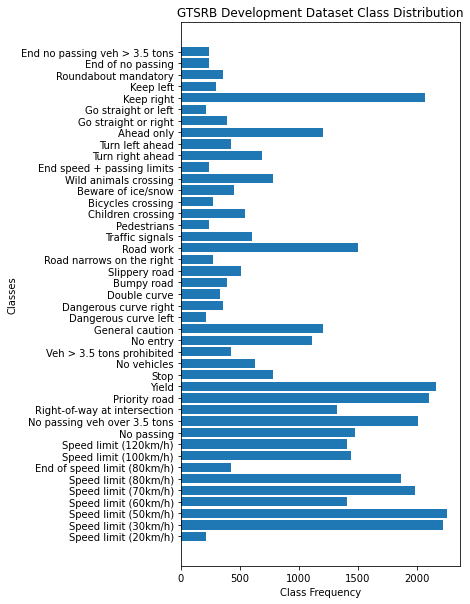

In [ ]:
# Plotting the number of images in each class
plt.figure(figsize=(5,10))  
plt.barh(label_names, counts)
plt.xlabel('Class Frequency')
plt.ylabel('Classes')
plt.title('GTSRB Development Dataset Class Distribution')
plt.show()

From the distribution of the development dataset, we determined that there is a class imbalance between the number of samples for each class. Because of this imbalance we will have to apply stratification in order to keep the frequencies the same when splitting the development dataset into training and validation sets.

Comparing the original images with the enhanced images on development set


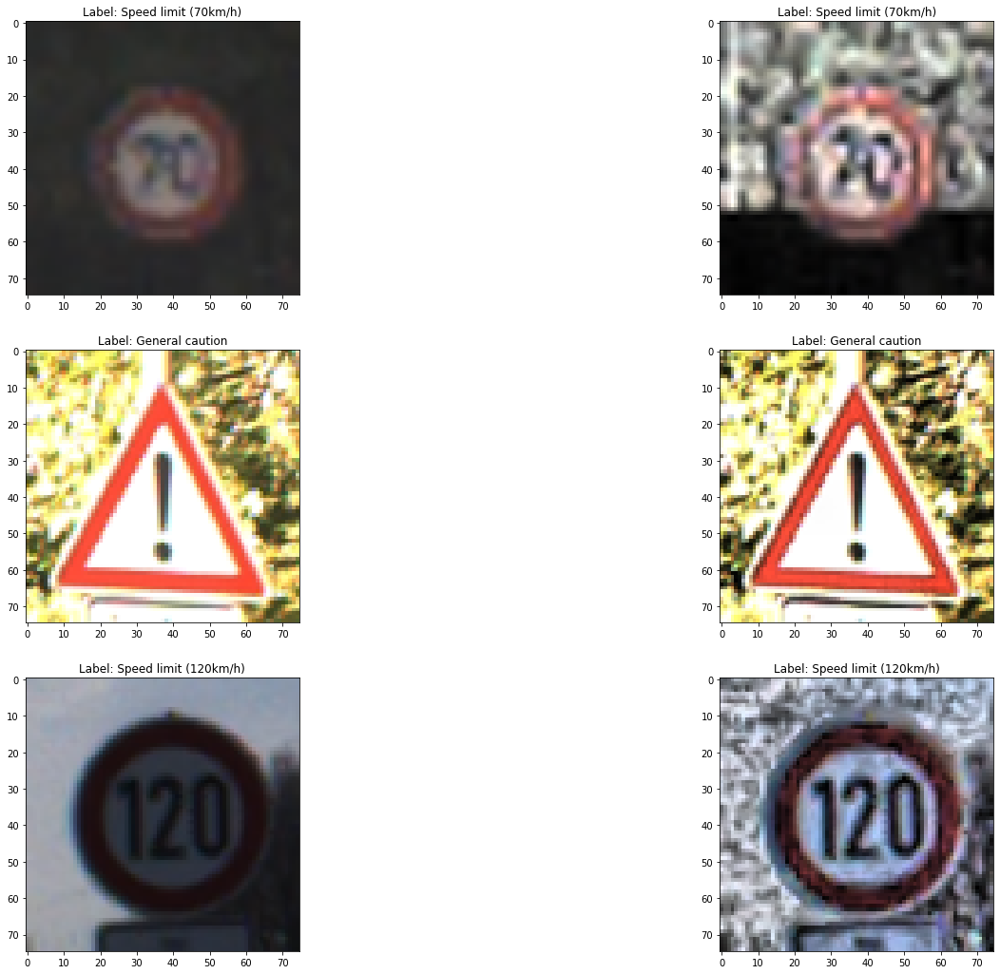

In [ ]:
# showing contrast enhancement on three samples
sample_indexes = [7779, 25656, 12528]
plt.figure(figsize = (24,18))

for (ii, jj) in enumerate(sample_indexes):
  plt.subplot(3,2,(ii)*2+1)
  plt.imshow(X_dev_ori[jj])
  plt.title("Label: %s" %classes[Y_dev_ori[jj]])
  plt.subplot(3,2,(ii)*2+2)
  plt.imshow(X_dev[jj])
  plt.title("Label: %s" %classes[Y_dev[jj]])
plt.show()

Comparing the original images with the enhanced images on test set

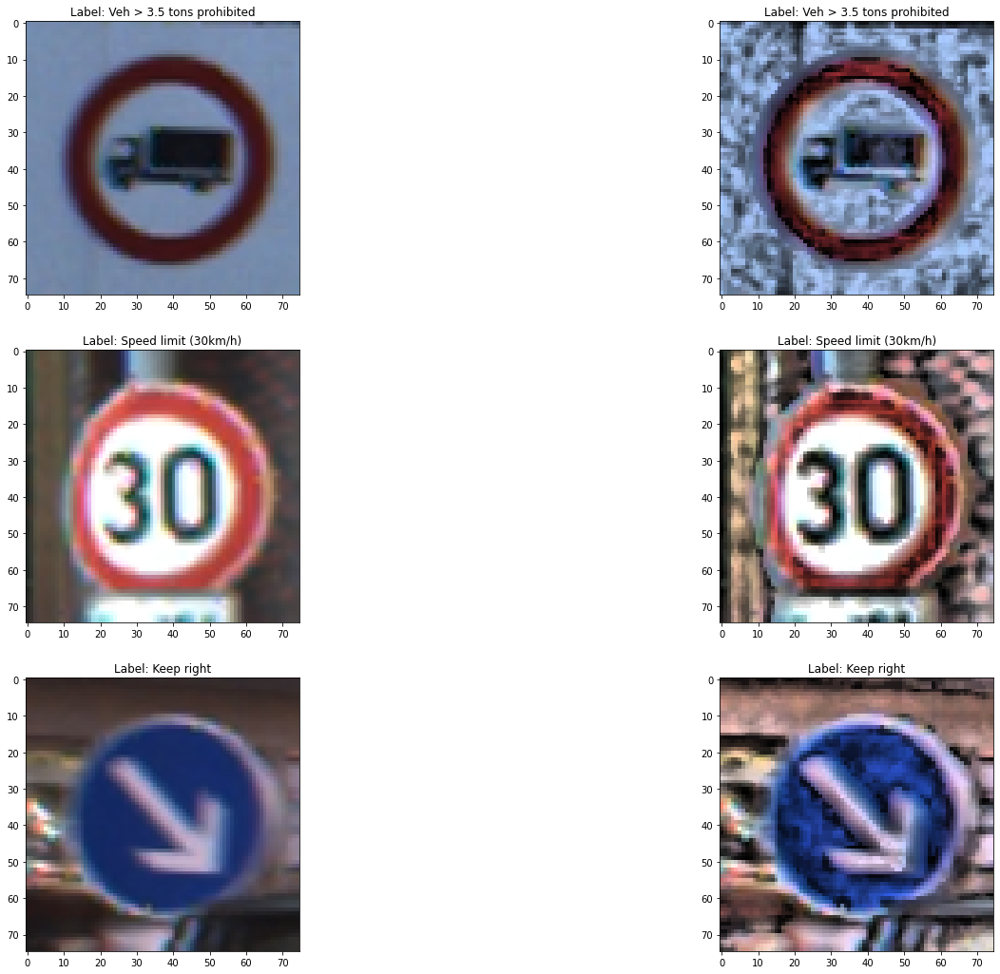

In [ ]:
# showing contrast enhancement on three samples
sample_indexes = [0, 1, 2]
plt.figure(figsize = (24,18))

for (ii, jj) in enumerate(sample_indexes):
  plt.subplot(3,2,(ii)*2+1)
  plt.imshow(X_test_ori[jj])
  plt.title("Label: %s" %classes[Y_test_ori[jj]])
  plt.subplot(3,2,(ii)*2+2)
  plt.imshow(X_test[jj])
  plt.title("Label: %s" %classes[Y_test[jj]])
plt.show()

Display random image samples from development set.

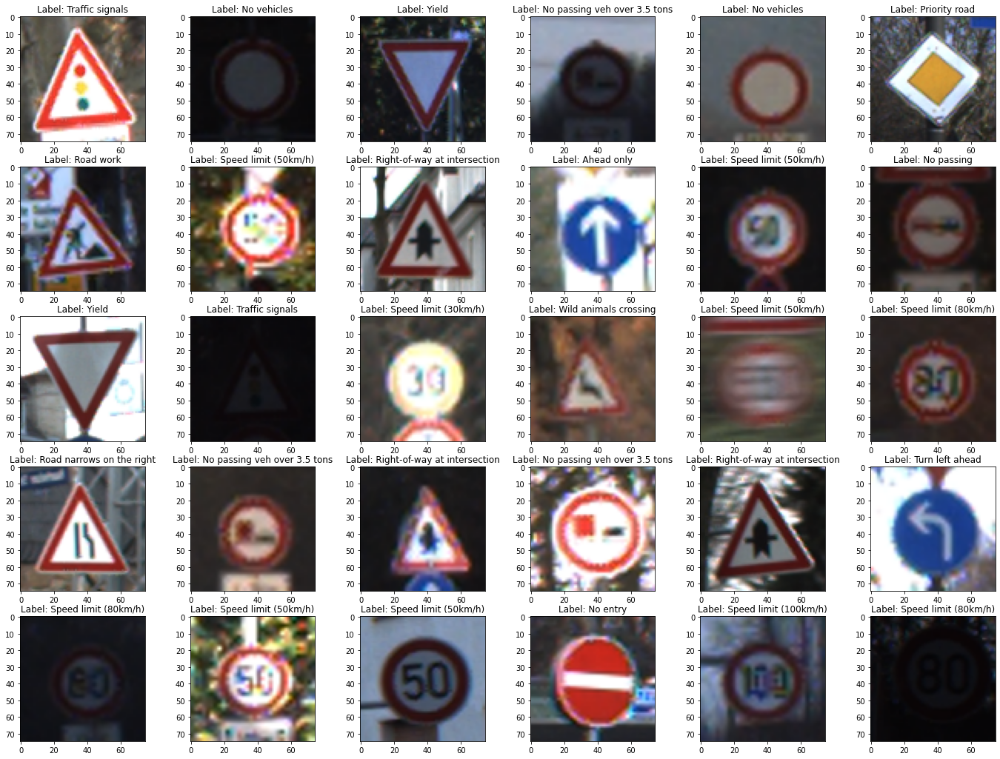

In [ ]:
# display 30 random samples from the development dataset
sample_indexes = np.random.choice(np.arange(X_dev_ori.shape[0], dtype = int), size = 30, replace = False)
plt.figure(figsize = (24,18))

for (ii, jj) in enumerate(sample_indexes):
  plt.subplot(5,6,ii+1)
  plt.imshow(X_dev_ori[jj])
  plt.title("Label: %s" % classes[Y_dev_ori[jj]])
plt.show()

## 3. Split data into train and validation sets


After analyzing the dataset that we are working with, the next step is to split the development dataset into training and validation sets. Here we are using the sklearn train_test_split function to split our development set into 75% training and 25% validation. Furthermore, we have enabled shuffling to randomize the sample prior to splitting and applying stratification to keep the frequency distribution the same between the two sets.

In [ ]:
# X_train, X_val, Y_train, Y_val = train_test_split(X_dev, Y_dev, test_size=0.25, random_state=42, shuffle=True, stratify=Y_dev)
X_train, X_val, Y_train, Y_val = train_test_split(X_dev_ori, Y_dev_ori, test_size=0.25, random_state=42, shuffle=True, stratify=Y_dev_ori)

print('Training samples:', X_train.shape)
print('Training labels:', Y_train.shape)
print('Validation samples:', X_val.shape)
print('Validation labels:', Y_val.shape)

Training samples: (29406, 75, 75, 3)
Training labels: (29406,)
Validation samples: (9803, 75, 75, 3)
Validation labels: (9803,)


## 4. One Hot Encode Labels

Once the dataset has been split into training, validation, and test sets, the step is to one hot encode the labels. Since the labels in this image classification problem are not ordinal, we must transform the categorical representation of the label into a numerical value that the machine learning algorithm can understand.

In [ ]:
# One hot encode the training, validation, and test set labels
Y_train_oh = tf.keras.utils.to_categorical(Y_train)
Y_val_oh = tf.keras.utils.to_categorical(Y_val)
Y_test_oh = tf.keras.utils.to_categorical(Y_test_ori)

# Display the first 5 labels for each sample set
print('Train Set')
print('Train Labels:')
print(Y_train[:5])
print()
print('Train One hot encoded labels:')
print(Y_train_oh[:5])
print()

print('Validation Set')
print('Validation Labels:')
print(Y_val[:5])
print()
print('Validation One hot encoded labels:')
print(Y_val_oh[:5])
print()

print('Test Set')
print('Test Labels:')
print(Y_test_ori[:5])
print()
print('Test One hot encoded labels:')
print(Y_test_oh[:5])
print()

Train Set
Train Labels:
[36 13 36 10  1]

Train One hot encoded labels:
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]

Validation Set
Validation Labels:
[ 2 38 37 12  4]

Validation One hot encoded labels:
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

## 5. Scaling and Normalization

In [ ]:
# print('X_train:', X_train.min(), X_train.max(), X_train.mean(), X_train.std())
# print('X_val:', X_val.min(), X_val.max(), X_val.mean(), X_val.std())
# print('X_test_ori:', X_test_ori.min(), X_test_ori.max(), X_test_ori.mean(), X_test_ori.std())

In [ ]:
# Data scaling testing both min-max and standardization methods
normalization_type = 0

if normalization_type == 0:
  X_train_norm = X_train/255
  X_val_norm = X_val/255
  X_test_norm = X_test_ori/255
  # X_test_norm = X_test/255

elif normalization_type == 1:
  train_mean = X_train.mean()
  train_std = X_train.std()

  X_train_norm = (X_train - train_mean)/train_std
  X_val_norm = (X_val - train_mean)/train_std
  X_test_norm = (X_test_ori - train_mean)/train_std
#   X_test_norm = (X_test - train_mean)/train_std

else:
  pass

In [ ]:
# print('X_train_norm:', X_train_norm.min(), X_train_norm.max(), X_train_norm.mean(), X_train_norm.std())
# print('X_val_norm:', X_val_norm.min(), X_val_norm.max(), X_val_norm.mean(), X_val_norm.std())
# print('X_test_norm:', X_test_norm.min(), X_test_norm.max(), X_test_norm.mean(), X_test_norm.std())

## 6. Define Model Callbacks

In [ ]:
model_name = "inception_v3_team_30_GTSRB.h5"

# Early stop callback set at 20 epochs
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience = 20)

# Monitor callback for saving the model only
monitor = tf.keras.callbacks.ModelCheckpoint(model_name, monitor='val_loss',\
                                             verbose=0,save_best_only=True,\
                                             save_weights_only=True,\
                                             mode='min')
# Learning rate schedule
def scheduler(epoch, lr):
    if epoch%10 == 0 and epoch != 0:
        lr = lr/2
    return lr

lr_schedule = tf.keras.callbacks.LearningRateScheduler(scheduler,verbose = 0)

## 7. Determine Data Augmentation Parameters

We experimented with different augmnentation parameters, and these parameters yields the best results:
<ul>
<li>rotation_range: 5 degrees</li>
<li>width-shift-range: 0.1 </li>
<li>height-shift-range: 0.1 </li>
<li>shear-range: 0.1 </li>
<li>horizontal-flip: True </li>
<li>zoom-range: 0.1 </li>
<li>fill-mode: constant </li>
<li>cval: 0</li>
</ul>

In [ ]:
# Applies Contrast limited adaptive histogram equalization to enhance image 
def CLAHE(img):
    img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
    return img_adapteq

In [ ]:
# Applying data augmentation methods to improve training
batch_size = 32

gen_params = {"featurewise_center":False,"samplewise_center":False,"featurewise_std_normalization":False,\
              "samplewise_std_normalization":False,"zca_whitening":False,"rotation_range":5,"width_shift_range":0.1,"height_shift_range":0.1,\
              "shear_range":0.1, "zoom_range":0.1,"fill_mode":'constant',\
               "cval": 0}

# gen_params = {"featurewise_center":False,"samplewise_center":False,"featurewise_std_normalization":False,\
#               "samplewise_std_normalization":False,"zca_whitening":False,"rotation_range":5,"width_shift_range":0.1,"height_shift_range":0.1,\
#               "shear_range":0.1, "zoom_range":0.1,"fill_mode":'constant',\
#                "cval": 0}

train_gen = tf.keras.preprocessing.image.ImageDataGenerator(**gen_params)
val_gen = tf.keras.preprocessing.image.ImageDataGenerator(**gen_params)

train_gen.fit(X_train_norm, seed=42)
val_gen.fit(X_val_norm, seed=42)

train_flow = train_gen.flow(X_train_norm, Y_train_oh, batch_size=batch_size,seed=42)
val_flow = val_gen.flow(X_val_norm, Y_val_oh, batch_size=batch_size,seed=42)

0.2602411 0.26109698
0.0 1.0


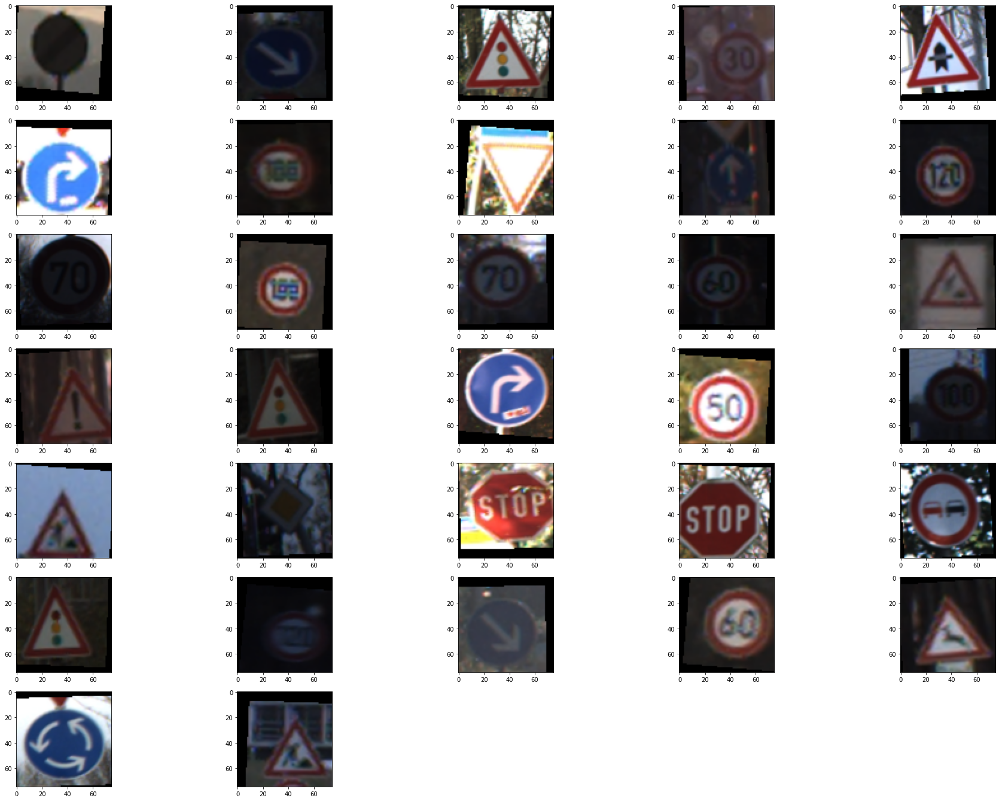

In [ ]:
plt.figure(figsize = (32,24))
Xbatch,Ybatch = train_flow.__getitem__(0)
print(Xbatch.mean(),Xbatch.std())
print(Xbatch.min(),Xbatch.max())
for ii in range(batch_size):
    plt.subplot(7,5,ii+1)
    plt.imshow((Xbatch[ii]- Xbatch[ii].min())/(Xbatch.max() - Xbatch[ii].min()), cmap = "gray")
plt.show()

## 8. TRANSFER LEARNING - INCEPTION V3

In [ ]:

from tensorflow.keras.applications.inception_v3 import InceptionV3
def create_inception_v3_model(trainable=False):
  ishape = (img_height, img_width, 3)
  # create the base pre-trained model
  base_model = tf.keras.applications.InceptionV3(
      input_shape = ishape,
      include_top = False, 
      weights = 'imagenet')

  x1 = base_model.output
  x2 = tf.keras.layers.GlobalAveragePooling2D()(x1)
  x3 = tf.keras.layers.BatchNormalization()(x2)
  x4 = tf.keras.layers.Dense(1024, activation='relu')(x3)
  x5 = tf.keras.layers.BatchNormalization()(x4)
  out = tf.keras.layers.Dense(num_classes, activation='softmax')(x5)

  model = tf.keras.Model(inputs=base_model.input, outputs=out)

  base_model.trainable = trainable
  
  return model

In [ ]:
model = create_inception_v3_model(trainable=False)
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 75, 75, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 37, 37, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 37, 37, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 37, 37, 32)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [ ]:
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

result_inceptionV3_tl = model.fit(train_flow, epochs=100, verbose=1, callbacks=[early_stop, monitor, lr_schedule], validation_data=val_flow)

Epoch 1/100
919/919 [==============================] - 89s 60ms/step - loss: 2.3750 - accuracy: 0.3630 - val_loss: 1.3499 - val_accuracy: 0.5843
Epoch 2/100
919/919 [==============================] - 53s 58ms/step - loss: 1.2781 - accuracy: 0.6022 - val_loss: 1.1205 - val_accuracy: 0.6512
Epoch 3/100
919/919 [==============================] - 52s 57ms/step - loss: 1.1243 - accuracy: 0.6453 - val_loss: 1.0284 - val_accuracy: 0.6757
Epoch 4/100
919/919 [==============================] - 52s 57ms/step - loss: 1.0270 - accuracy: 0.6725 - val_loss: 0.9666 - val_accuracy: 0.6905
Epoch 5/100
919/919 [==============================] - 53s 58ms/step - loss: 0.9663 - accuracy: 0.6900 - val_loss: 0.9173 - val_accuracy: 0.7108
Epoch 6/100
919/919 [==============================] - 53s 57ms/step - loss: 0.9116 - accuracy: 0.7057 - val_loss: 0.8868 - val_accuracy: 0.7171
Epoch 7/100
919/919 [==============================] - 52s 57ms/step - loss: 0.8793 - accuracy: 0.7130 - val_loss: 0.8711 - val_ac

### Fine Tune Inception V3 Model

In [ ]:
model = create_inception_v3_model(trainable=True)

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.load_weights(model_name)

In [ ]:
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 75, 75, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 37, 37, 32)   864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_96 (BatchNo (None, 37, 37, 32)   96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, 37, 37, 32)   0           batch_normalization_96[0][0]     
____________________________________________________________________________________________

In [ ]:
result_inceptionV3_tuned = model.fit(train_flow, epochs=100, verbose=1, callbacks=[early_stop, monitor, lr_schedule], validation_data=val_flow)

Epoch 1/100
919/919 [==============================] - 77s 73ms/step - loss: 1.8636 - accuracy: 0.5215 - val_loss: 0.3535 - val_accuracy: 0.9284
Epoch 2/100
919/919 [==============================] - 66s 71ms/step - loss: 0.1607 - accuracy: 0.9521 - val_loss: 0.0473 - val_accuracy: 0.9851
Epoch 3/100
919/919 [==============================] - 66s 71ms/step - loss: 0.0728 - accuracy: 0.9789 - val_loss: 0.0323 - val_accuracy: 0.9912
Epoch 4/100
919/919 [==============================] - 66s 71ms/step - loss: 0.0470 - accuracy: 0.9864 - val_loss: 0.0152 - val_accuracy: 0.9964
Epoch 5/100
919/919 [==============================] - 65s 71ms/step - loss: 0.0319 - accuracy: 0.9913 - val_loss: 0.0080 - val_accuracy: 0.9978
Epoch 6/100
919/919 [==============================] - 65s 71ms/step - loss: 0.0269 - accuracy: 0.9923 - val_loss: 0.0187 - val_accuracy: 0.9953
Epoch 7/100
919/919 [==============================] - 66s 72ms/step - loss: 0.0239 - accuracy: 0.9940 - val_loss: 2.2569 - val_ac

In [ ]:
metrics = model.evaluate(X_test_norm,Y_test_oh)

395/395 [==============================] - 10s 21ms/step - loss: 0.0441 - accuracy: 0.9947


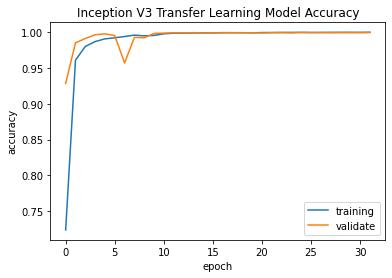

In [ ]:
# Plot training and validation accuracy
plt.plot(result_inceptionV3_tuned.history['accuracy'])
plt.plot(result_inceptionV3_tuned.history['val_accuracy'])
plt.title('Inception V3 Transfer Learning Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(["training","validate"])

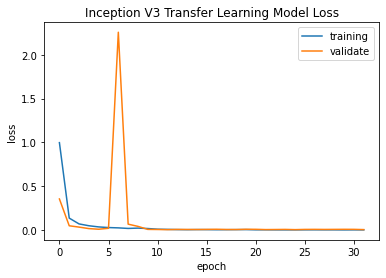

In [ ]:
# Plot training and validation loss
plt.plot(result_inceptionV3_tuned.history['loss'])
plt.plot(result_inceptionV3_tuned.history['val_loss'])
plt.title('Inception V3 Transfer Learning Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(["training","validate"])

12630/1 [===============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

102


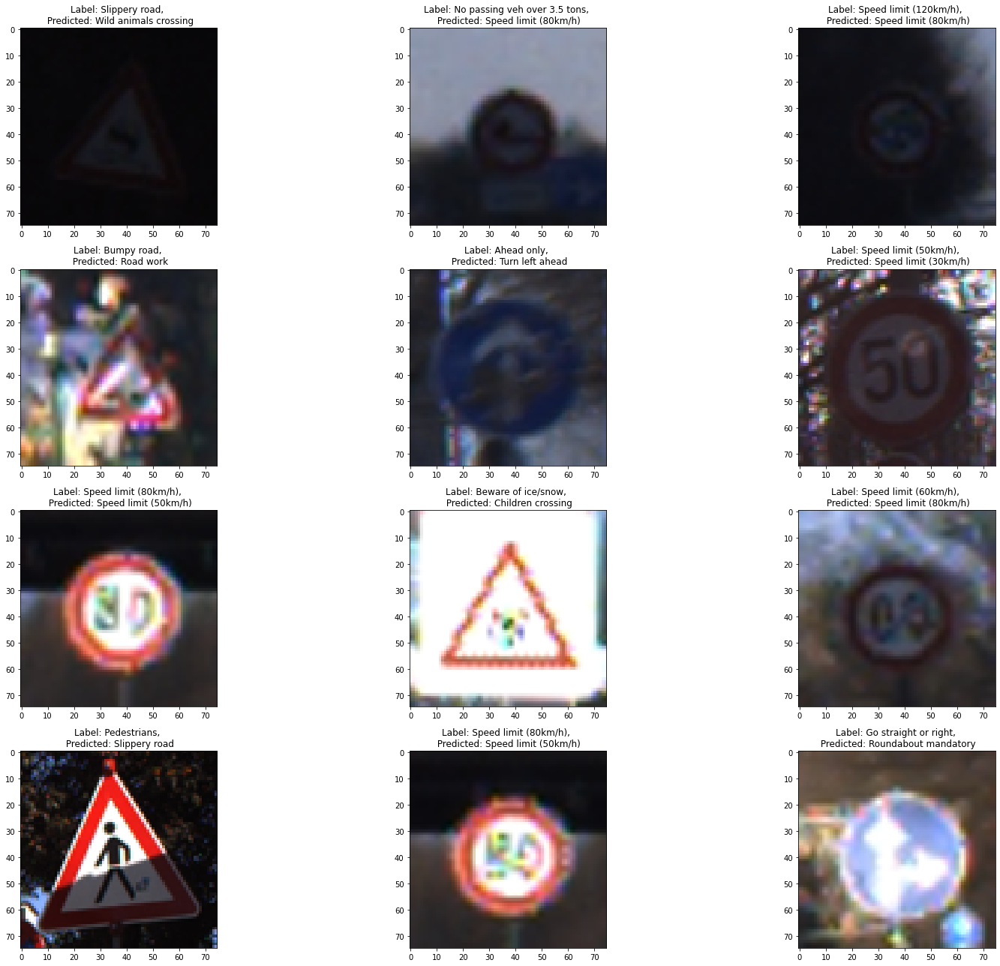

In [ ]:
model.load_weights(model_name)
metrics = model.evaluate(X_test_norm,Y_test_oh)

Ypred = model.predict(X_test_norm).argmax(axis=1)
wrong_indexes = np.where(Ypred != Y_test_ori)[0]
print(wrong_indexes.size)

# Disaplying some samples from the development set
sample_indexes = np.random.choice(np.arange(wrong_indexes.shape[0], dtype = int),size = 12, replace = False)
plt.figure(figsize = (24,18))
for (ii,jj) in enumerate(sample_indexes):
    plt.subplot(4,3,ii+1)
    plt.imshow(X_test_norm[wrong_indexes[jj]], cmap = "gray")
    plt.title("Label: %s, \n Predicted: %s" %(classes[Y_test_ori[wrong_indexes[jj]]],classes[Ypred[wrong_indexes[jj]]]))
plt.tight_layout()
plt.show()

## Evaluate Model and Assess Misclassifications

In [ ]:
Y_test_pred = model.predict(X_test_norm)

In [ ]:
matrix = tf.math.confusion_matrix(Y_test_oh.argmax(axis=1), Y_test_pred.argmax(axis=1))

In [ ]:
con_mat = matrix.numpy()

classes_names = []
for key,value in classes.items():
  classes_names.append(value)
  
con_mat_df = pd.DataFrame(con_mat, index=classes_names, columns=classes_names)

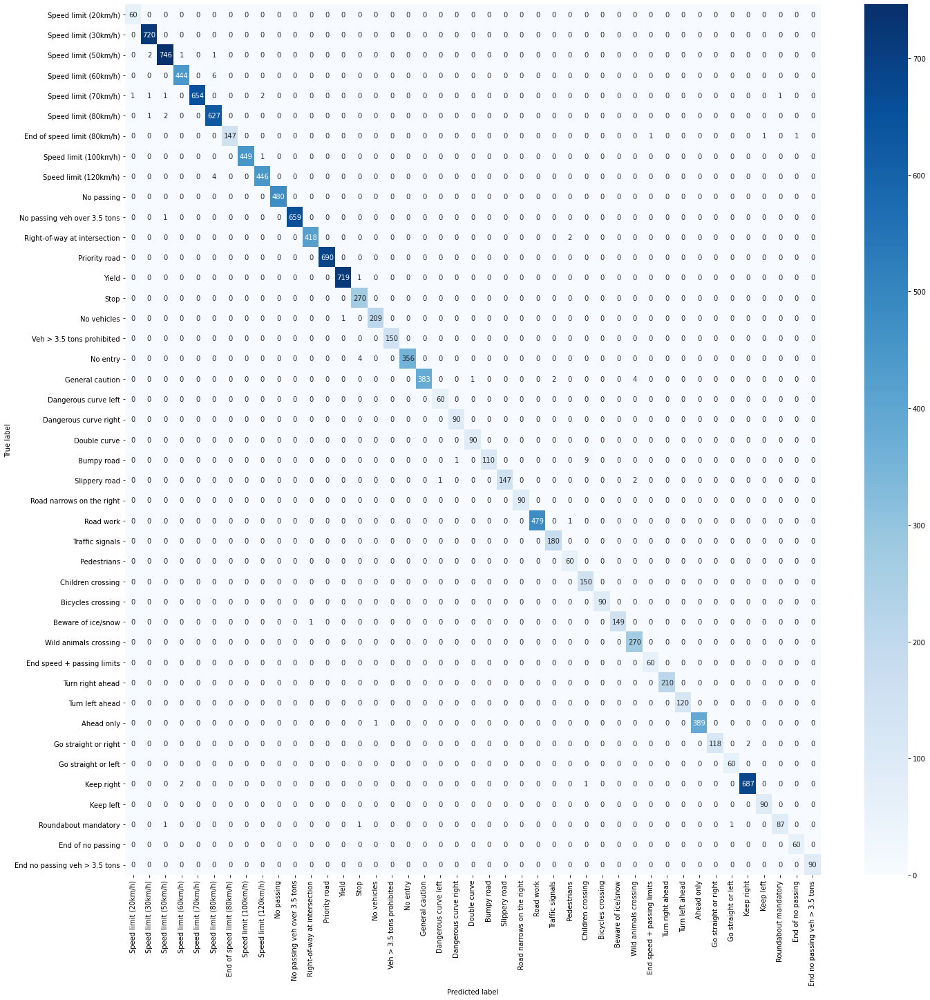

In [ ]:
import seaborn as sns

figure = plt.figure(figsize=(20, 20))
sns.heatmap(con_mat_df, annot=True,cmap=plt.cm.Blues, fmt='g')
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
from sklearn import metrics

classes_names = []
for key,value in classes.items():
  classes_names.append(value)

print(metrics.classification_report(Y_test_ori, Ypred, digits=3, target_names=classes_names))

                               precision    recall  f1-score   support

         Speed limit (20km/h)      1.000     1.000     1.000        60
         Speed limit (30km/h)      0.986     1.000     0.993       720
         Speed limit (50km/h)      0.992     0.989     0.991       750
         Speed limit (60km/h)      0.993     0.987     0.990       450
         Speed limit (70km/h)      1.000     0.992     0.996       660
         Speed limit (80km/h)      0.983     0.989     0.986       630
  End of speed limit (80km/h)      1.000     0.960     0.980       150
        Speed limit (100km/h)      0.998     0.998     0.998       450
        Speed limit (120km/h)      0.996     0.993     0.994       450
                   No passing      1.000     1.000     1.000       480
 No passing veh over 3.5 tons      1.000     0.997     0.998       660
 Right-of-way at intersection      1.000     0.995     0.998       420
                Priority road      1.000     0.999     0.999       690
     

## Test Model Weight Files - THIS SECTION IS USED FOR TESTING PURPOSES ONLY

### 1) Transfer Learning Weights

In [ ]:
# model = create_inception_v3_model(trainable=False)

# model.compile(optimizer=tf.keras.optimizers.RMSprop(lr = 1e-4),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# model.load_weights('inception_v3_team_30_GTSRB_KerasTransferLearning.h5')

# metrics = model.evaluate(X_test_norm,Y_test_oh)

### 2) Fine Tuning Weights

In [ ]:
# model = create_inception_v3_model(trainable=True)

# model.compile(optimizer=tf.keras.optimizers.RMSprop(lr = 1e-4),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# model.load_weights('inception_v3_team_30_GTSRB_KerasFineTune.h5')

# metrics = model.evaluate(X_test_norm,Y_test_oh)